In [2]:
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
energy_ranges = [(20,50),(50,100),(100,200)]
file1 = "AS1A12_044T16_9000005478_39460cztM0_level2_quad_clean.evt"
file2 = "AS1C09_004T04_9000006346_47749cztM0_level2_quad_clean.evt"
file3= "AS1C09_004T04_9000006346_47750cztM0_level2_quad_clean.evt"
file4= "AS1C09_004T04_9000006346_47756cztM0_level2_quad_clean.evt"
file5= "AS1T05_074T01_9000005472_39412cztM0_level2_quad_clean.evt"
saa_range1= (4.114e8+27900,4.114e8+30000)
saa_range2= (4.597e8+53400,4.597e8+54800)
saa_range3= (4.597e8+59600,4.597e8+60935)
saa_range5= (4.111e8+52550,4.111e8+54300)

In [3]:
def counts_per_sec(times,bin_width,counts=None):
    time_min = times.min()
    time_max = times.max()
    bins = np.arange(time_min, time_max + bin_width, bin_width)
    counts, _ = np.histogram(times, bins=bins , weights = counts)
    bin_centers = bins[:-1] + bin_width / 2
    return bin_centers, counts / bin_width





def lc_czt(file, saa_ranges=None, energy_ranges=None, bin_width=1, bad_ranges=None):
    with fits.open(file) as hdul:
        quads = ['Q0', 'Q1', 'Q2', 'Q3']
        colors = ['b', 'r', 'g', 'm', 'c', 'y']
        results_czt = {}
        
        
        if energy_ranges is None:
            energy_ranges = [(None, None)]
        elif isinstance(energy_ranges, tuple):
            energy_ranges = [energy_ranges]

        for i, q in enumerate(quads):
            plt.figure(figsize=(12, 8))
            plt.title(f'CZTI Light Curve - {q} with {bin_width}s binning')
            plt.xlabel('Time (s)')
            plt.ylabel('Count Rate (counts/s)')
            plt.grid(True)
            
            try:
                q_data = hdul[q]
            except KeyError:
                print(f"Warning: Quadrant {q} not found in file")
                continue
                
            times_q = q_data.data["TIME"].astype(float)
            energy_q = q_data.data["ENERGY"].astype(float)
            
            # Create base mask for good times
            mask = np.ones(len(times_q), dtype=bool)
            
            # Apply SAA exclusion
            if saa_ranges:
                for start, end in saa_ranges:
                    mask &= (times_q < start) | (times_q > end)
            
            # Apply quadrant-specific bad ranges
            if bad_ranges and q in bad_ranges:
                for start, end in bad_ranges[q]:
                    mask &= (times_q < start) | (times_q > end)
            
            for j, energy_range in enumerate(energy_ranges):
                emask = mask.copy()  # Start with global mask
                
                # Apply energy filtering
                if energy_range != (None, None):
                    emin, emax = energy_range
                    emask &= (energy_q >= emin) & (energy_q <= emax)
                    label = f'{emin}-{emax} keV'
                    key = f'{q}_{emin}-{emax}keV'
                else:
                    label = 'All energies'
                    key = f'{q}_all'
                
                times_filtered = times_q[emask]
                
                if len(times_filtered) == 0:
                    print(f"Warning: No data for {q} in {energy_range}")
                    continue
                

                x1, cps1 = counts_per_sec(times_filtered, bin_width=bin_width)
        
                plt.plot(x1, cps1, color=colors[j % len(colors)], 
                         label=label, alpha=0.8, linewidth=1.5)
                results_czt[key] = {
                    'time': x1,
                    'cps': cps1,
                    'bin_width': bin_width,
                    'energy':energy_q,
                    'photon_time':times_q
                }
            
            plt.legend(title='Energy Ranges')
            plt.tight_layout()
            plt.show()
                    
    return results_czt
    
    

def lc_veto(file, energy_ranges=None, bin_width=1):
    hdul = fits.open(file)
    veto = hdul["VETOSPECTRUM"]
    vetospec = veto.data['VetoSpec']
    vetotimes = veto.data['Time']
    quad = veto.data['QuadID']
    

    Gains = [5.591, 5.594, 5.943, 5.222]
    Offsets = [-56.741, -41.239, -41.682, -26.528]
    
    if energy_ranges is None:
        print("You need a range for the plot")
    elif isinstance(energy_ranges, tuple):
        energy_ranges = [energy_ranges]
    
    colors = ['b', 'r', 'g', 'm', 'c', 'y']
    results_veto = {}
    
    for q in range(4):
        plt.figure(figsize=(12, 8))
        plt.title(f'Veto Light Curve - Quadrant {q} (Bin Width: {bin_width}s)')
        plt.xlabel('Time (s)')
        plt.ylabel('Count Rate (counts/s)')
        plt.grid(True, alpha=0.3)
        
        gain = Gains[q]
        offset = Offsets[q]
        energies = np.arange(256) * gain + offset
        
        idx = (quad == q)
        times_q = vetotimes[idx]
        spec_q = vetospec[idx]
        
        

        for j, (emin, emax) in enumerate(energy_ranges):
            energy_mask = (energies >= emin) & (energies <= emax)
            counts_q = np.sum(spec_q[:, energy_mask], axis=1)
            
            xv1, cpsv1 = counts_per_sec(times_q, bin_width, counts_q)
            
    
            key = f'Q{q}_{emin}-{emax}keV'
            results_veto[key] = {
                'time': xv1,
                'cps': cpsv1,
                'bin_width': bin_width,
                'energy':energies,
                'photon_time':times_q
            }
            plt.plot(xv1, cpsv1, 
                     color=colors[j % len(colors)],
                     label=f'{emin}-{emax} keV',
                     alpha=0.8, 
                     linewidth=1.5)
        
        plt.legend(title='Energy Ranges')
        plt.tight_layout()
        plt.show()
    
    hdul.close()
    return results_veto

In [4]:
import numpy as np

def custom_median_filter(data, window_size):
    pad_size = window_size // 2
    padded = np.pad(data, pad_size, mode='edge')
    filtered = np.zeros_like(data)

    for i in range(len(data)):
        window = padded[i:i+window_size]
        filtered[i] = np.nanmedian(window) 
    return filtered


def median_filter(results, window_size=101, saa_ranges=None, bad_ranges=None):
    filtered_results = {}

    for key, data in results.items():
        time = data['time']
        cps = data['cps'].copy()
        bin_width = data['bin_width']
        energy_q = data['energy']
        times_q = data['photon_time']

        bad_mask = np.zeros_like(time, dtype=bool)

        if saa_ranges is not None:
            for start, end in saa_ranges:
                bad_mask |= (time >= start) & (time <= end)

        if bad_ranges is not None and key in bad_ranges:
            for start, end in bad_ranges[key]:
                bad_mask |= (time >= start) & (time <= end)

        cps_masked = cps.copy()
        cps_masked[bad_mask] = np.nan
        filtered_cps = custom_median_filter(cps_masked, window_size)
        detrended = cps - filtered_cps

        filtered_results[key] = {
            'time': time,
            'cps': cps,
            'detrended': detrended,
            'bin_width': bin_width,
            'energy': energy_q,
            'photon_time': times_q
        }

    return filtered_results






In [5]:
import numpy as np
import matplotlib.pyplot as plt

def detect_peaks(filtered_results, sigma=5, min_distance=1):
    peak_results = {}

    for key, data in filtered_results.items():
        time = data['time']
        detrended = data['detrended']
        bin_width = data['bin_width']
        
        noise_std = np.nanstd(detrended)
        threshold = sigma * noise_std
        
        peaks = []
        last_peak_time = -np.inf

        for i in range(1, len(detrended) - 1):
            if np.isnan(detrended[i]) or np.isnan(detrended[i-1]) or np.isnan(detrended[i+1]):
                continue

            if (detrended[i] > threshold and
                detrended[i] > detrended[i-1] and
                detrended[i] > detrended[i+1]):

                if time[i] - last_peak_time >= min_distance:
                    peak_time = time[i]
                    peak_value = detrended[i]
                    significance = peak_value / noise_std

                    peaks.append({
                        'time': peak_time,
                        'value': peak_value,
                        'significance': significance
                    })

                    last_peak_time = peak_time

        peak_results[key] = {
            'peaks': peaks,
            'threshold': threshold,
            'sigma': sigma,
            'noise_std': noise_std,
            'bin_width': bin_width
        }

        plt.figure(figsize=(12, 6))
        plt.plot(time, detrended, 'b-', alpha=0.7, label='Detrended Signal')
        plt.axhline(y=0, color='k', linestyle='-', alpha=0.5)
        plt.axhline(y=threshold, color='r', linestyle='--', 
                    label=f'{sigma}σ Threshold ({threshold:.2f} cps)')

        for peak in peaks:
            plt.axvline(x=peak['time'], color='g', linestyle='--', alpha=0.5)
            plt.plot(peak['time'], peak['value'], 'ro', markersize=8)
            plt.text(peak['time'], peak['value'] * 1.1, 
                     f"{peak['significance']:.1f}σ", 
                     ha='center', va='bottom')

        plt.xlabel('Time (s)')
        plt.ylabel('Detrended Count Rate (counts/s)')
        plt.title(f'Peak Detection - {key} ({bin_width}s bins)')
        plt.legend()
        plt.grid(True)
        plt.show()

    return peak_results


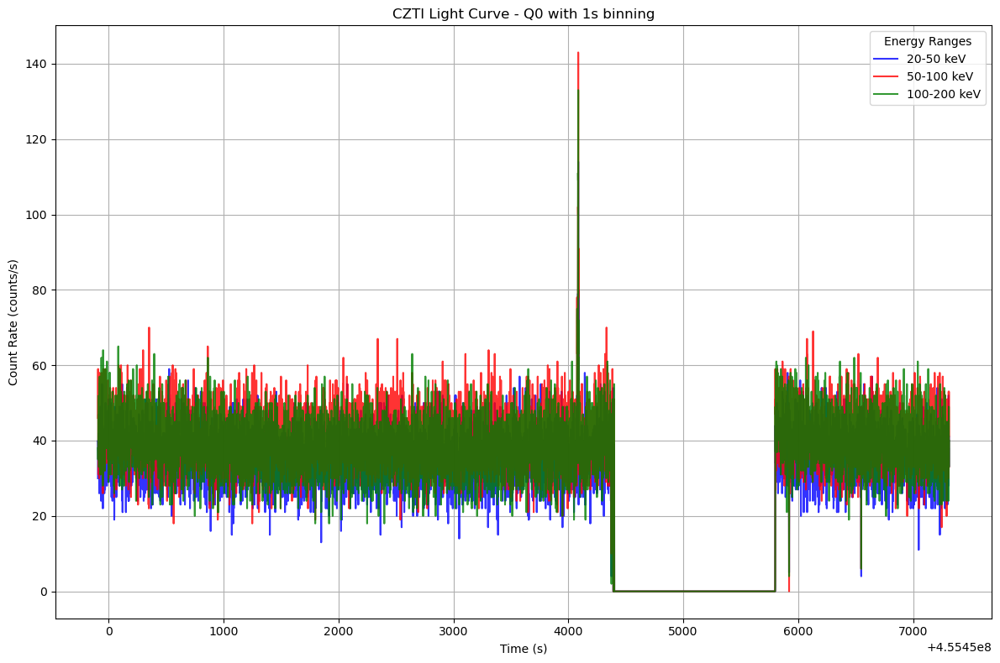

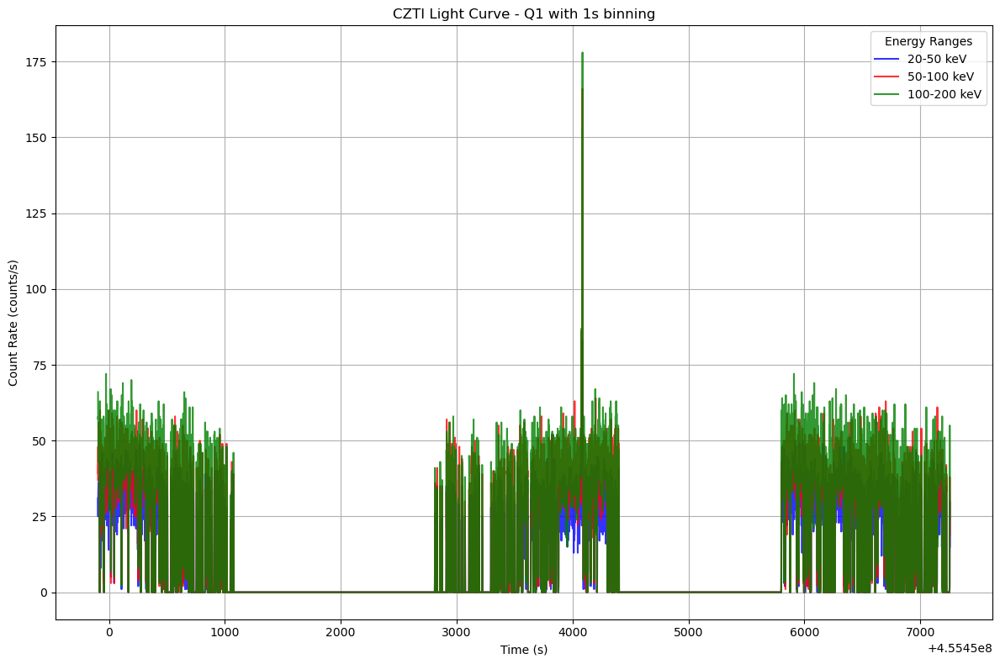

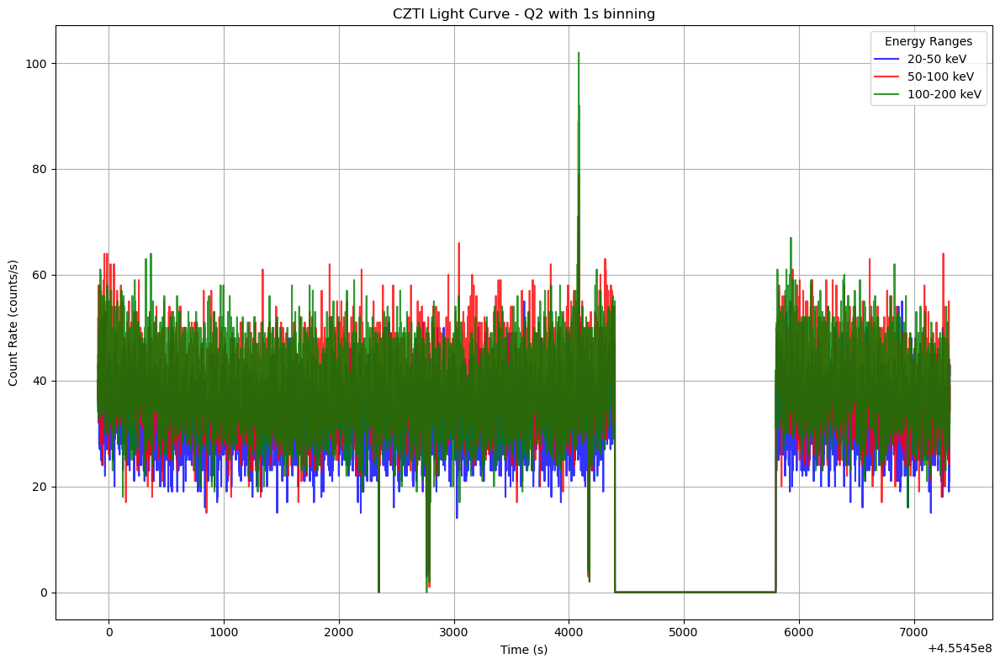

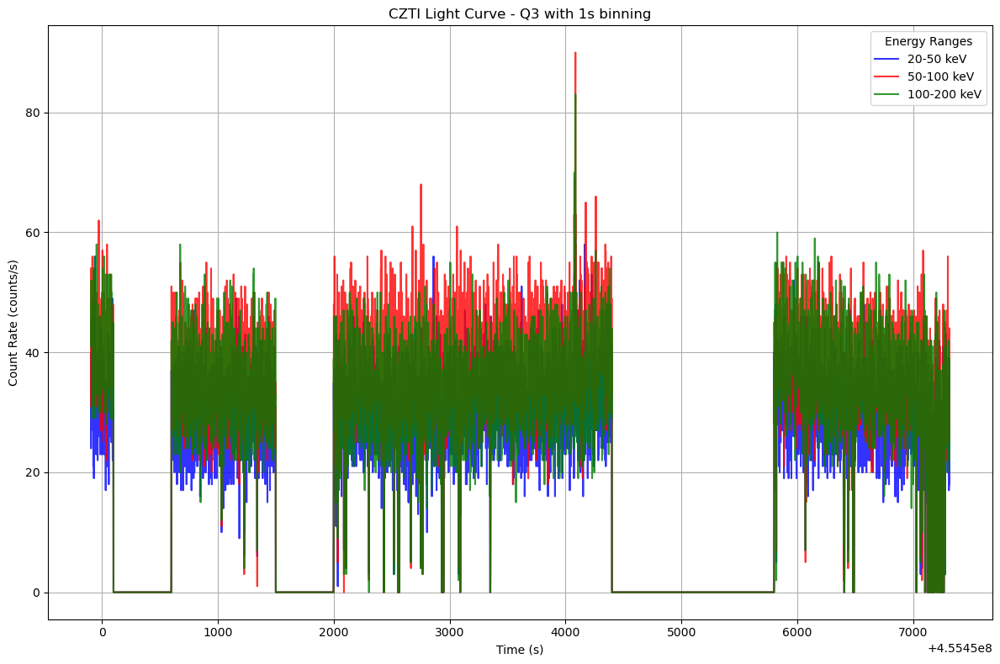

C:\Users\raumr\AppData\Local\Temp\ipykernel_8848\1229974846.py:10: RuntimeWarning: All-NaN slice encountered
  filtered[i] = np.nanmedian(window)


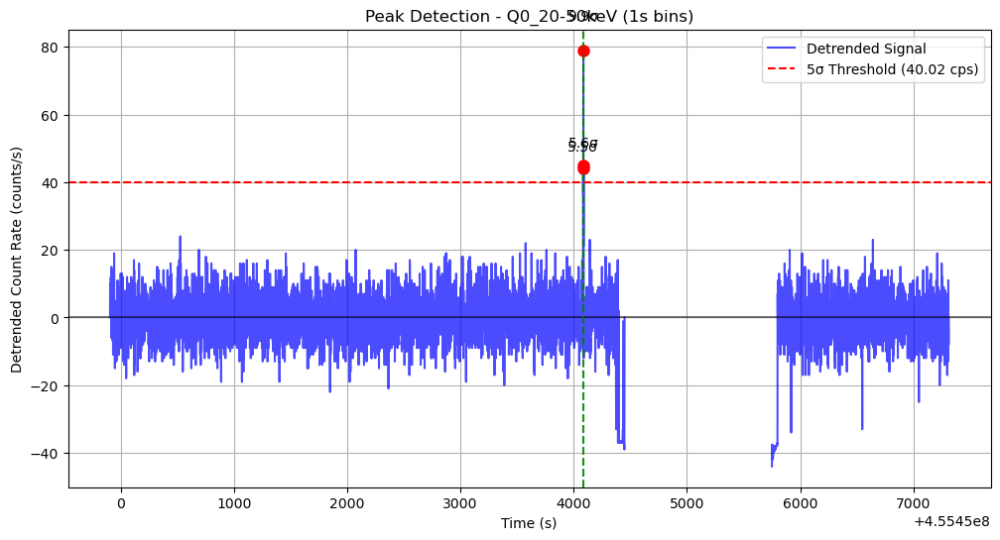

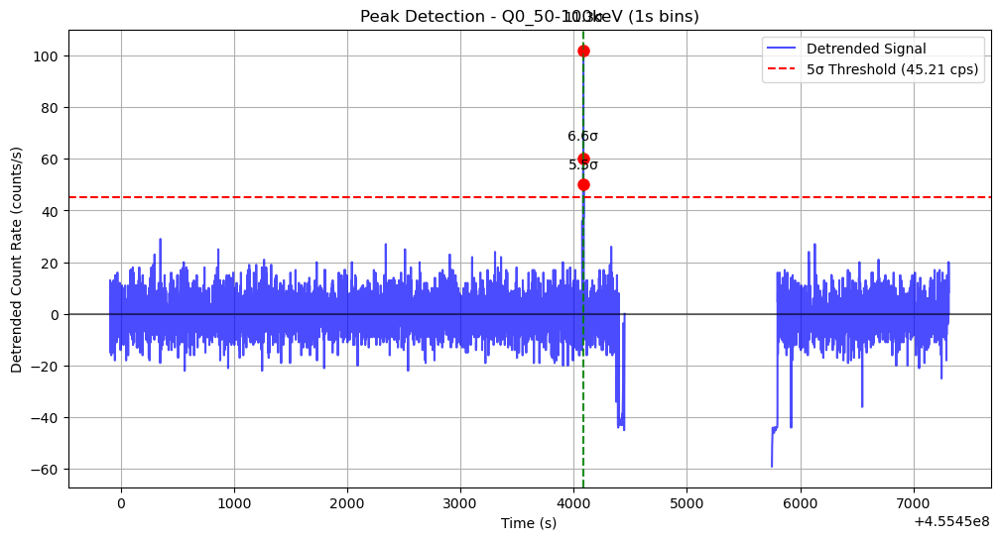

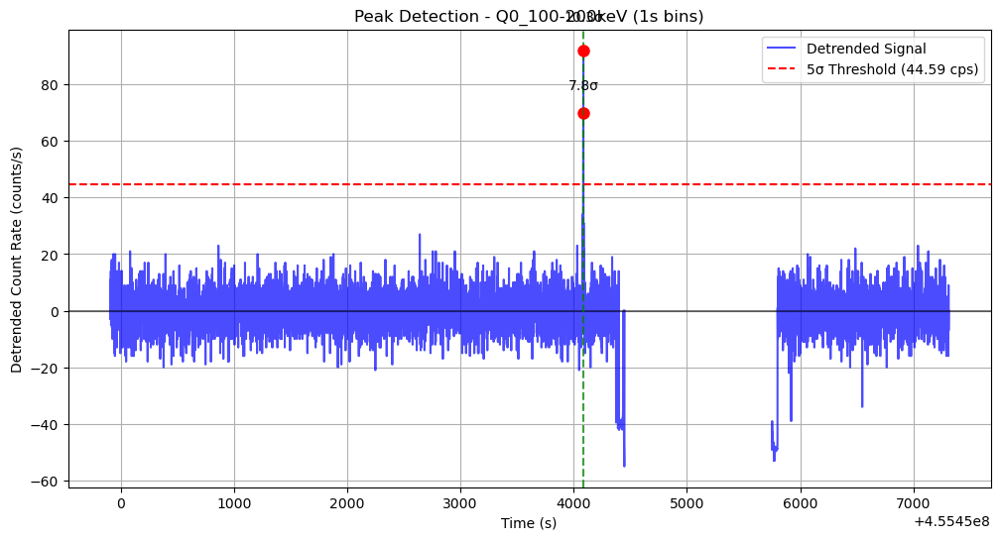

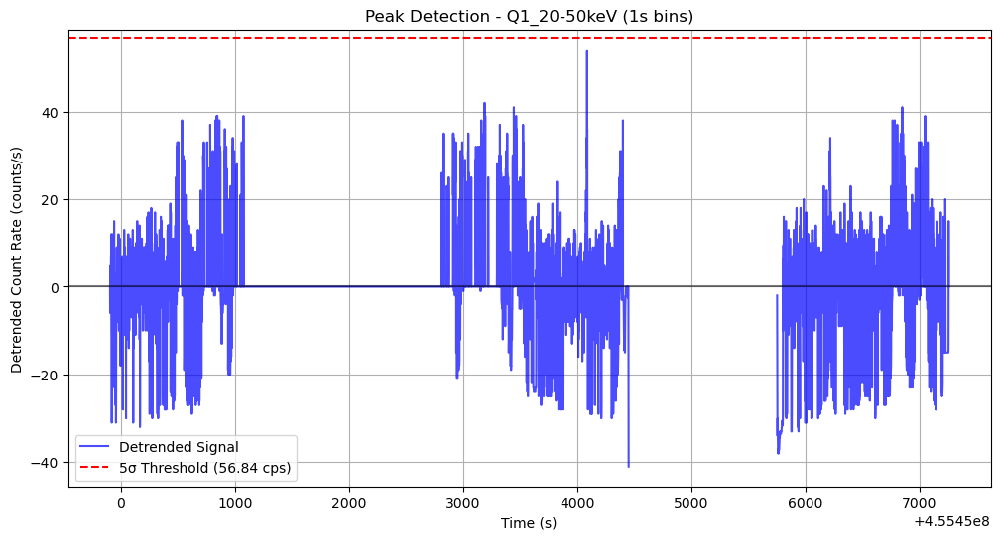

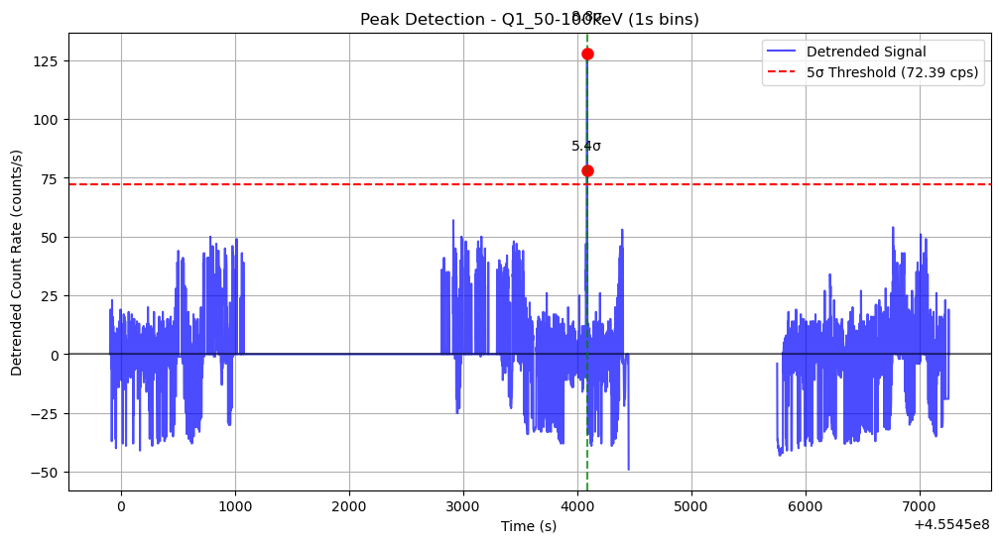

...

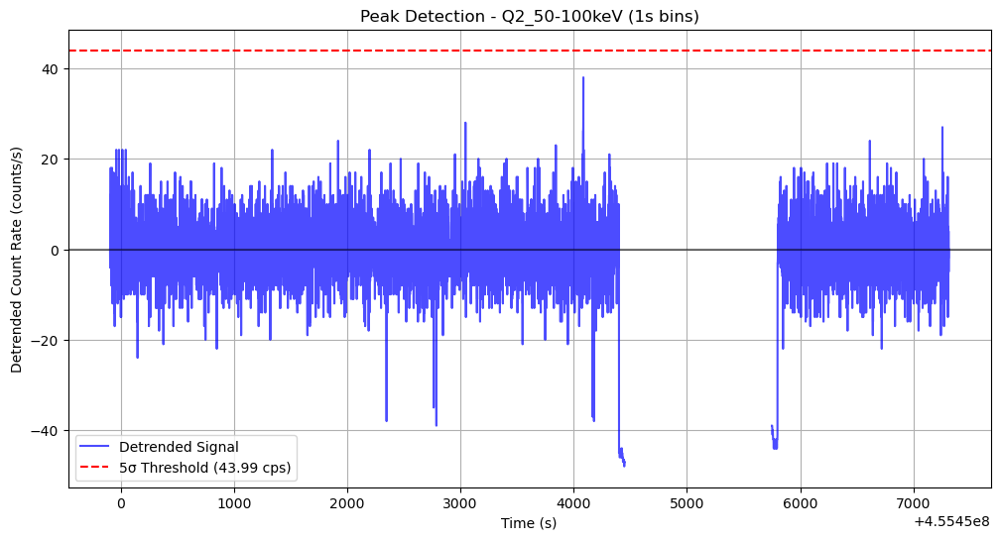

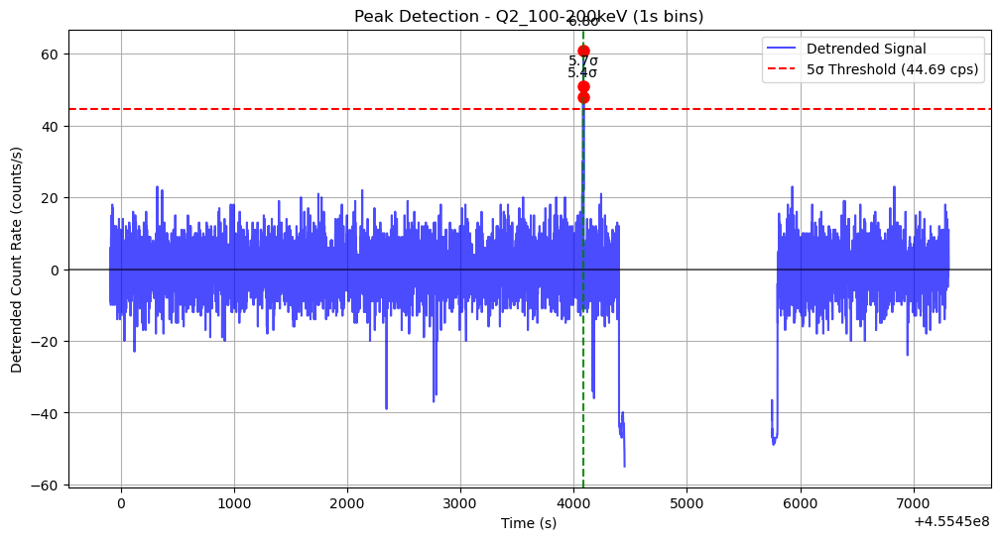

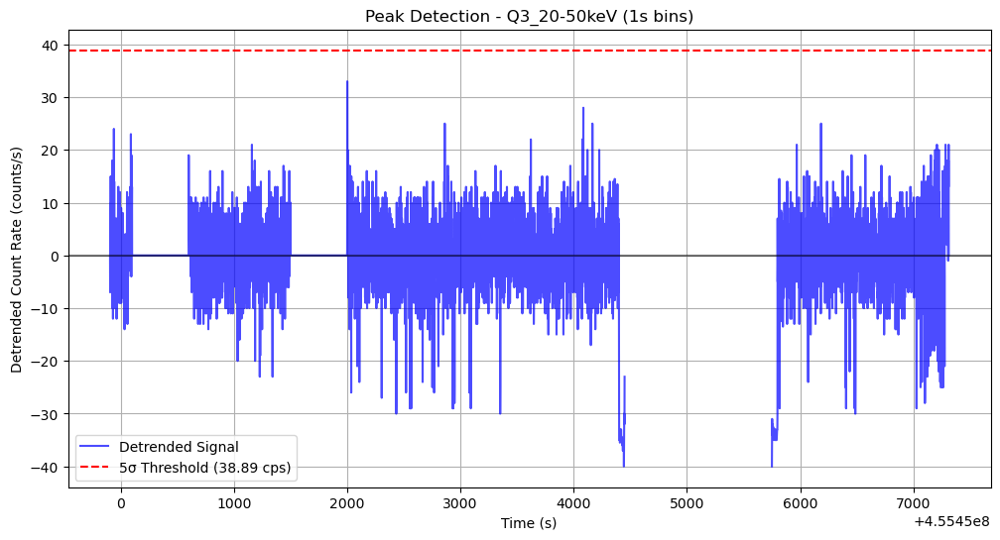

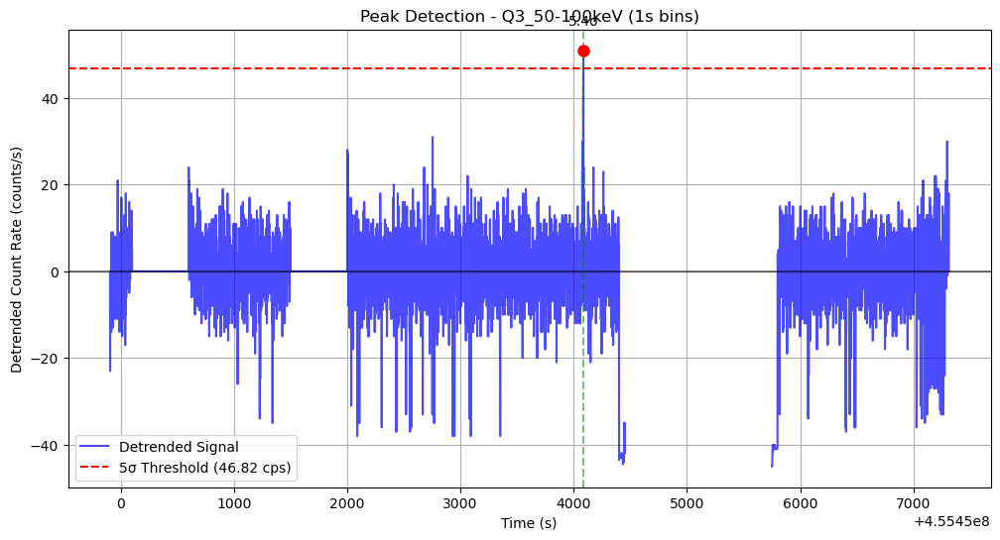

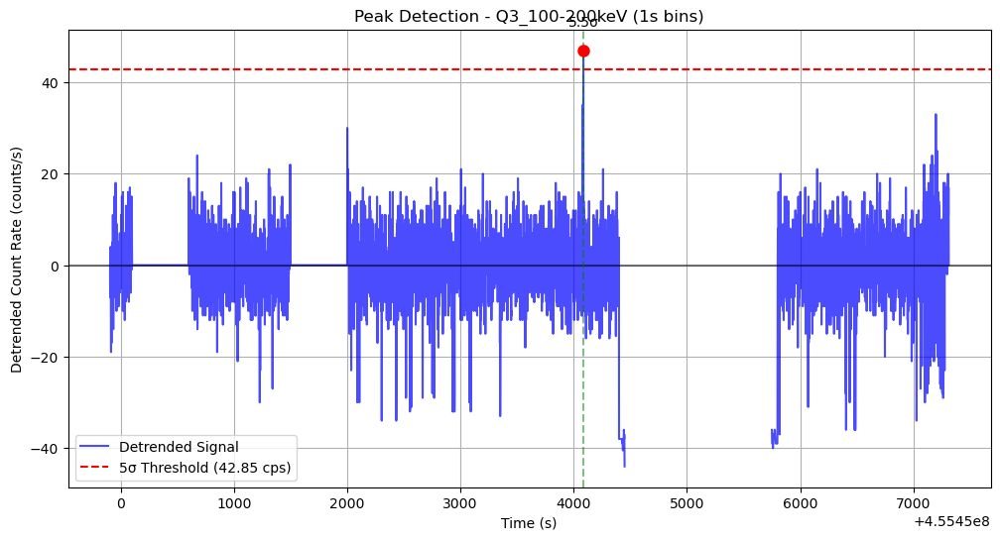

In [6]:
file0 = "AS1C09_006T01_9000006294_47011cztM0_level2_quad_clean.evt"
bad_ranges = {'Q1':[(4.5545e8+1100,4.5545e8+2800)],
              'Q3':[(4.5545e8+1500,4.5545e8+2000),(4.5545e8+100,4.5545e8+600)]}
r6 = lc_czt(file0,saa_ranges=[(4.5545e8+4400,4.5545e8+5800)] ,energy_ranges=energy_ranges,bin_width=1, bad_ranges=bad_ranges)            
f6 = median_filter(r6,window_size=101,saa_ranges=[(4.5545e8+4400,4.5545e8+5800)])
p6 = detect_peaks(f6,sigma=5,min_distance=1)

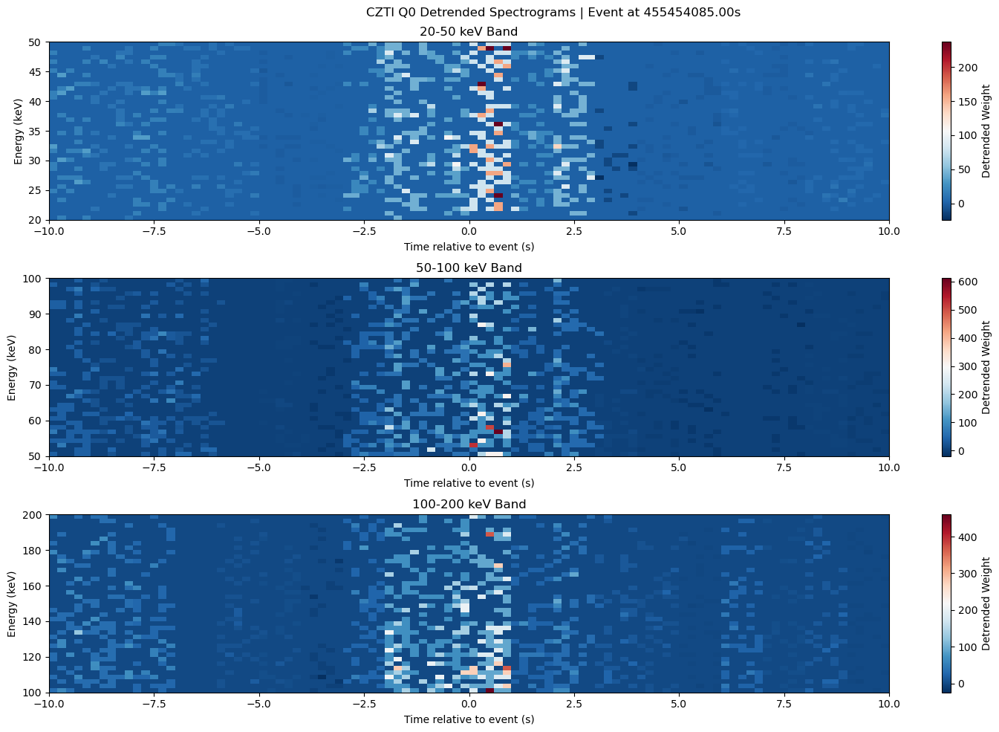

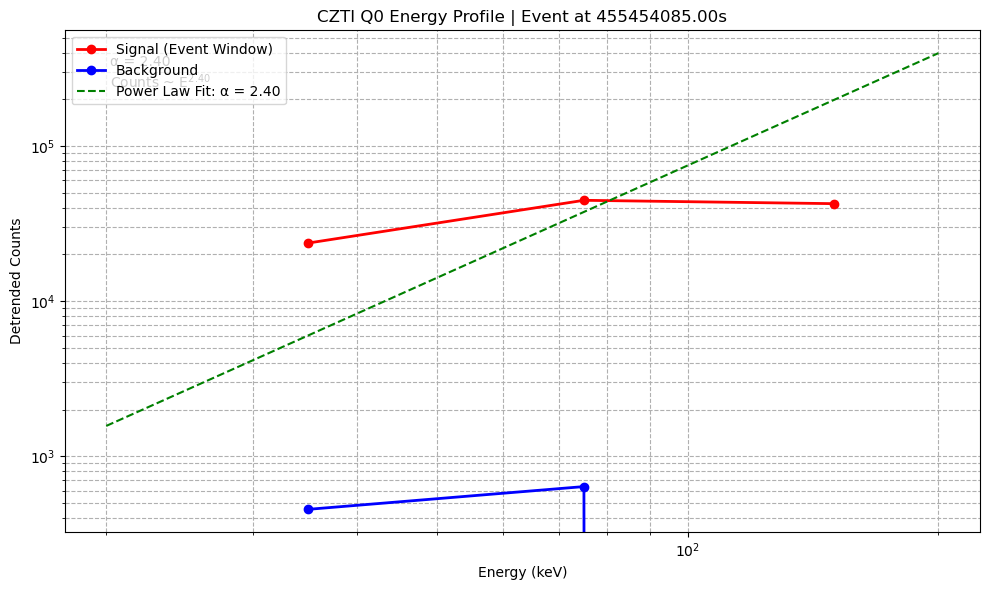

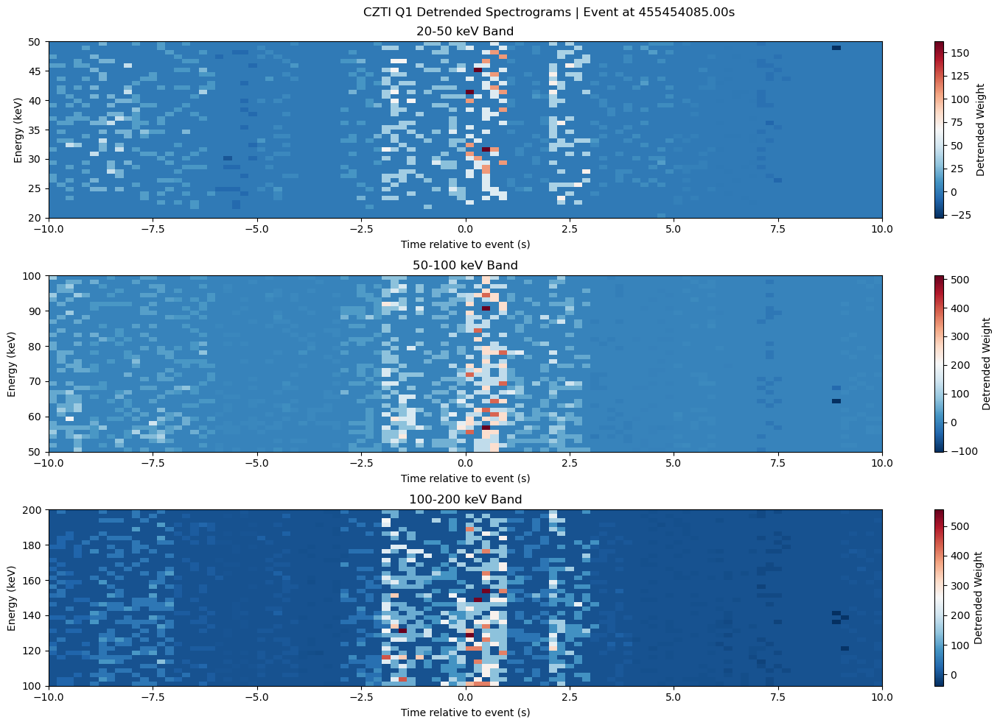

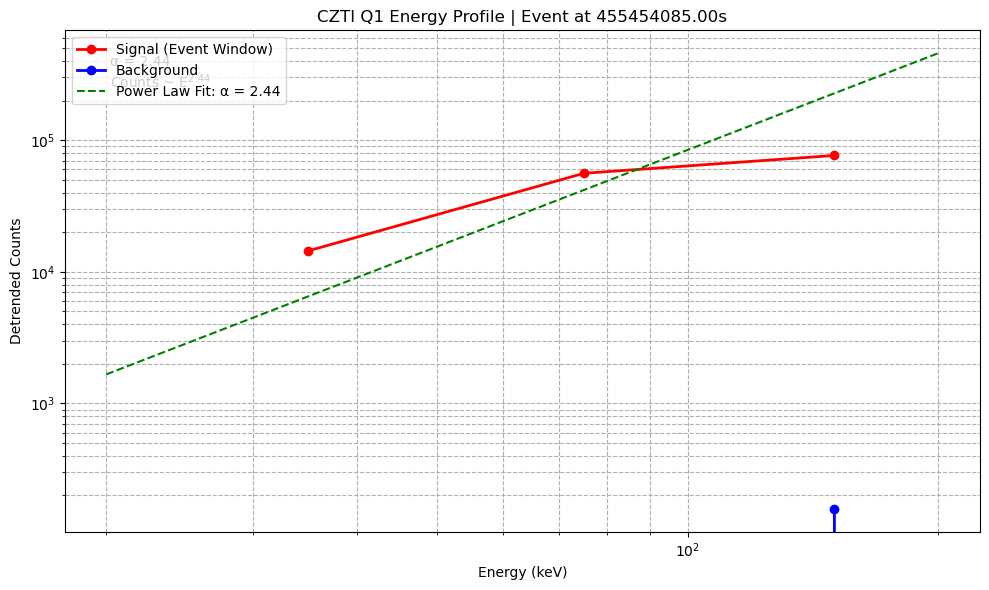

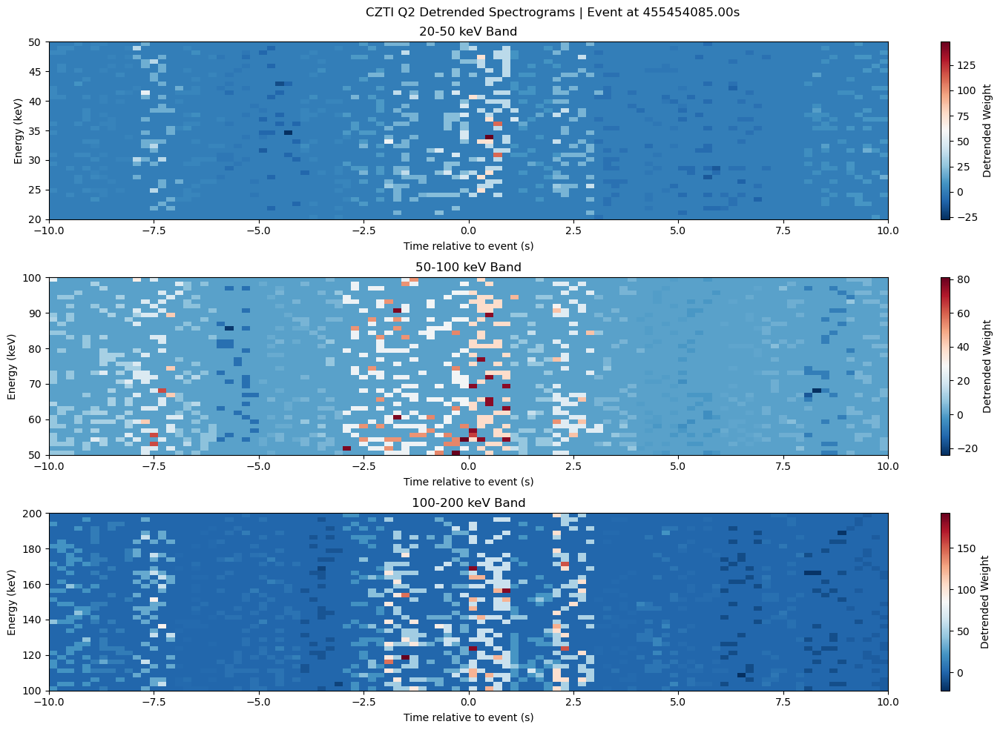

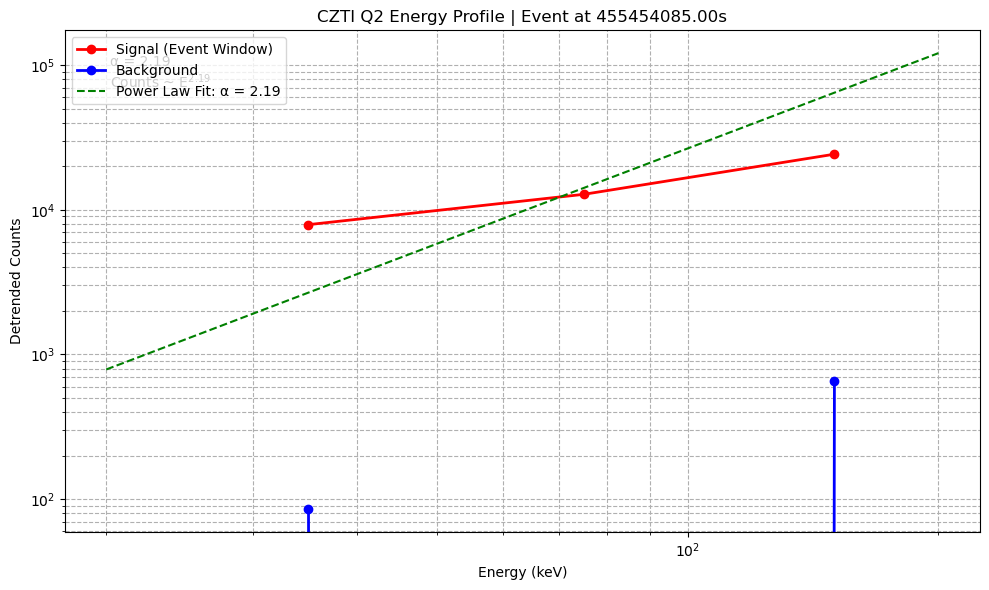

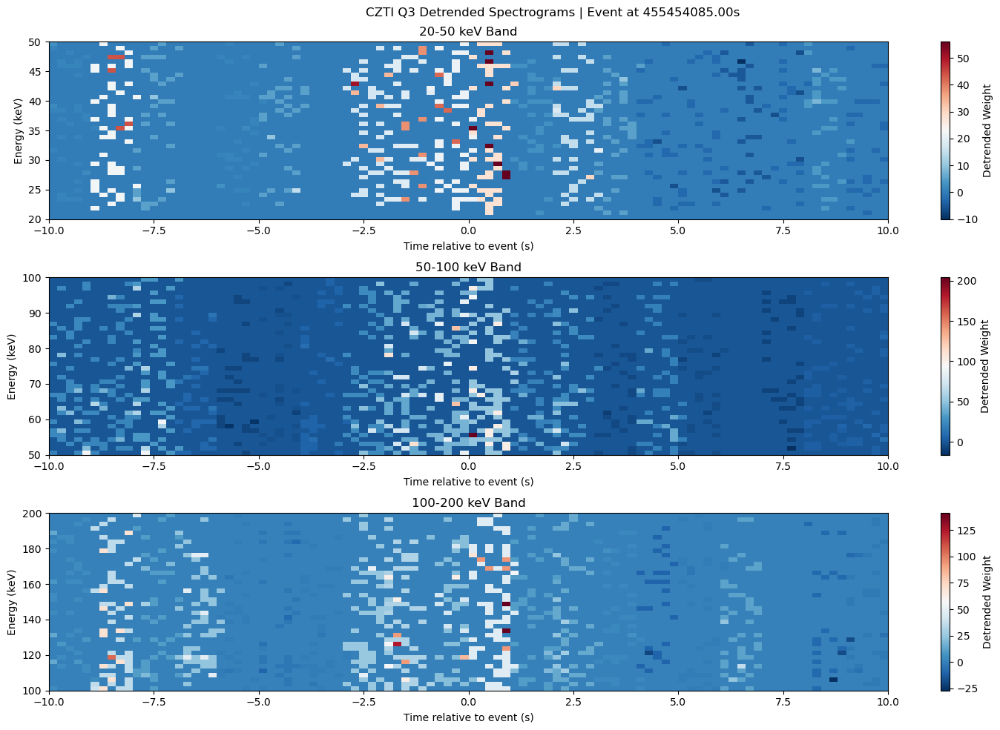

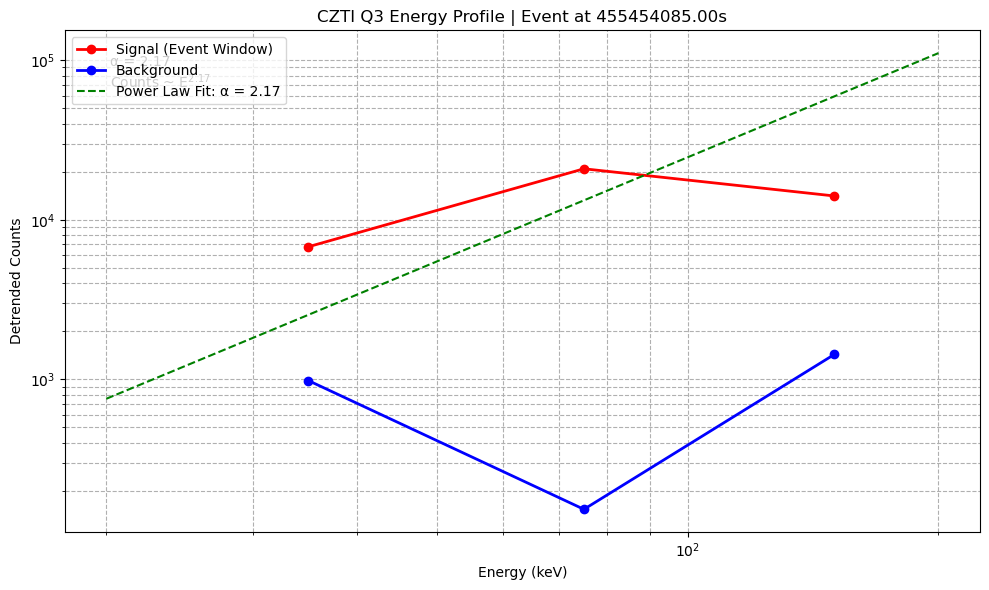

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def power_law(E, A, alpha):
    """Power law function for spectral fitting."""
    return A * E**alpha

def czt_detrended_spectrogram(filtered_results, event_time, time_window=10,
                             time_bins=100, energy_bins=40):

    energy_ranges = {
        'low': (20, 50),
        'mid': (50, 100),
        'high': (100, 200)
    }
    
    for quad in ['Q0', 'Q1', 'Q2', 'Q3']:
        plt.figure(figsize=(15, 10))
        plt.suptitle(f'CZTI {quad} Detrended Spectrograms | Event at {event_time:.2f}s')
        
        # Prepare energy profile data containers
        signal_profile = {'energy': [], 'counts': []}
        background_profile = {'energy': [], 'counts': []}
        
        for i, (band, (emin, emax)) in enumerate(energy_ranges.items()):
            key = f"{quad}_{emin}-{emax}keV"
            data = filtered_results[key]
     
            photon_weights = np.zeros_like(data['photon_time'])
            bin_edges = data['time'] - data['bin_width']/2
            bin_edges = np.append(bin_edges, bin_edges[-1] + data['bin_width'])
            
            bin_indices = np.digitize(data['photon_time'], bin_edges) - 1
            valid_bins = (bin_indices >= 0) & (bin_indices < len(data['detrended']))
            photon_weights[valid_bins] = data['detrended'][bin_indices[valid_bins]]
            
            # Event time window
            event_mask = (
                (data['photon_time'] >= event_time - time_window) &
                (data['photon_time'] <= event_time + time_window)
            )
            # Background time window (before event)
            bg_mask = (
                (data['photon_time'] >= event_time - 2.5*time_window) &
                (data['photon_time'] < event_time - 1.5*time_window)
            )
            energy_mask = (data['energy'] >= emin) & (data['energy'] <= emax)
            
            # Event energy profile
            event_energies = data['energy'][event_mask & energy_mask]
            event_weights = photon_weights[event_mask & energy_mask]
            signal_counts = np.sum(event_weights)
            signal_profile['energy'].append((emin + emax)/2)  # Center of energy band
            signal_profile['counts'].append(signal_counts)

            # Background energy profile
            bg_energies = data['energy'][bg_mask & energy_mask]
            bg_weights = data['detrended'][bin_indices[bg_mask & energy_mask]]
            bg_counts = np.sum(bg_weights)
            background_profile['energy'].append((emin + emax)/2)
            background_profile['counts'].append(bg_counts)

            # Spectrogram subplot
            plt.subplot(3, 1, i+1)
            final_mask = event_mask & energy_mask
            counts, xedges, yedges, im = plt.hist2d(
                data['photon_time'][final_mask] - event_time,
                data['energy'][final_mask],
                bins=[time_bins, energy_bins],
                weights=photon_weights[final_mask],
                range=[[-time_window, time_window], [emin, emax]],
                cmap='RdBu_r',
            )
            
            plt.colorbar(label='Detrended Weight')
            plt.title(f"{emin}-{emax} keV Band")
            plt.xlabel("Time relative to event (s)")
            plt.ylabel("Energy (keV)")
        
        plt.tight_layout()
        plt.show()
        
        # --- Energy Profile Analysis ---
        plt.figure(figsize=(10, 6))
        plt.title(f'CZTI {quad} Energy Profile | Event at {event_time:.2f}s')
        
        # Convert to arrays for processing
        energy_centers = np.array(signal_profile['energy'])
        signal_counts = np.array(signal_profile['counts'])
        bg_counts = np.array(background_profile['counts'])
        
        # Plot profiles
        plt.plot(energy_centers, signal_counts, 'ro-', lw=2, label='Signal (Event Window)')
        plt.plot(energy_centers, bg_counts, 'bo-', lw=2, label='Background')
        
        # Fit power law to signal profile (if valid)
        valid_fit = np.all(signal_counts > 0)
        if valid_fit:
            try:
                # Fit in log space for better stability
                popt, pcov = curve_fit(
                    lambda E, alpha: np.log(power_law(E, 1, alpha)),
                    energy_centers, 
                    np.log(signal_counts),
                    p0=[-1.5]
                )
                alpha = popt[0]
                A = np.exp(np.mean(np.log(signal_counts) - alpha*np.mean(np.log(energy_centers))))
                
                # Generate best fit curve
                fit_energies = np.linspace(20, 200, 100)
                fit_counts = power_law(fit_energies, A, alpha)
                
                plt.plot(fit_energies, fit_counts, 'g--', 
                         label=f'Power Law Fit: α = {alpha:.2f}')
                plt.text(0.05, 0.95, f'α = {alpha:.2f}\nCounts ~ E$^{{{alpha:.2f}}}$', 
                         transform=plt.gca().transAxes, va='top')
            except:
                valid_fit = False
        
        plt.xlabel('Energy (keV)')
        plt.ylabel('Detrended Counts')
        plt.yscale('log')
        plt.xscale('log')
        plt.grid(True, which='both', ls='--')
        plt.legend()
        plt.tight_layout()
        plt.show()

czt_detrended_spectrogram(f6, event_time= 455454085, time_window=10,
                             time_bins=100, energy_bins=40)

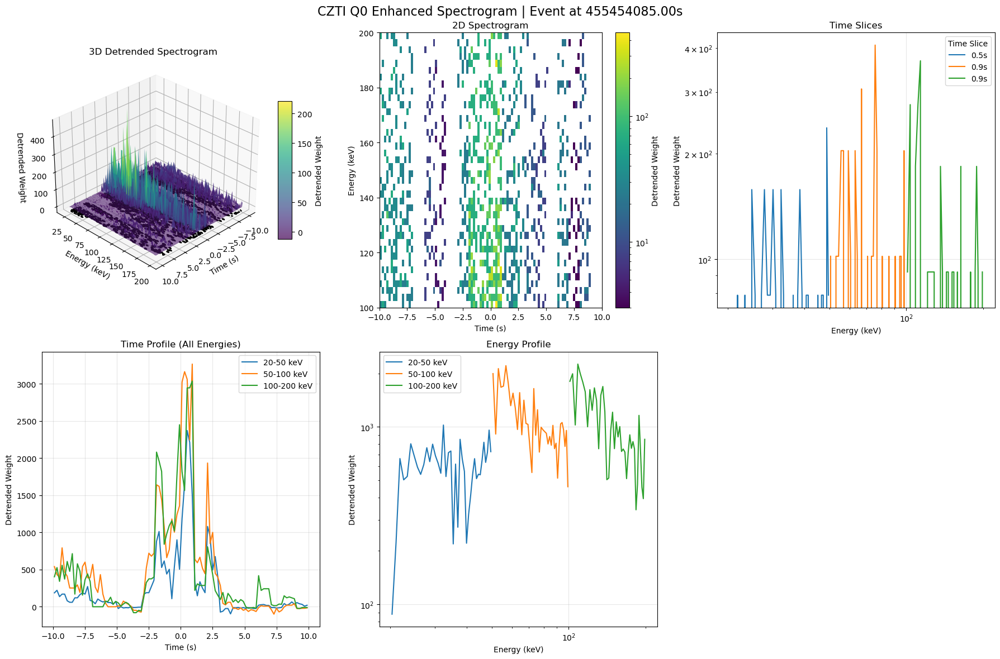

C:\Users\raumr\anaconda3\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


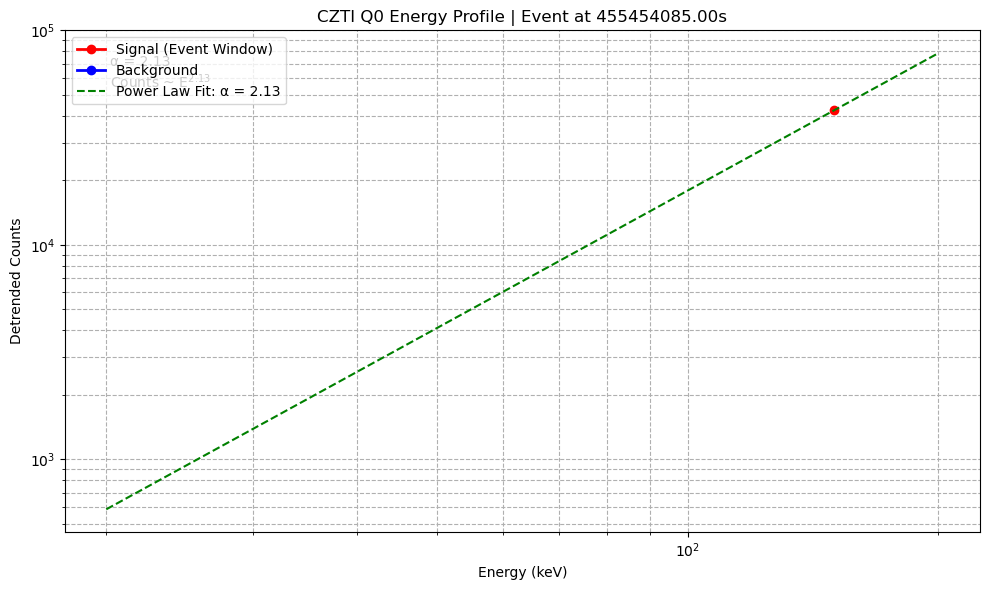

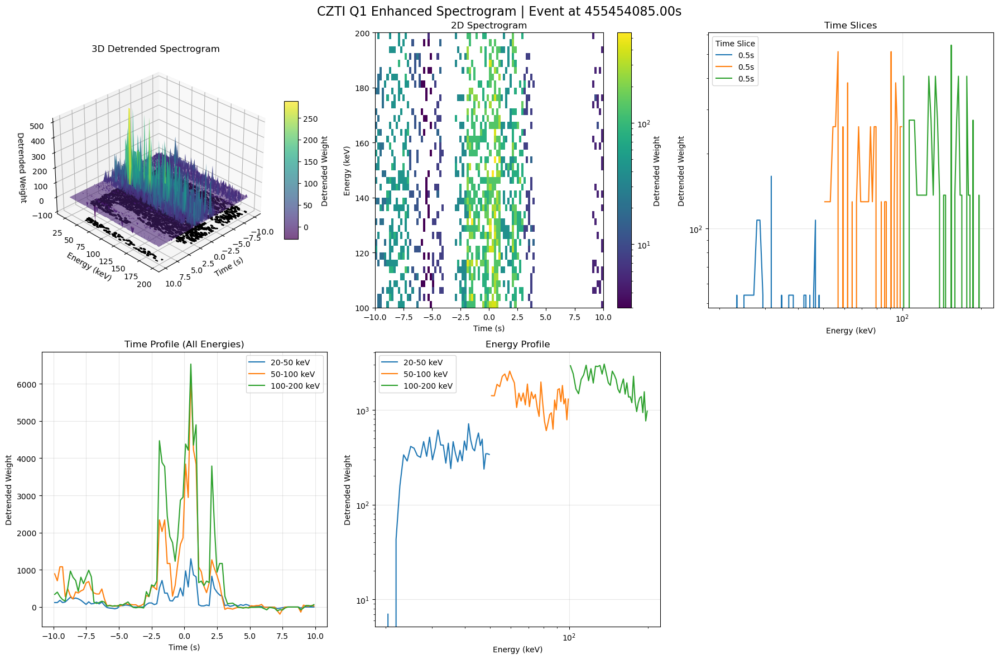

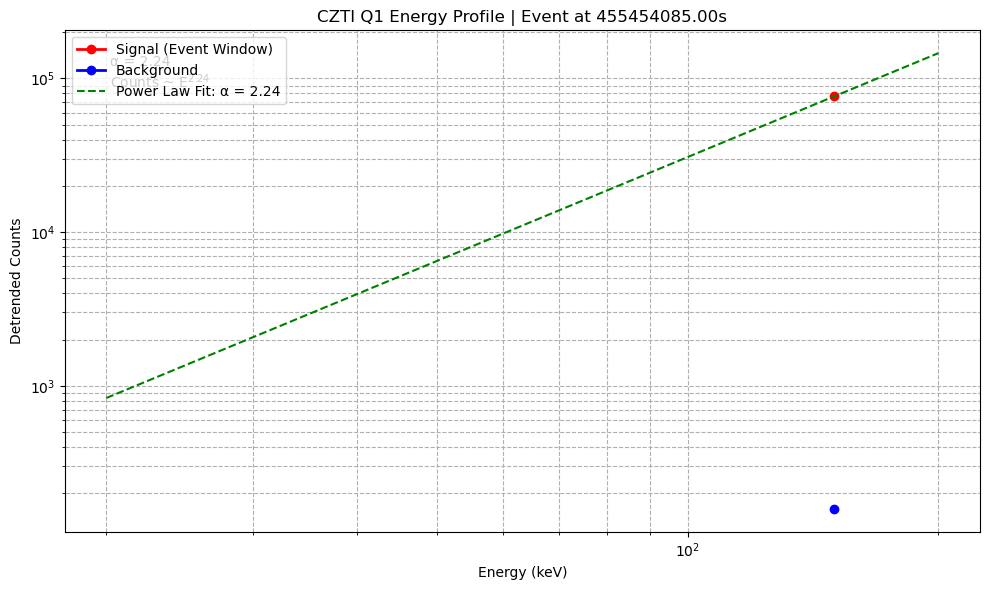

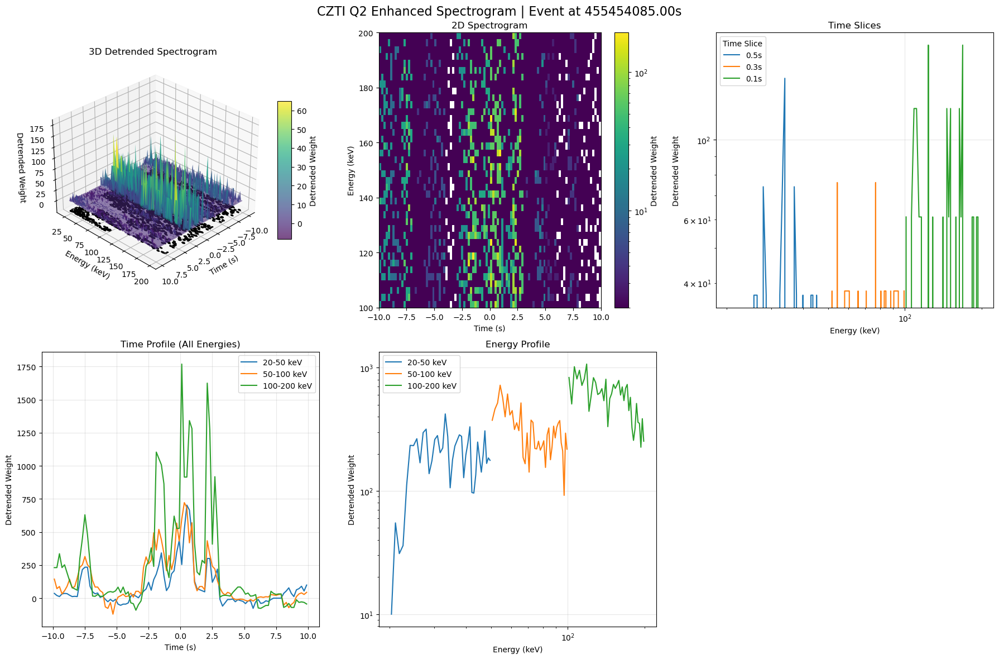

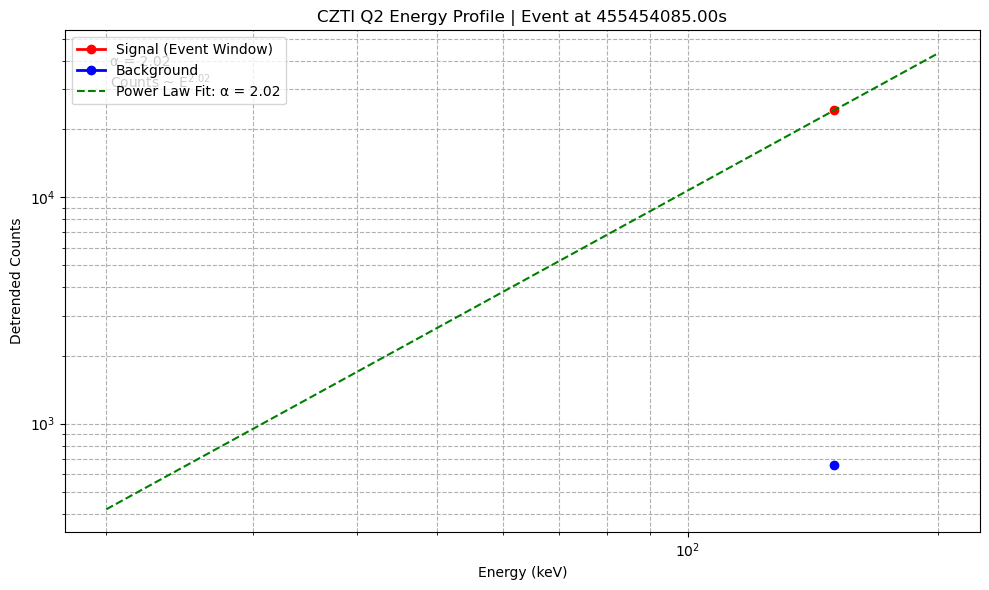

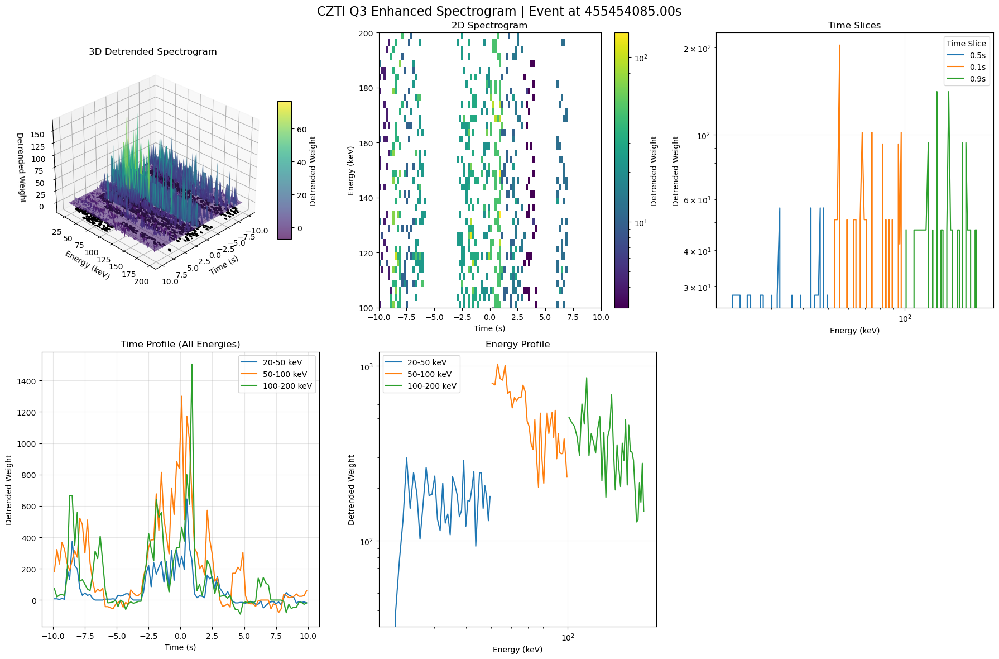

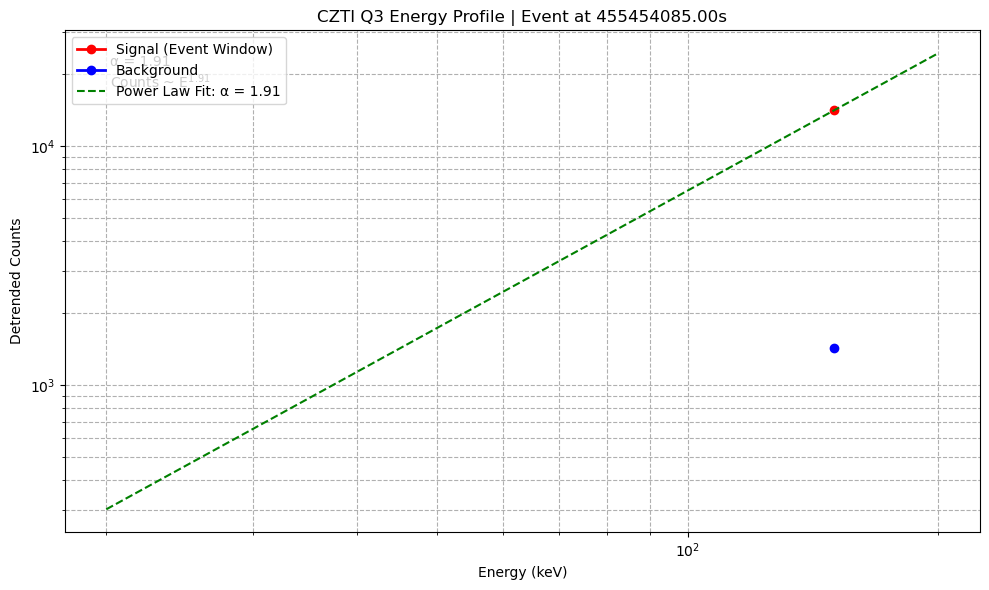

In [8]:

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.colors import LogNorm


def czt_detrended_spectrogram(filtered_results, event_time, time_window=10,
                             time_bins=100, energy_bins=40):

    energy_ranges = {
        'low': (20, 50),
        'mid': (50, 100),
        'high': (100, 200)
    }
    
    for quad in ['Q0', 'Q1', 'Q2', 'Q3']:
    
        fig = plt.figure(figsize=(18, 12))
        fig.suptitle(f'CZTI {quad} Enhanced Spectrogram | Event at {event_time:.2f}s', fontsize=16)
        

        ax3d = fig.add_subplot(231, projection='3d')
        ax3d.set_title('3D Detrended Spectrogram')
        ax3d.set_xlabel('Time (s)')
        ax3d.set_ylabel('Energy (keV)')
        ax3d.set_zlabel('Detrended Weight')
        ax3d.view_init(elev=30, azim=45)  # Set viewing angle
        
        # Create 2D spectrogram axis
        ax2d = fig.add_subplot(232)
        ax2d.set_title('2D Spectrogram')
        ax2d.set_xlabel('Time (s)')
        ax2d.set_ylabel('Energy (keV)')
        
        # Create time profile axis
        ax_time = fig.add_subplot(234)
        ax_time.set_title('Time Profile (All Energies)')
        ax_time.set_xlabel('Time (s)')
        ax_time.set_ylabel('Detrended Weight')
        
        # Create energy profile axis
        ax_energy = fig.add_subplot(235)
        ax_energy.set_title('Energy Profile')
        ax_energy.set_xlabel('Energy (keV)')
        ax_energy.set_ylabel('Detrended Weight')
        
        # Create time-energy slice axis
        ax_slice = fig.add_subplot(233)
        ax_slice.set_title('Time Slices')
        ax_slice.set_xlabel('Energy (keV)')
        ax_slice.set_ylabel('Detrended Weight')
        
        # Create colorbar axis
        ax_cbar = fig.add_subplot(236)
        ax_cbar.axis('off')
        
        # Prepare data containers
        all_times = np.array([])
        all_energies = np.array([])
        all_weights = np.array([])
        
        # Process each energy band
        for i, (band, (emin, emax)) in enumerate(energy_ranges.items()):
            key = f"{quad}_{emin}-{emax}keV"
            data = filtered_results[key]
            
            # Compute photon weights
            bin_edges = data['time'] - data['bin_width']/2
            bin_edges = np.append(bin_edges, bin_edges[-1] + data['bin_width'])
            bin_indices = np.digitize(data['photon_time'], bin_edges) - 1
            valid_bins = (bin_indices >= 0) & (bin_indices < len(data['detrended']))
            photon_weights = np.zeros_like(data['photon_time'])
            photon_weights[valid_bins] = data['detrended'][bin_indices[valid_bins]]
            
            # Apply time mask
            time_mask = ((data['photon_time'] >= event_time - time_window) &
                         (data['photon_time'] <= event_time + time_window))
            energy_mask = (data['energy'] >= emin) & (data['energy'] <= emax)
            final_mask = time_mask & energy_mask
            
            # Extract data for this band
            times = data['photon_time'][final_mask] - event_time
            energies = data['energy'][final_mask]
            weights = photon_weights[final_mask]
            
            # Add to combined data
            all_times = np.concatenate((all_times, times))
            all_energies = np.concatenate((all_energies, energies))
            all_weights = np.concatenate((all_weights, weights))
            
            # Create 2D histogram for this band
            counts, xedges, yedges = np.histogram2d(
                times, energies,
                bins=[time_bins, energy_bins],
                weights=weights,
                range=[[-time_window, time_window], [emin, emax]]
            )
            
            # Plot 2D spectrogram with proper normalization
            if np.any(counts > 0):
                vmin_val = max(1e-3, np.min(counts[counts > 0]))
                vmax_val = np.max(counts)
                norm = LogNorm(vmin=vmin_val, vmax=vmax_val)
            else:
                norm = LogNorm(vmin=1e-3, vmax=1)  # Default range if no counts
                
            im = ax2d.imshow(
                counts.T,
                extent=[-time_window, time_window, emin, emax],
                aspect='auto',
                origin='lower',
                cmap='viridis',
                norm=norm
            )
            
            # Add to time profile
            time_profile = np.sum(counts, axis=1)
            time_centers = (xedges[:-1] + xedges[1:]) / 2
            ax_time.plot(time_centers, time_profile, label=f'{emin}-{emax} keV')
            
            # Add to energy profile
            energy_profile = np.sum(counts, axis=0)
            energy_centers = (yedges[:-1] + yedges[1:]) / 2
            ax_energy.plot(energy_centers, energy_profile, label=f'{emin}-{emax} keV')
            
            # Add to time slices (at peak time)
            if np.any(time_profile > 0):
                peak_idx = np.argmax(time_profile)
                ax_slice.plot(energy_centers, counts[peak_idx, :], label=f'{time_centers[peak_idx]:.1f}s')
        
        # Add colorbar for 2D plot
        cbar = plt.colorbar(im, ax=ax2d)
        cbar.set_label('Detrended Weight')
        
        # Create 3D surface plot from combined data
        if len(all_times) > 0:
            # Create combined histogram
            counts_3d, xedges_3d, yedges_3d = np.histogram2d(
                all_times, all_energies,
                bins=[time_bins*2, energy_bins*2],  # Higher resolution for 3D
                weights=all_weights,
                range=[[-time_window, time_window], [20, 200]]
            )
            
            # Create grid for surface plot
            X, Y = np.meshgrid((xedges_3d[:-1] + xedges_3d[1:])/2, 
                              (yedges_3d[:-1] + yedges_3d[1:])/2)
            
            # Plot 3D surface
            surf = ax3d.plot_surface(
                X, Y, counts_3d.T, 
                cmap='viridis',
                edgecolor='none',
                rstride=1, 
                cstride=1,
                alpha=0.7,
                antialiased=True
            )
            
            # Add contour lines
            ax3d.contour(X, Y, counts_3d.T, 10, colors='k', linestyles='solid', offset=np.min(counts_3d))
            
            # Add colorbar for 3D plot
            cbar_3d = plt.colorbar(surf, ax=ax3d, shrink=0.5, aspect=10)
            cbar_3d.set_label('Detrended Weight')
        
        # Add legends and final touches
        ax_time.legend()
        ax_energy.legend()
        ax_slice.legend(title='Time Slice')
        
        # Set log scales where appropriate
        ax_energy.set_xscale('log')
        ax_energy.set_yscale('log')
        ax_slice.set_xscale('log')
        ax_slice.set_yscale('log')
        
        # Add gridlines
        ax_time.grid(True, alpha=0.3)
        ax_energy.grid(True, alpha=0.3)
        ax_slice.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

  
        
    
    
         # Prepare energy profile data containers
        signal_profile = {'energy': [], 'counts': []}
        background_profile = {'energy': [], 'counts': []}
        
        for i, (band, (emin, emax)) in enumerate(energy_ranges.items()):
            key = f"{quad}_{emin}-{emax}keV"
            data = filtered_results[key]
     
            photon_weights = np.zeros_like(data['photon_time'])
            bin_edges = data['time'] - data['bin_width']/2
            bin_edges = np.append(bin_edges, bin_edges[-1] + data['bin_width'])
            
            bin_indices = np.digitize(data['photon_time'], bin_edges) - 1
            valid_bins = (bin_indices >= 0) & (bin_indices < len(data['detrended']))
            photon_weights[valid_bins] = data['detrended'][bin_indices[valid_bins]]
            
            # Event time window
            event_mask = (
                (data['photon_time'] >= event_time - time_window) &
                (data['photon_time'] <= event_time + time_window)
            )
            # Background time window (before event)
            bg_mask = (
                (data['photon_time'] >= event_time - 2.5*time_window) &
                (data['photon_time'] < event_time - 1.5*time_window)
            )
            energy_mask = (data['energy'] >= emin) & (data['energy'] <= emax)
        # Event energy profile
        event_energies = data['energy'][event_mask & energy_mask]
        event_weights = photon_weights[event_mask & energy_mask]
        signal_counts = np.sum(event_weights)
        signal_profile['energy'].append((emin + emax)/2)  # Center of energy band
        signal_profile['counts'].append(signal_counts)

        # Background energy profile
        bg_energies = data['energy'][bg_mask & energy_mask]
        bg_weights = data['detrended'][bin_indices[bg_mask & energy_mask]]
        bg_counts = np.sum(bg_weights)
        background_profile['energy'].append((emin + emax)/2)
        background_profile['counts'].append(bg_counts)        
      # --- Energy Profile Analysis ---
        plt.figure(figsize=(10, 6))
        plt.title(f'CZTI {quad} Energy Profile | Event at {event_time:.2f}s')
        
        # Convert to arrays for processing
        energy_centers = np.array(signal_profile['energy'])
        signal_counts = np.array(signal_profile['counts'])
        bg_counts = np.array(background_profile['counts'])
        
        # Plot profiles
        plt.plot(energy_centers, signal_counts, 'ro-', lw=2, label='Signal (Event Window)')
        plt.plot(energy_centers, bg_counts, 'bo-', lw=2, label='Background')
        
        # Fit power law to signal profile (if valid)
        valid_fit = np.all(signal_counts > 0)
        if valid_fit:
            try:
                # Fit in log space for better stability
                popt, pcov = curve_fit(
                    lambda E, alpha: np.log(power_law(E, 1, alpha)),
                    energy_centers, 
                    np.log(signal_counts),
                    p0=[-1.5]
                )
                alpha = popt[0]
                A = np.exp(np.mean(np.log(signal_counts) - alpha*np.mean(np.log(energy_centers))))
                
                # Generate best fit curve
                fit_energies = np.linspace(20, 200, 100)
                fit_counts = power_law(fit_energies, A, alpha)
                
                plt.plot(fit_energies, fit_counts, 'g--', 
                         label=f'Power Law Fit: α = {alpha:.2f}')
                plt.text(0.05, 0.95, f'α = {alpha:.2f}\nCounts ~ E$^{{{alpha:.2f}}}$', 
                         transform=plt.gca().transAxes, va='top')
            except:
                valid_fit = False
        
        plt.xlabel('Energy (keV)')
        plt.ylabel('Detrended Counts')
        plt.yscale('log')
        plt.xscale('log')
        plt.grid(True, which='both', ls='--')
        plt.legend()
        plt.tight_layout()
        plt.show()

czt_detrended_spectrogram(f6, event_time= 455454085, time_window=10,
                             time_bins=100, energy_bins=40)

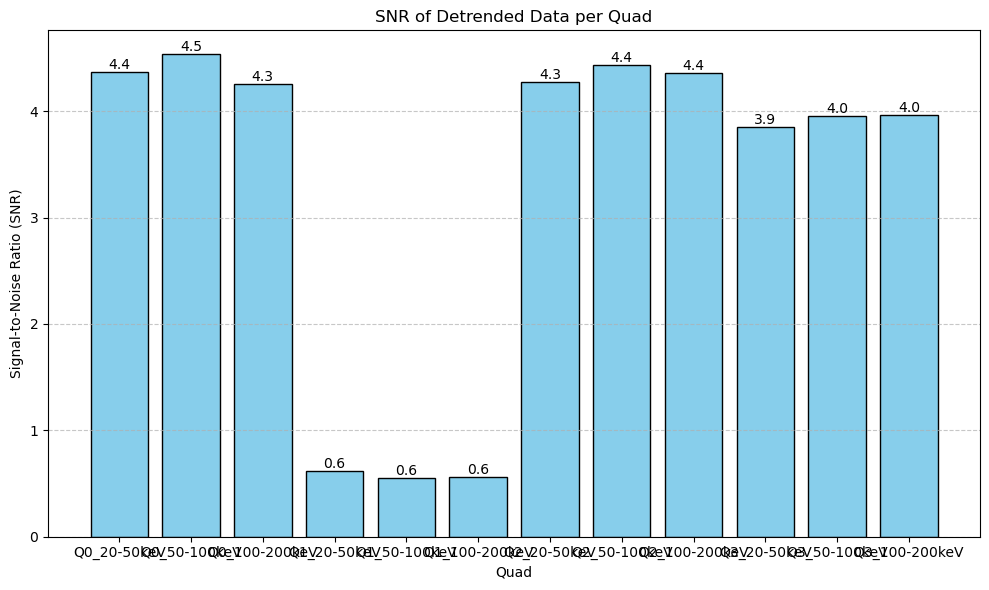

In [9]:
def plot_snr(filtered_results):

    quads = list(filtered_results.keys())
    snr_values = []
    
    for key in quads:
        data = filtered_results[key]
        trend = data['cps'] - data['detrended']
        signal = np.nanmedian(trend)
        noise_std = np.nanstd(data['detrended'])

        snr = signal / noise_std if noise_std != 0 else np.nan
        snr_values.append(snr)
    
    # Create bar plot
    plt.figure(figsize=(10, 6))
    bars = plt.bar(quads, snr_values, color='skyblue', edgecolor='black')
    
    # Annotate SNR values on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.1f}',
                 ha='center', va='bottom')
    
    plt.xlabel('Quad')
    plt.ylabel('Signal-to-Noise Ratio (SNR)')
    plt.title('SNR of Detrended Data per Quad')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

plot_snr(f6)

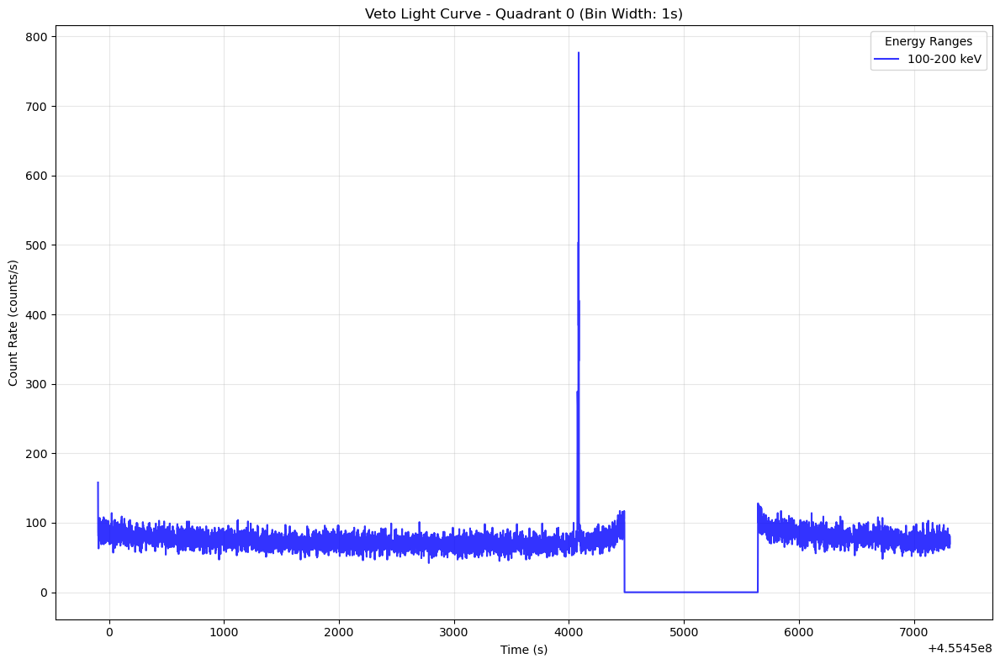

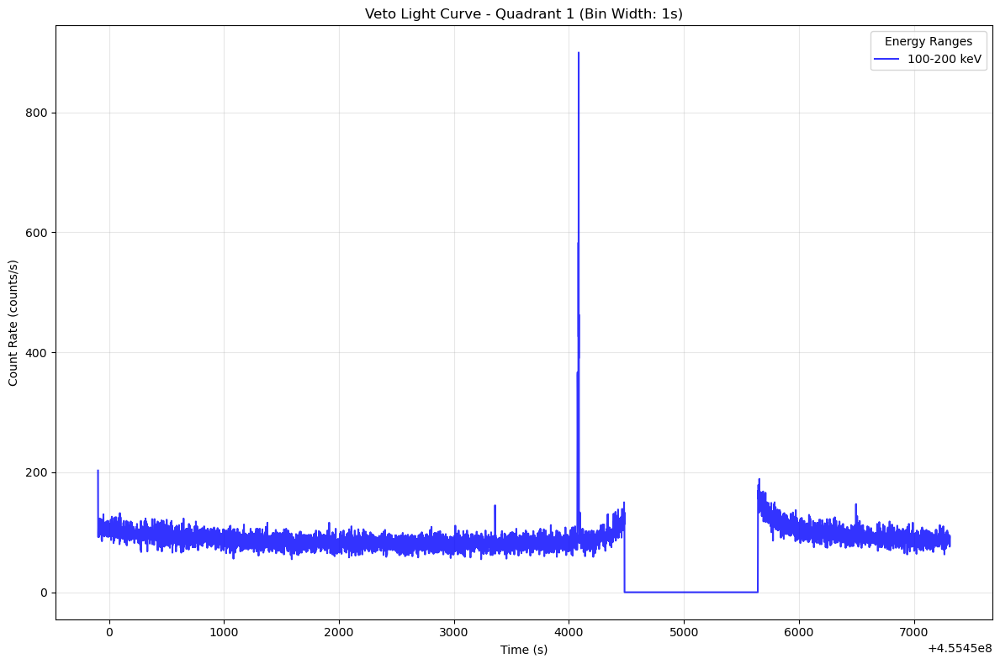

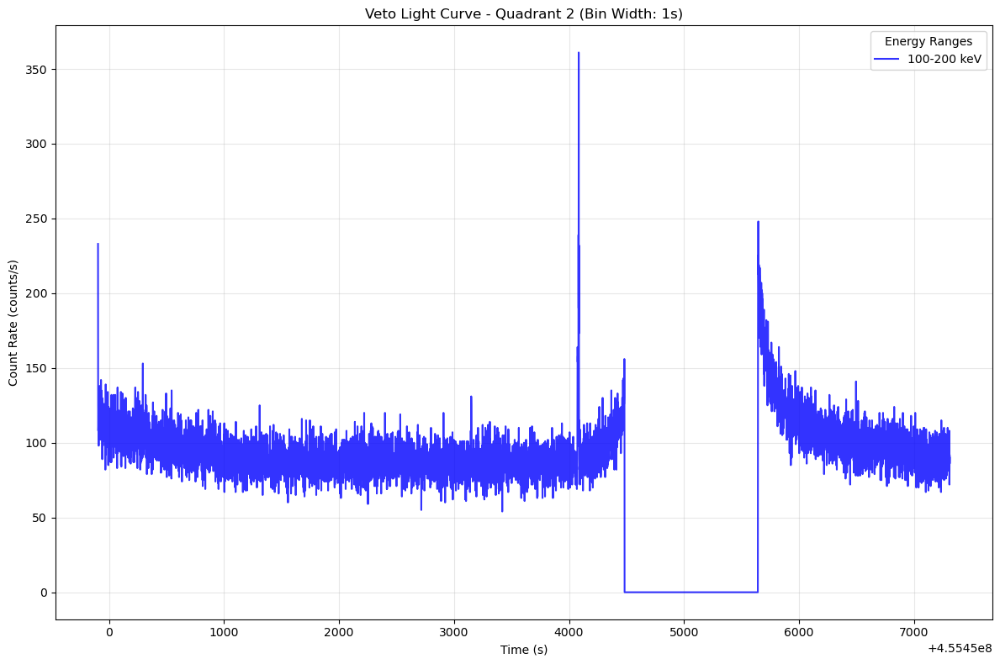

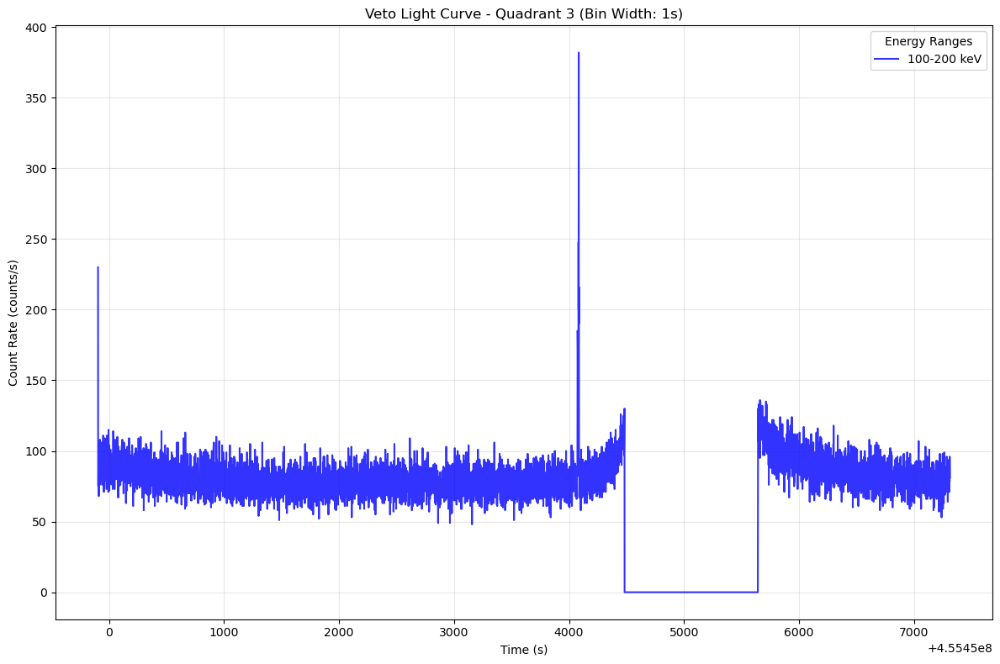

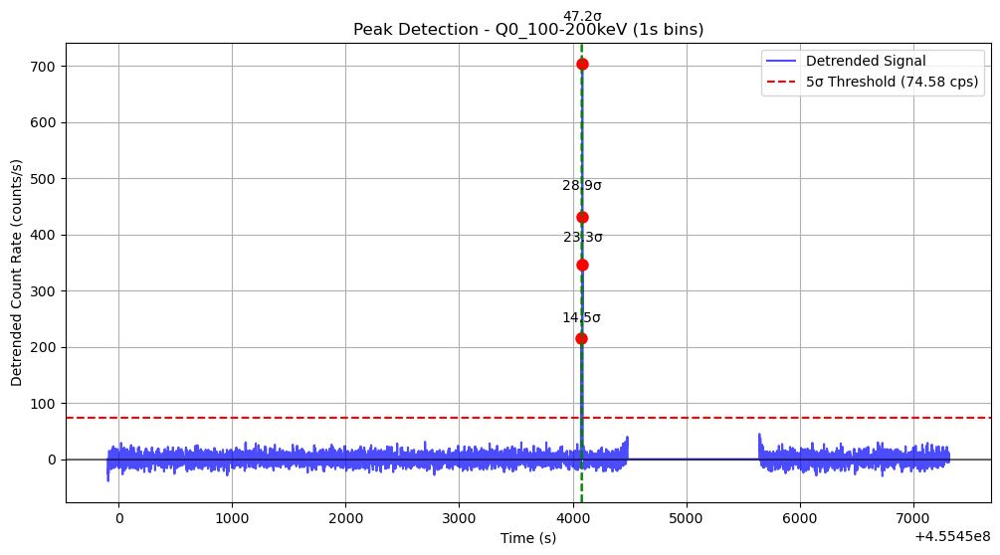

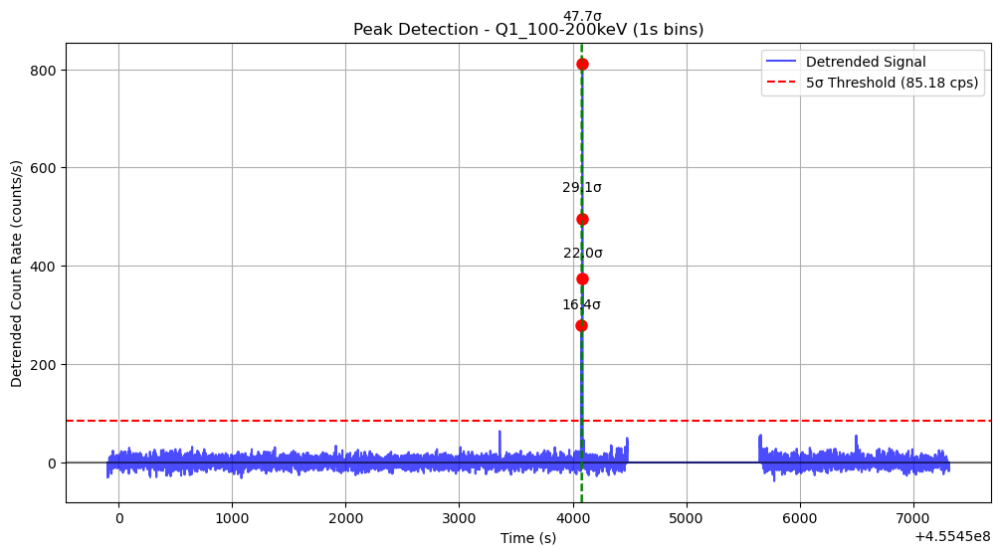

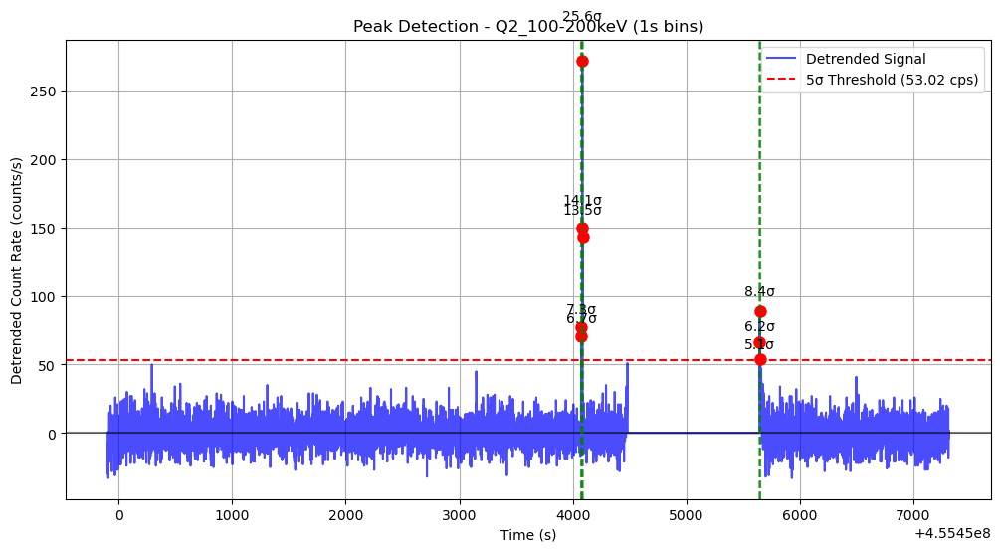

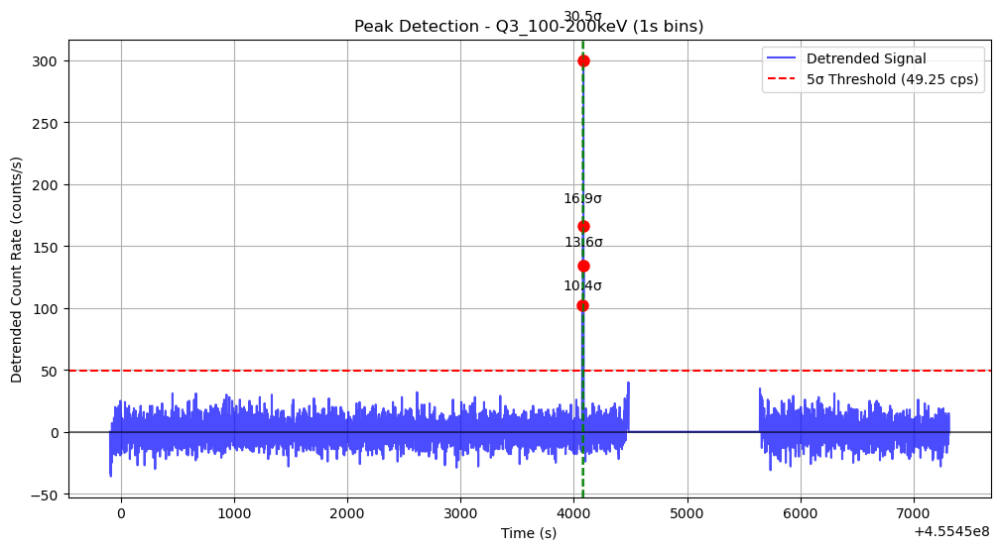

In [10]:
file0 = "AS1C09_006T01_9000006294_47011cztM0_level2_quad_clean.evt"
r6 = lc_veto(file0,energy_ranges=(100,200),bin_width=1)            
f6 = median_filter(r6,window_size=101)
p6 = detect_peaks(f6,sigma=5,min_distance=1)

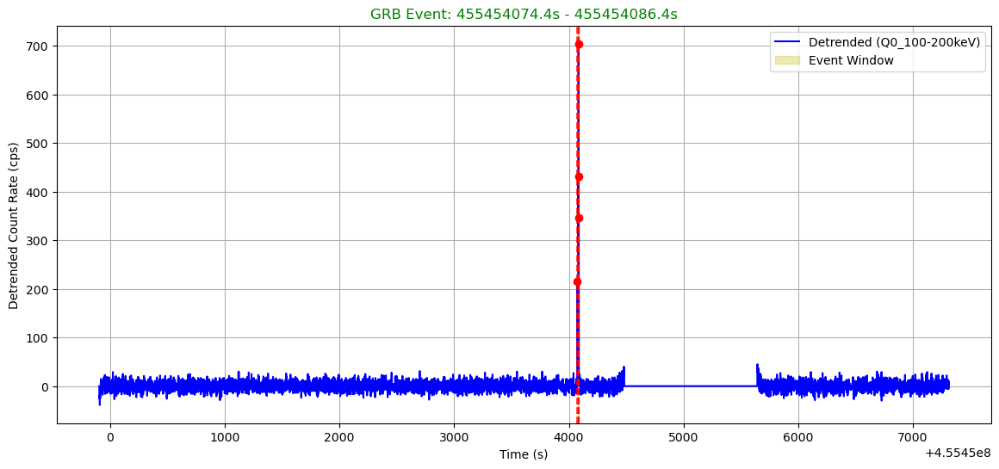

Classification: GRB
Reason: Wide quadrant spread and high significance
Duration: 12.00s
Quadrants: Q0, Q1, Q2, Q3
Energy Ranges: 100-200keV
Max Significance: 47.7σ



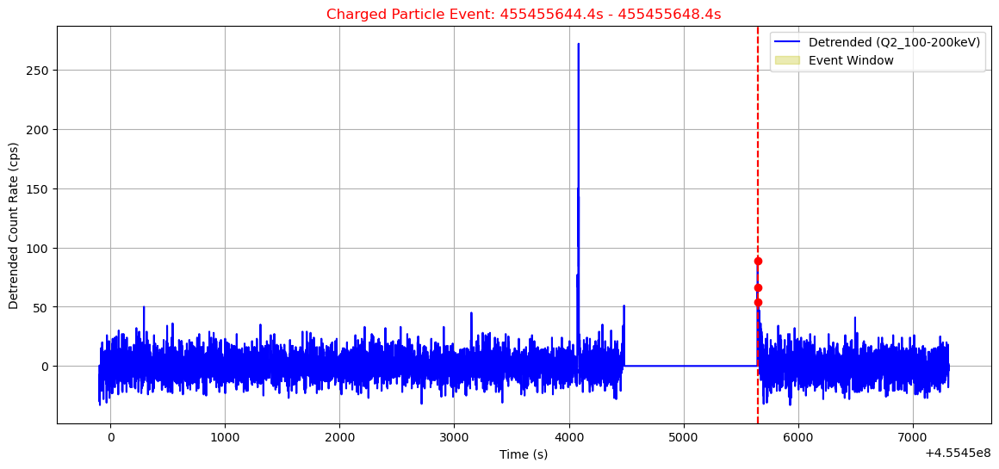

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 4.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 8.4σ



In [11]:
from sklearn.cluster import DBSCAN


def classify_events(peak_results, bin_width, saa_recovery_time, saa_end_times=None, energy_threshold=100.0):
    saa_ends = np.array(saa_end_times, dtype=float) if saa_end_times is not None else None
    
    
    all_peaks = []
    for key, data in peak_results.items():
        parts = key.split('_')
        quad = parts[0]
        energy_range = '_'.join(parts[1:]) 

        for peak in data['peaks']:
            all_peaks.append({
                'time': float(peak['time']),  
                'significance': float(peak['significance']),
                'quadrant': quad,
                'energy_range': energy_range,
                'key': key,
                'value': float(peak['value'])
            })

    if not all_peaks:
        return {"events": []}

    # Cluster peaks by time proximity
    times = np.array([p['time'] for p in all_peaks]).reshape(-1, 1)
    clustering = DBSCAN(eps=7 * bin_width, min_samples=1).fit(times)
    labels = clustering.labels_

    # Group peaks into events
    events = {}
    for i, label in enumerate(labels):
        events.setdefault(label, []).append(all_peaks[i])

    classified_events = []

    # Processing each event cluster
    for peaks in events.values():
        quadrants = set(p['quadrant'] for p in peaks)
        energy_ranges = set(p['energy_range'] for p in peaks)
        times = [p['time'] for p in peaks]
        max_sig = max(p['significance'] for p in peaks)
        min_time = min(times)
        max_time = max(times)
        duration = max_time - min_time

        # Initializing as noise by default
        event_type = "Noise"
        reason = "Defaulted to Noise (no strong spatial/spectral pattern)"
        in_recovery = False

        if saa_ends is not None:
            for peak_time in times:
                in_recovery = np.any(
                    (saa_ends <= peak_time) & 
                    (peak_time <= saa_ends + saa_recovery_time)
                )
                if in_recovery:
                    event_type = "Noise"
                    reason = (f"Post-SAA recovery period "
                              f"({saa_recovery_time}s after SAA exit)")
                    break
                    
        if not in_recovery:
            if len(quadrants) == 1 and max_sig >= 3:
                all_high_energy = True
                for p in peaks:
                    try:
                        e_range = p['energy_range'].replace('keV', '')
                        emin = float(e_range.split('-')[0])
                    except (ValueError, IndexError):
                        emin = 0
                    if emin < energy_threshold:
                        all_high_energy = False
                        break
                if all_high_energy:
                    event_type = "Charged Particle"
                    reason = f"Single quadrant and all energies ≥ {energy_threshold} keV"

            elif (len(quadrants) >= 2 and len(energy_ranges) >= 2 and max_sig >= 4):
                event_type = "GRB"
                reason = f"Multi-quadrant + multi-energy + max significance {max_sig:.1f}σ"

            elif (len(energy_ranges) >= 3 and max_sig >= 5):
                event_type = "GRB"
                reason = f"Strong multi-band peak with {max_sig:.1f}σ"

            elif (len(quadrants) >= 3 and max_sig >= 4):
                event_type = "GRB"
                reason = f"Wide quadrant spread and high significance"

            elif len(peaks) == 1 and max_sig < 3:
                event_type = "Noise"
                reason = f"Single peak with low significance ({max_sig:.1f}σ)"

 
        event_data = {
            'type': event_type,
            'start_time': min_time,
            'end_time': max_time,
            'duration': duration,
            'quadrants': sorted(quadrants),
            'energy_ranges': sorted(energy_ranges),
            'max_significance': max_sig,
            'n_peaks': len(peaks),
            'reason': reason,
            'peaks': sorted(peaks, key=lambda x: x['time'])
        }

        classified_events.append(event_data)


    classified_events.sort(key=lambda x: x['start_time'])
    return {"events": classified_events}

   
    


def plot_event_classification(results, filtered_results):
    all_events = results['events'] 
    color_map = {
    "GRB": "green",
    "Charged Particle": "red",
    "Noise": "gray"
}
    for event in all_events:
        plt.figure(figsize=(14, 6))
        main_quad = event['quadrants'][0] if event['quadrants'] else "Q0"
        found = False
        for key, data in filtered_results.items():
            if main_quad in key:
                plt.plot(data['time'], data['detrended'], 'b-', label=f'Detrended ({key})')
                found = True
                break

        if not found:
            print(f"No matching data found for quadrant {main_quad}")
            continue

        plt.axvspan(event['start_time'], event['end_time'], color='y', alpha=0.3, label='Event Window')

        for peak in event['peaks']:
            if peak['quadrant'] == main_quad:
                plt.axvline(x=peak['time'], color='r', linestyle='--', alpha=0.7)
                plt.plot(peak['time'], peak['value'], 'ro', ms=6)

        title_color = color_map.get(event['type'], "blue")
        plt.title(f"{event['type']} Event: {event['start_time']:.1f}s - {event['end_time']:.1f}s",
                  color=title_color)
        plt.xlabel('Time (s)')
        plt.ylabel('Detrended Count Rate (cps)')
        plt.legend()
        plt.grid(True)
        #plt.xlim(event['start_time']-50,event['end_time']+50)
        plt.show()

        print(f"Classification: {event['type']}")
        print(f"Reason: {event.get('reason', 'N/A')}")
        print(f"Duration: {event['duration']:.2f}s")
        print(f"Quadrants: {', '.join(event['quadrants'])}")
        print(f"Energy Ranges: {', '.join(event['energy_ranges'])}")
        print(f"Max Significance: {event['max_significance']:.1f}σ\n")



c6 = classify_events(p6,bin_width=1,saa_recovery_time=1000, saa_end_times=4.5545e8+5800)
plot_event_classification(c6, f6)



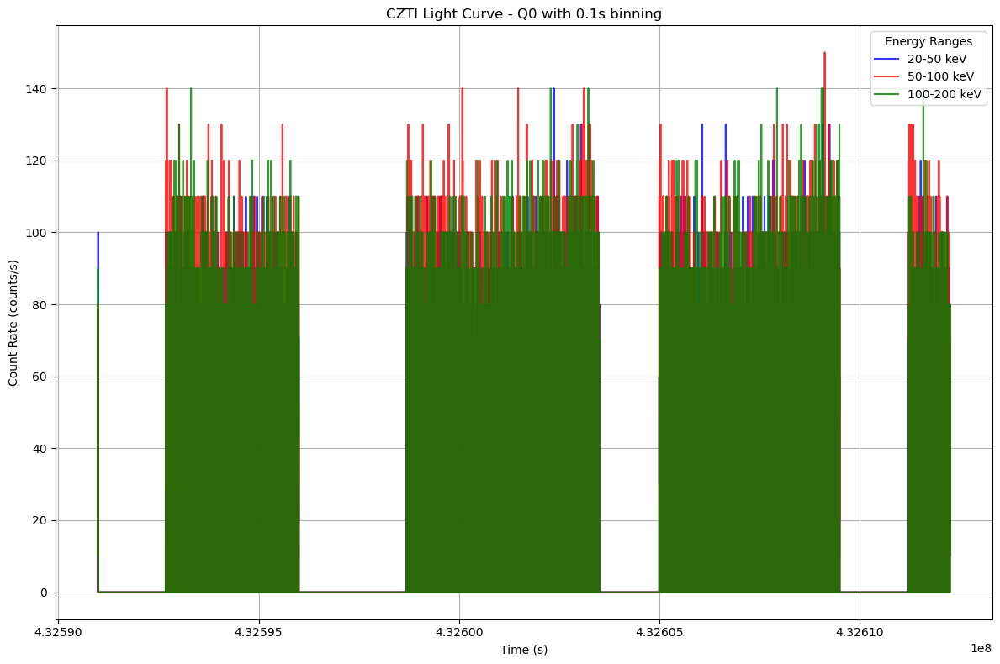

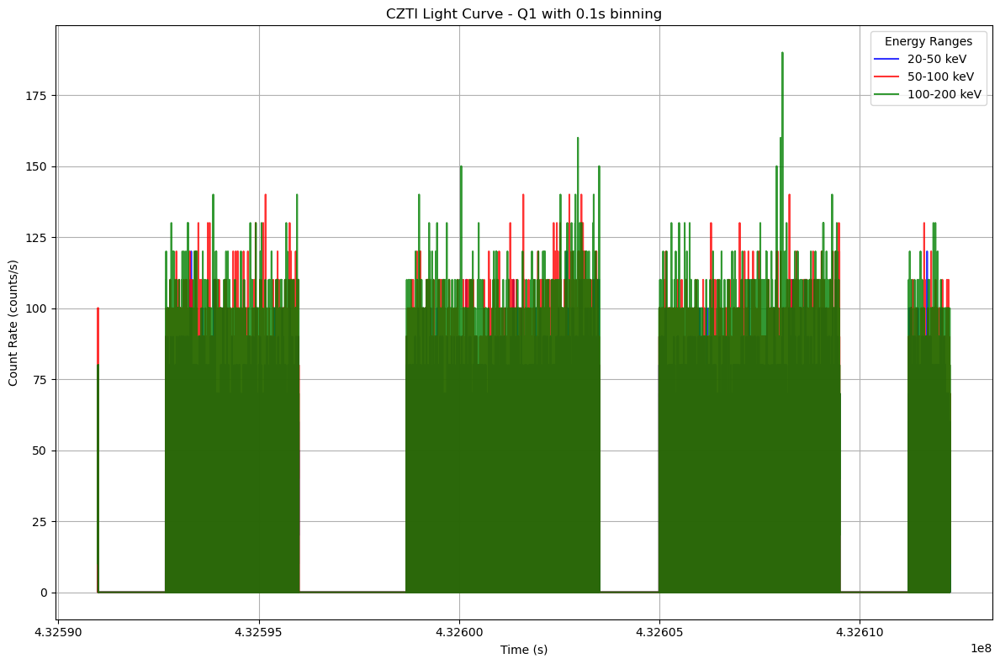

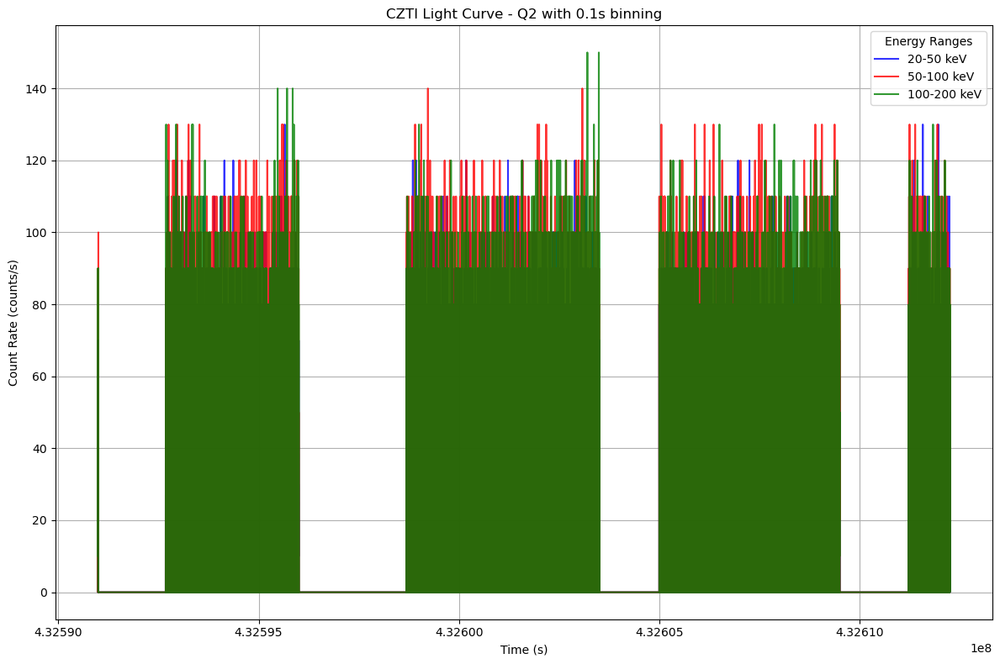

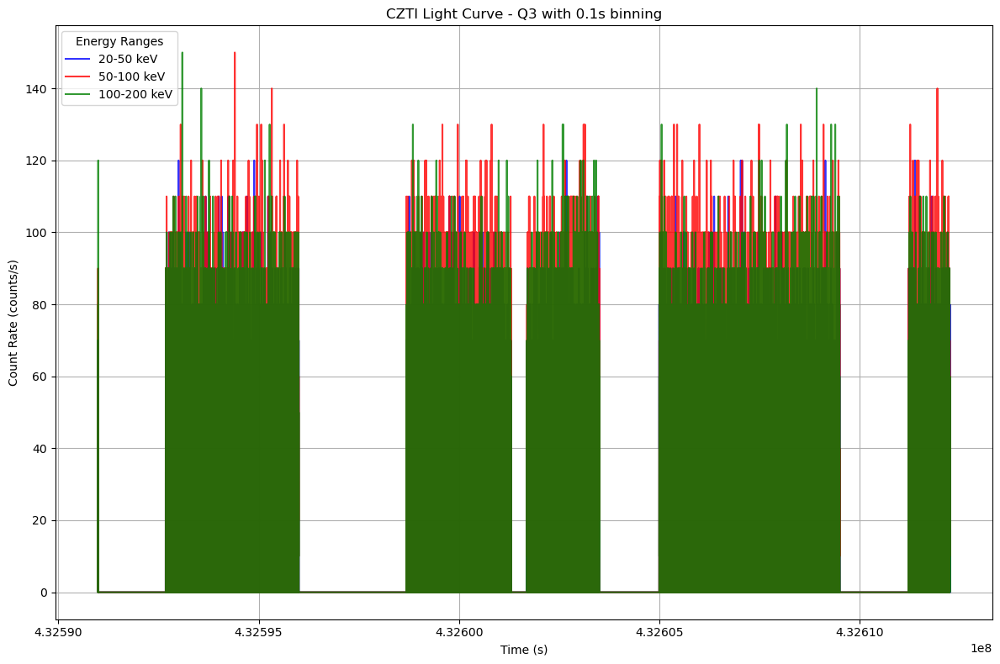

C:\Users\raumr\AppData\Local\Temp\ipykernel_8848\1229974846.py:10: RuntimeWarning: All-NaN slice encountered
  filtered[i] = np.nanmedian(window)


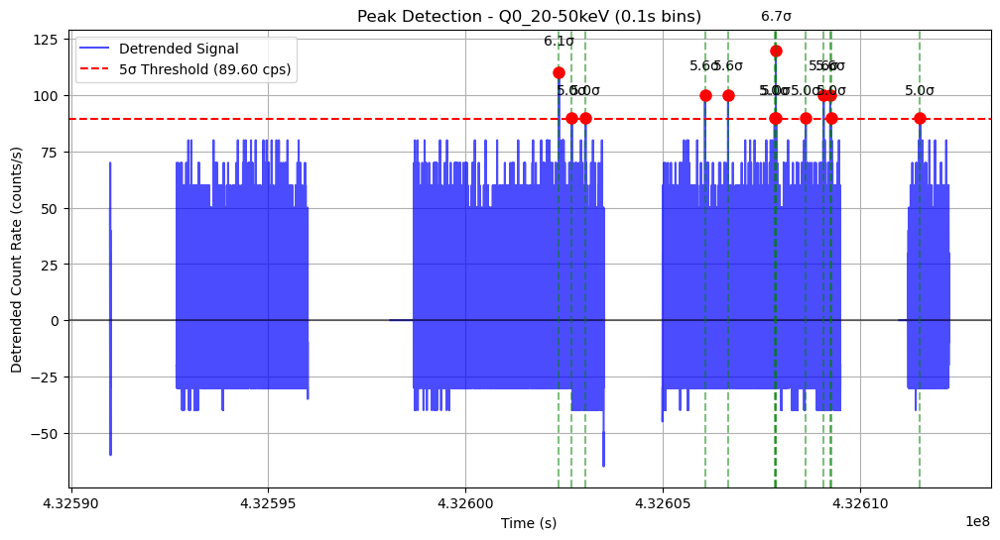

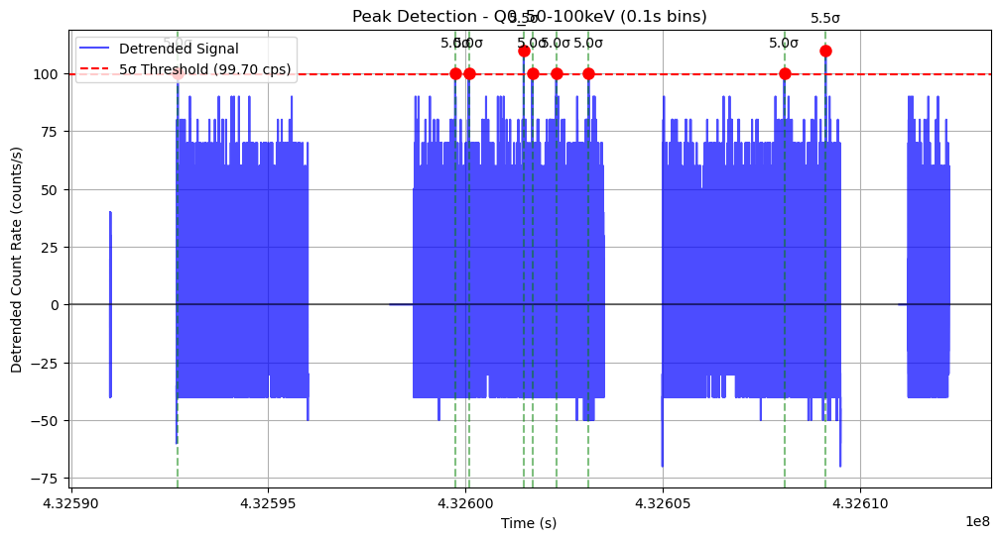

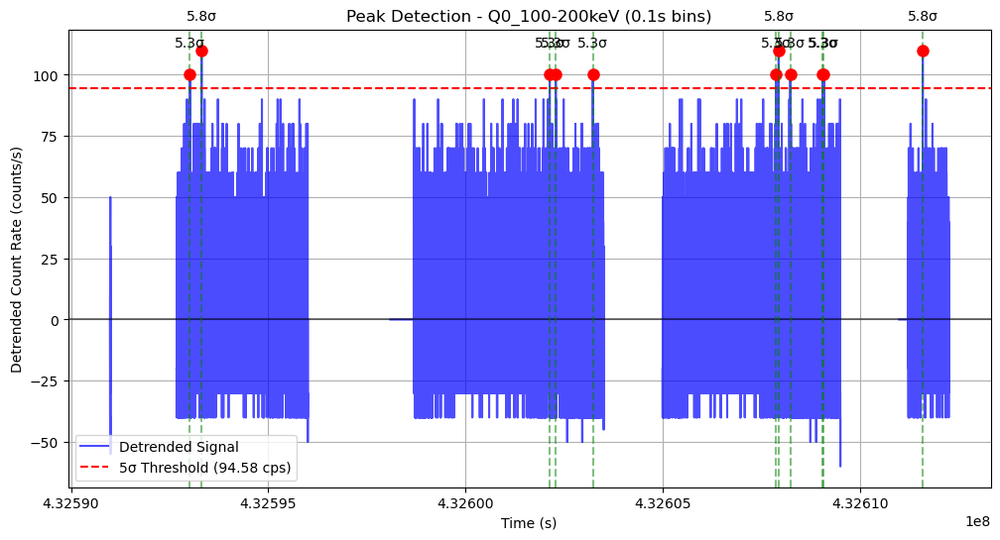

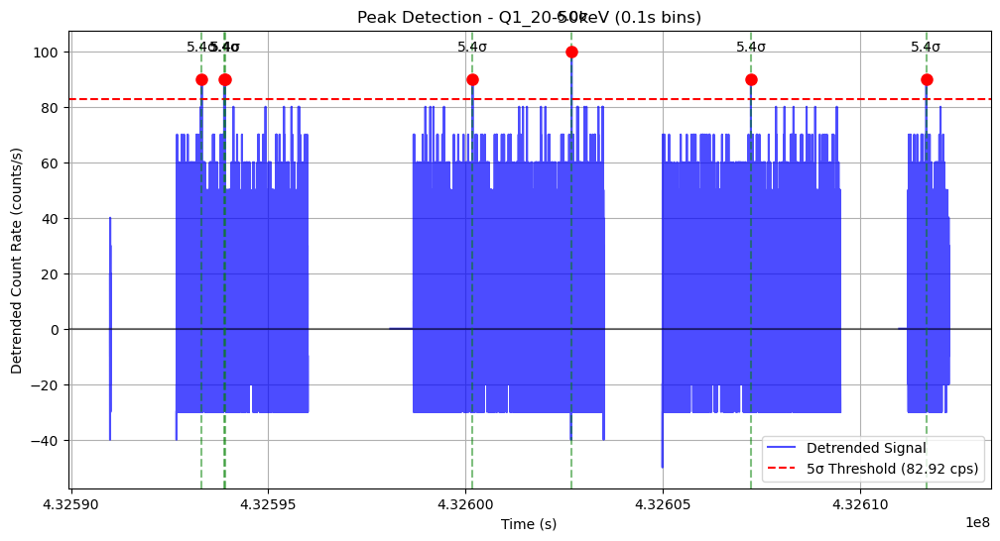

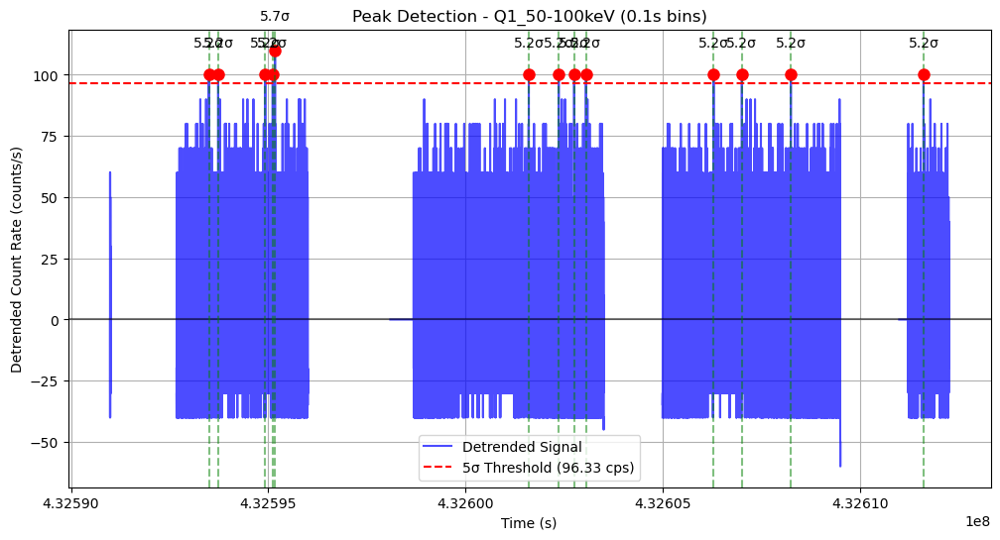

...

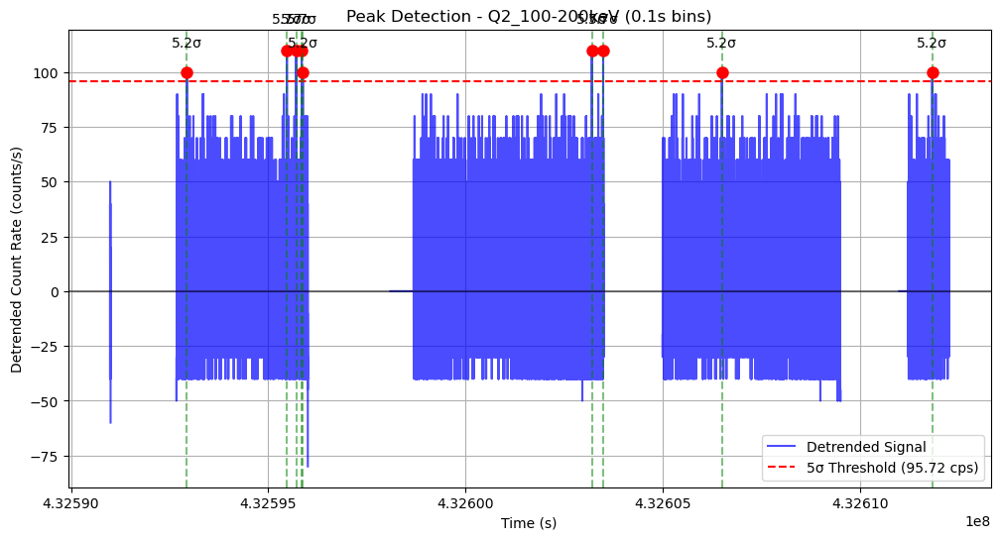

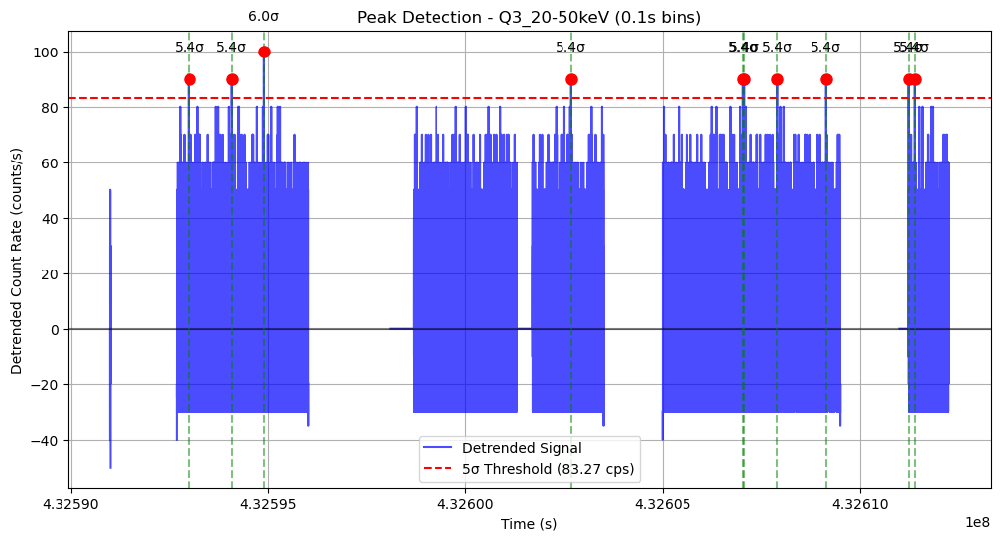

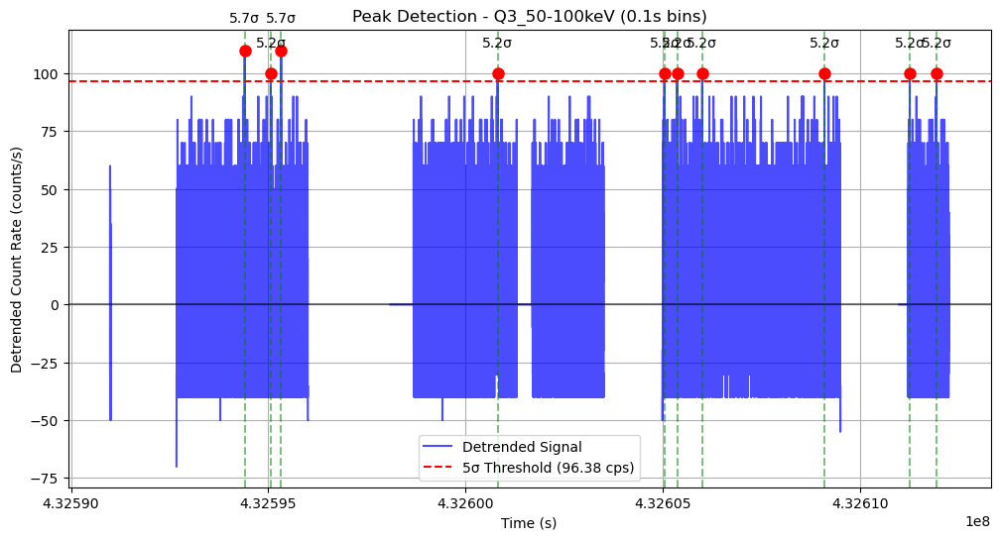

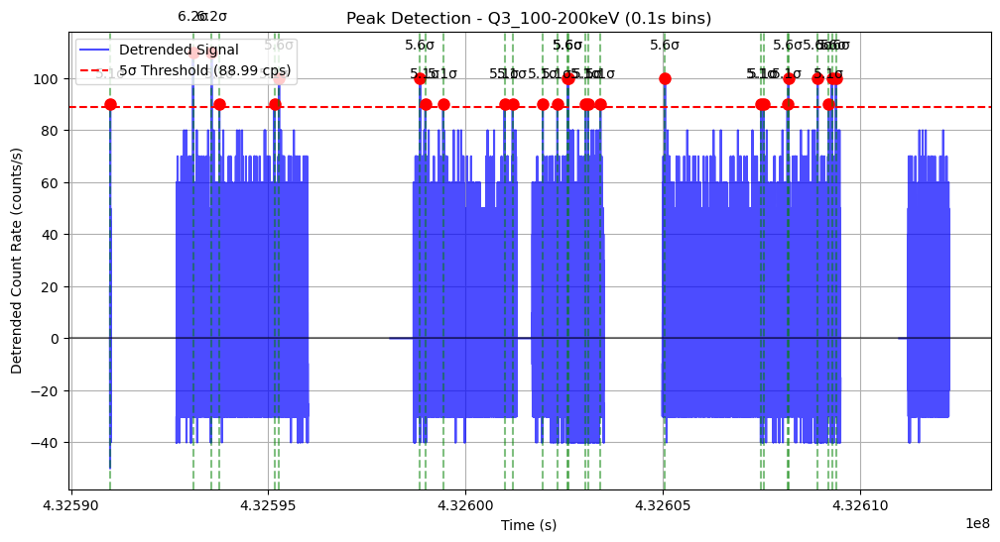

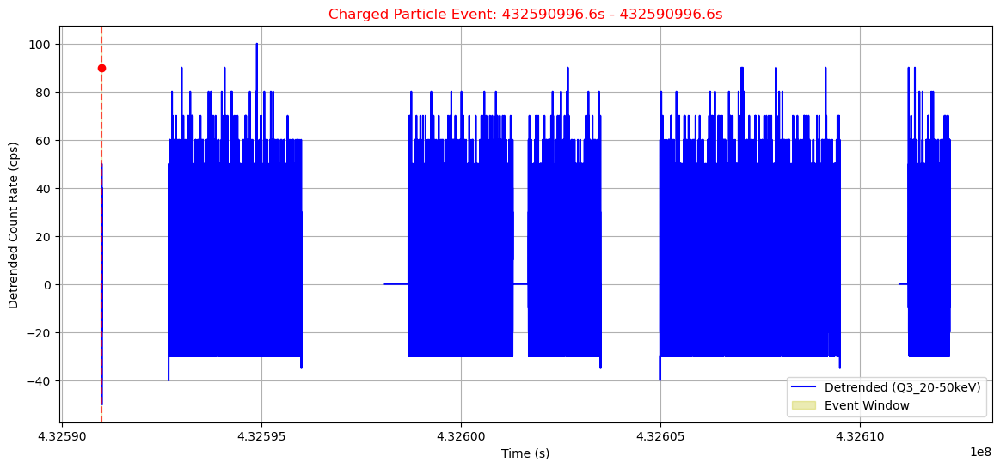

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



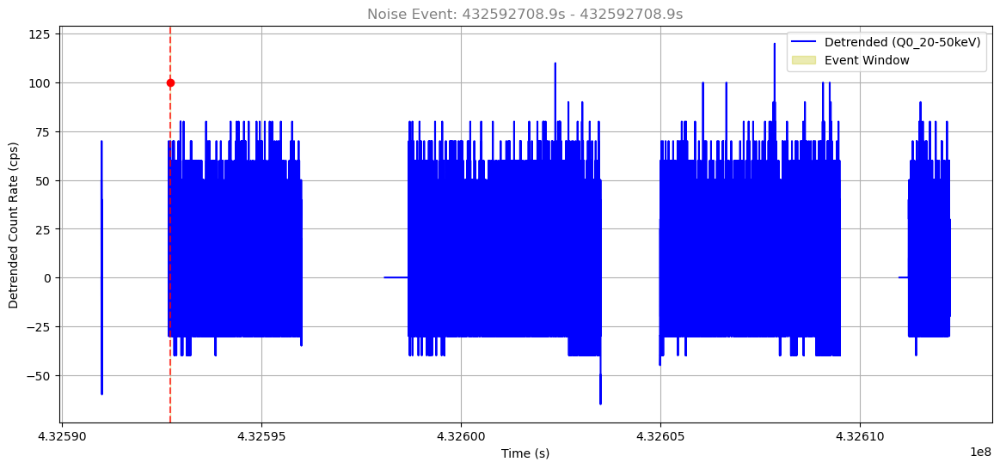

Classification: Noise
Reason: Post-SAA recovery period (100s after SAA exit)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



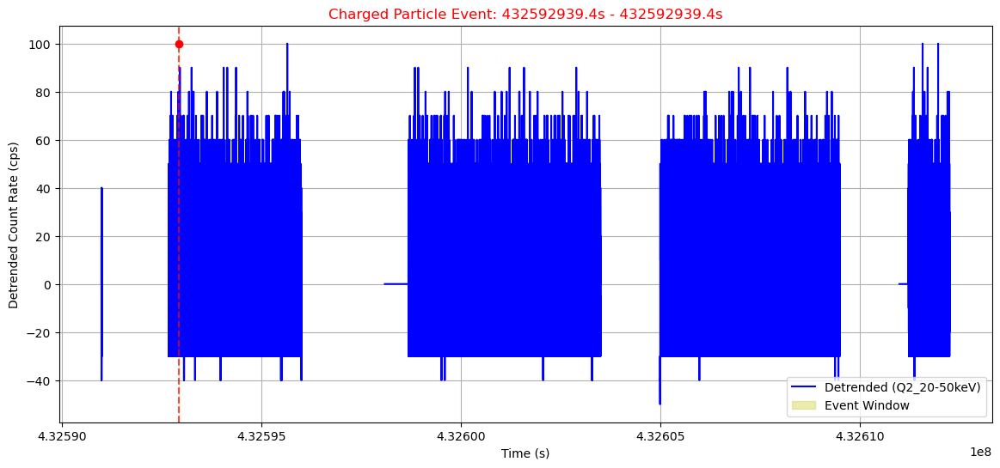

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.2σ



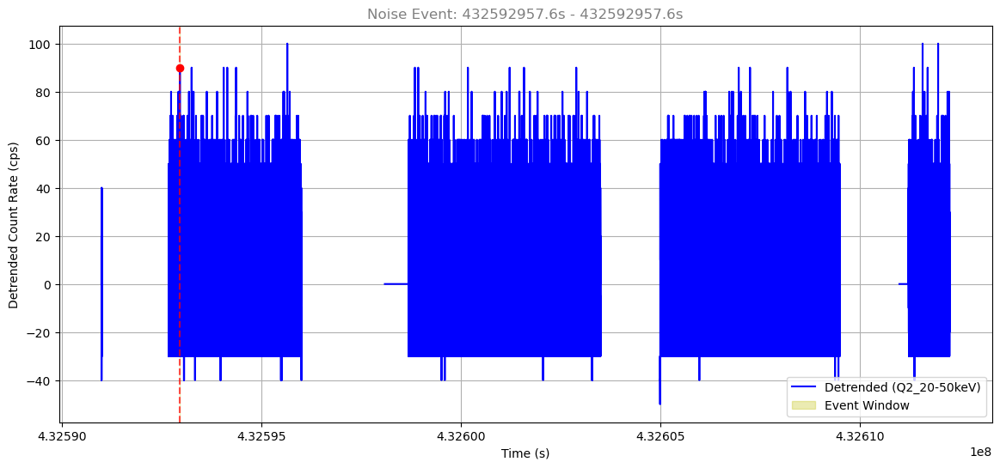

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



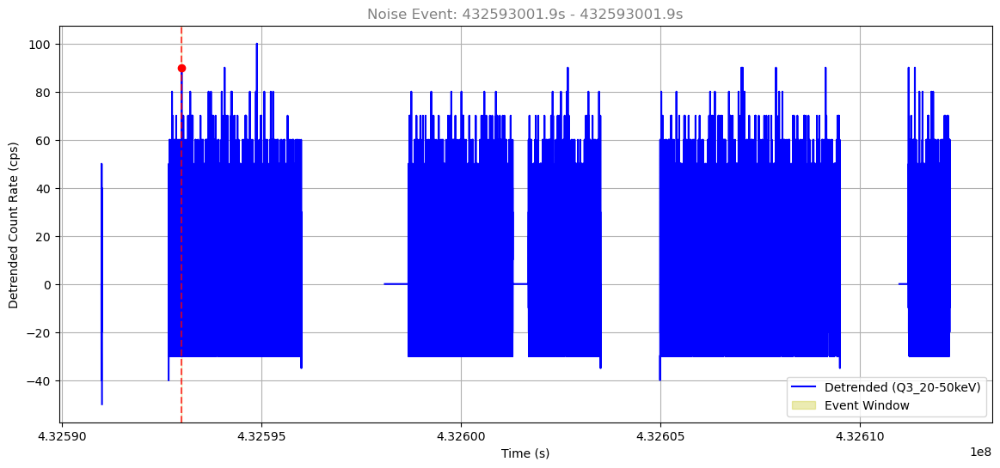

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



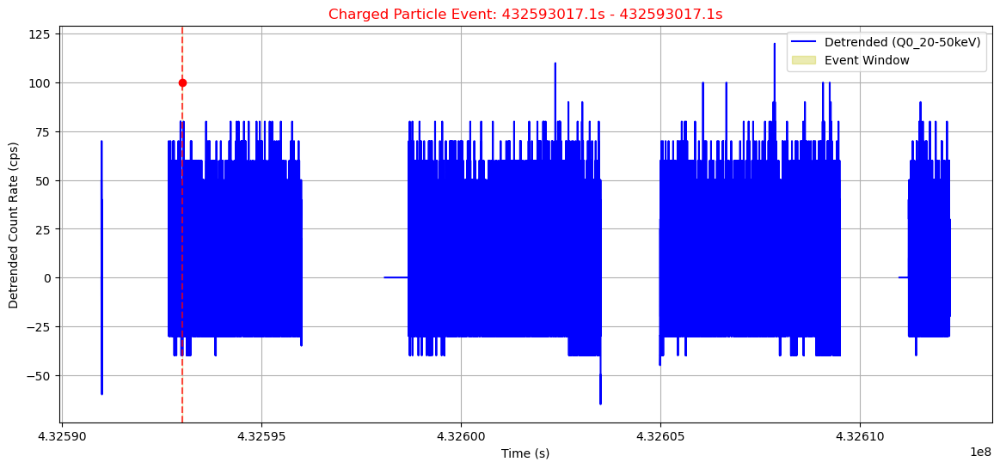

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.3σ



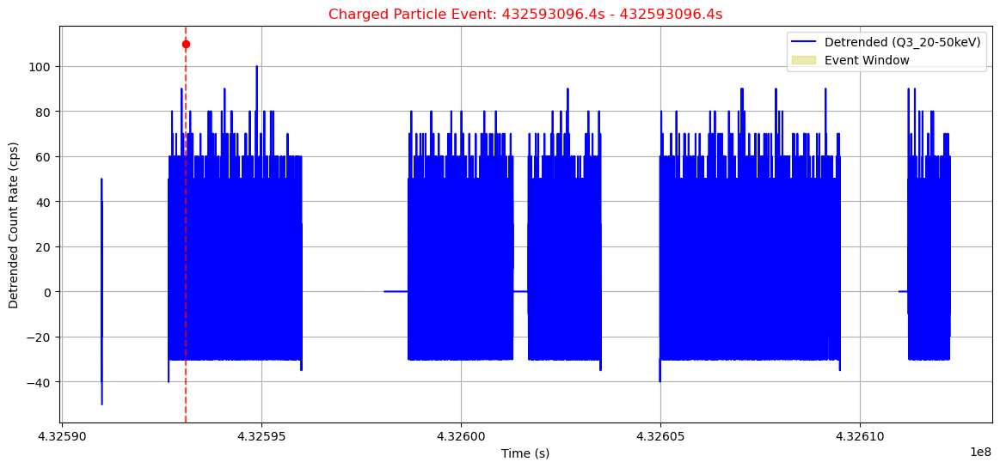

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 6.2σ



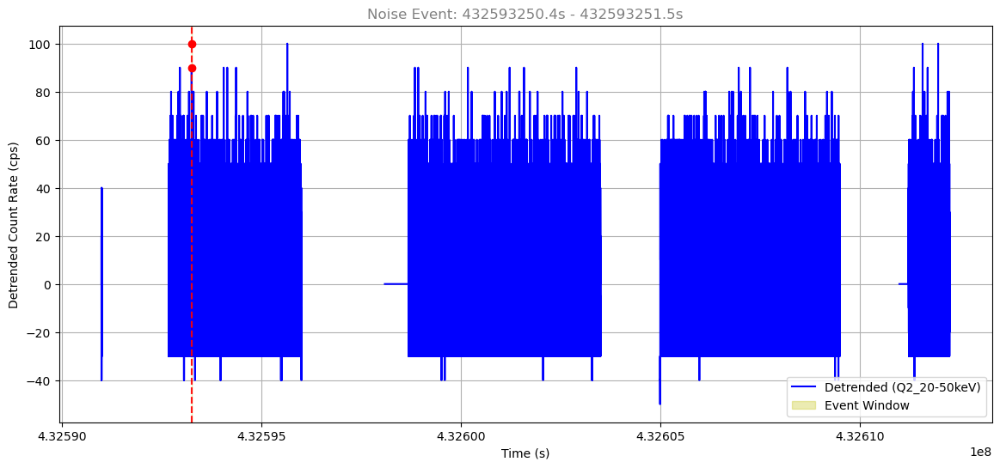

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 1.08s
Quadrants: Q2
Energy Ranges: 20-50keV, 50-100keV
Max Significance: 5.1σ



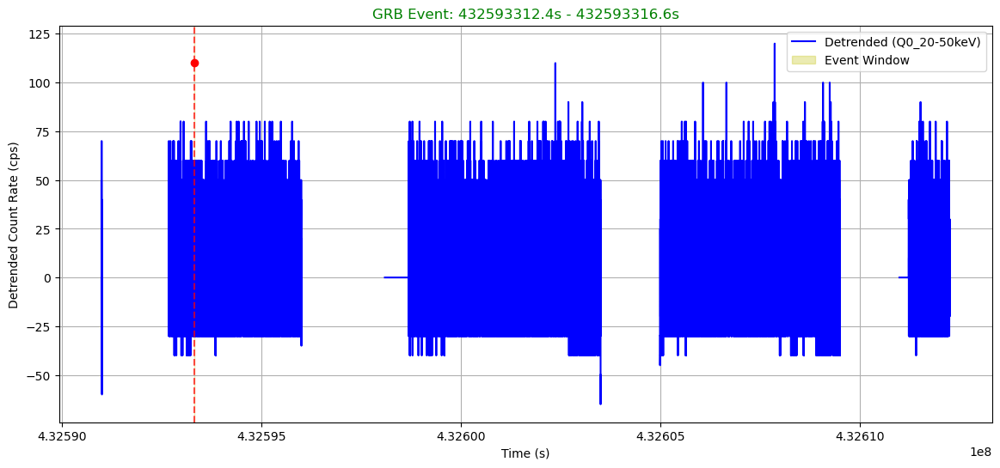

Classification: GRB
Reason: Multi-quadrant + multi-energy + max significance 5.8σ
Duration: 4.20s
Quadrants: Q0, Q1
Energy Ranges: 100-200keV, 20-50keV
Max Significance: 5.8σ



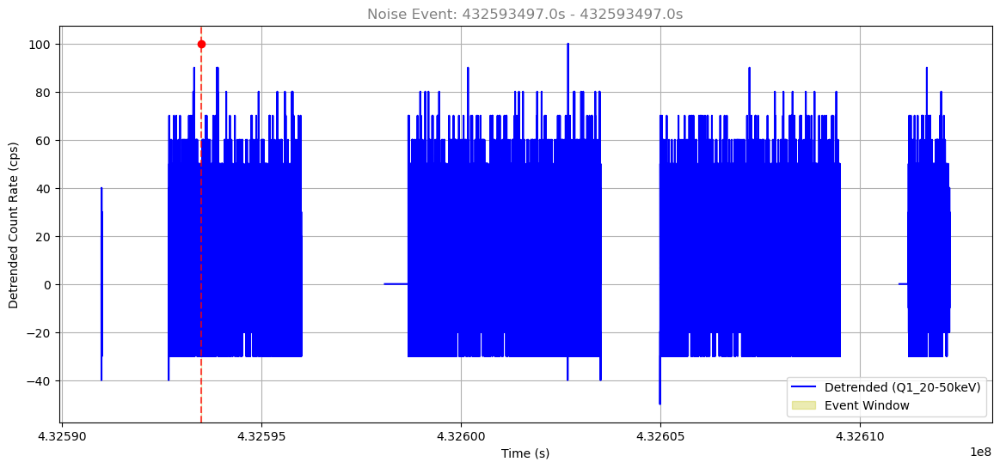

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



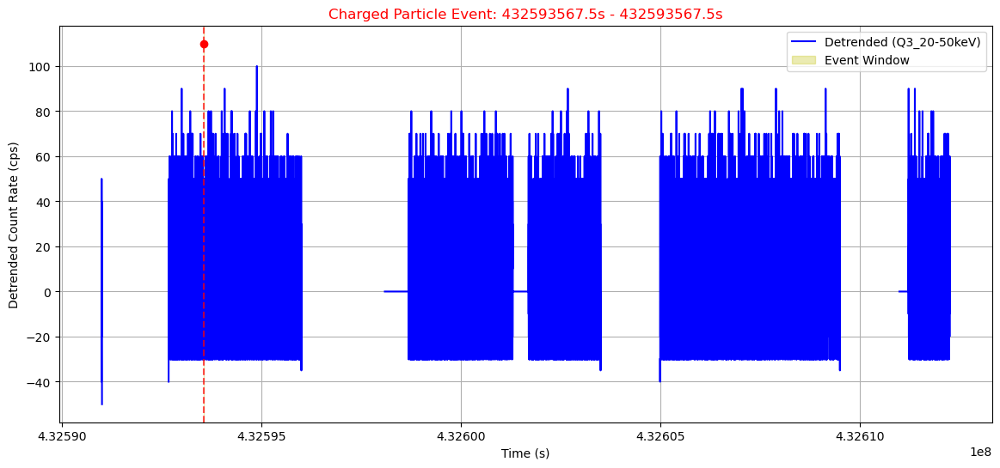

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 6.2σ



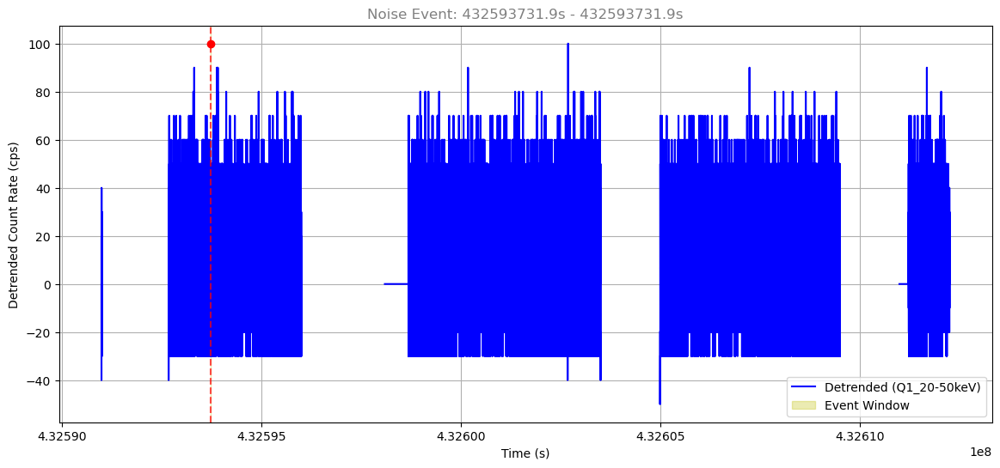

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



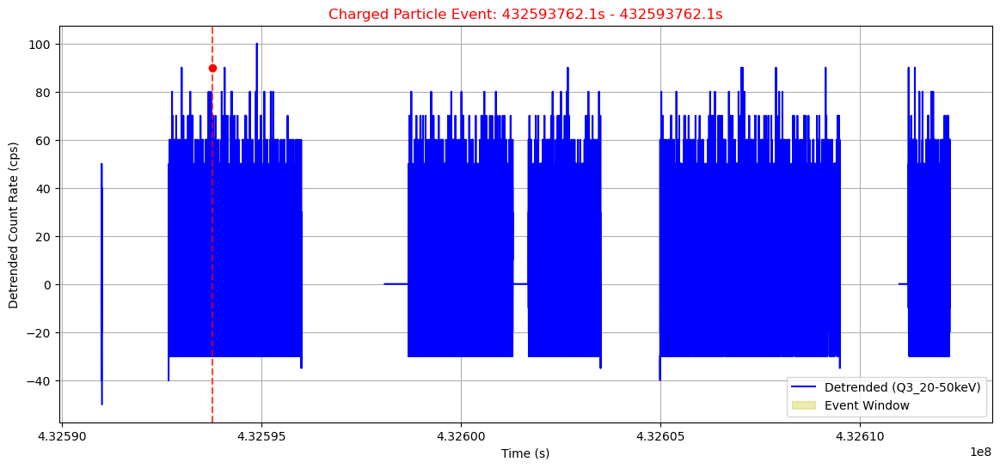

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



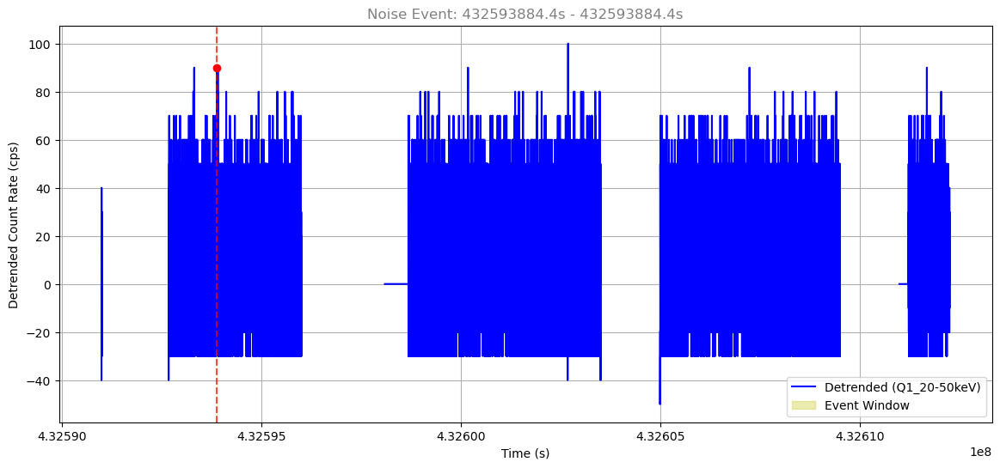

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 20-50keV
Max Significance: 5.4σ



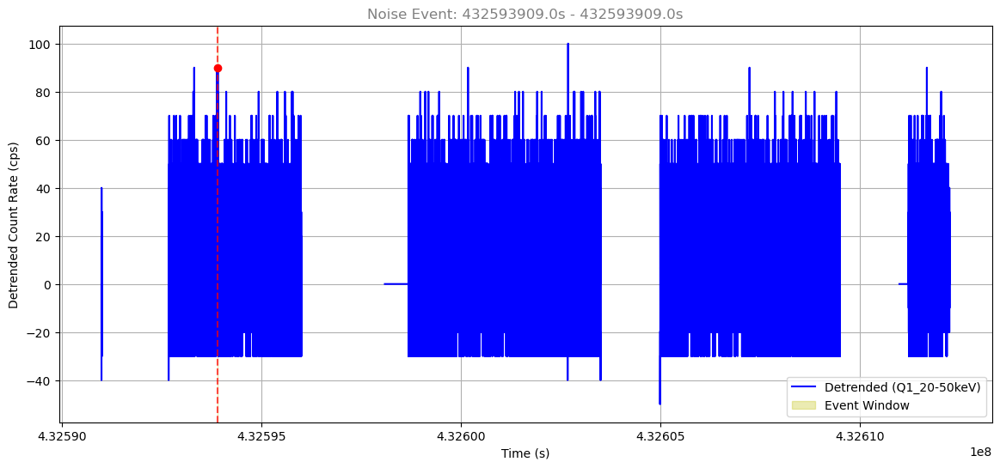

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 20-50keV
Max Significance: 5.4σ



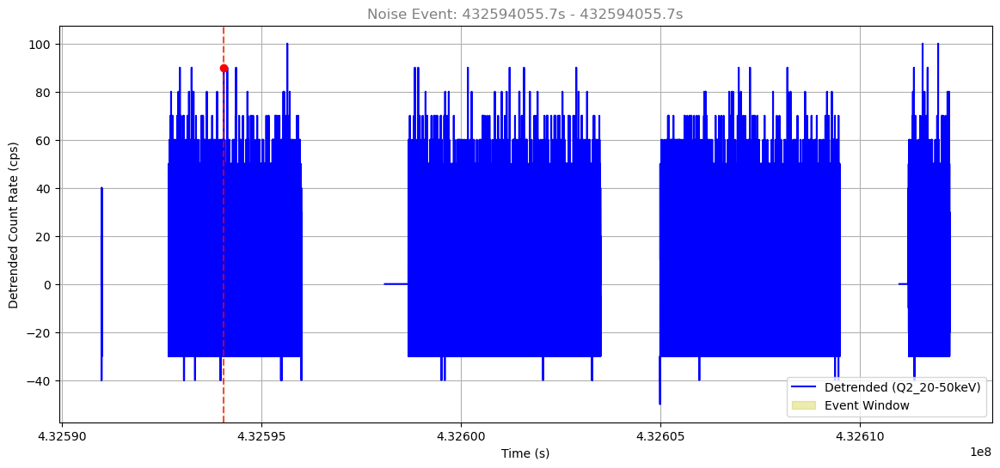

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



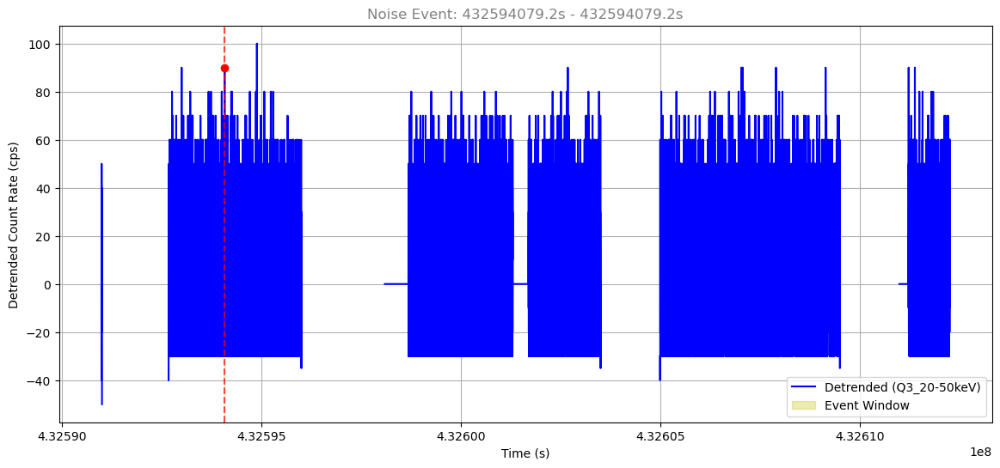

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



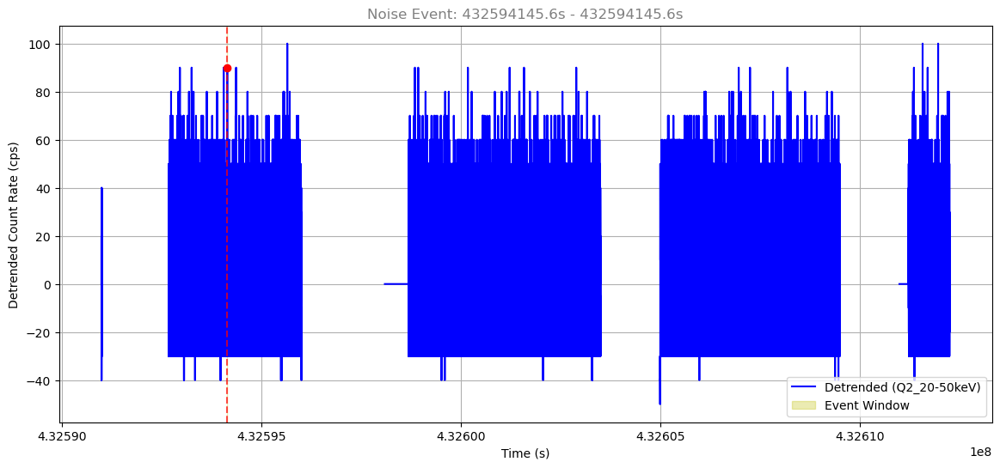

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



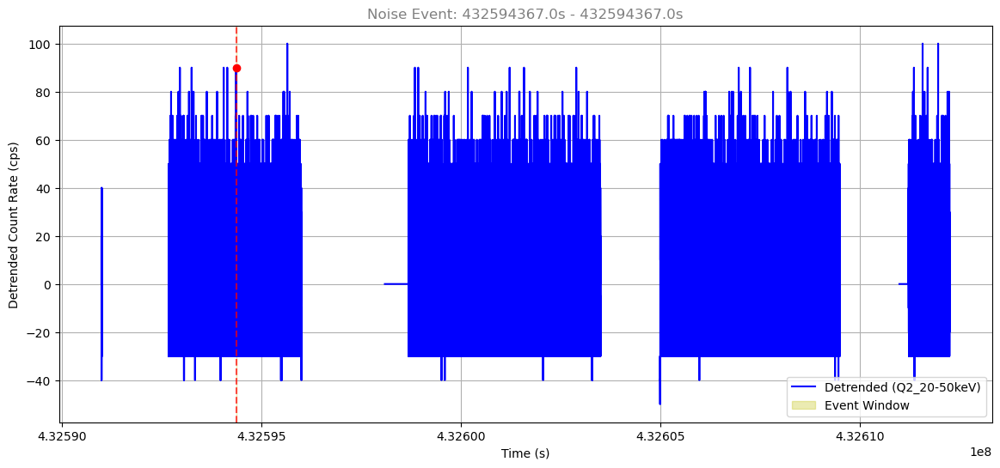

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



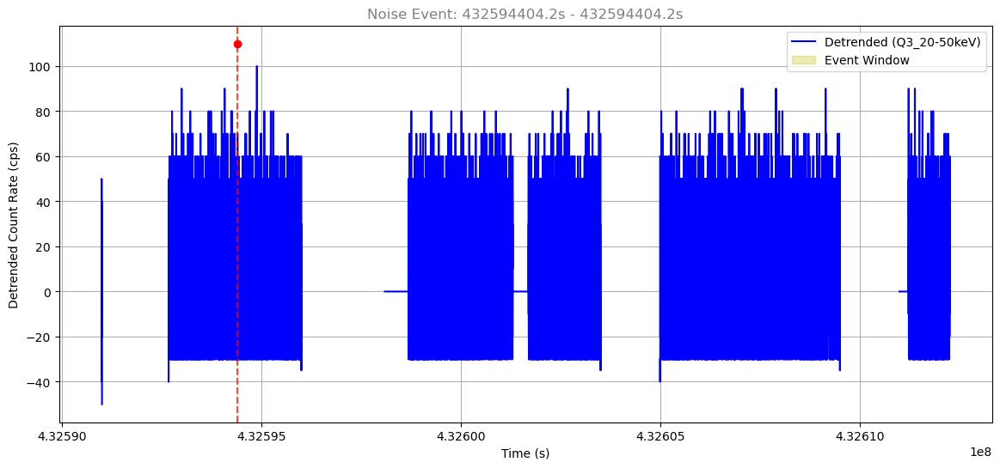

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.7σ



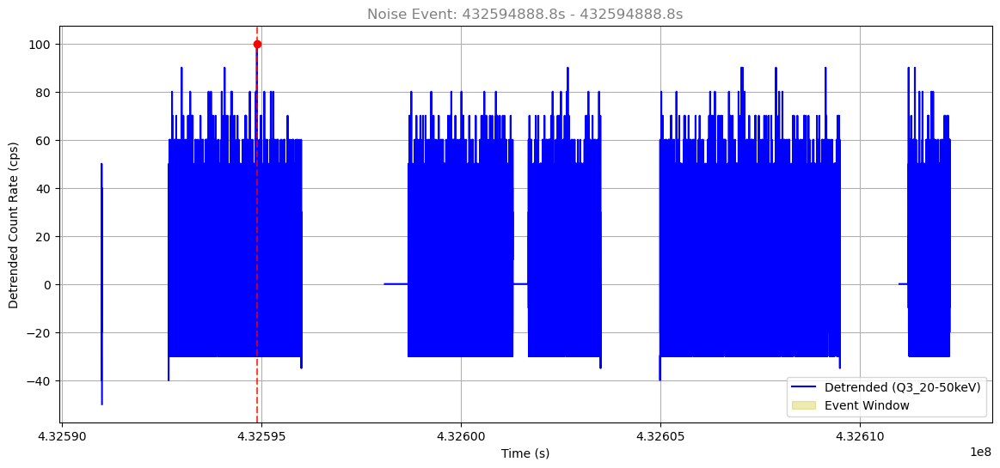

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 6.0σ



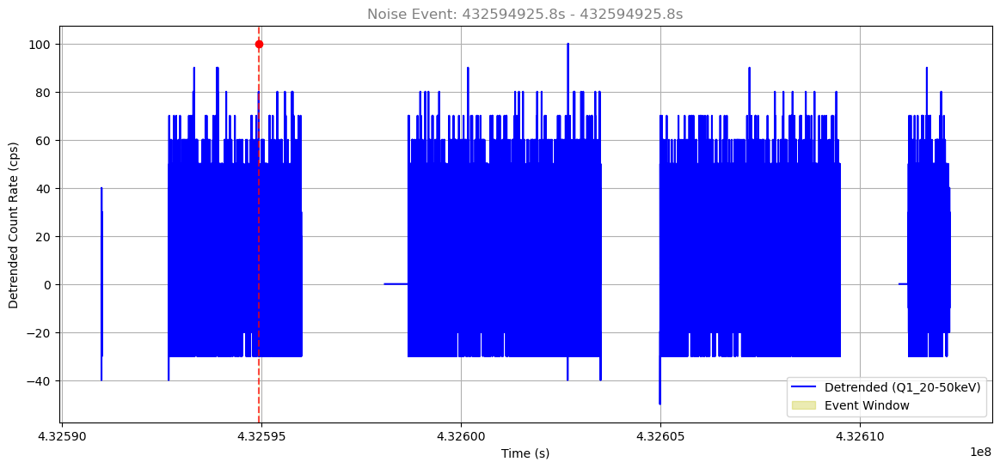

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



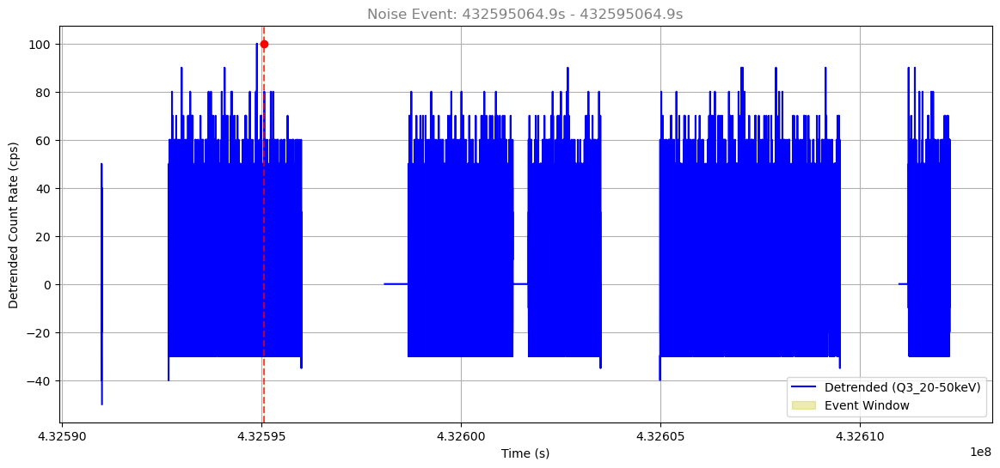

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



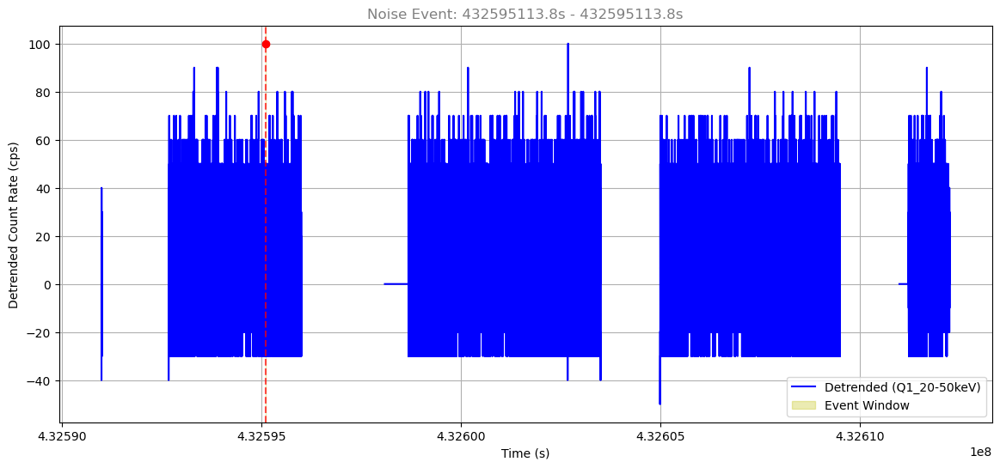

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



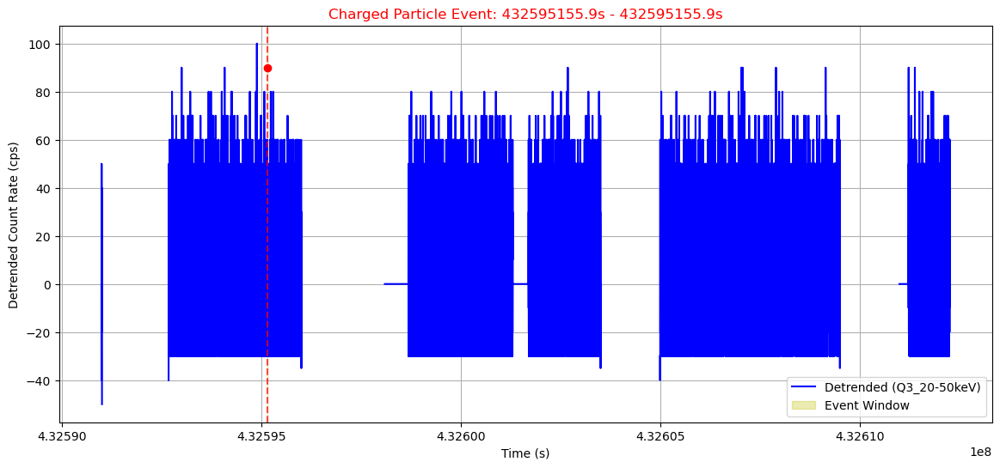

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



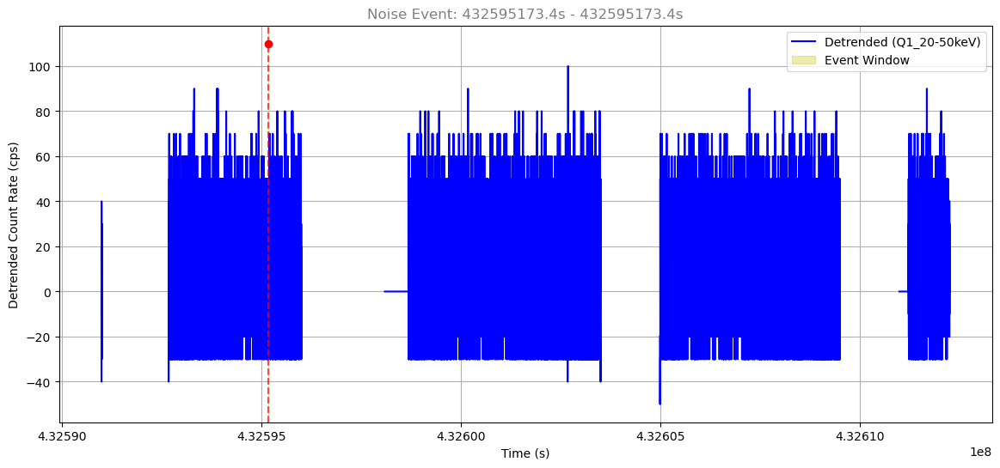

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.7σ



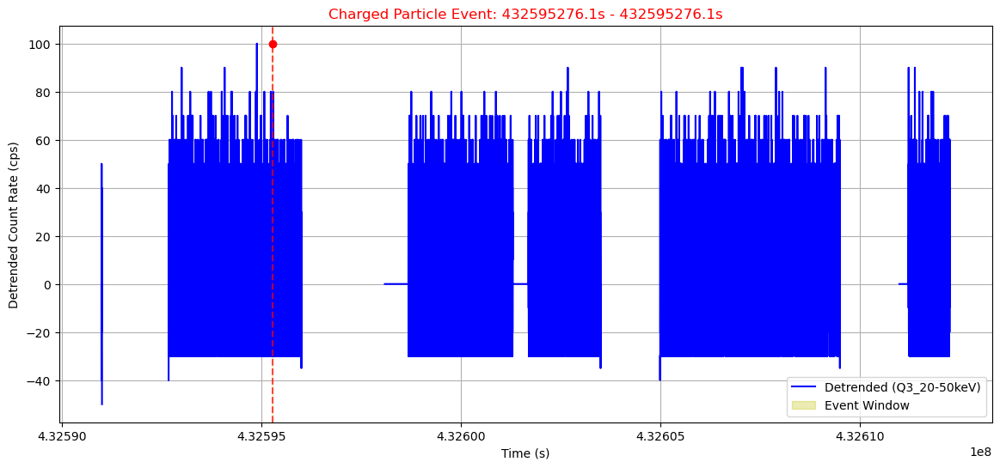

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



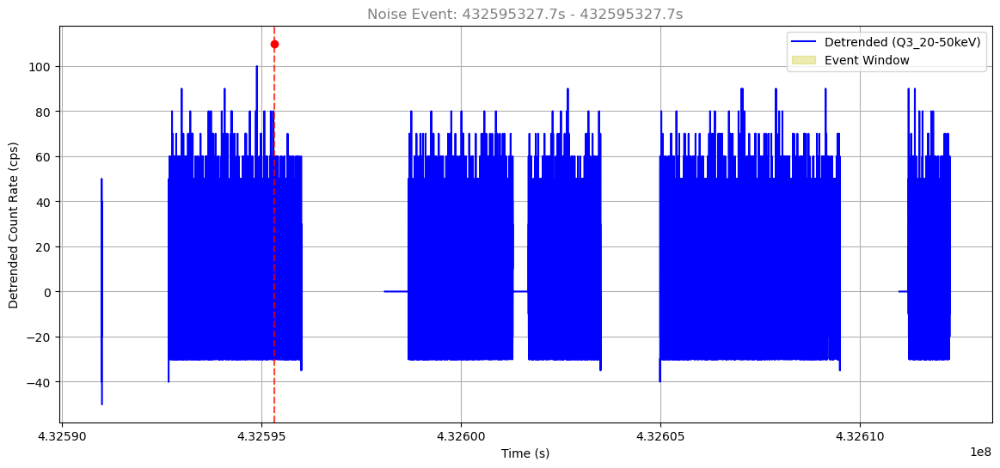

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.7σ



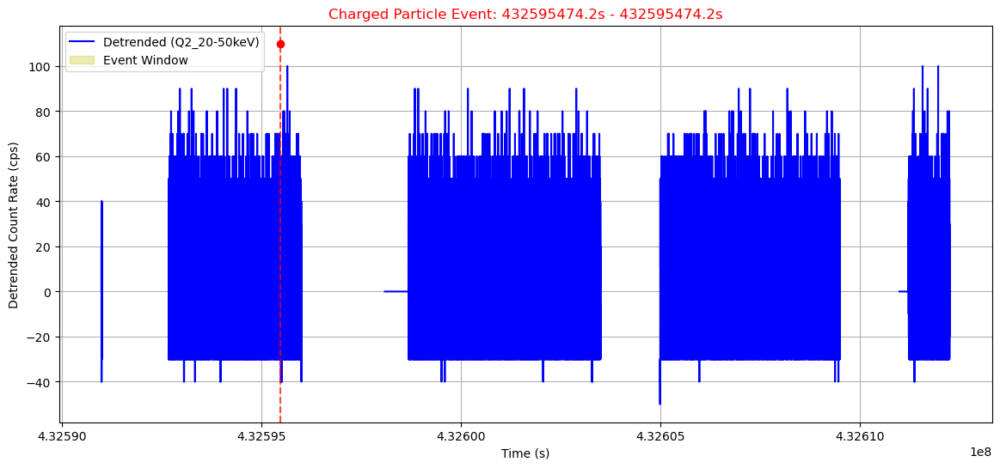

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.7σ



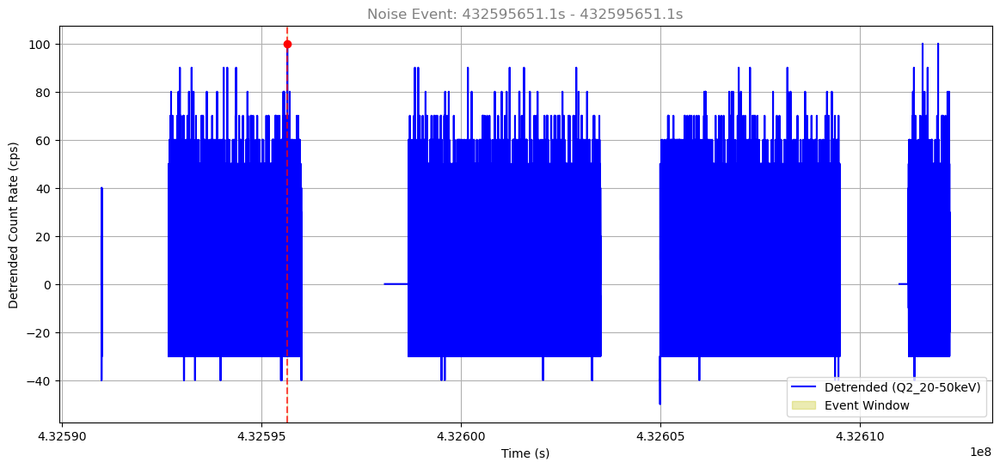

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.7σ



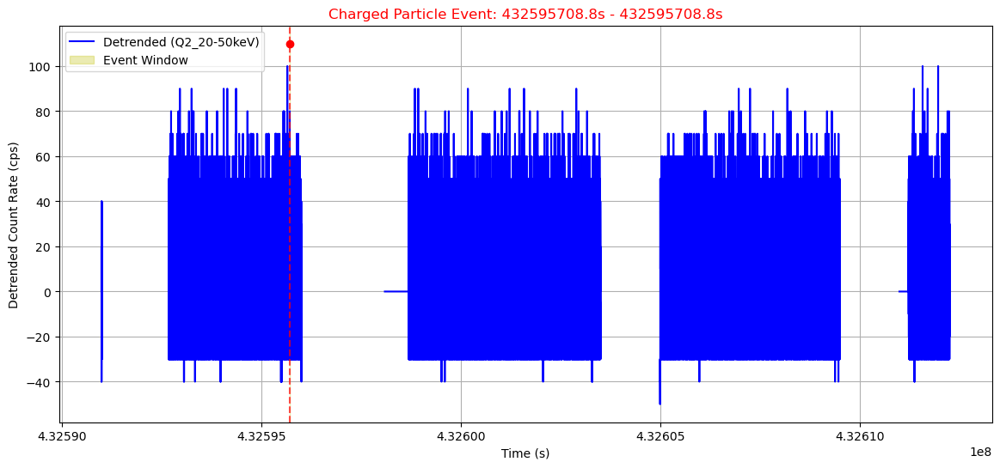

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.7σ



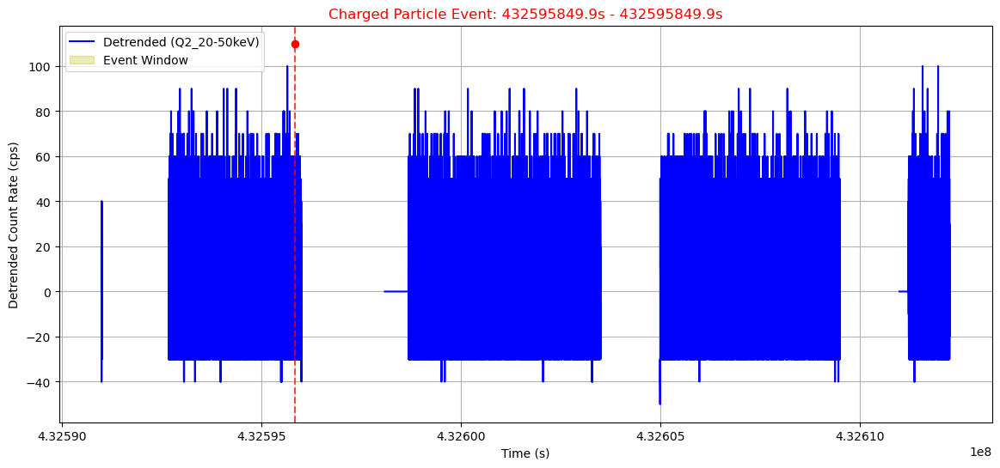

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.7σ



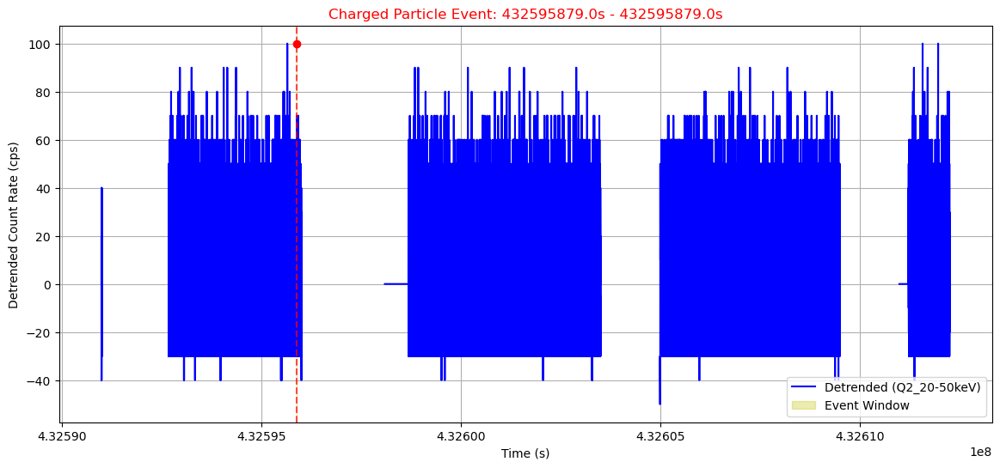

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.2σ



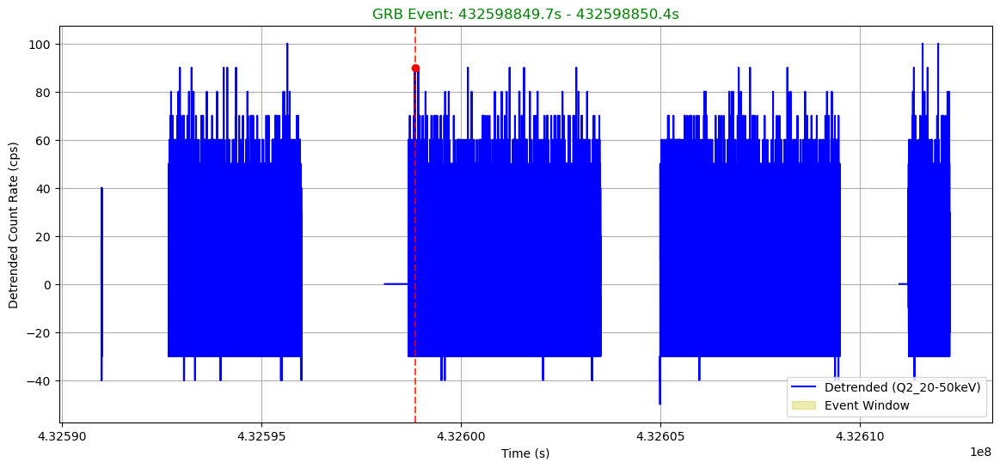

Classification: GRB
Reason: Multi-quadrant + multi-energy + max significance 5.6σ
Duration: 0.76s
Quadrants: Q2, Q3
Energy Ranges: 100-200keV, 20-50keV
Max Significance: 5.6σ



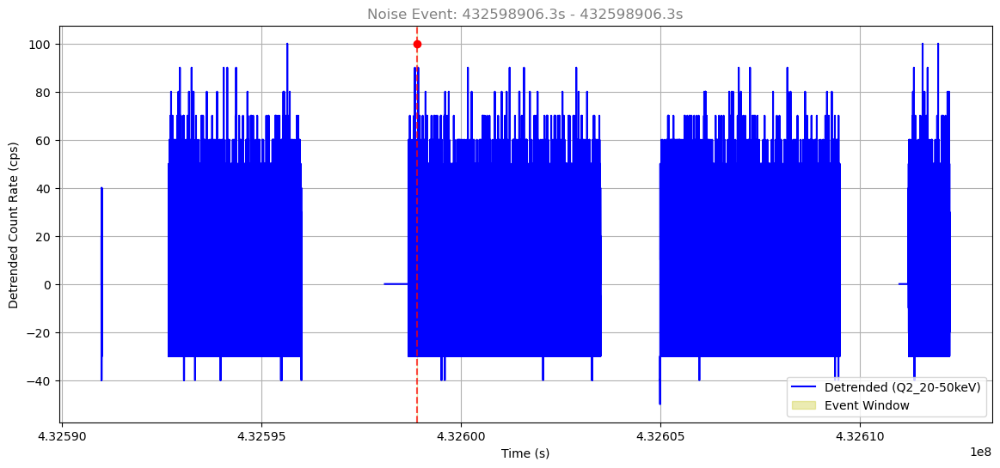

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



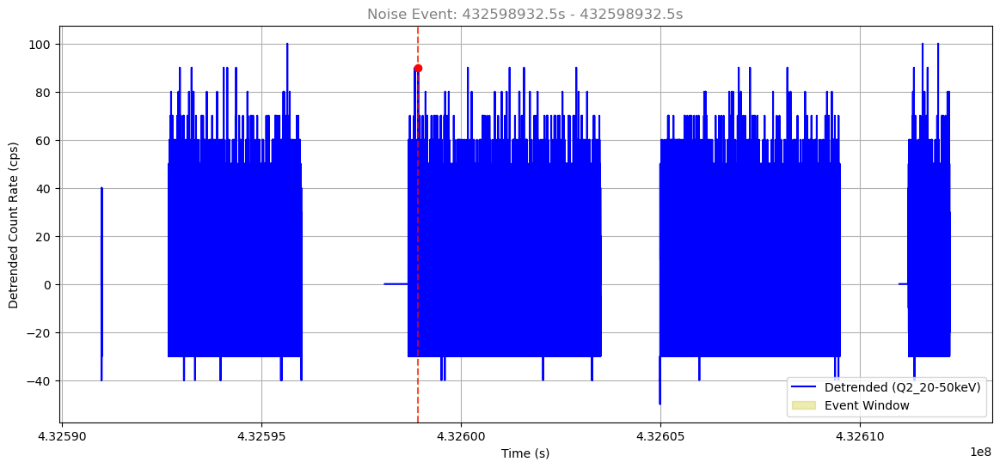

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



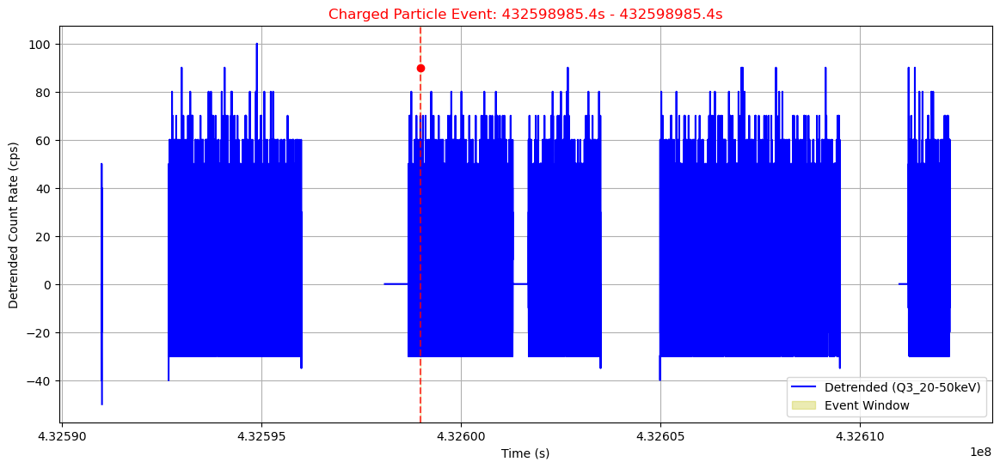

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



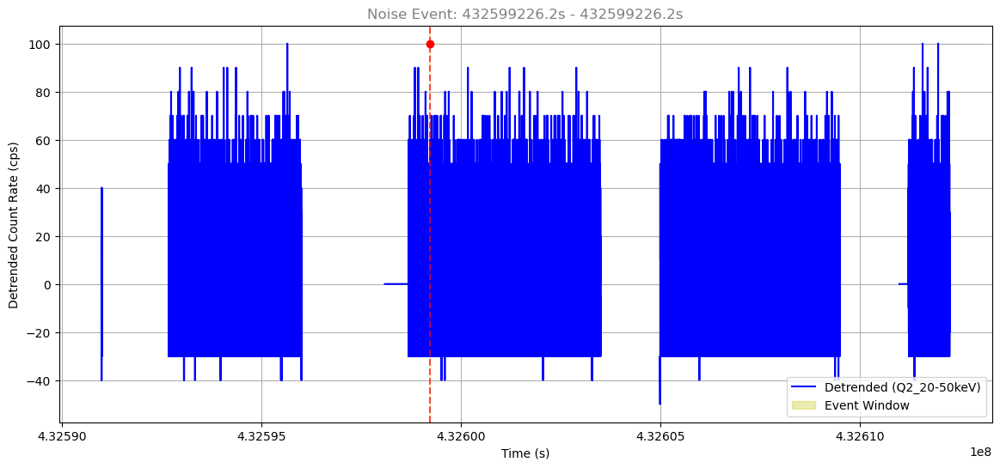

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



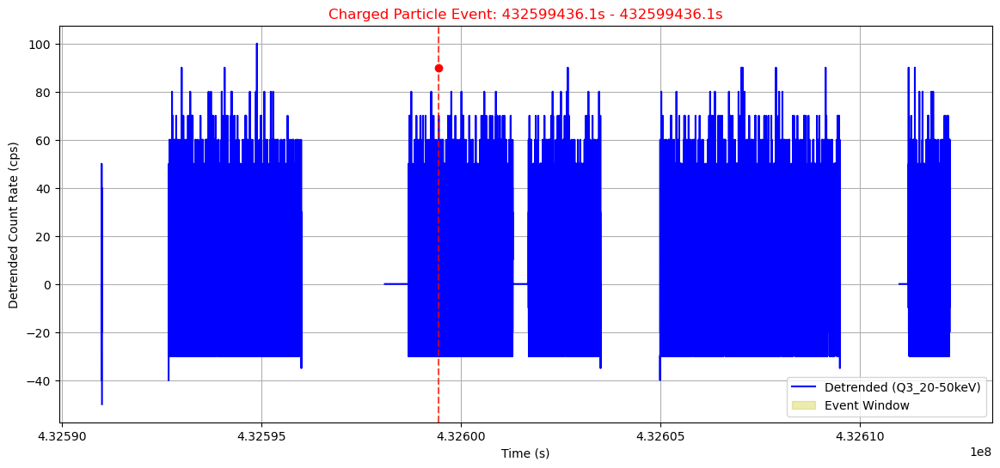

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



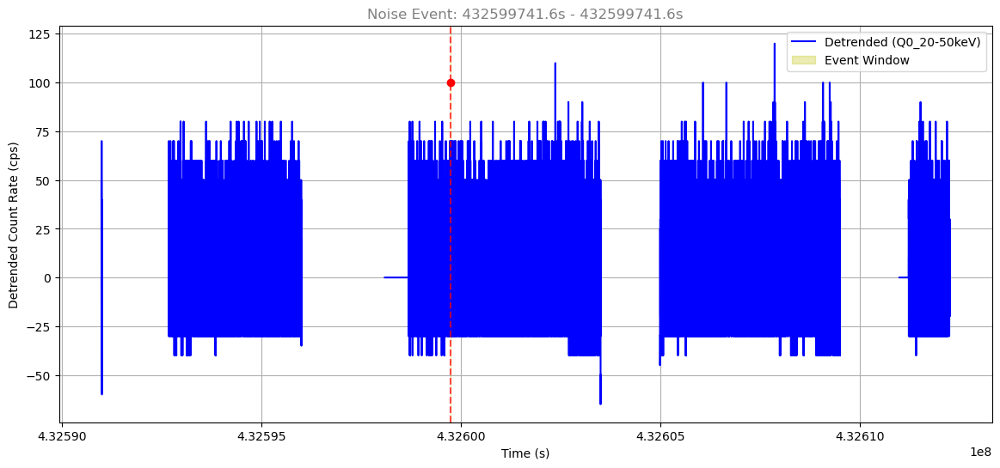

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



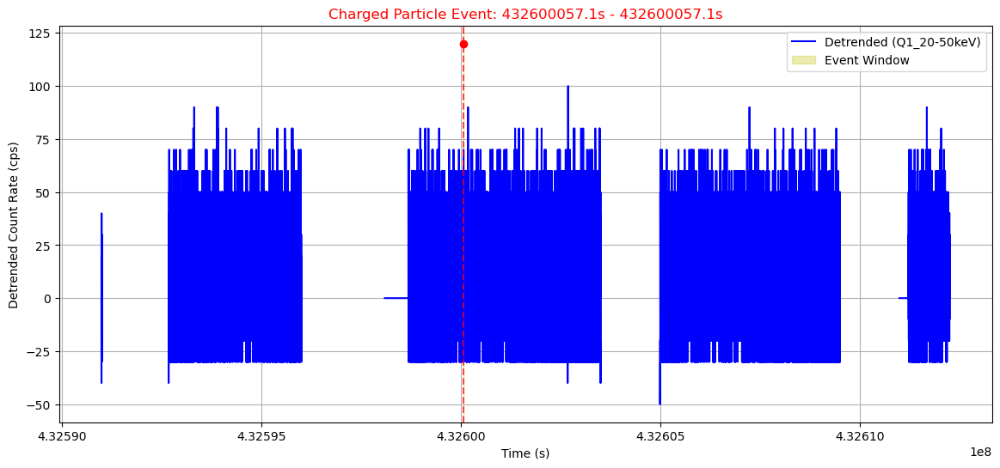

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 6.0σ



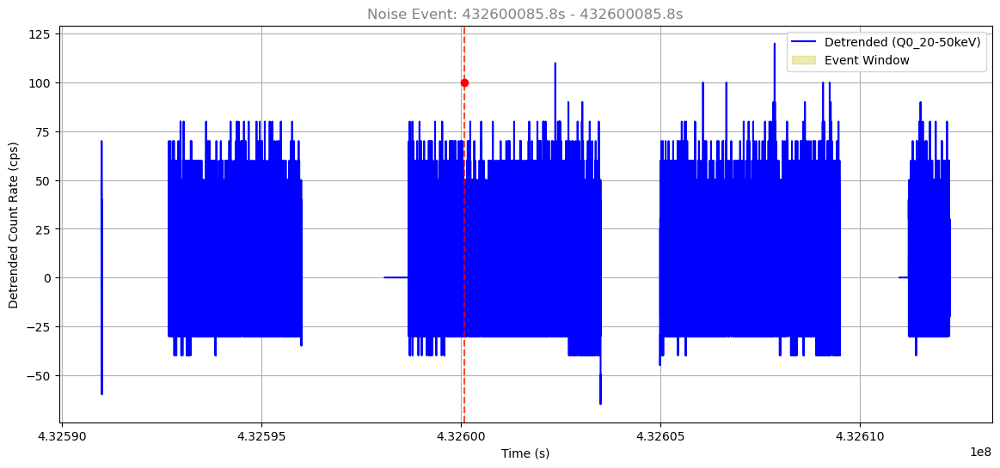

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



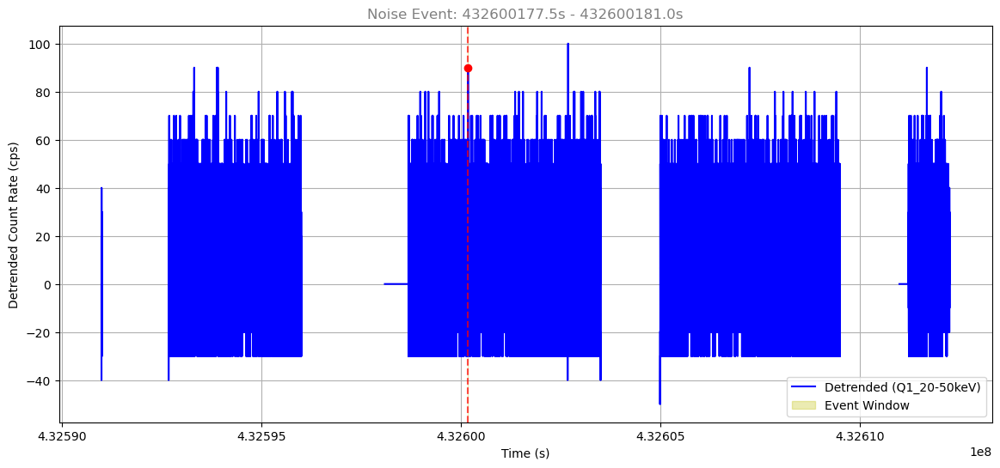

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 3.52s
Quadrants: Q1, Q2
Energy Ranges: 20-50keV
Max Significance: 5.4σ



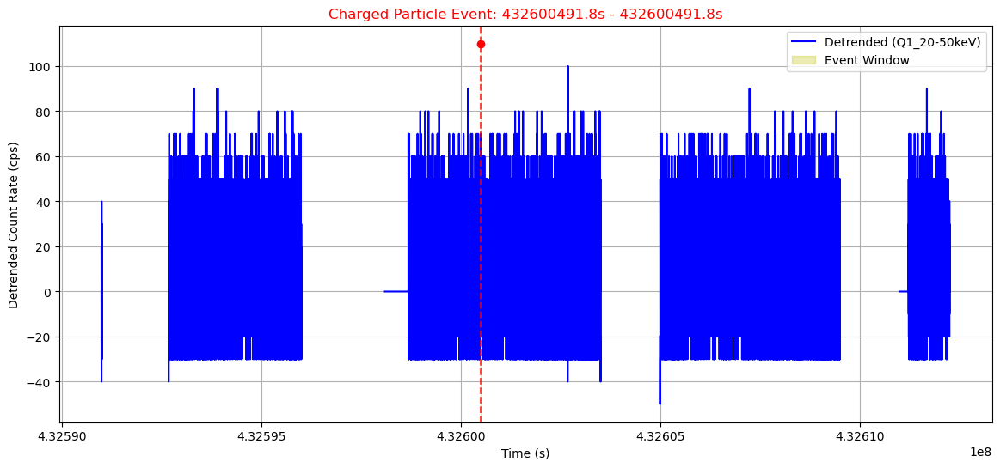

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 5.5σ



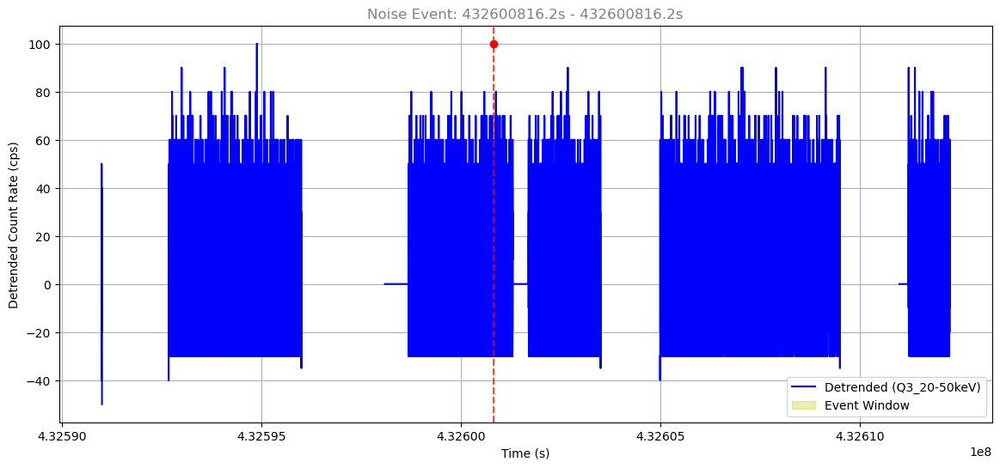

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



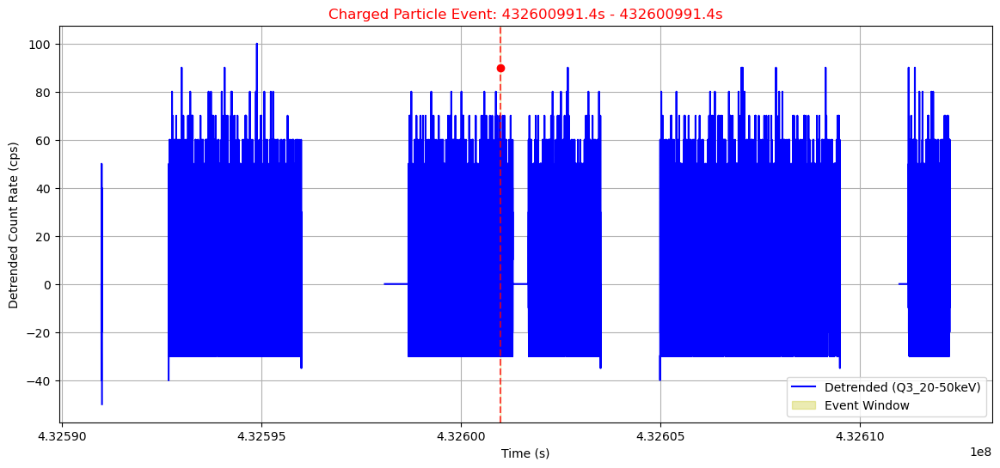

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



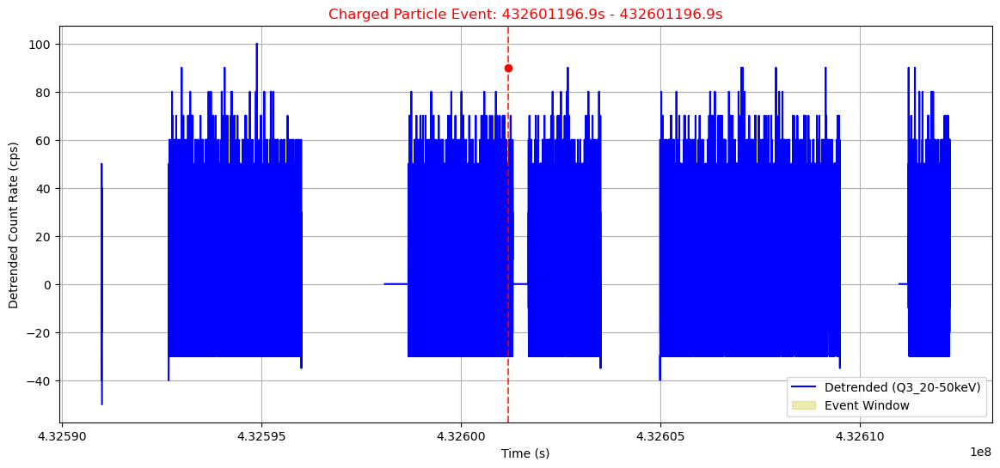

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



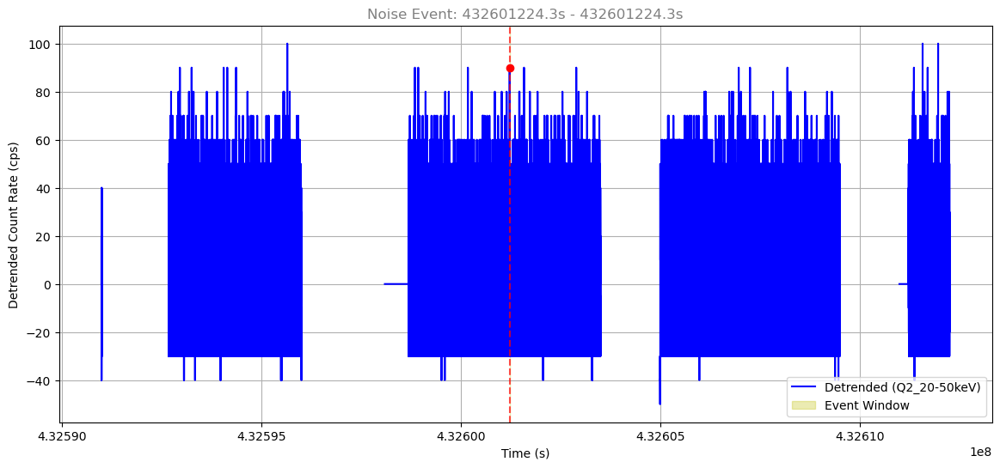

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



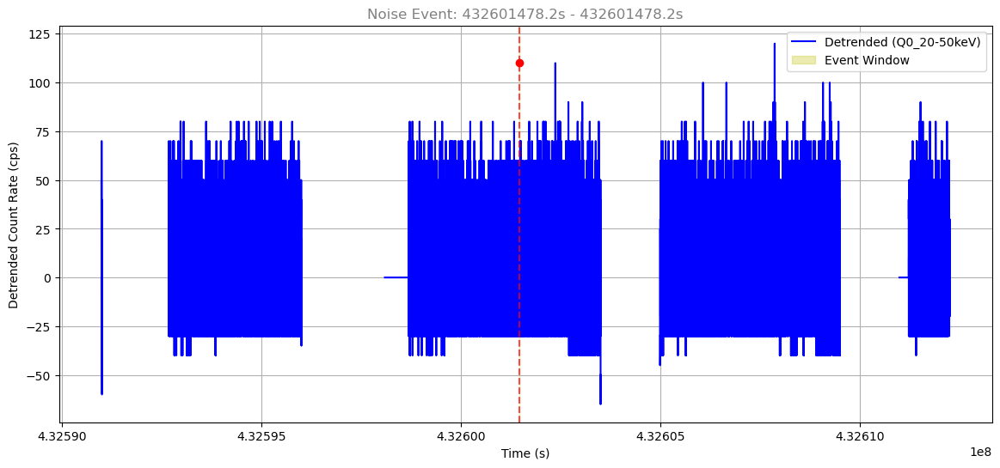

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.5σ



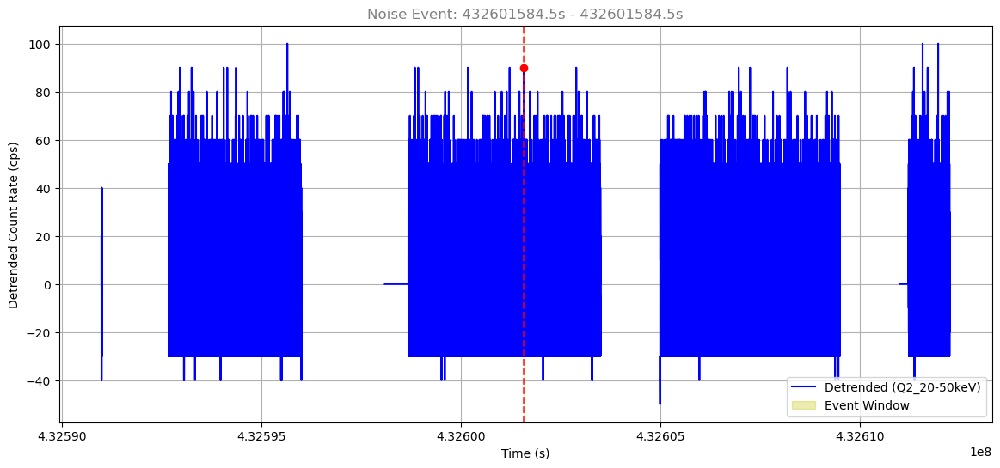

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



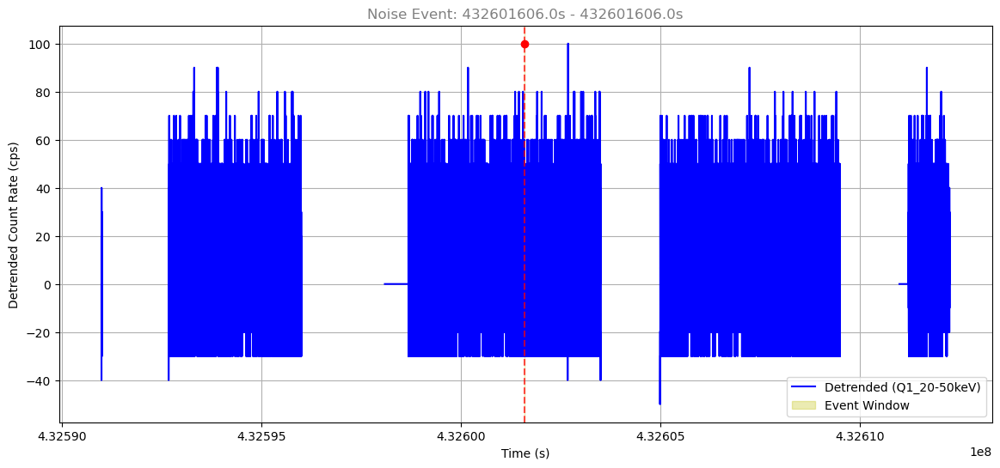

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



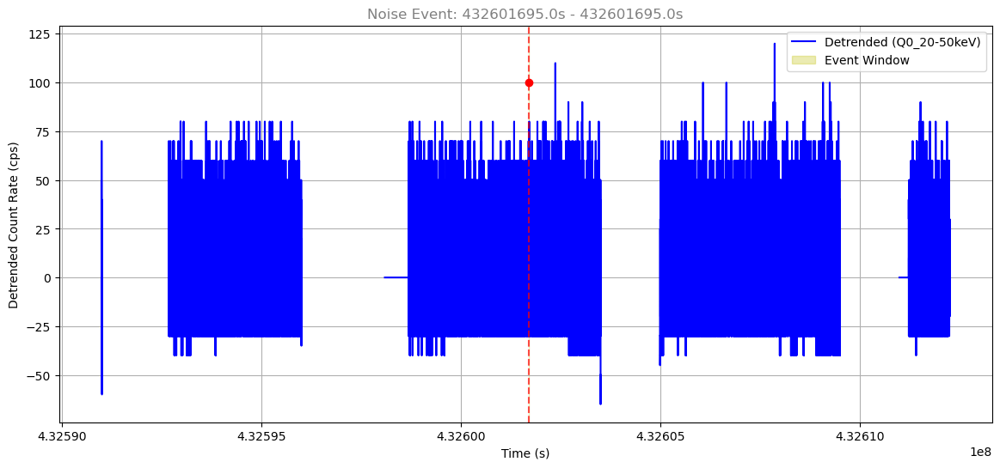

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



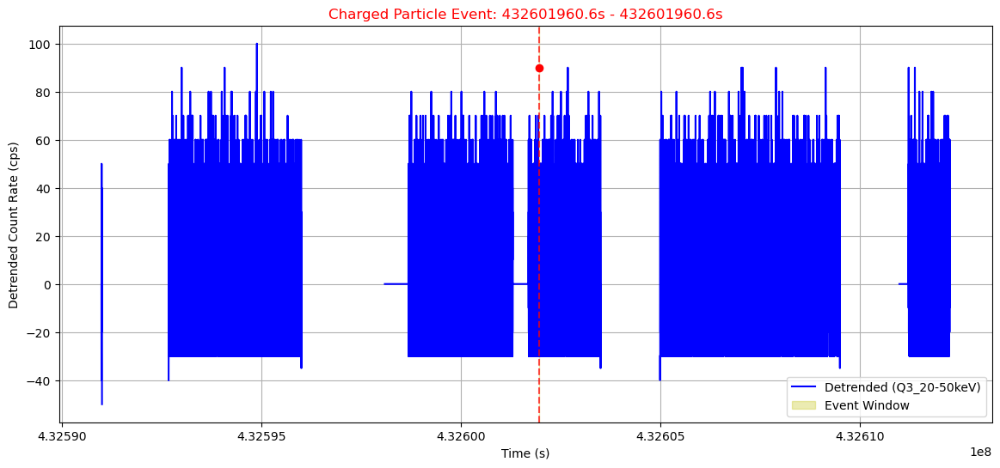

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



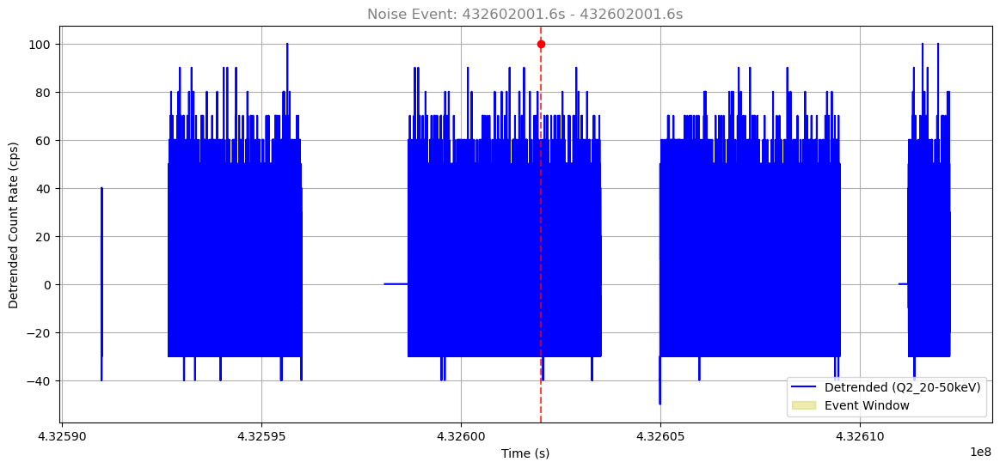

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



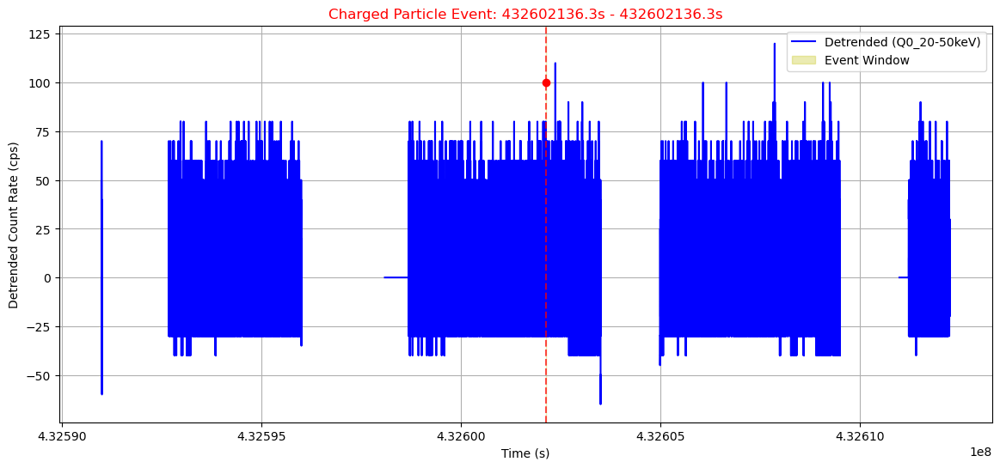

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.3σ



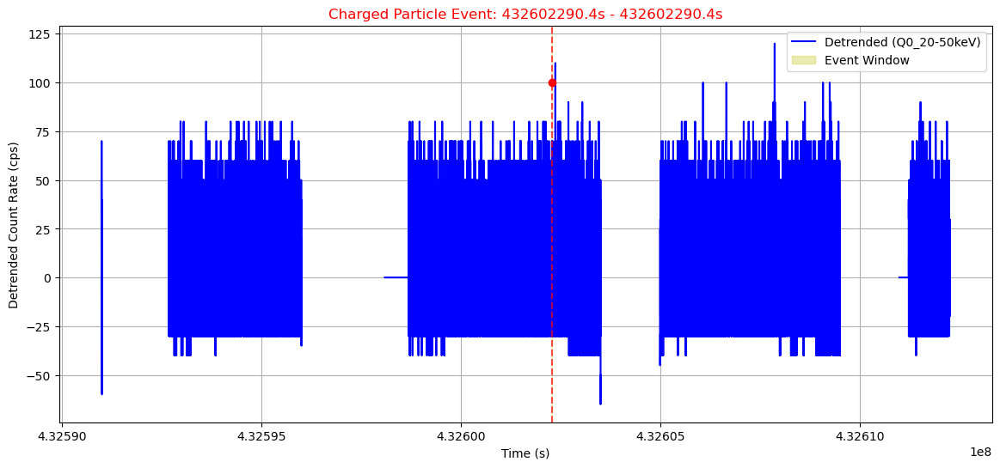

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.3σ



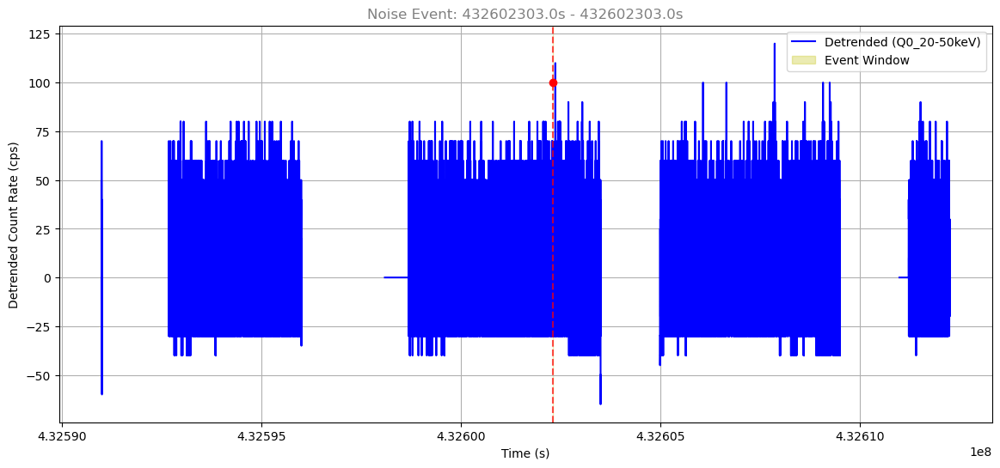

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



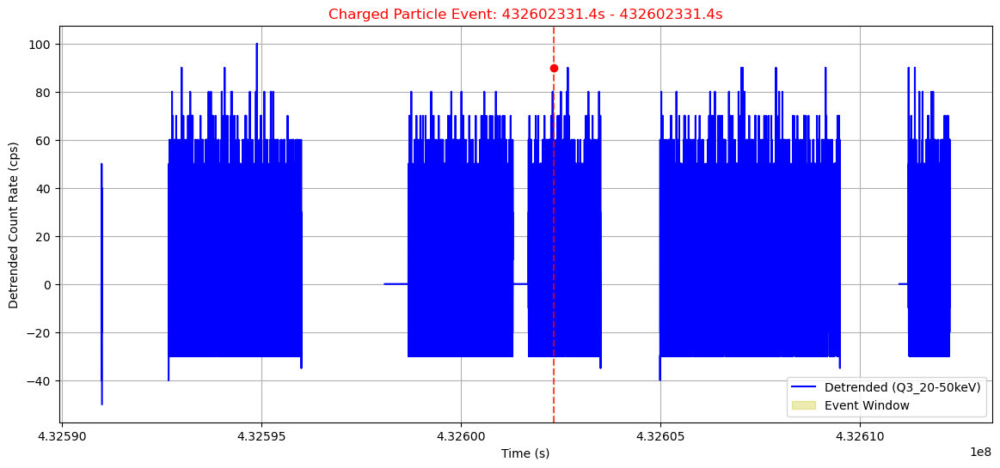

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



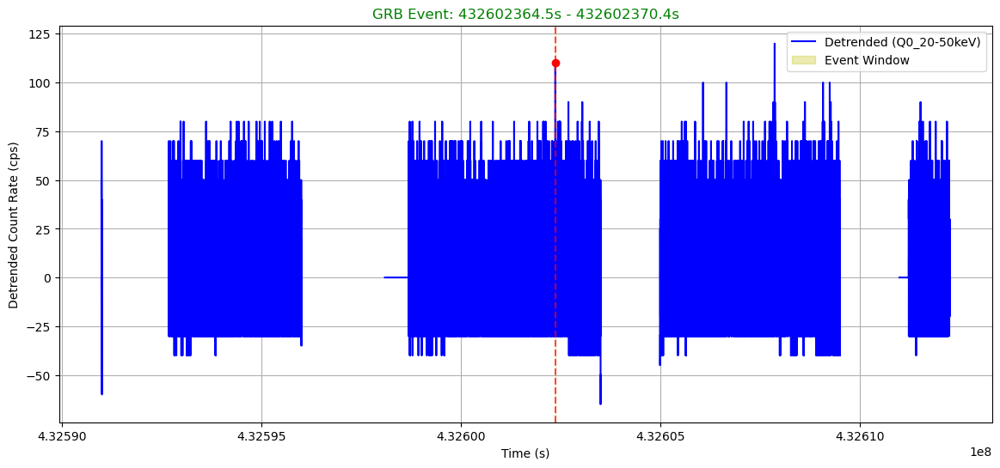

Classification: GRB
Reason: Multi-quadrant + multi-energy + max significance 6.1σ
Duration: 5.91s
Quadrants: Q0, Q1
Energy Ranges: 20-50keV, 50-100keV
Max Significance: 6.1σ



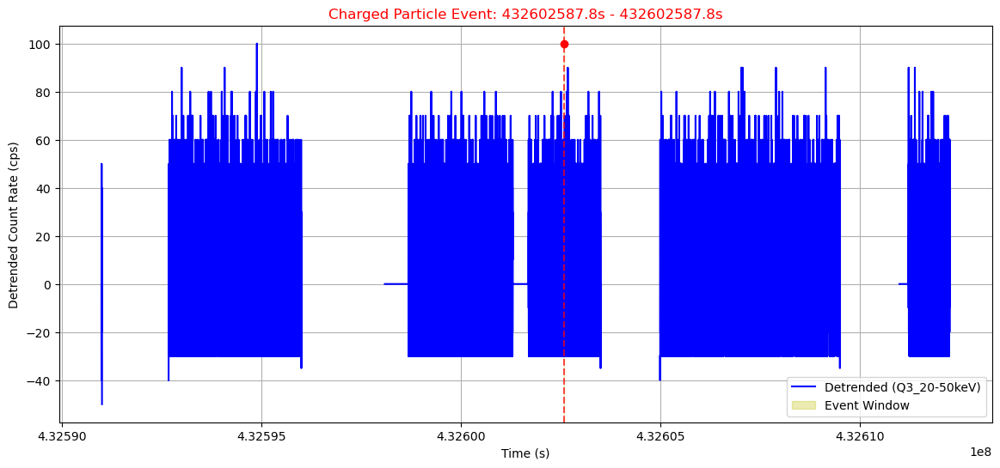

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



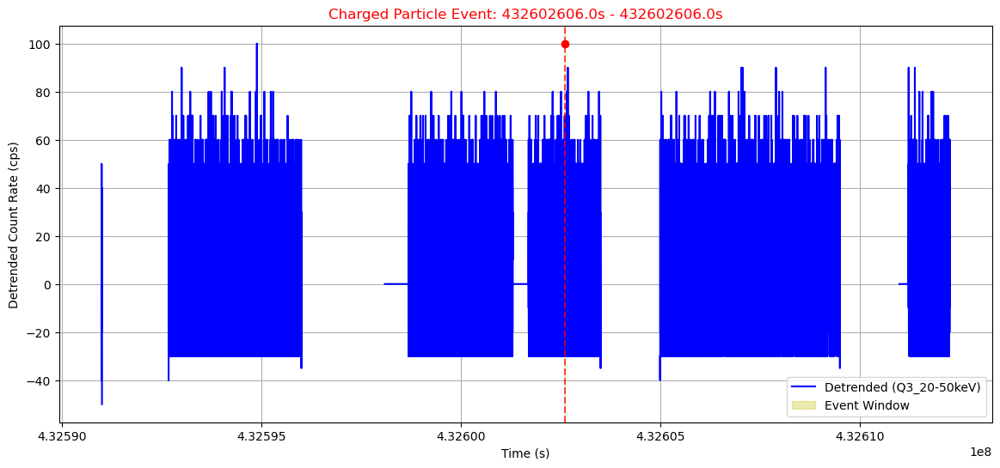

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



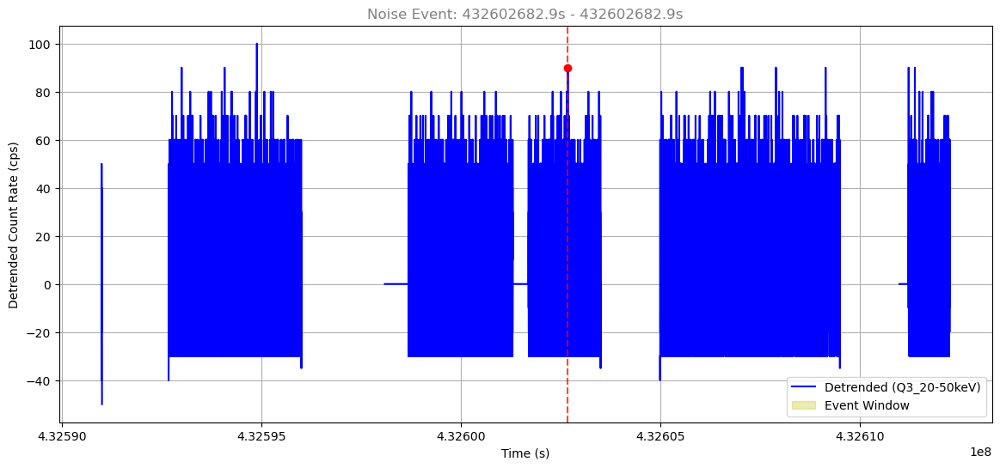

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



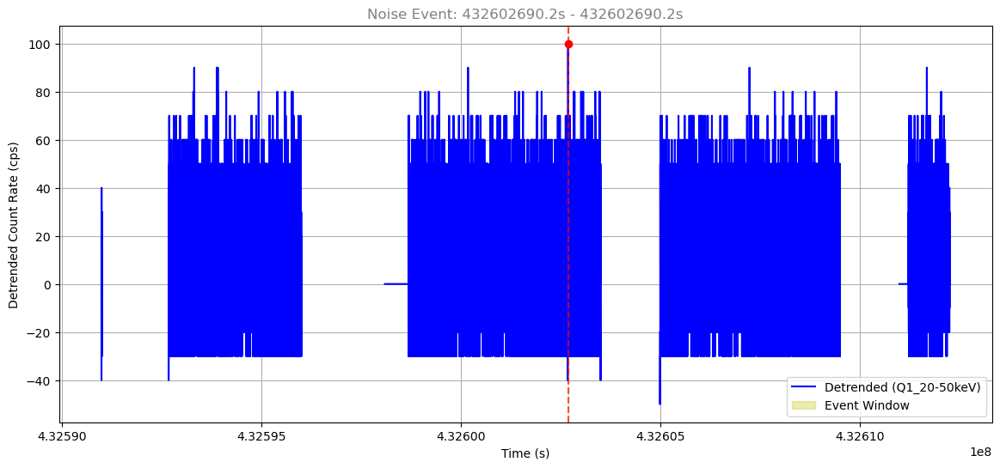

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 20-50keV
Max Significance: 6.0σ



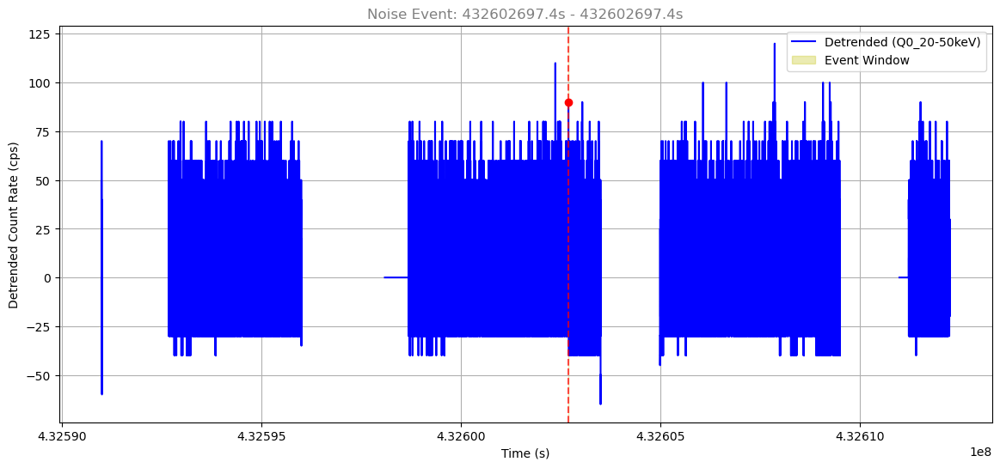

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.0σ



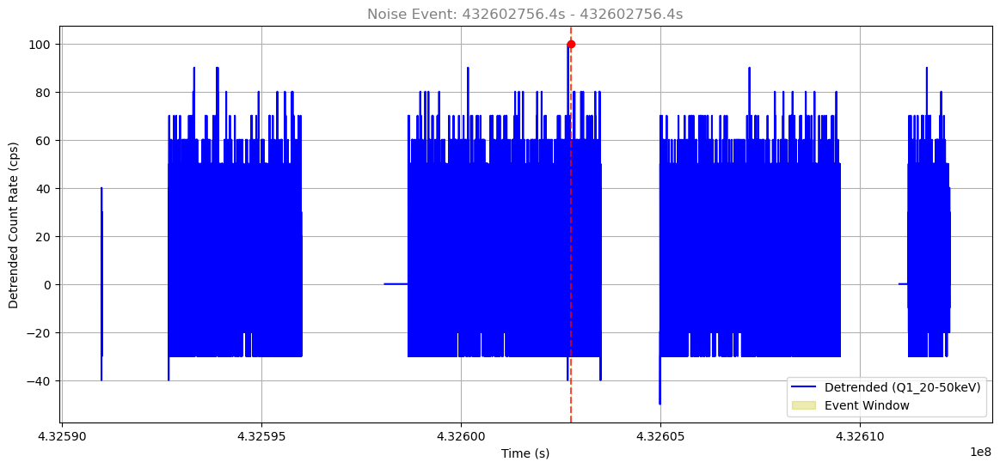

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



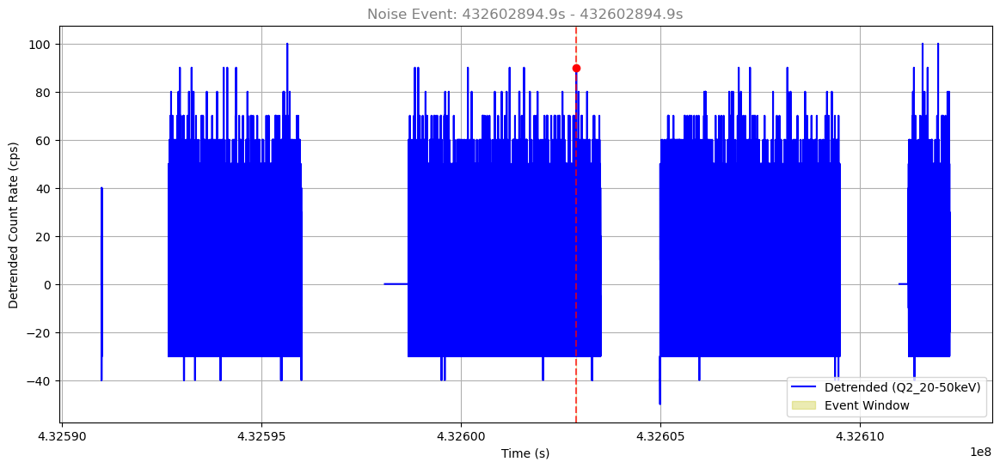

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



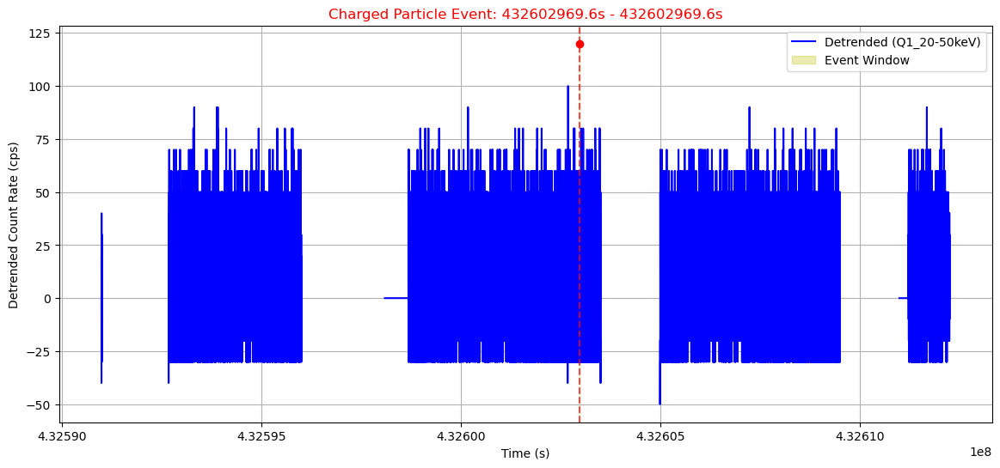

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 6.0σ



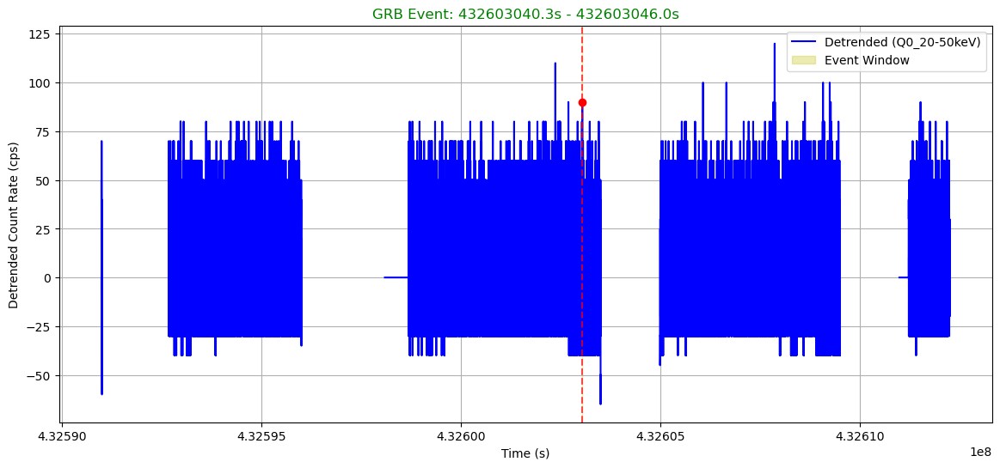

Classification: GRB
Reason: Multi-quadrant + multi-energy + max significance 5.1σ
Duration: 5.64s
Quadrants: Q0, Q3
Energy Ranges: 100-200keV, 20-50keV
Max Significance: 5.1σ



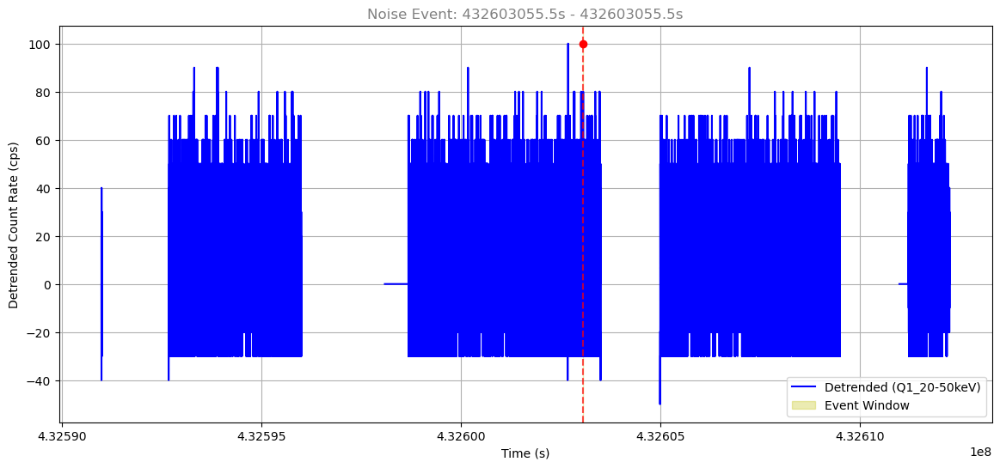

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



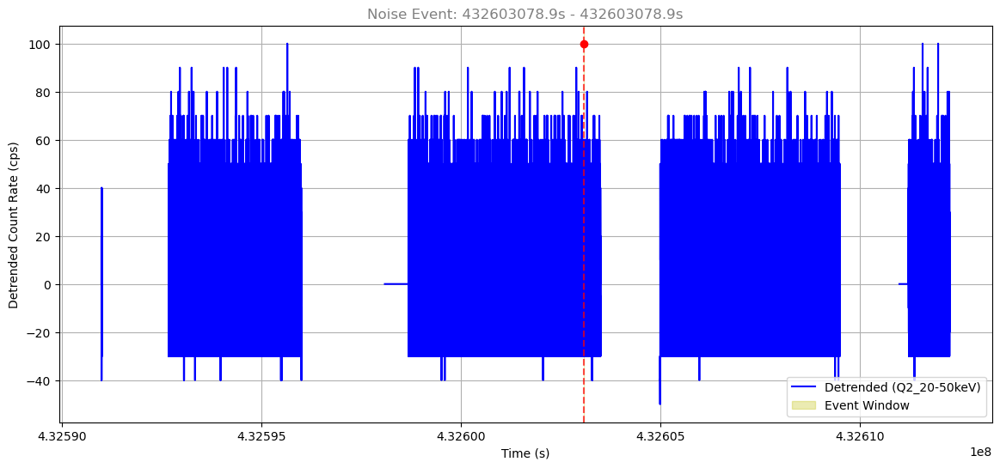

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



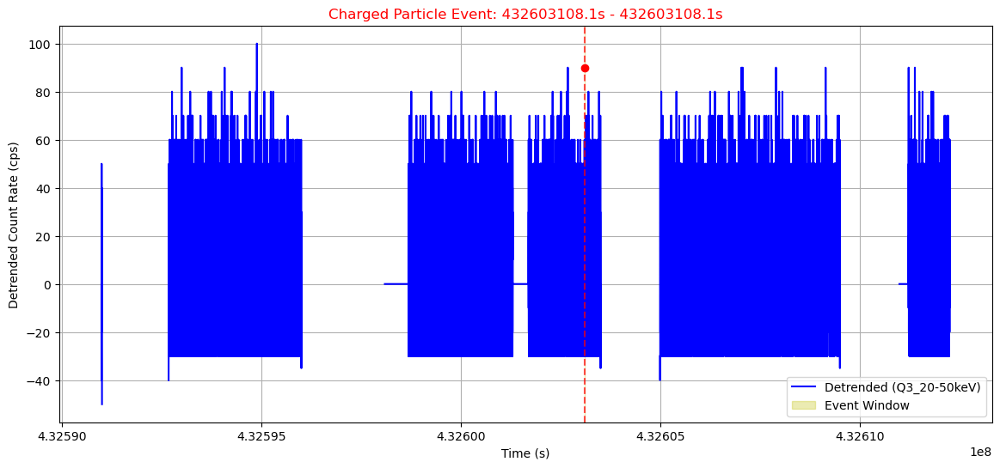

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



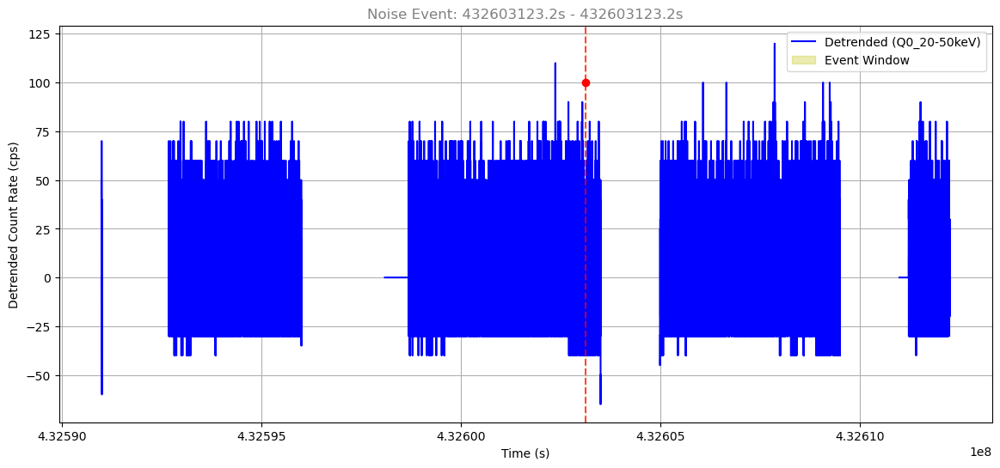

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



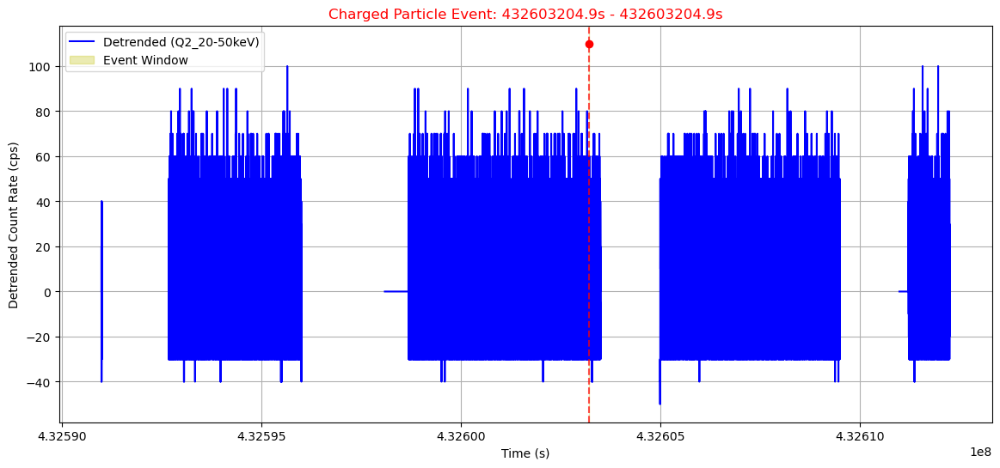

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.7σ



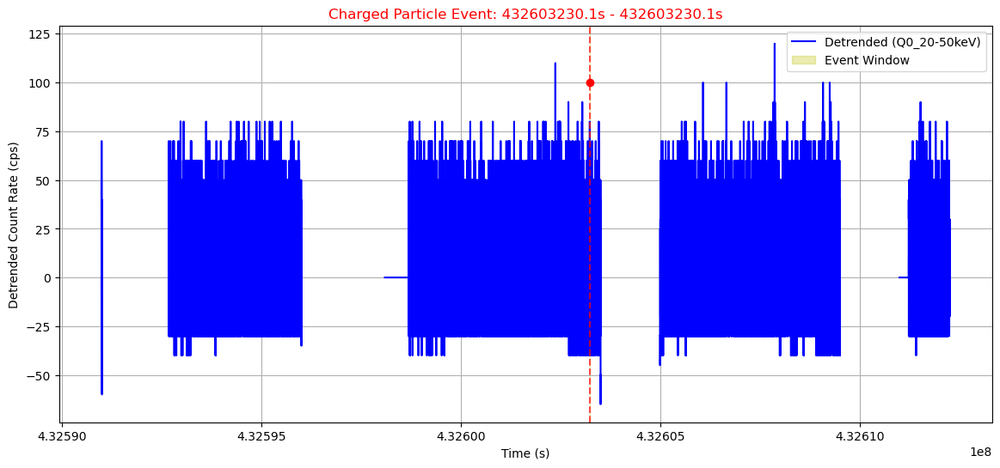

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.3σ



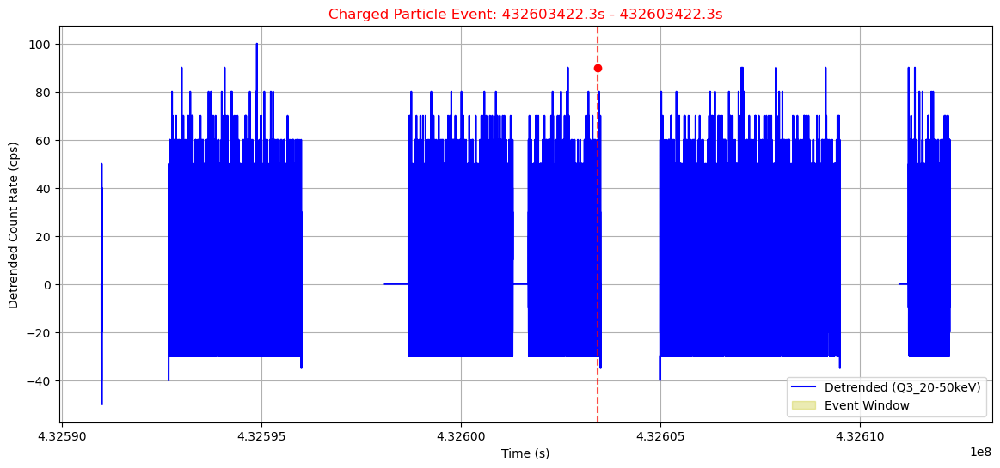

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



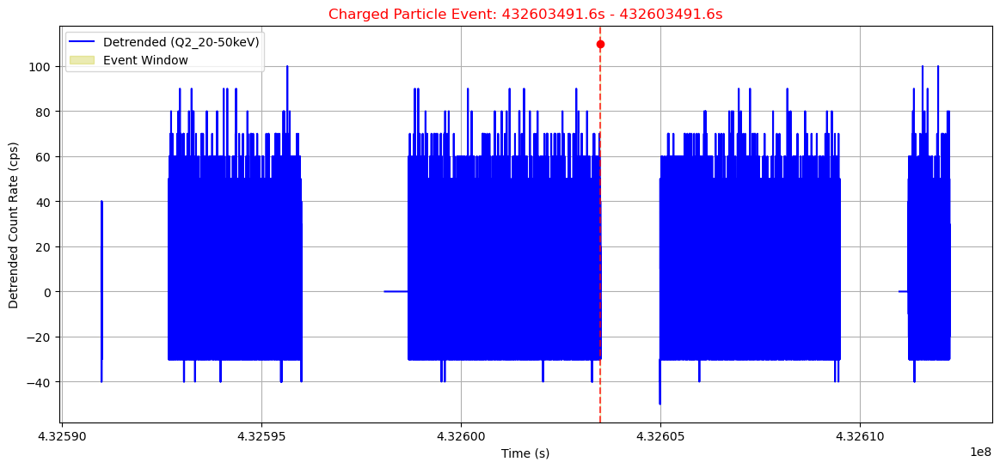

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.7σ



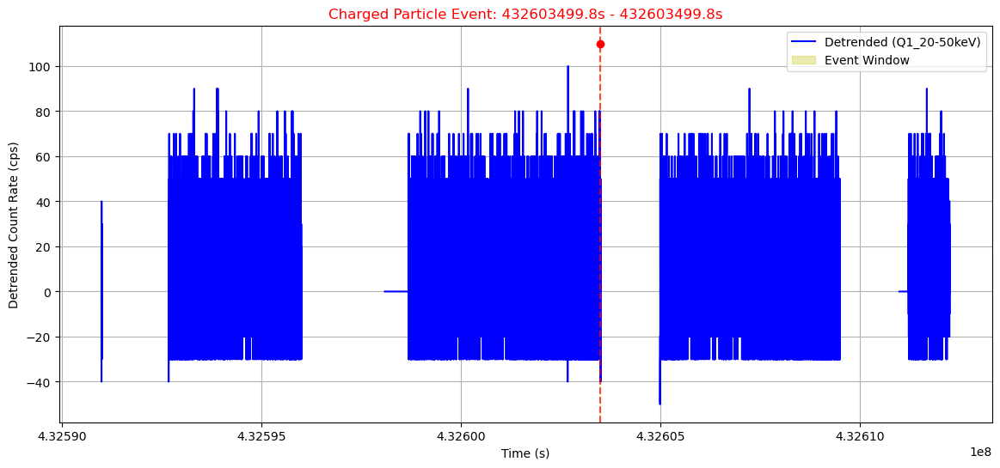

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 5.5σ



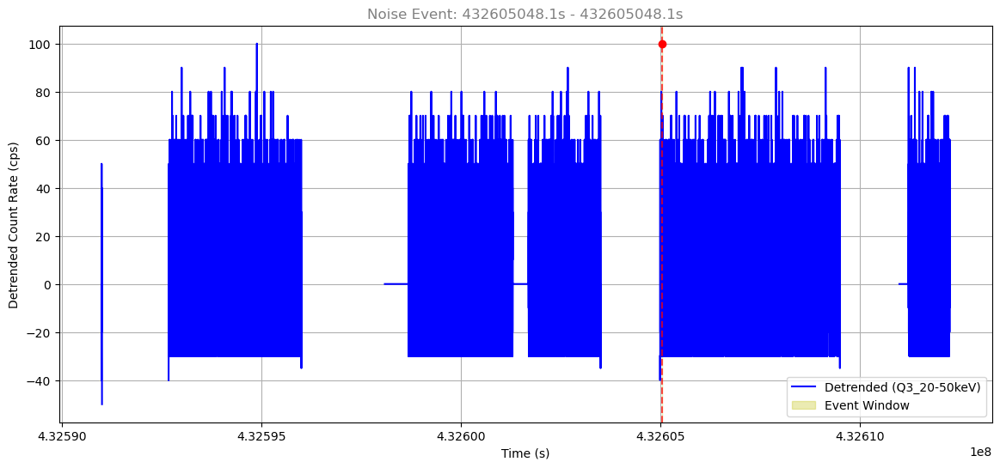

Classification: Noise
Reason: Post-SAA recovery period (100s after SAA exit)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



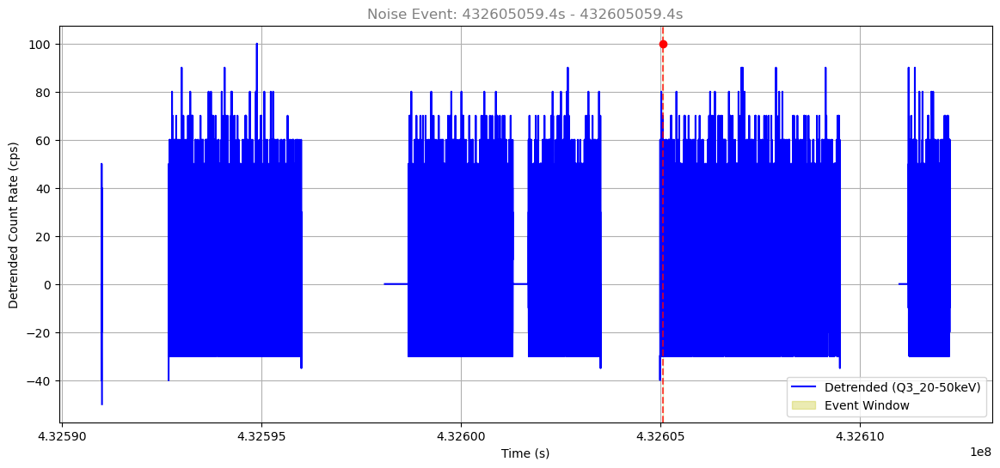

Classification: Noise
Reason: Post-SAA recovery period (100s after SAA exit)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



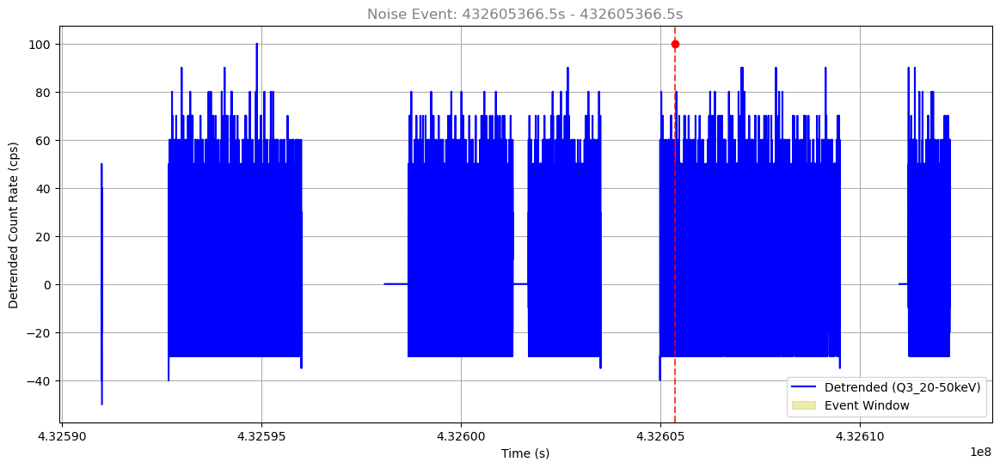

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



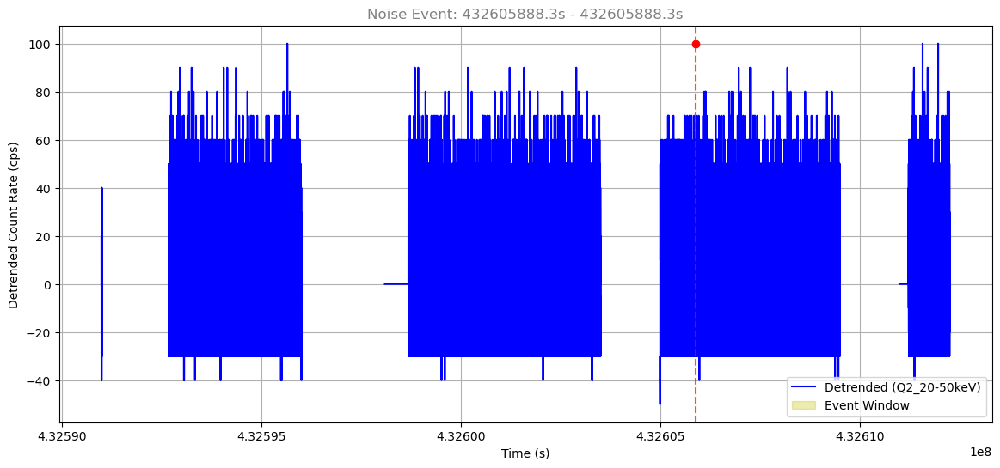

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



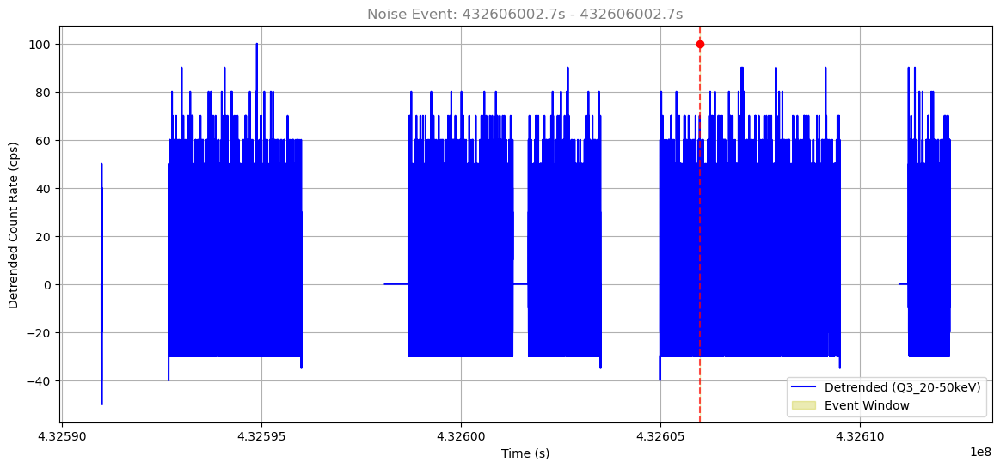

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



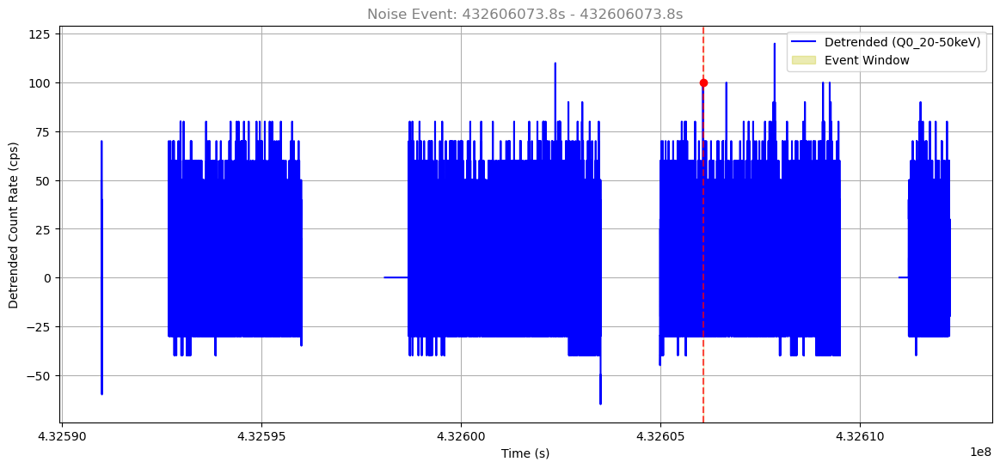

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.6σ



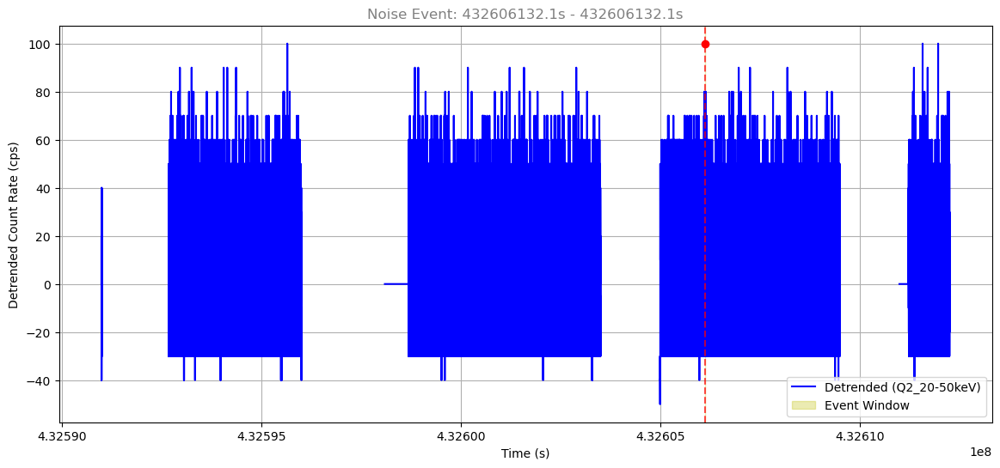

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



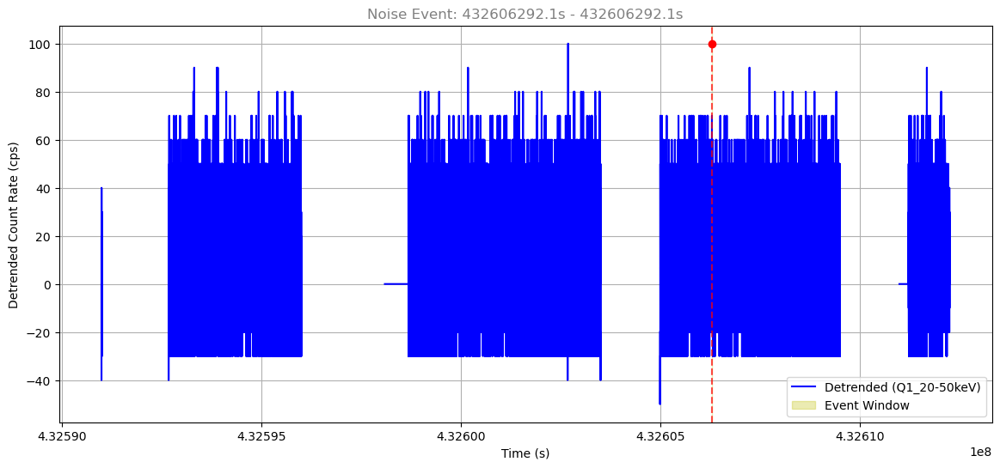

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



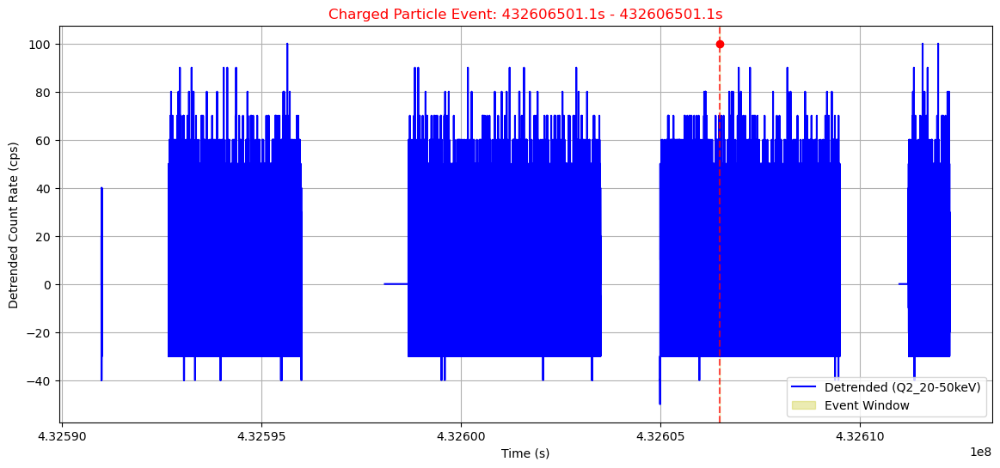

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.2σ



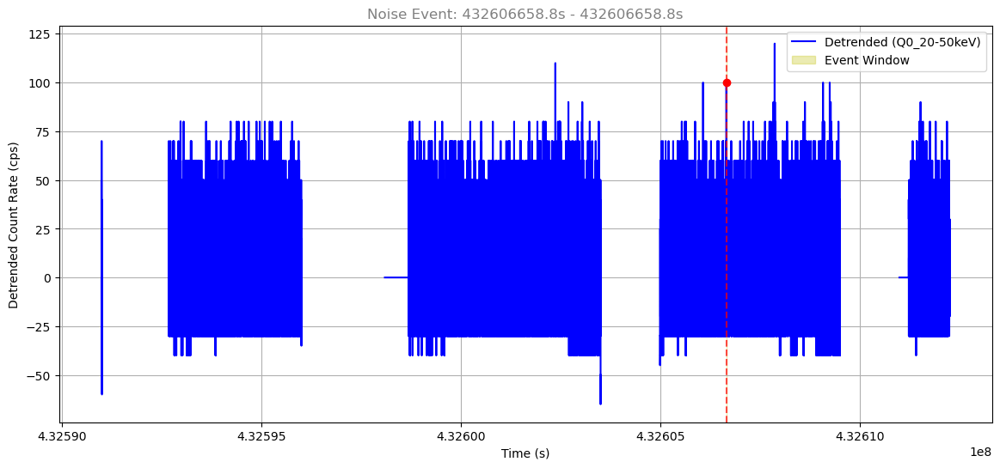

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.6σ



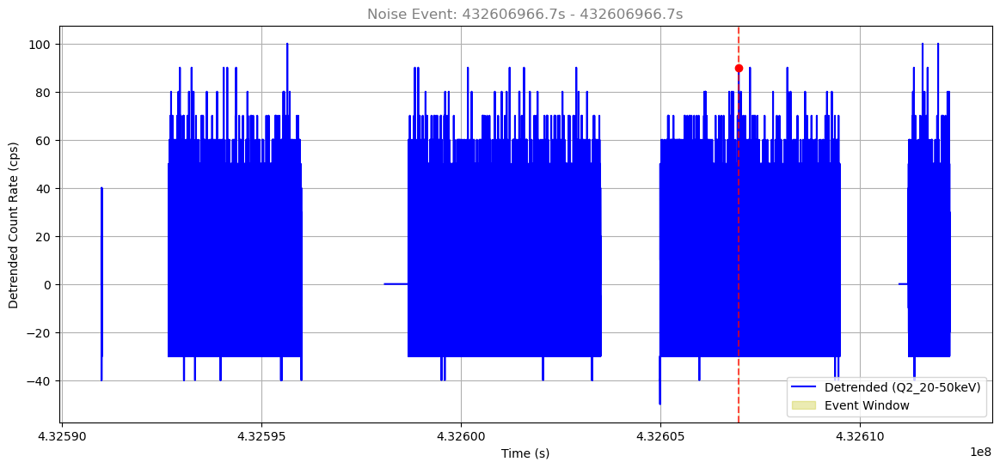

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



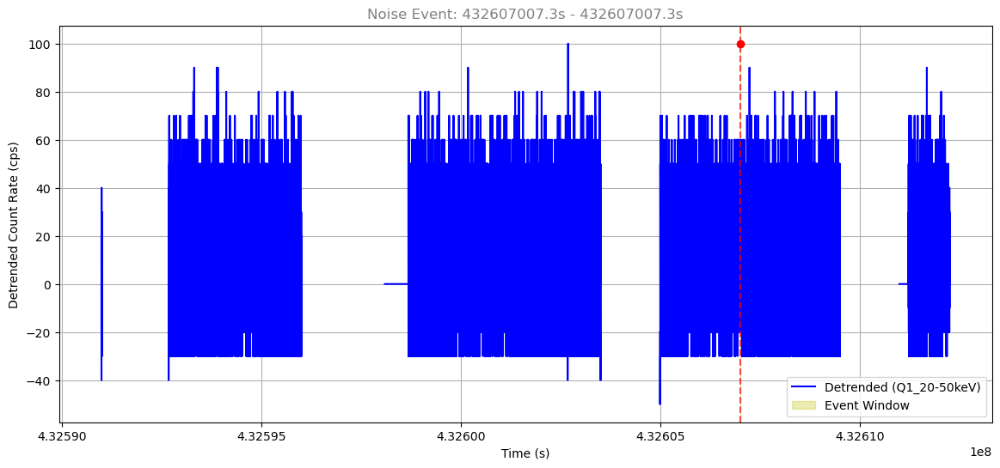

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



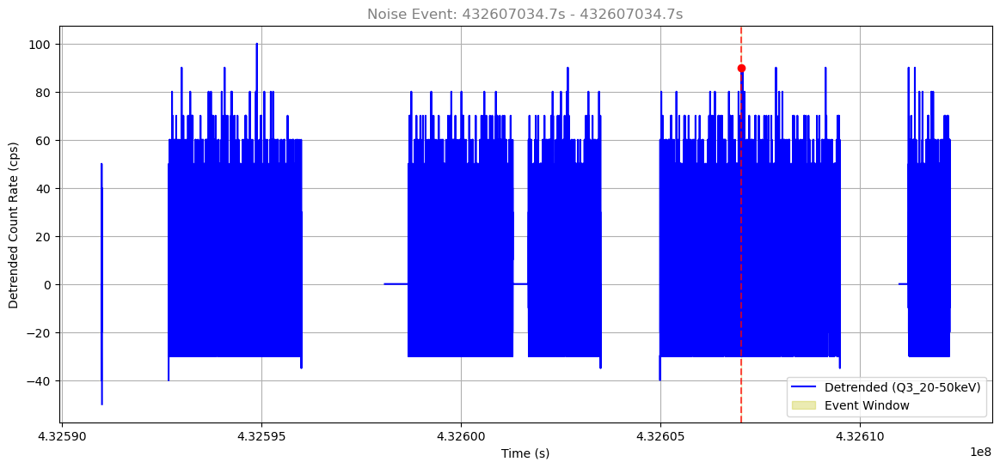

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



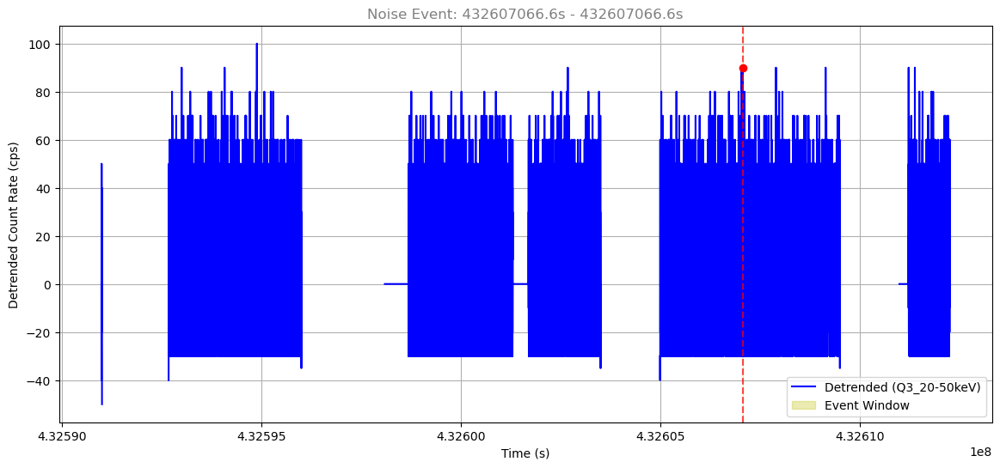

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



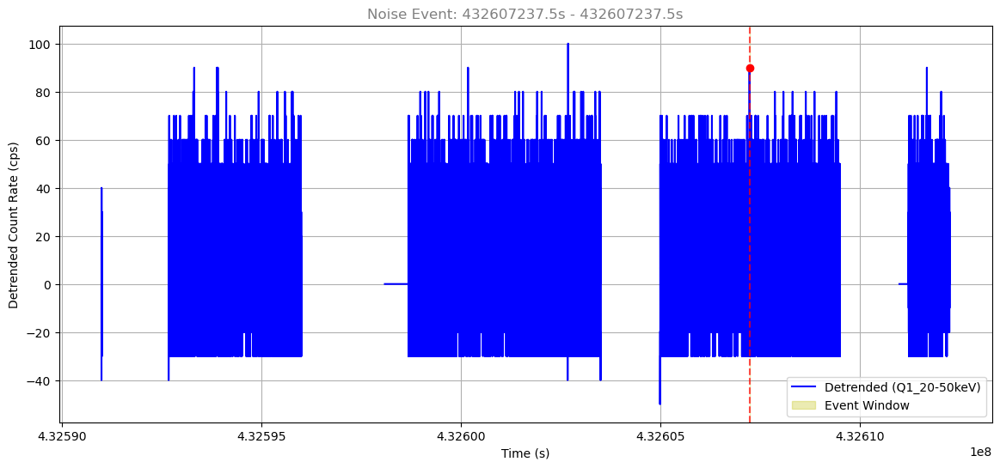

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 20-50keV
Max Significance: 5.4σ



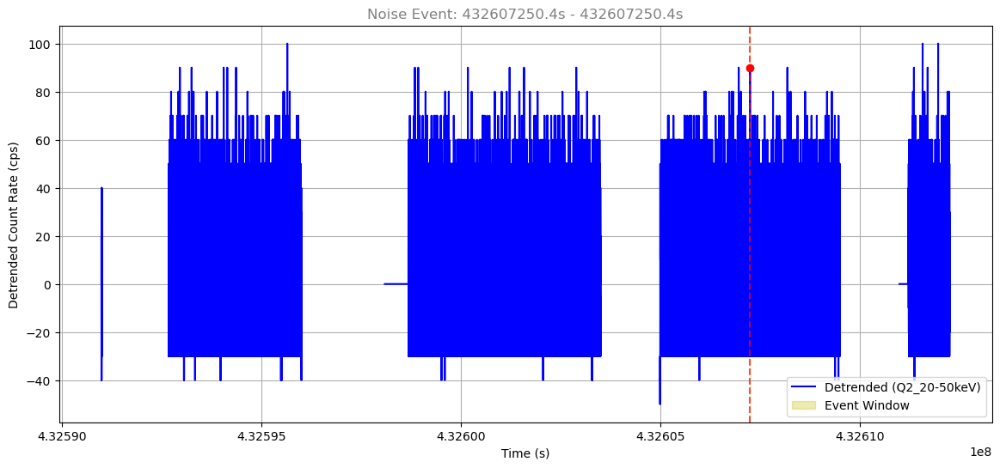

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



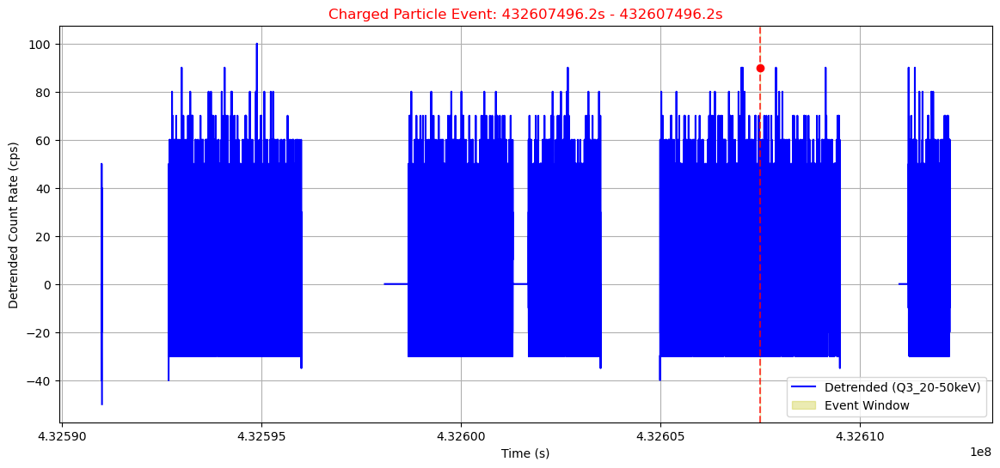

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



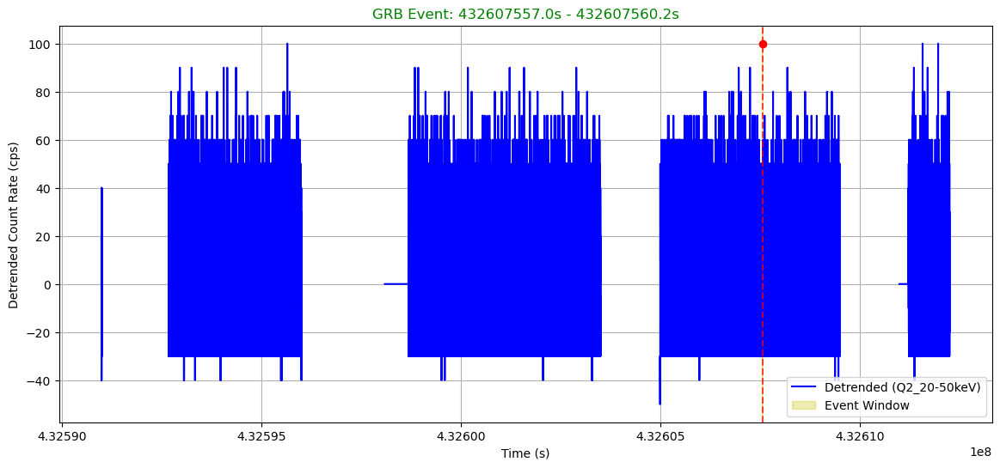

Classification: GRB
Reason: Multi-quadrant + multi-energy + max significance 5.1σ
Duration: 3.16s
Quadrants: Q2, Q3
Energy Ranges: 100-200keV, 50-100keV
Max Significance: 5.1σ



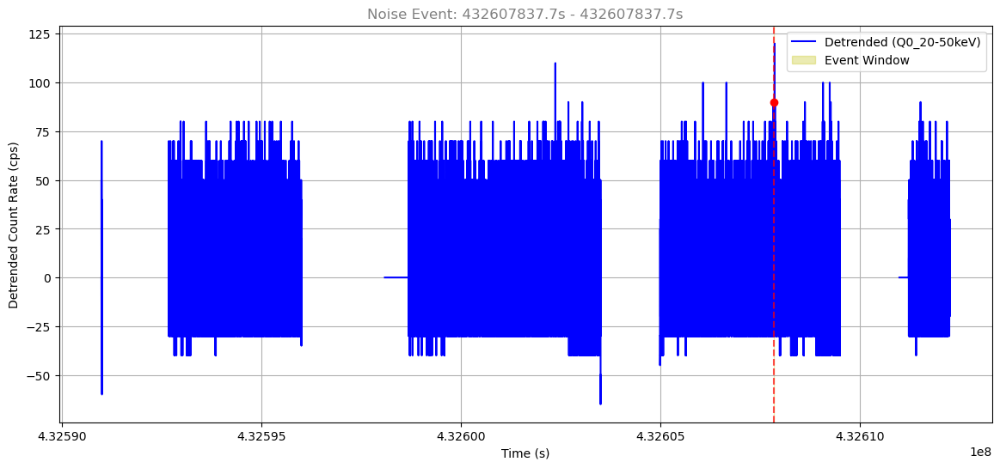

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.0σ



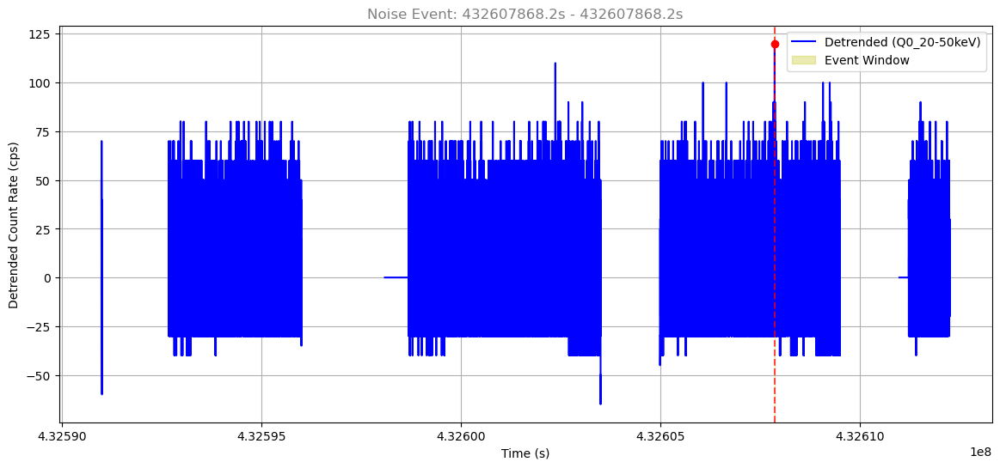

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 6.7σ



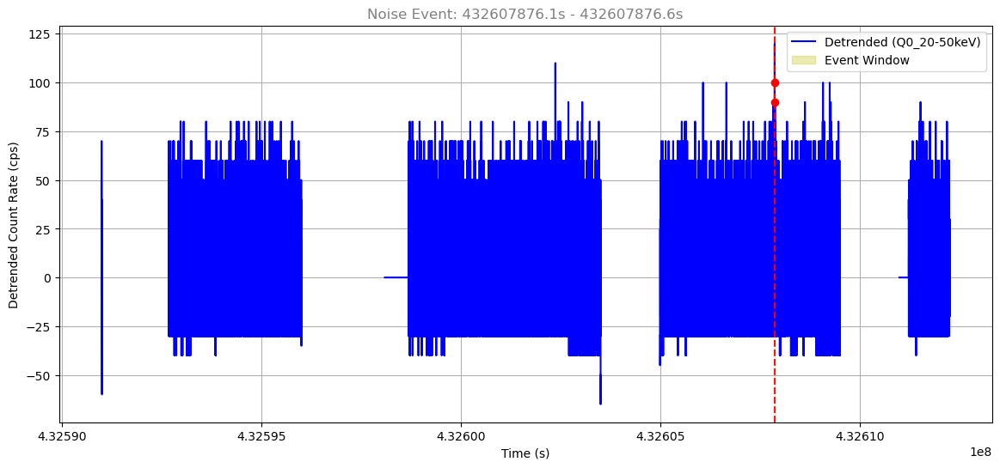

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.47s
Quadrants: Q0
Energy Ranges: 100-200keV, 20-50keV
Max Significance: 5.3σ



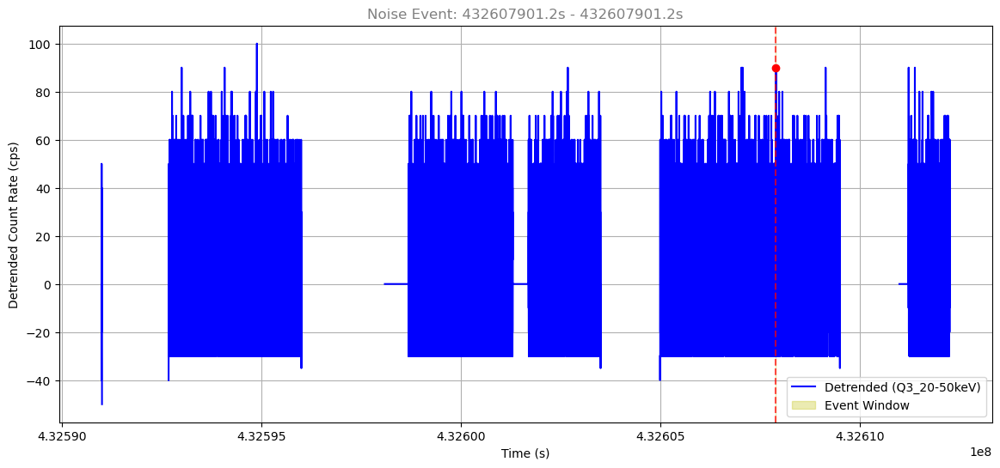

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



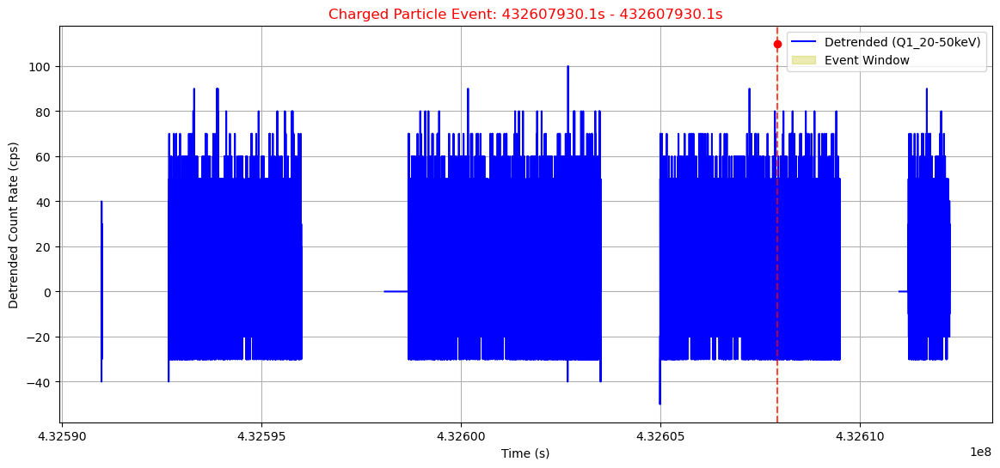

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 5.5σ



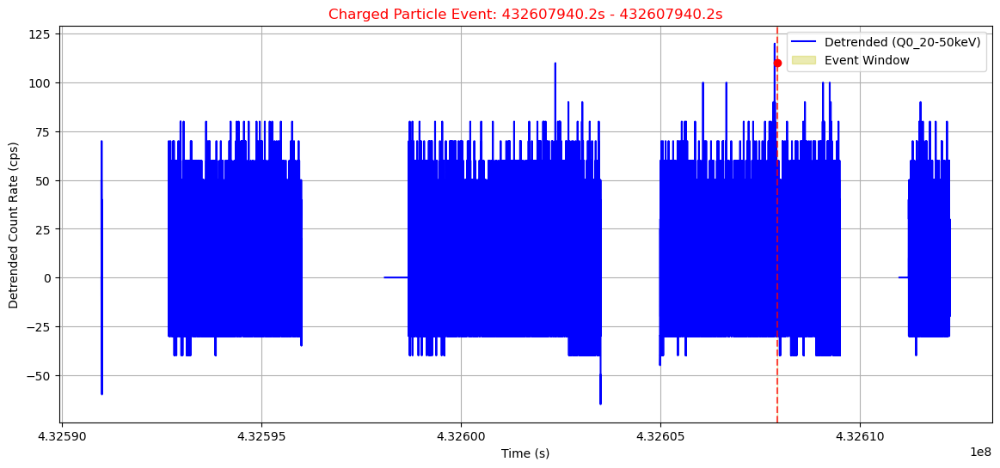

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.8σ



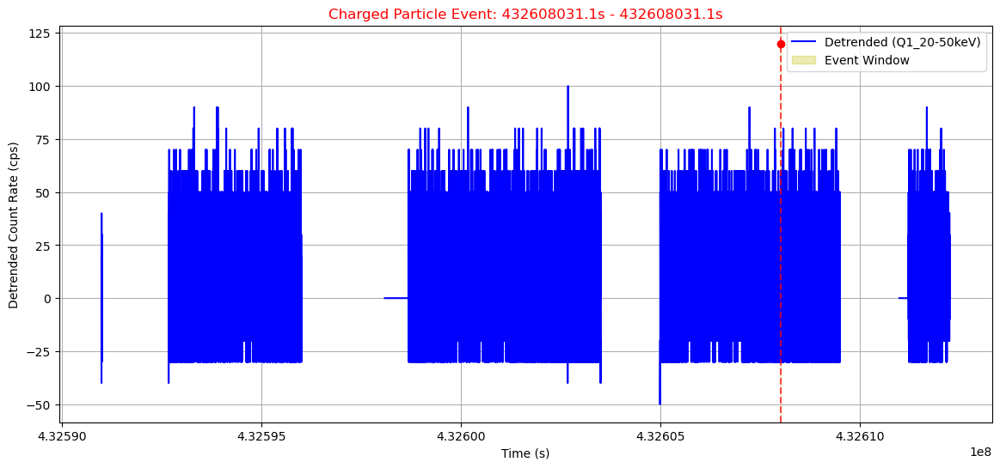

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 6.0σ



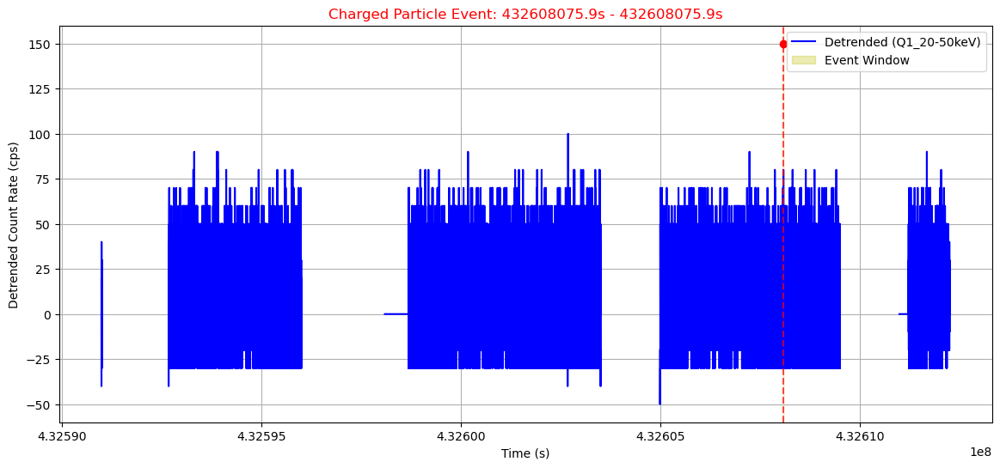

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 100-200keV
Max Significance: 7.5σ



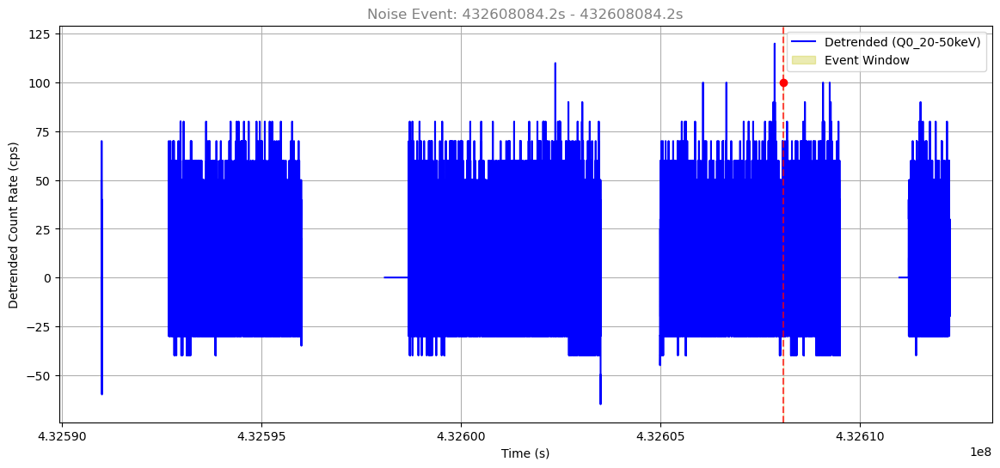

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.0σ



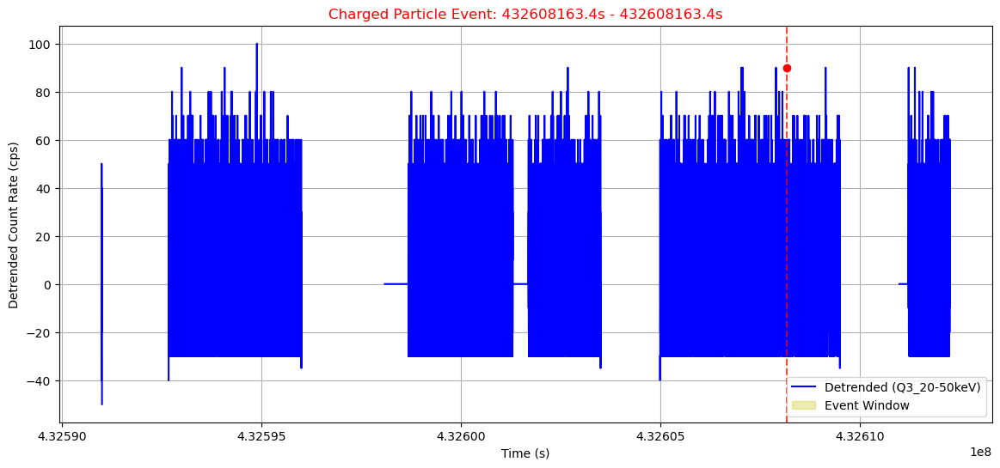

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



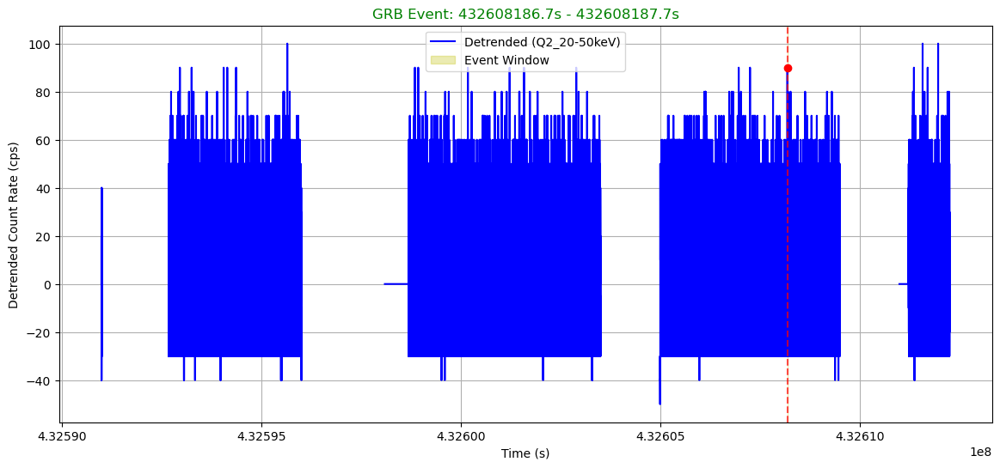

Classification: GRB
Reason: Multi-quadrant + multi-energy + max significance 5.6σ
Duration: 0.94s
Quadrants: Q2, Q3
Energy Ranges: 100-200keV, 20-50keV
Max Significance: 5.6σ



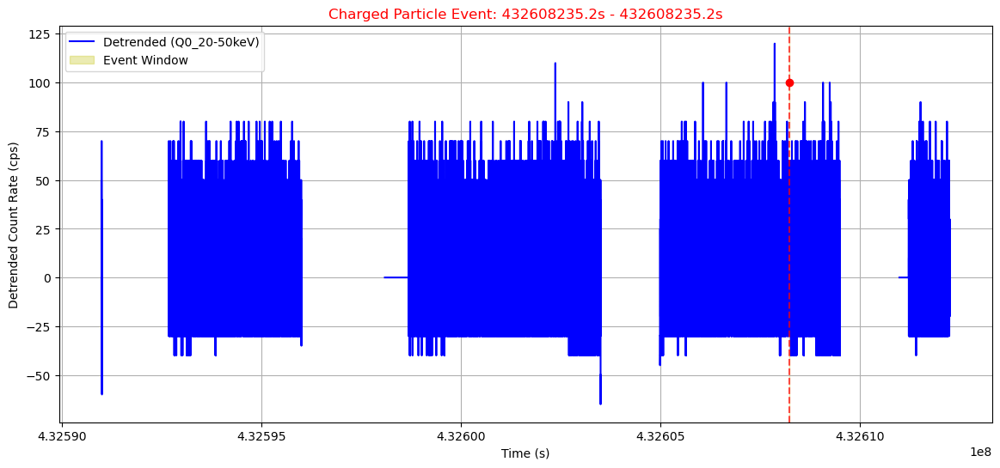

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.3σ



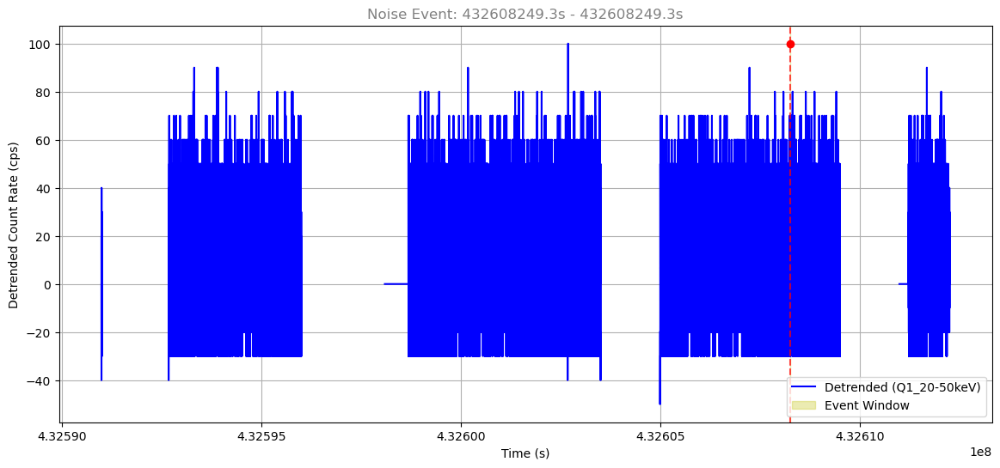

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



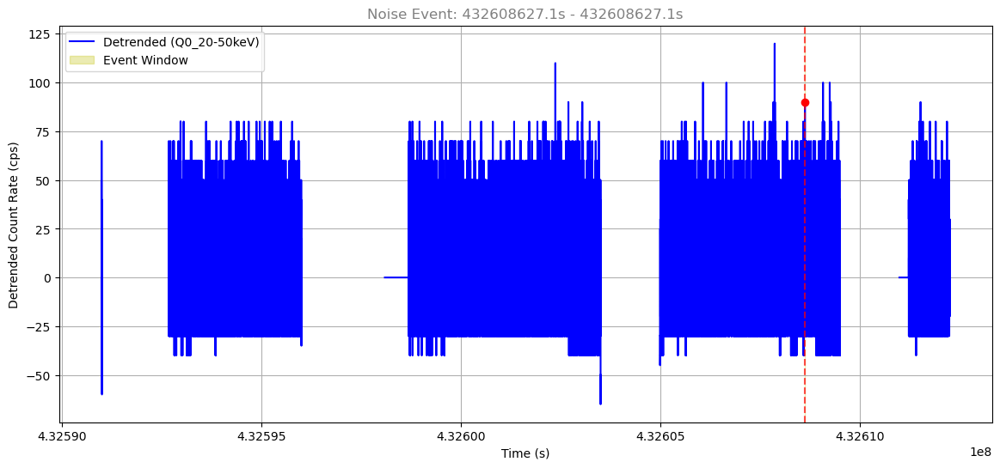

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.0σ



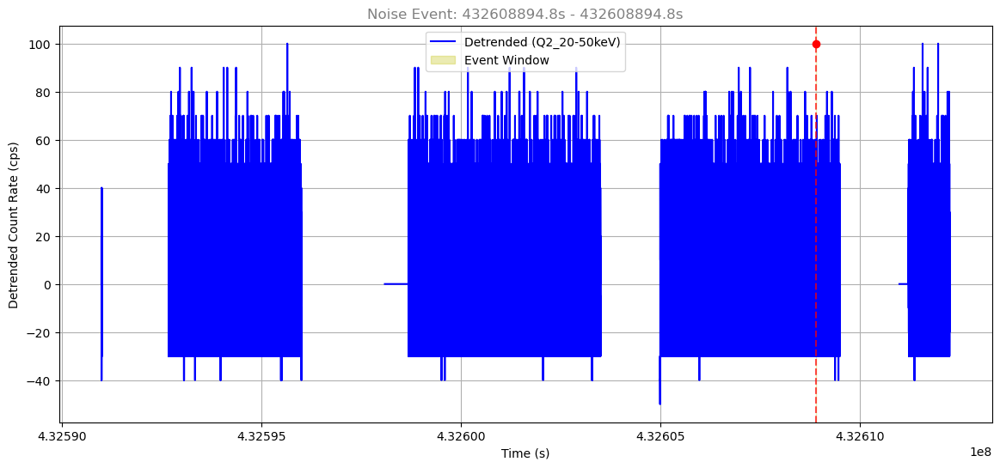

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



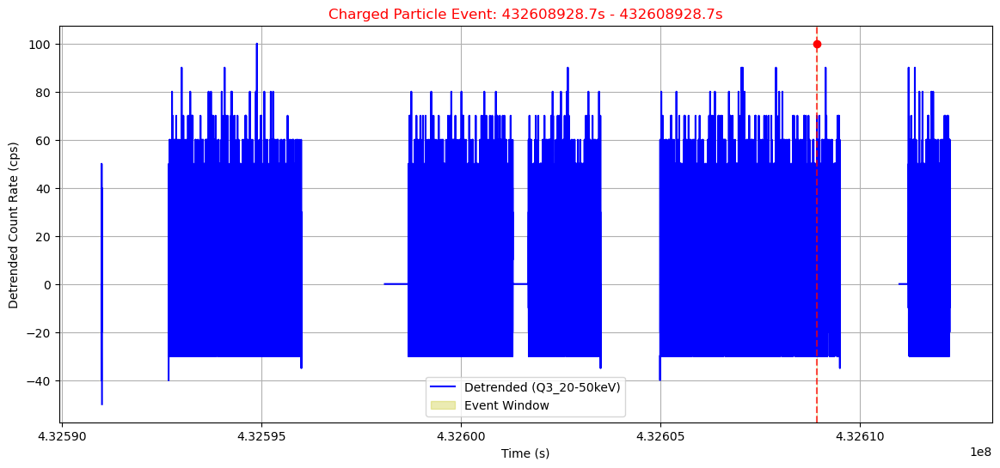

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



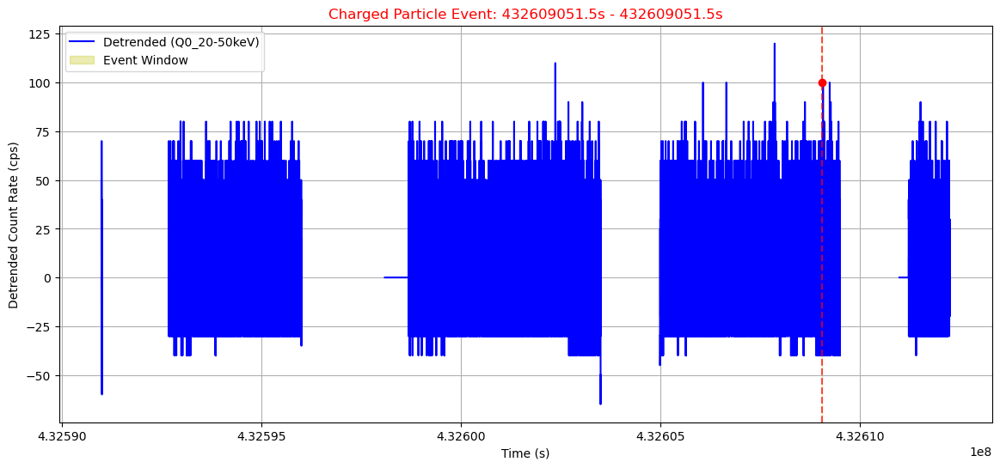

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.3σ



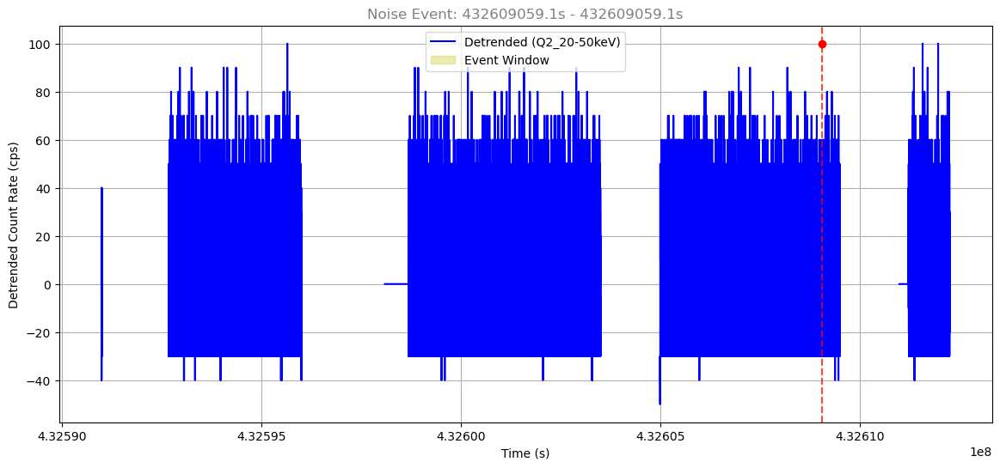

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



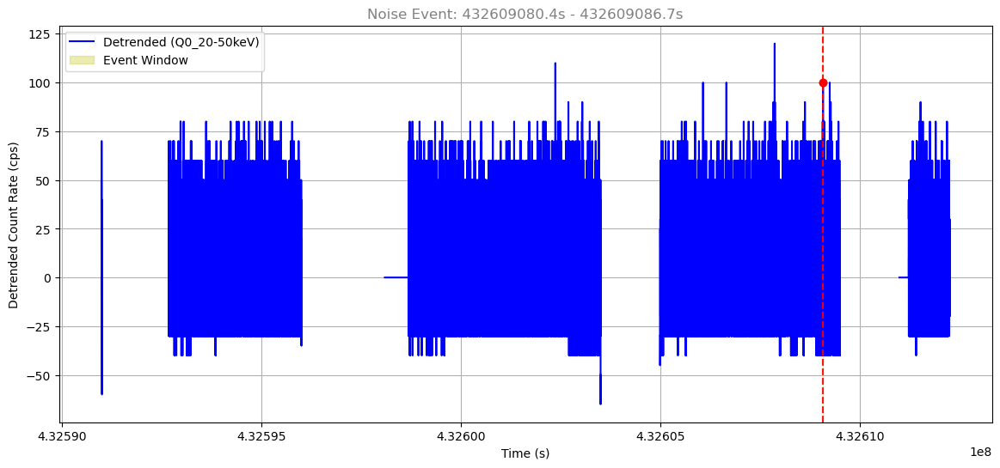

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 6.33s
Quadrants: Q0
Energy Ranges: 100-200keV, 20-50keV
Max Significance: 5.6σ



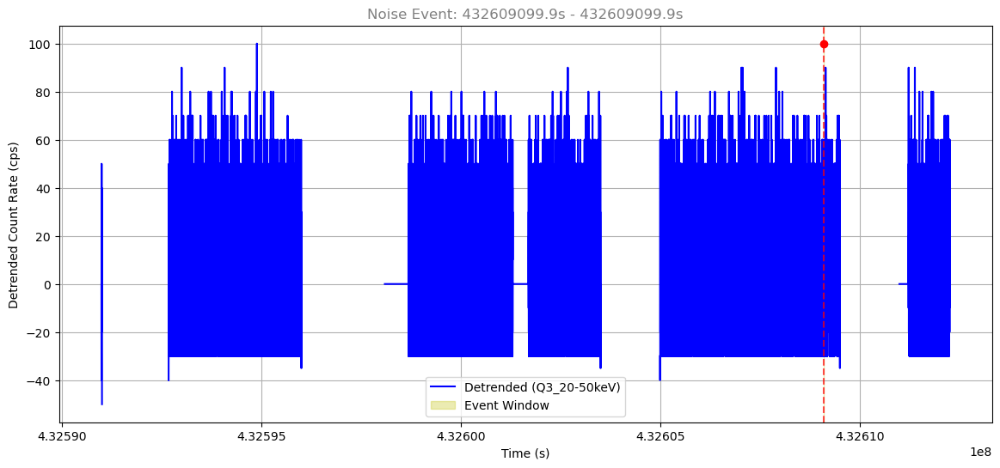

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



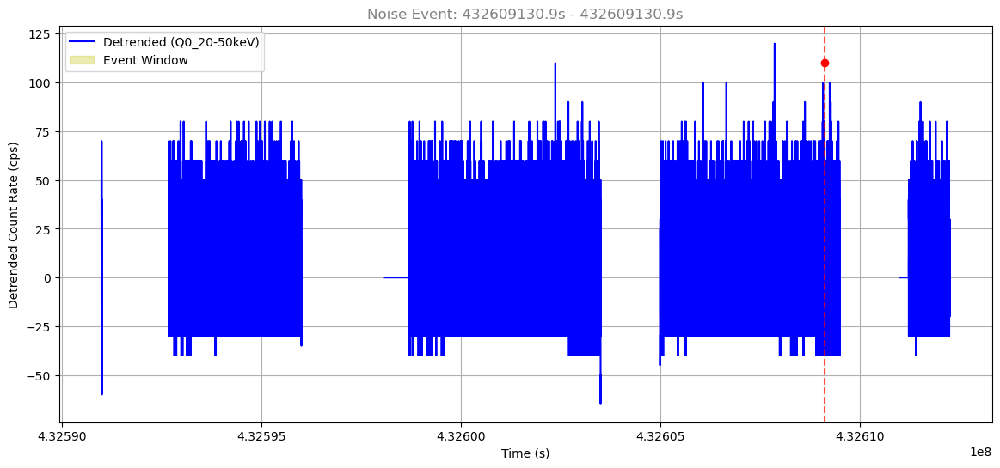

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 50-100keV
Max Significance: 5.5σ



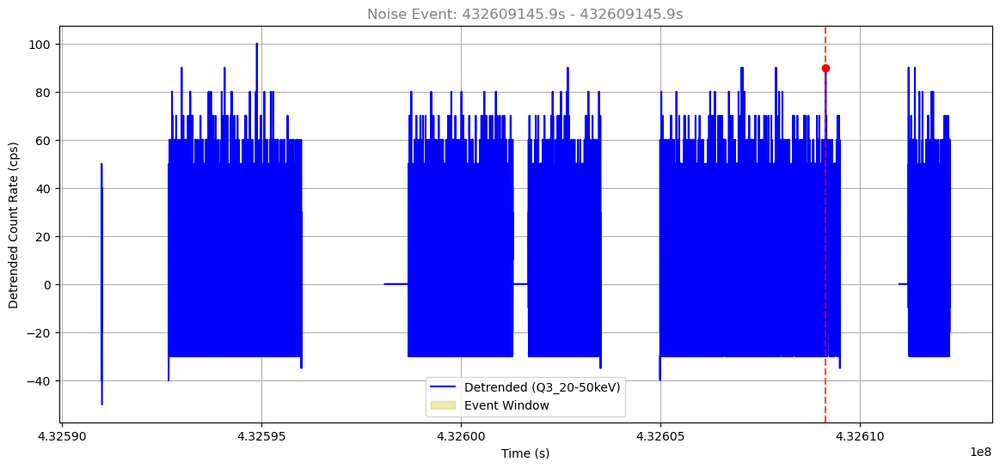

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



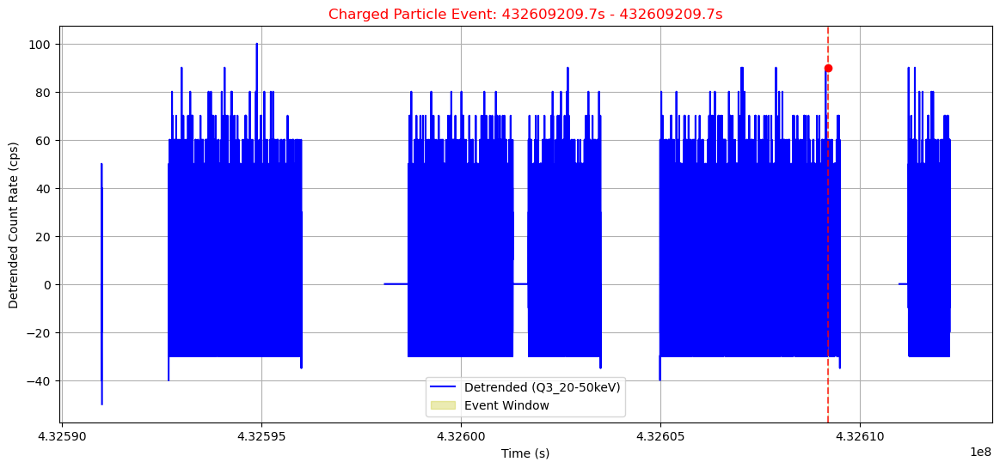

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.1σ



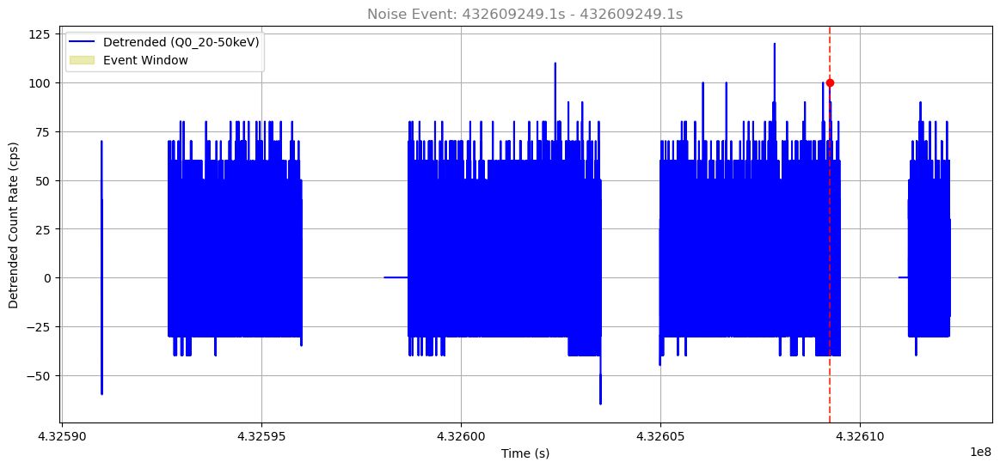

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.6σ



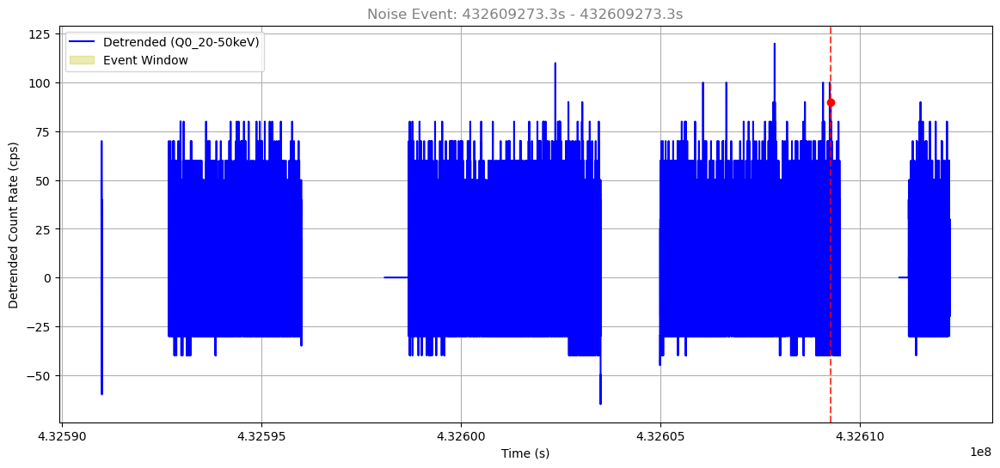

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.0σ



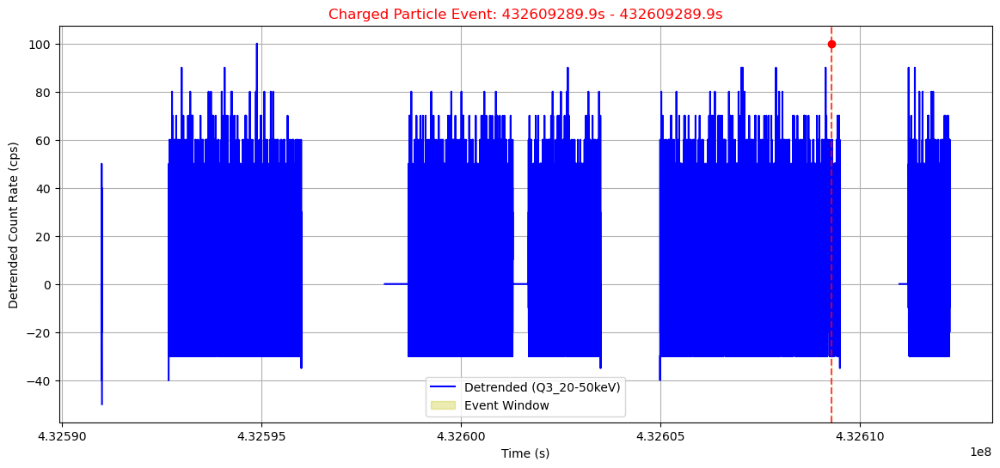

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



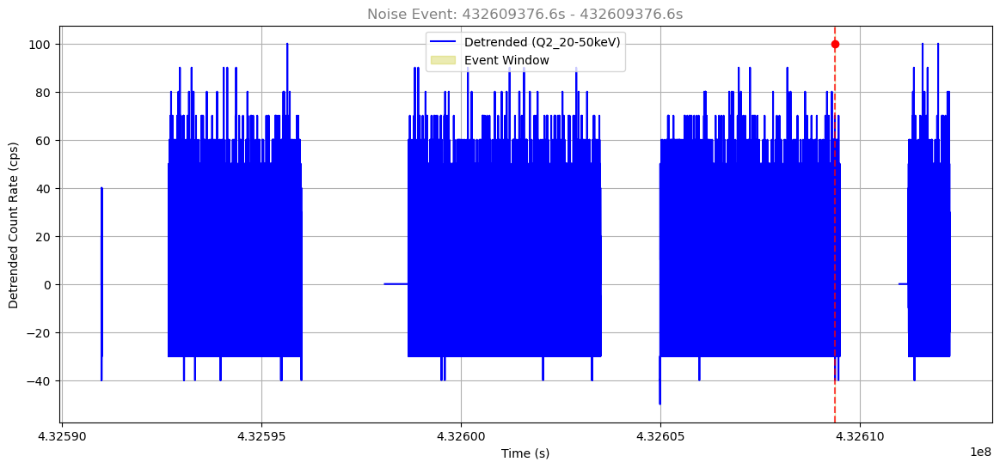

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 50-100keV
Max Significance: 5.1σ



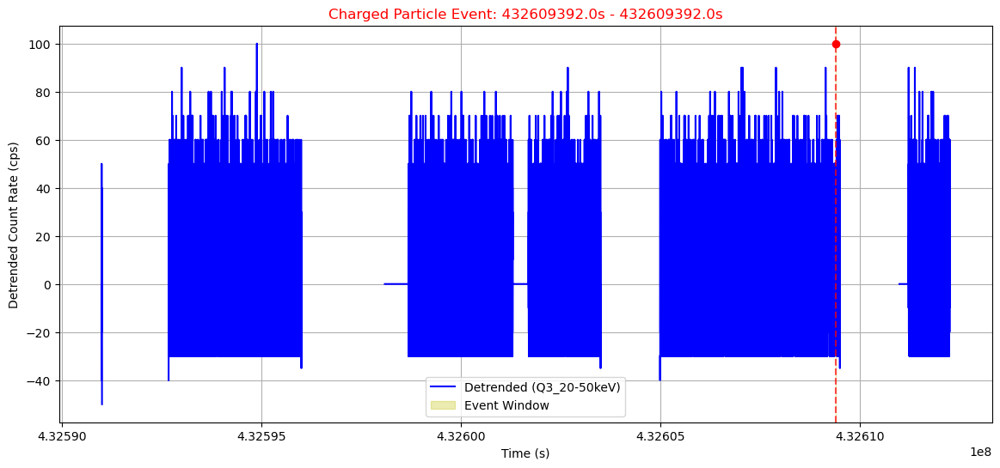

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 100-200keV
Max Significance: 5.6σ



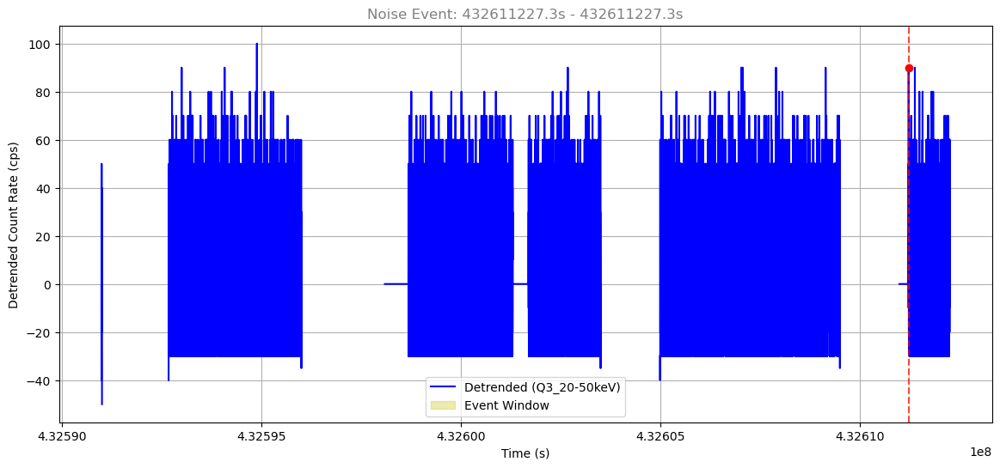

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



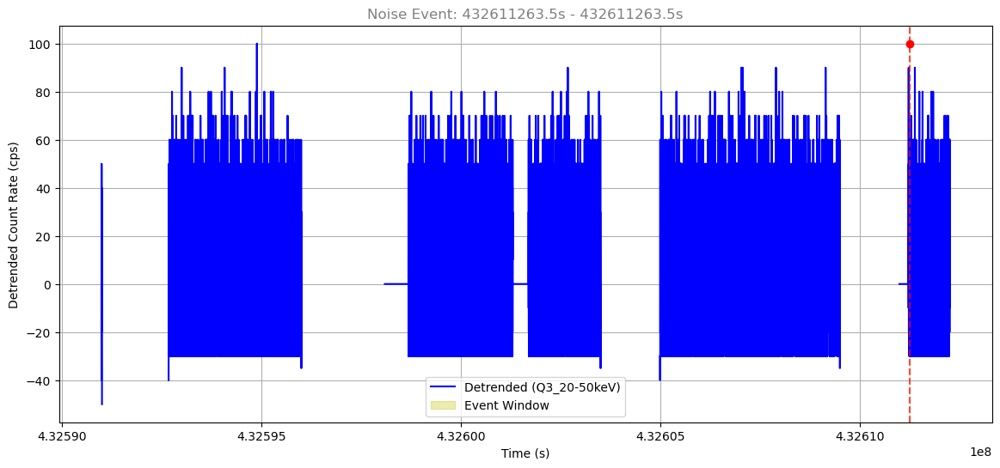

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



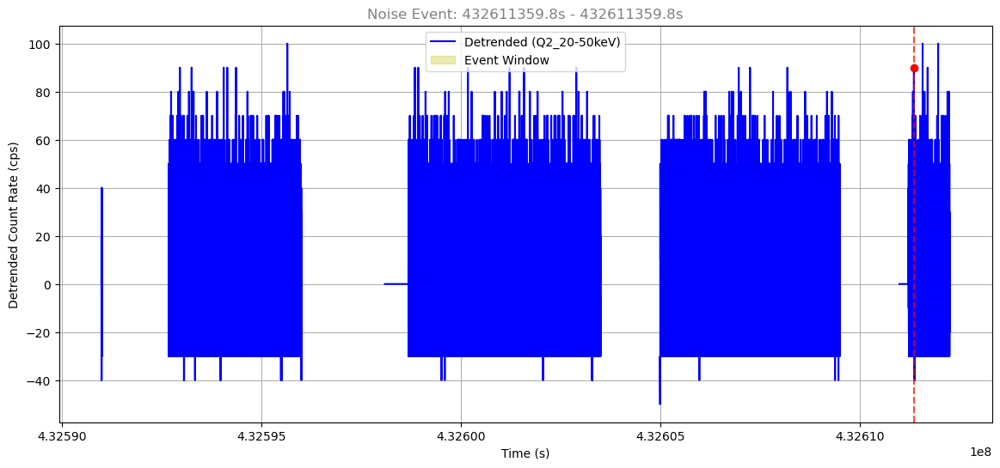

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



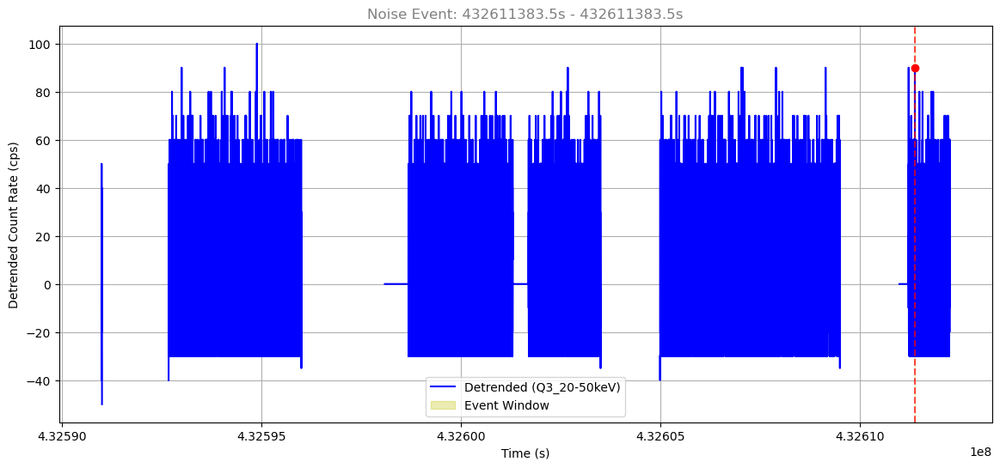

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q3
Energy Ranges: 20-50keV
Max Significance: 5.4σ



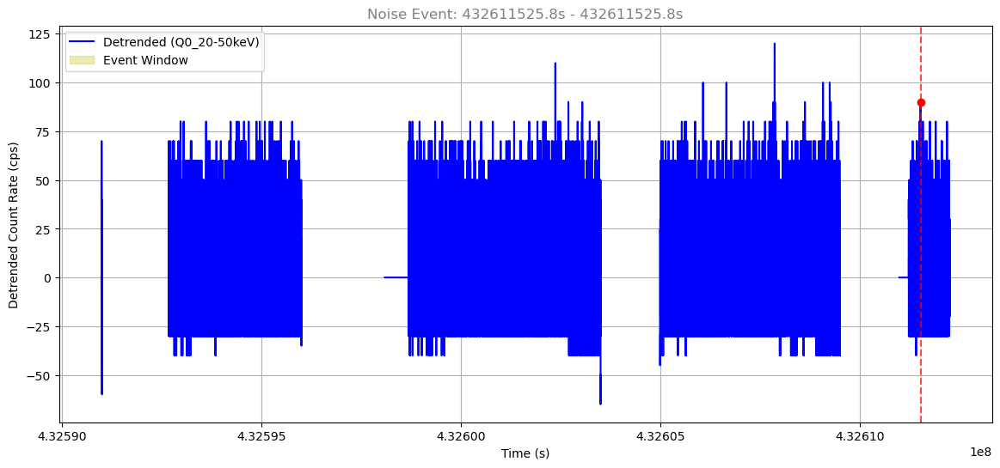

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 20-50keV
Max Significance: 5.0σ



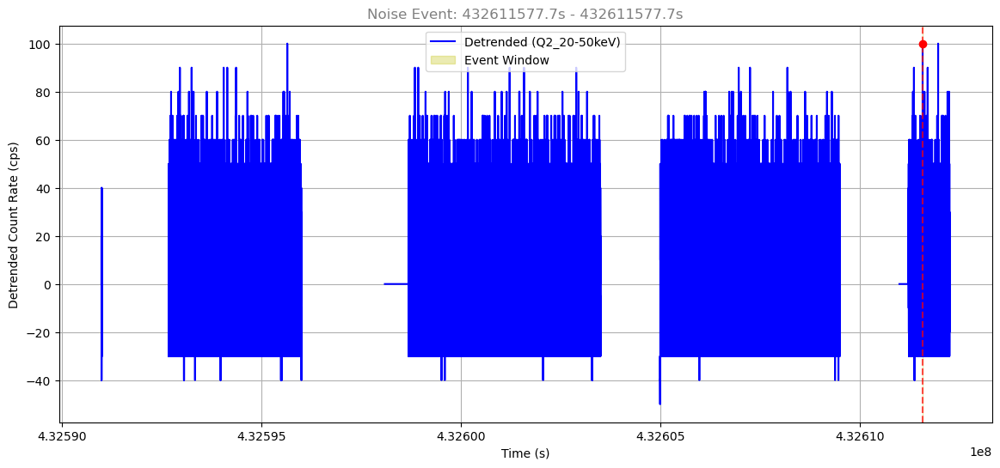

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.7σ



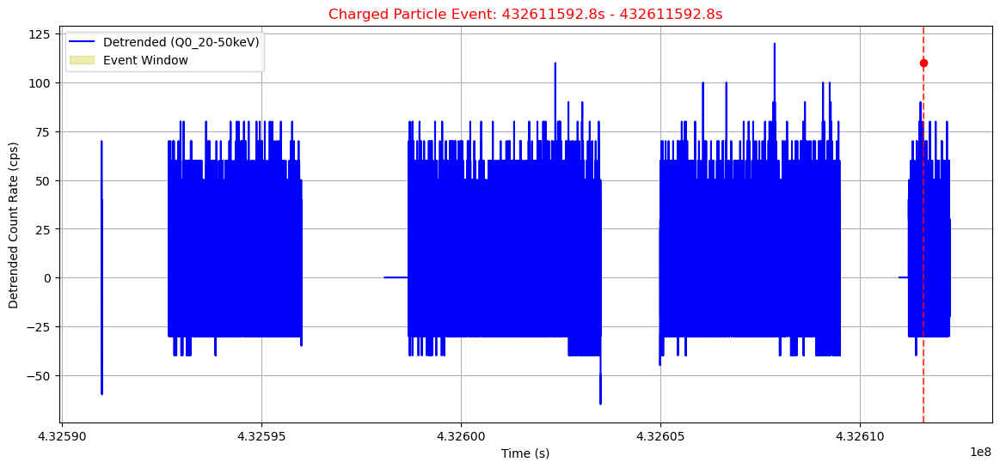

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q0
Energy Ranges: 100-200keV
Max Significance: 5.8σ



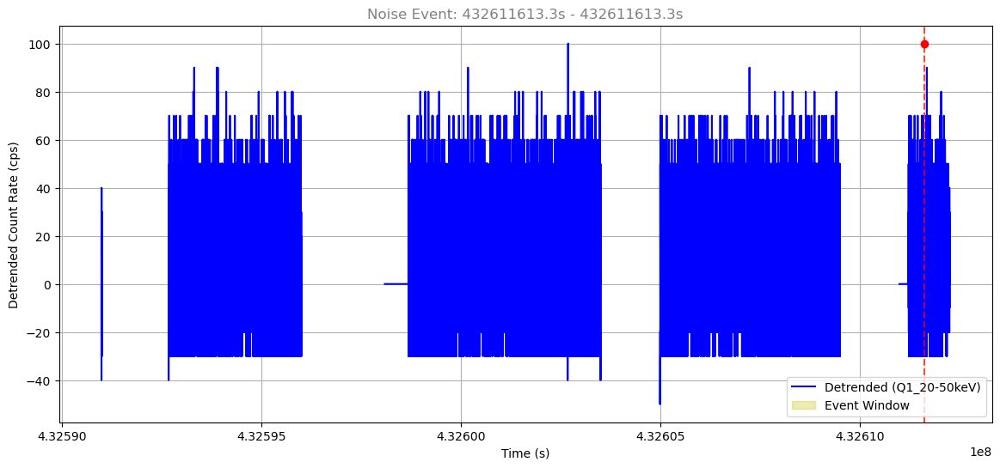

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 50-100keV
Max Significance: 5.2σ



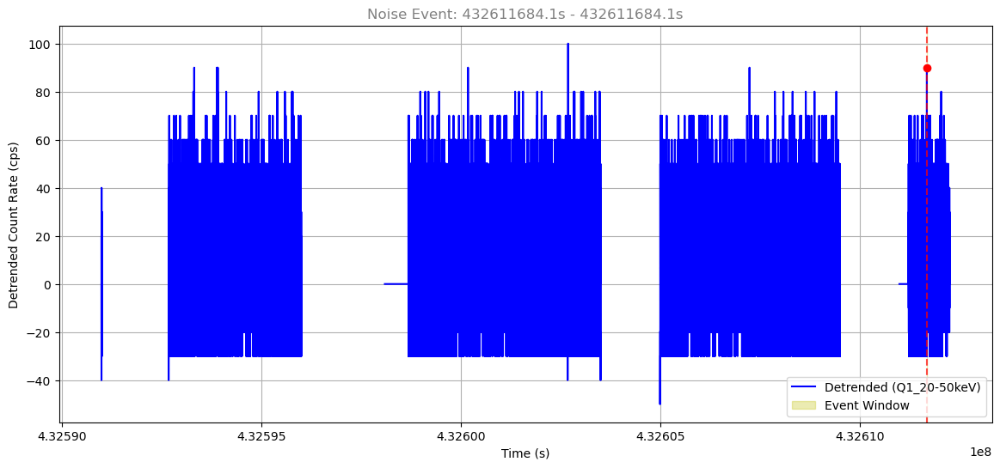

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q1
Energy Ranges: 20-50keV
Max Significance: 5.4σ



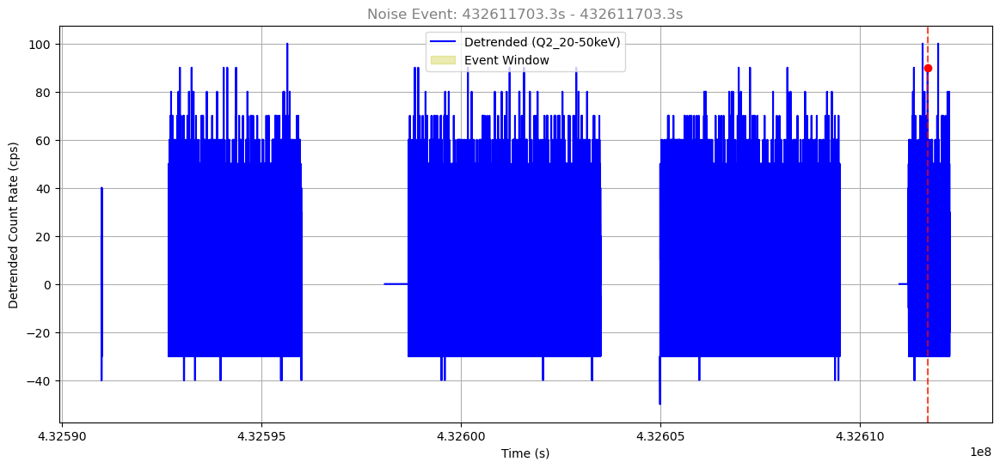

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.1σ



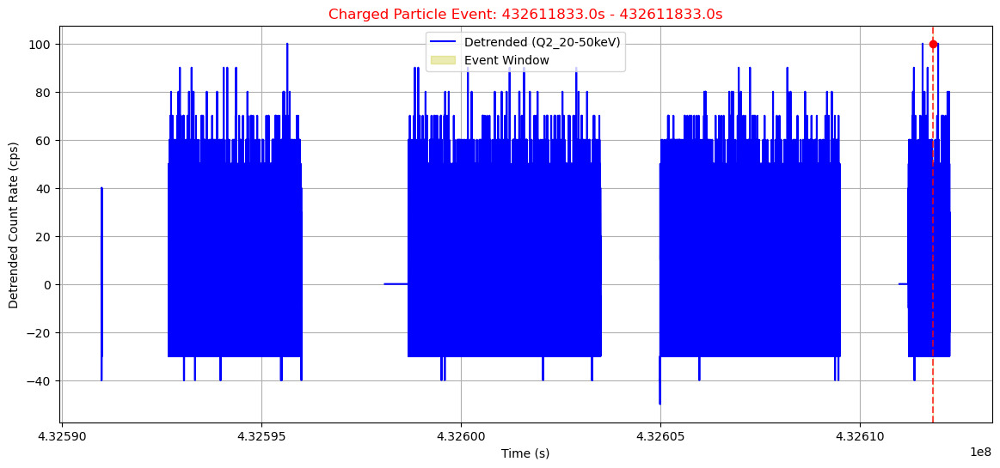

Classification: Charged Particle
Reason: Single quadrant and all energies ≥ 100.0 keV
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 100-200keV
Max Significance: 5.2σ



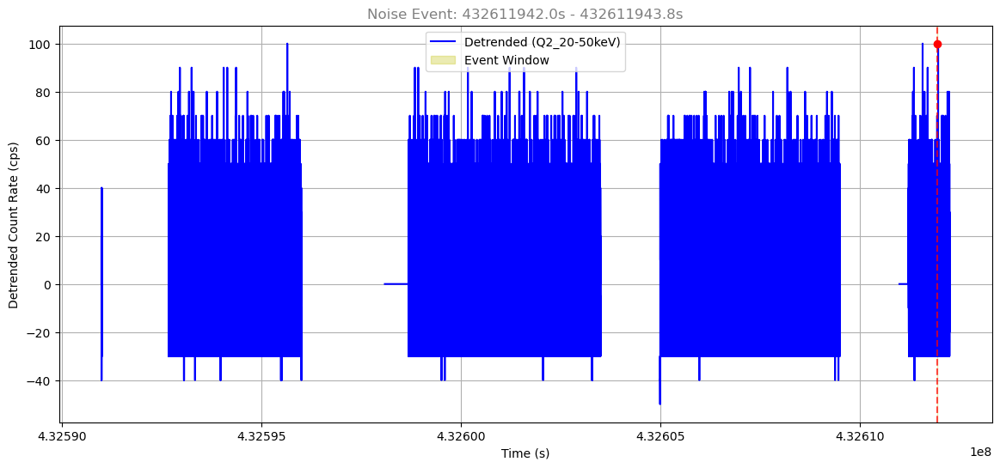

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 1.82s
Quadrants: Q2, Q3
Energy Ranges: 50-100keV
Max Significance: 5.2σ



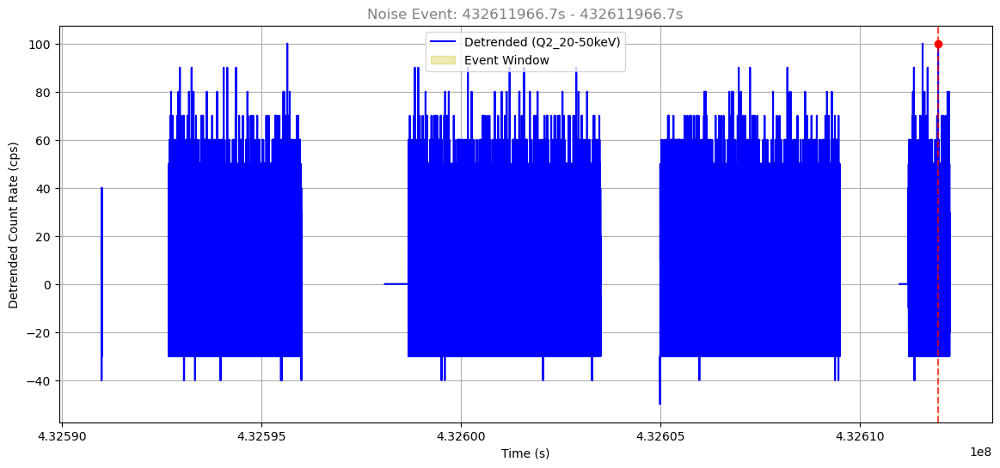

Classification: Noise
Reason: Defaulted to Noise (no strong spatial/spectral pattern)
Duration: 0.00s
Quadrants: Q2
Energy Ranges: 20-50keV
Max Significance: 5.7σ



In [12]:
saa_ranges = [(4.3259100*1e8,4.3259268*1e8),(4.325960*1e8,4.325981*1e8),(4.3260350*1e8,4.32605*1e8),(4.326095*1e8,4.326110*1e8)]
bad_ranges =  {#'Q0':[(4.32602*1e8,4.326024*1e8)],
               #'Q1':[(4.326086*1e8,4.326095*1e8)]
                'Q3':[(4.326013*1e8,4.326017*1e8)]}

rv = lc_czt("AS1T05_152T01_9000005846_43091cztM0_level2_quad_clean.evt",saa_ranges=saa_ranges,energy_ranges=energy_ranges,bin_width=0.1,bad_ranges=bad_ranges)
fv = median_filter(rv,window_size=101,saa_ranges=saa_ranges)
peakv = detect_peaks(fv,sigma=5,min_distance=1)
cv = classify_events(peakv, bin_width=1,saa_recovery_time=100,saa_end_times=[4.3259268*1e8,4.325981*1e8,4.32605*1e8,4.326110*1e8])
plot_event_classification(cv, fv)


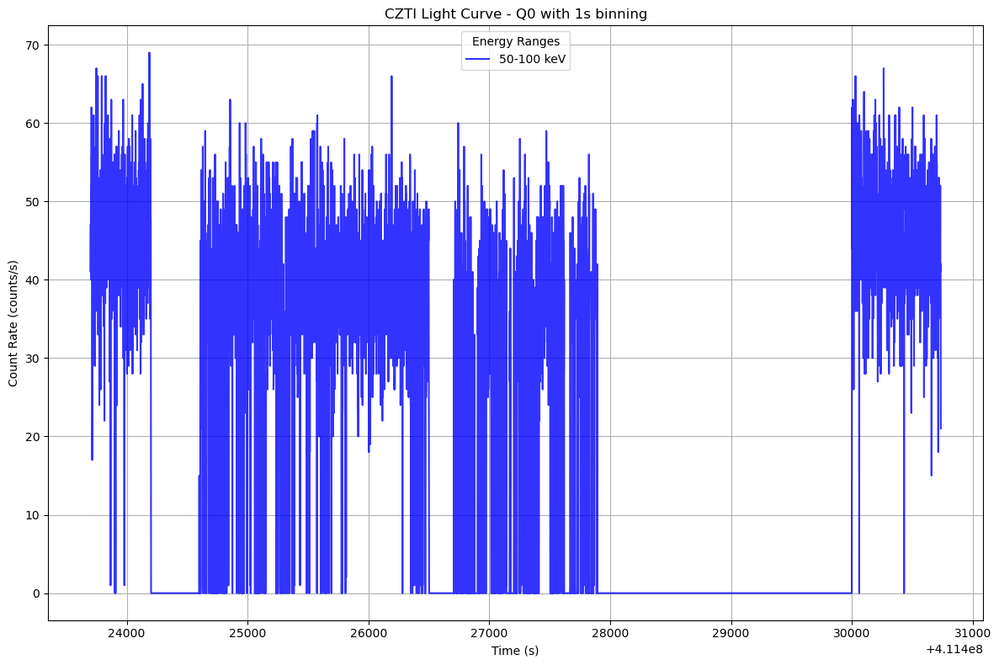

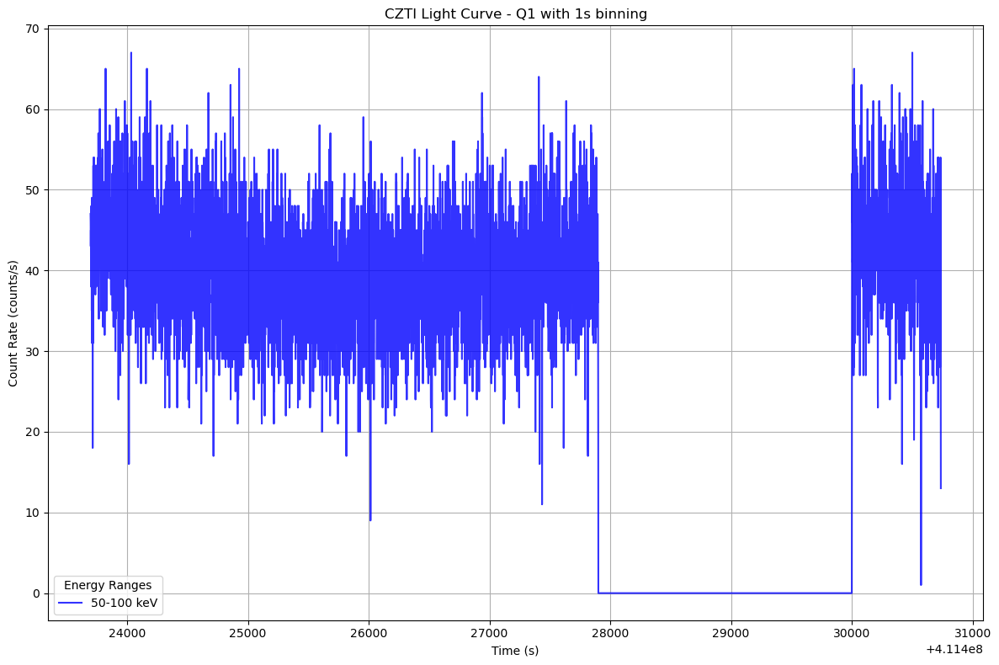

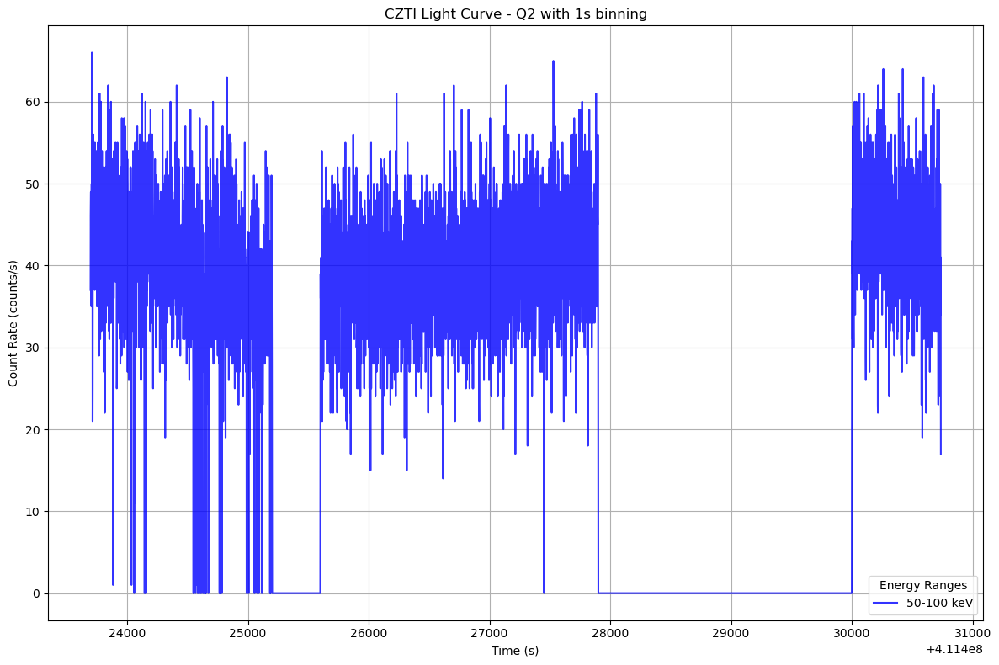

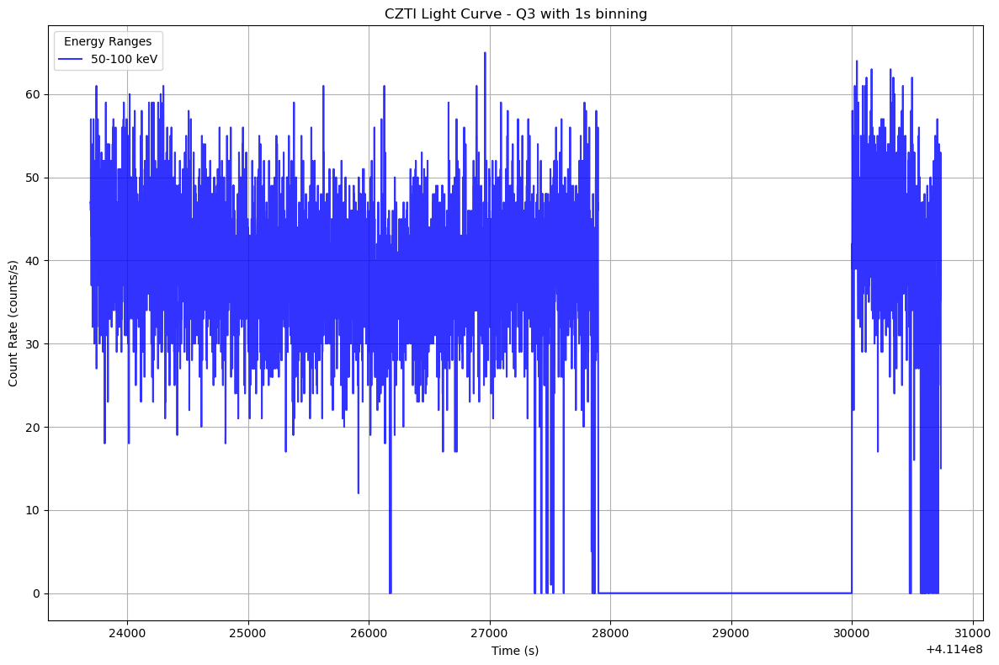

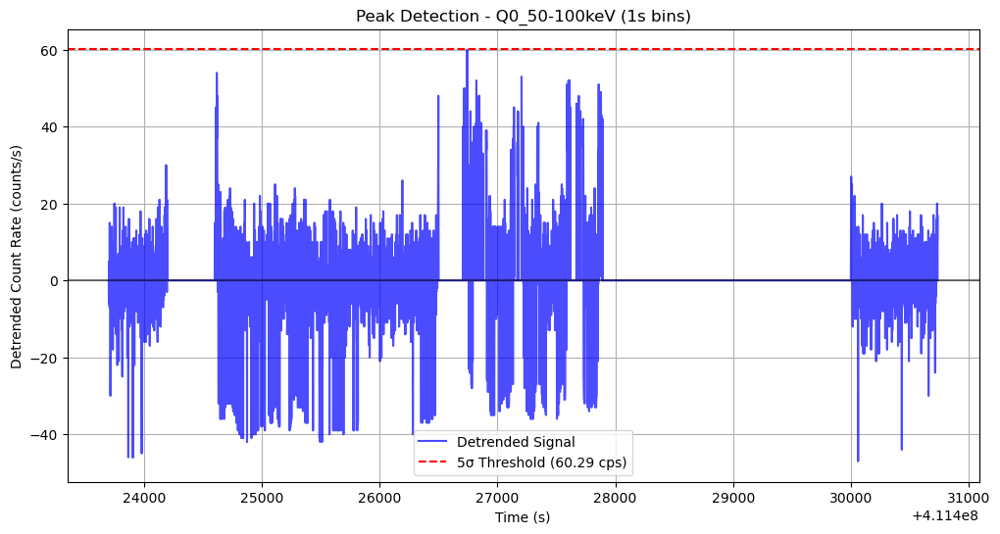

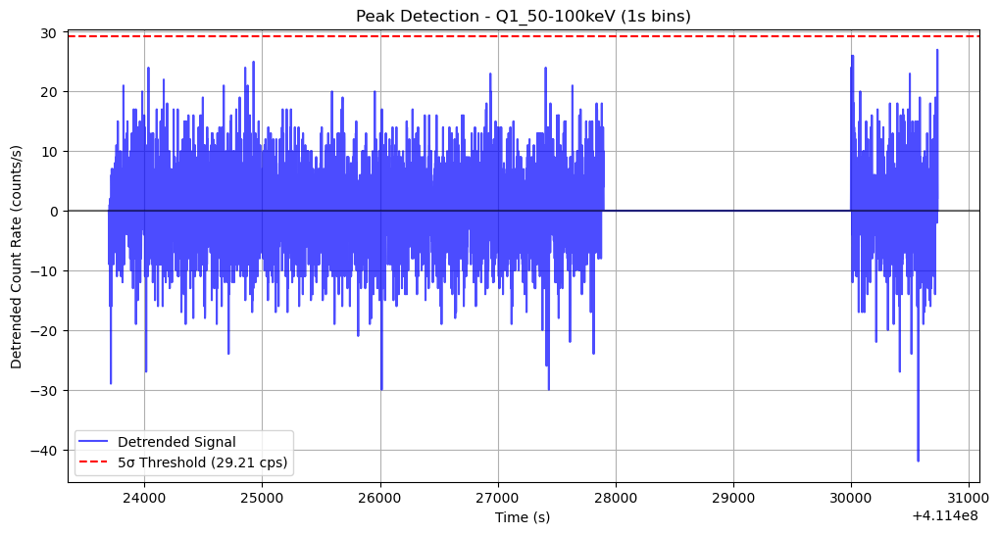

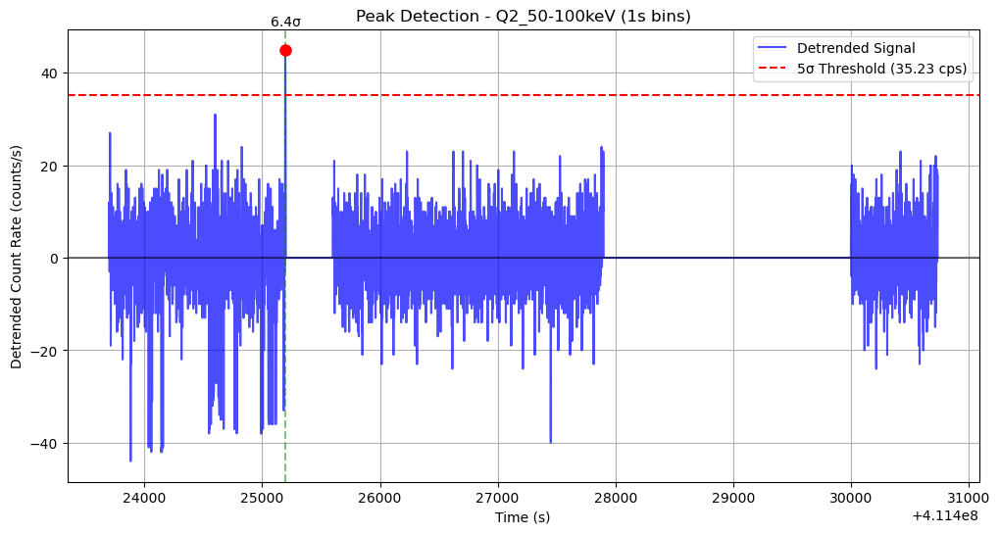

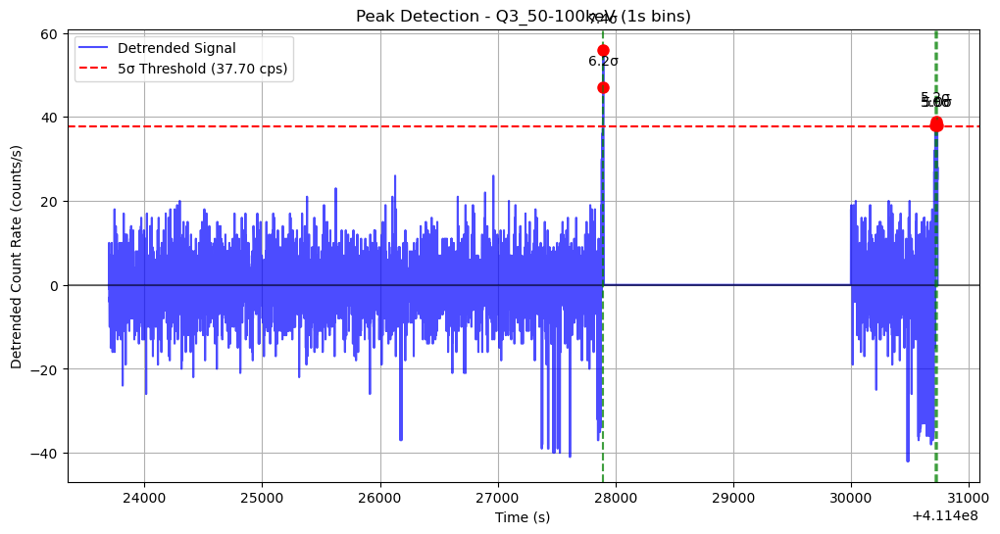

In [11]:
bad_ranges = {'Q0':[(4.114e8+24200,4.114e8+24600),(4.114e8+26500,4.114e8+26700)],
              'Q2':[(4.114e8+25200,4.114e8+25600)]}
r1 = lc_czt(file1,saa_ranges=saa_range1,energy_ranges=(50,100),bin_width=1,bad_ranges=bad_ranges)
f1 = median_filter(r1,window_size=101)
peak1 = detect_peaks(f1,sigma=5,min_distance=1)


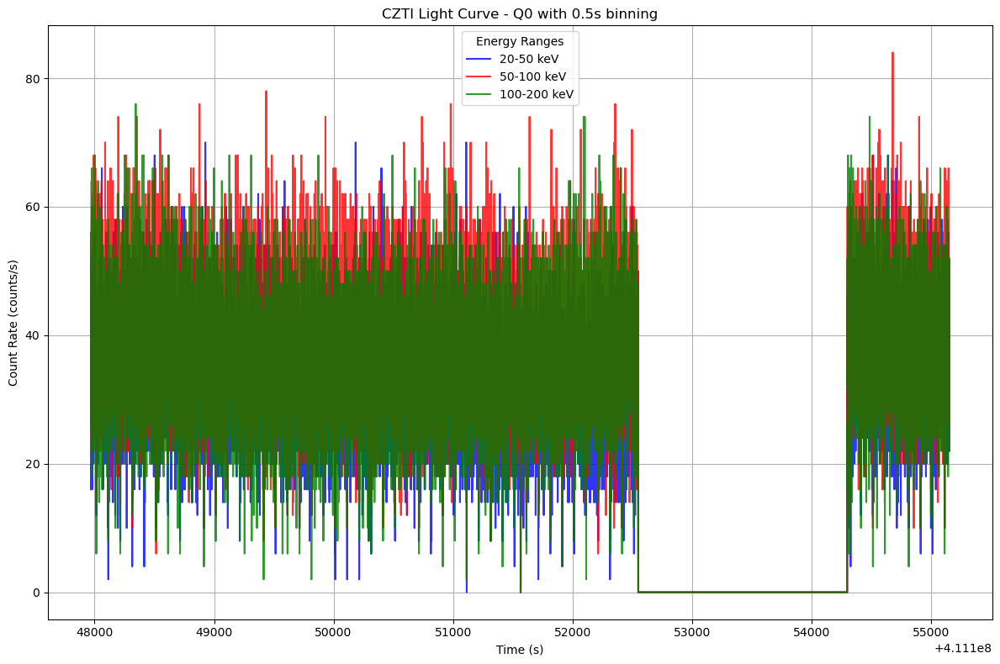

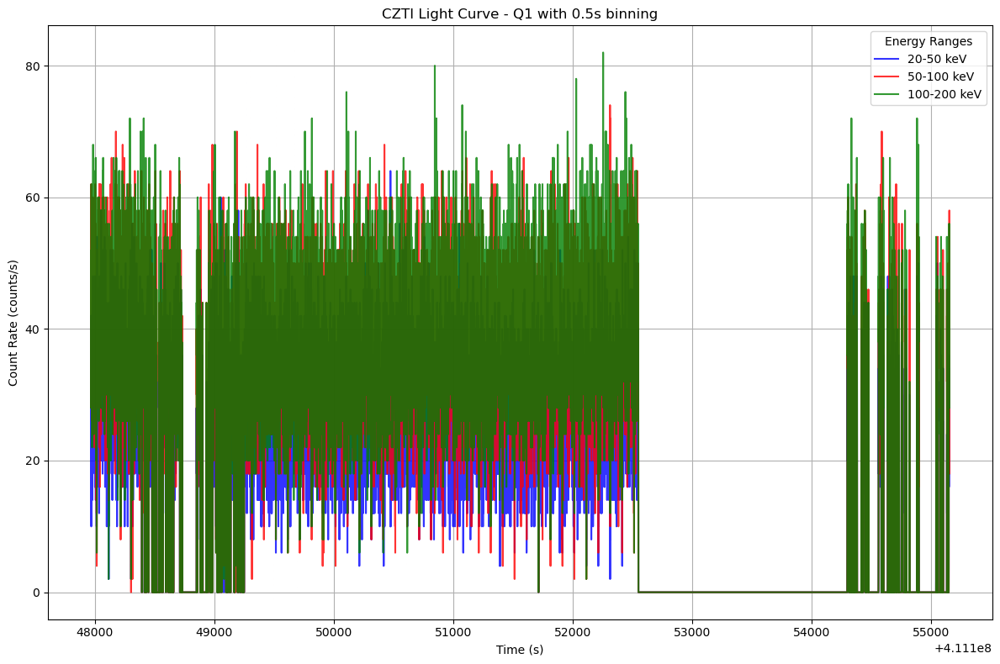

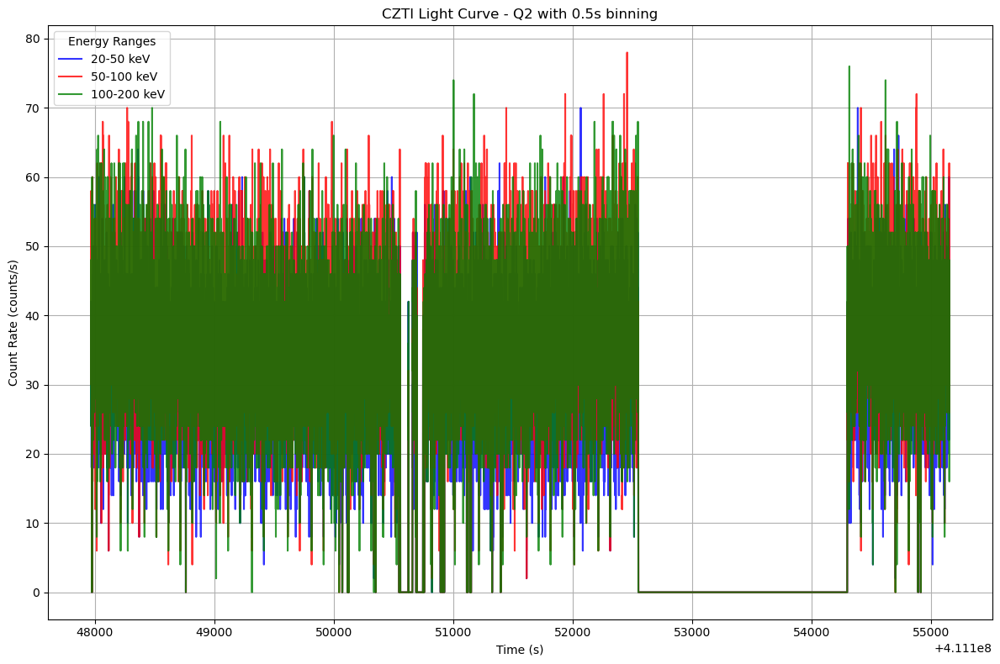

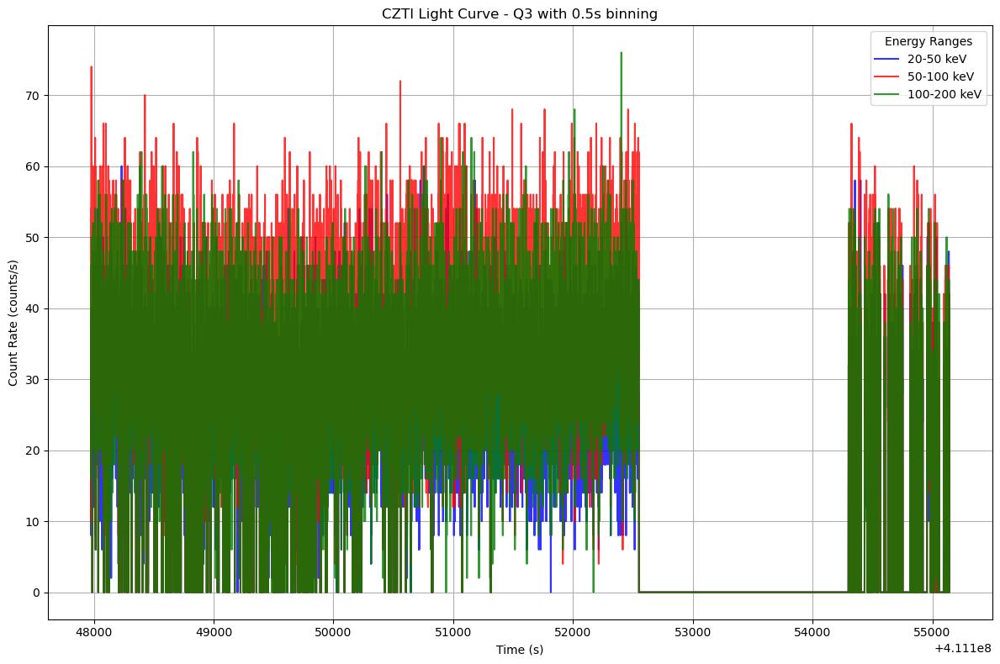

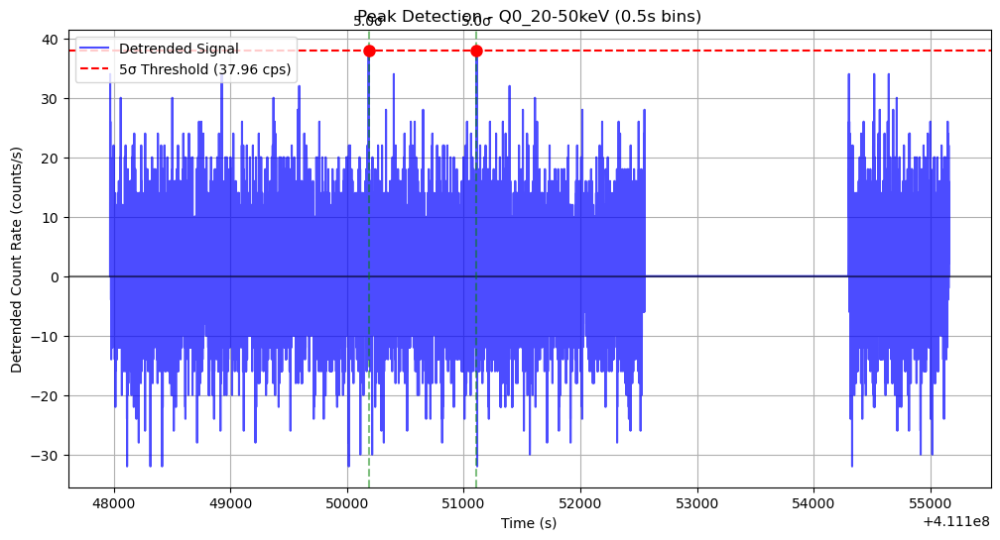

...

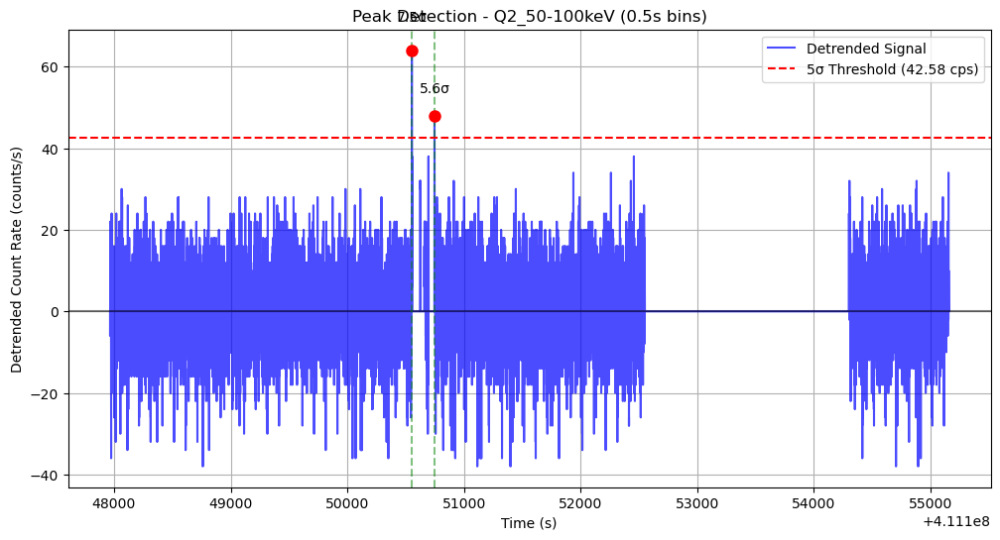

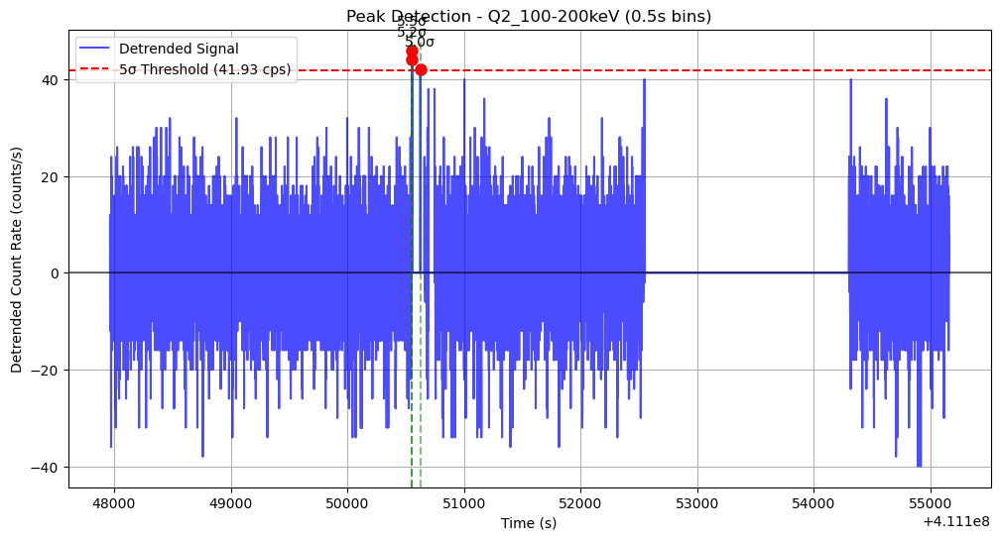

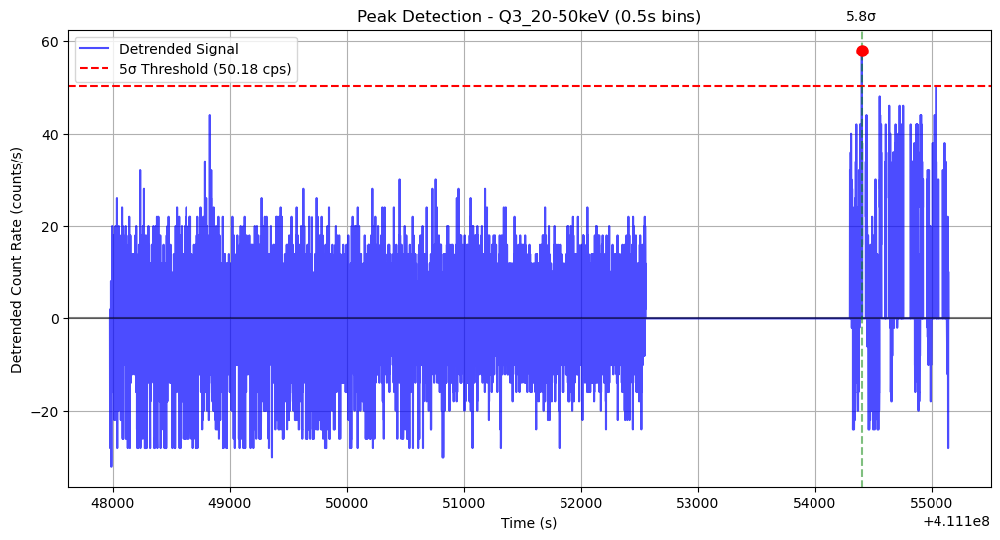

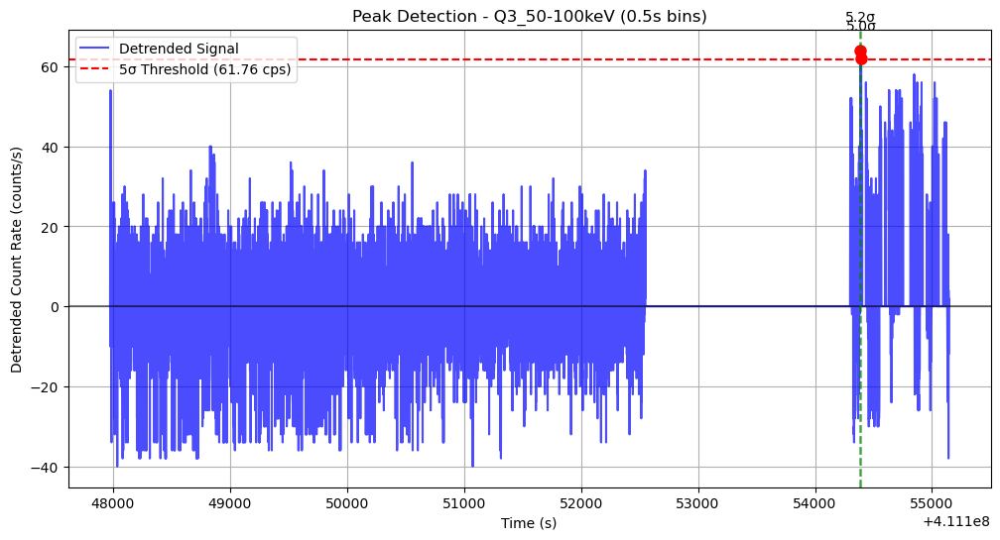

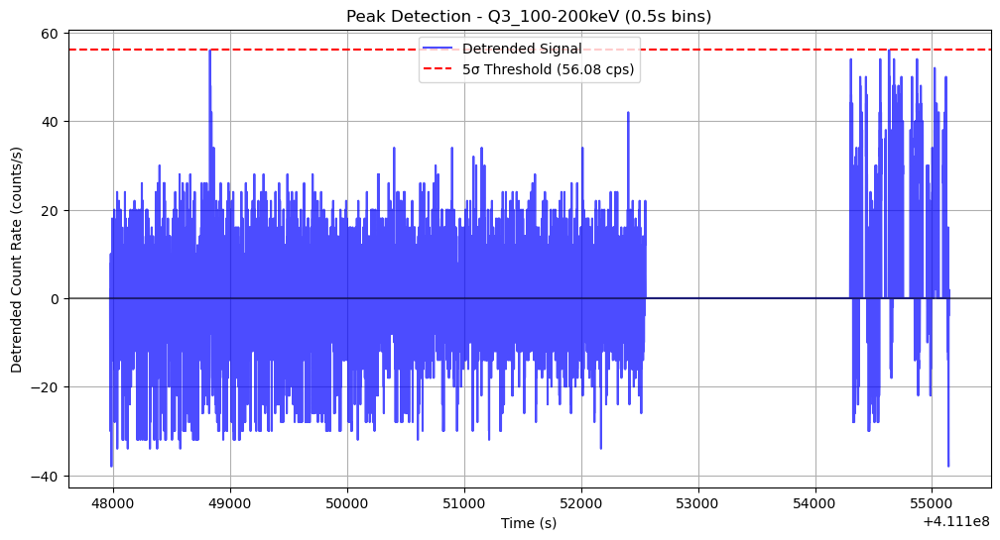

In [17]:
r5 = lc_czt(file5,saa_ranges=saa_range5,energy_ranges=energy_ranges,bin_width=0.5)
f5 = median_filter(r5,window_size=101)
peak5 = detect_peaks(f5,sigma=5,min_distance=1)


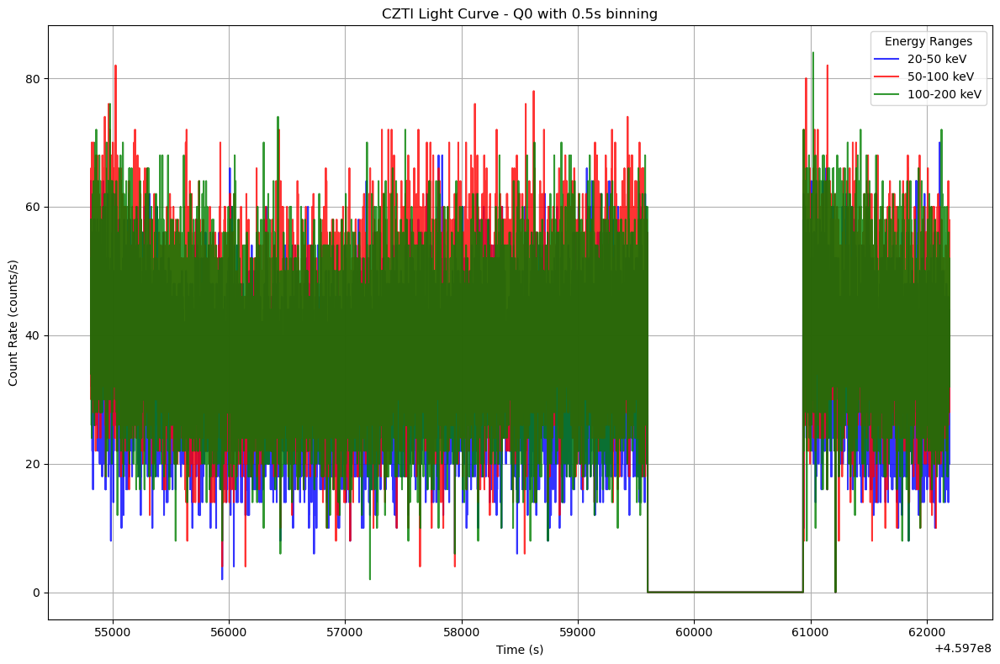

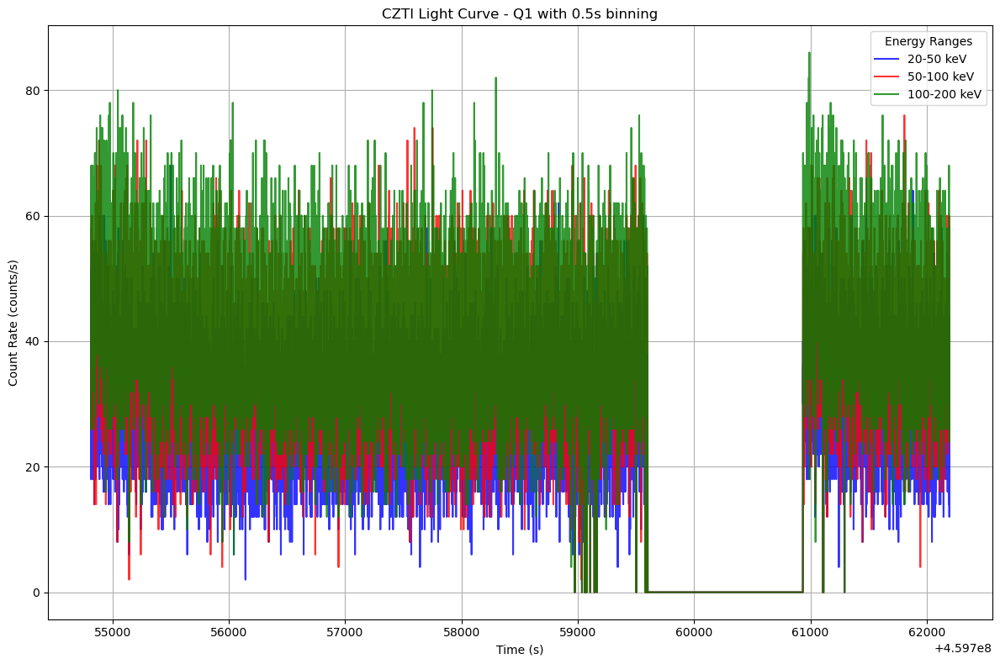

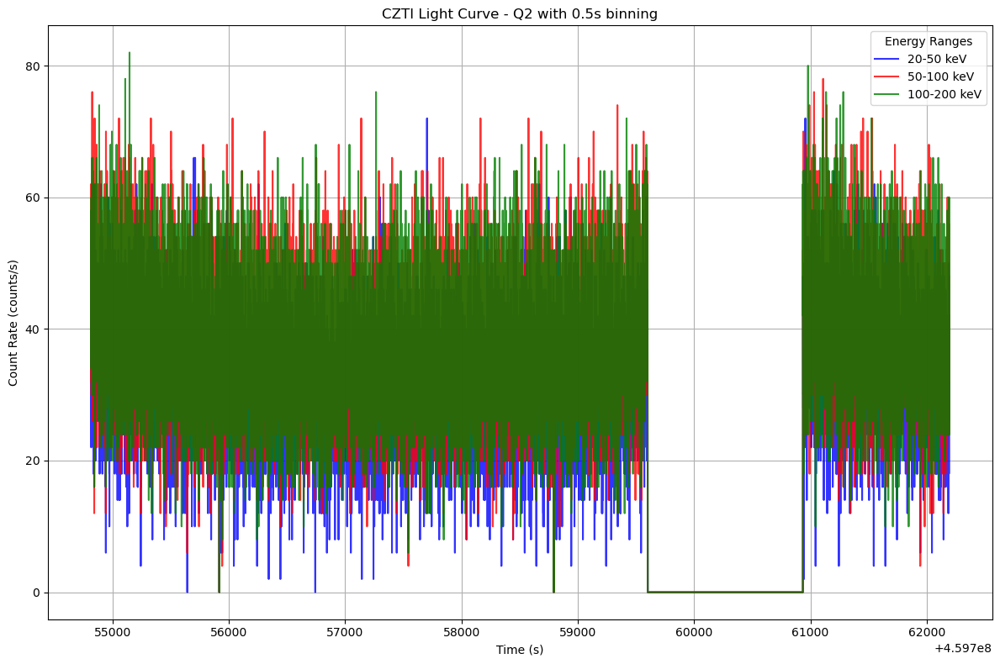

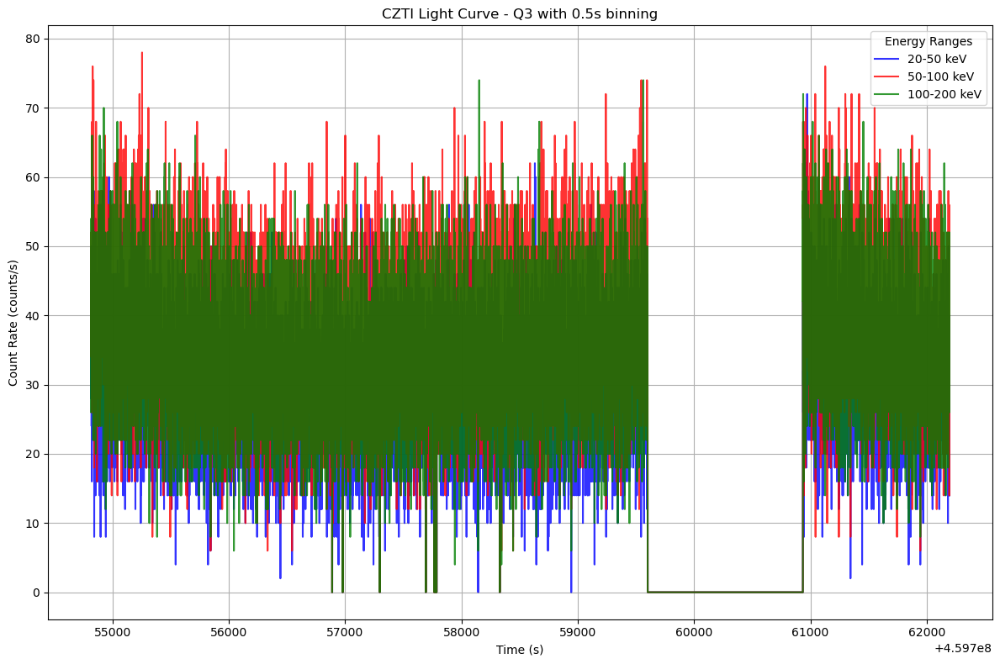

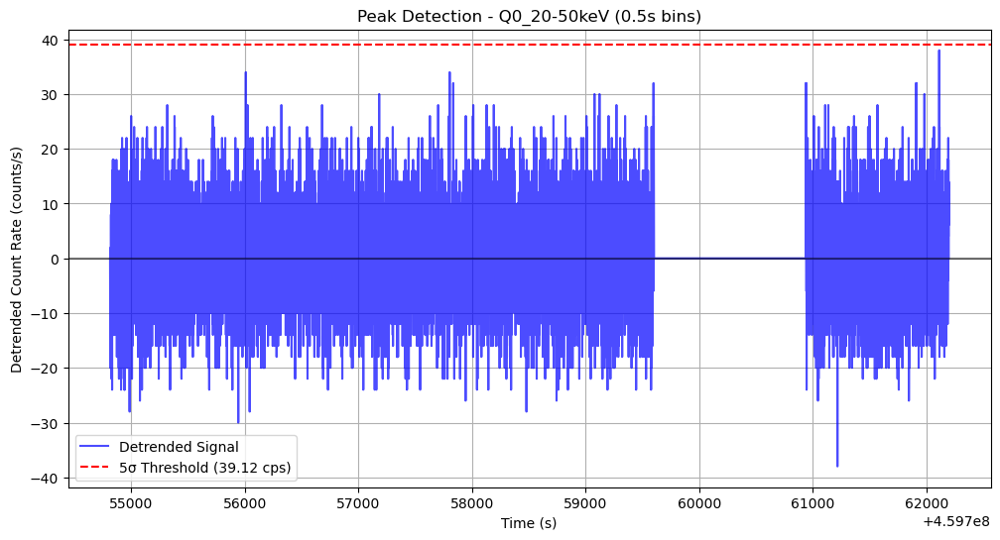

...

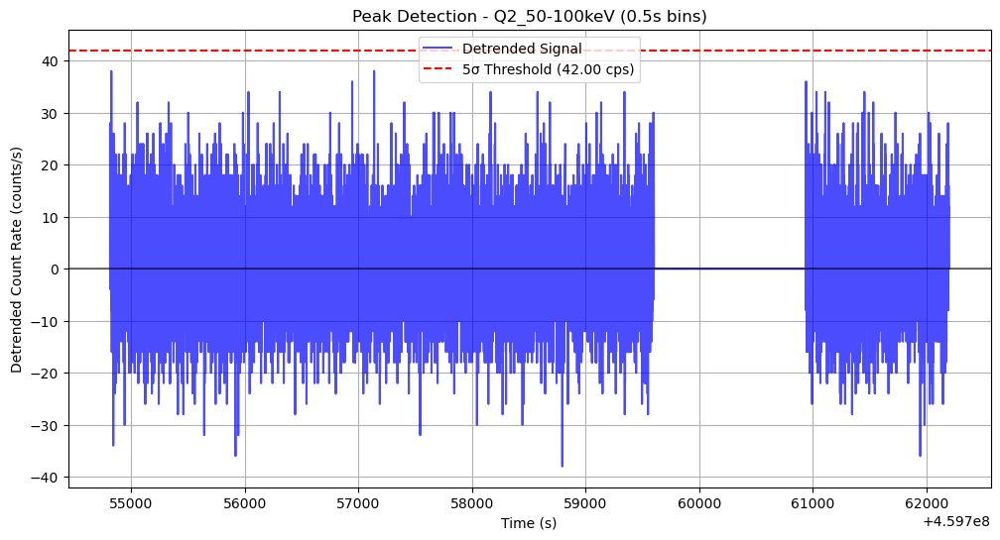

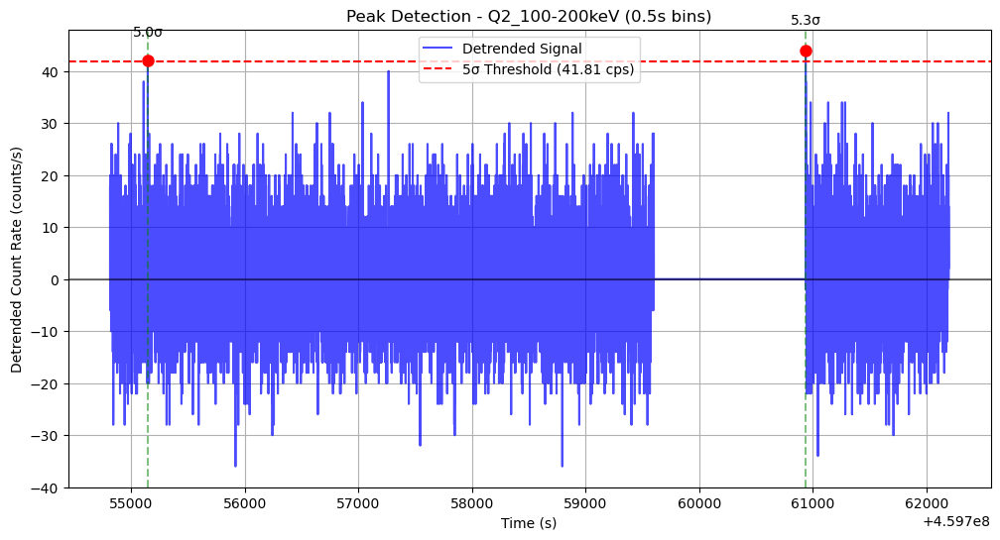

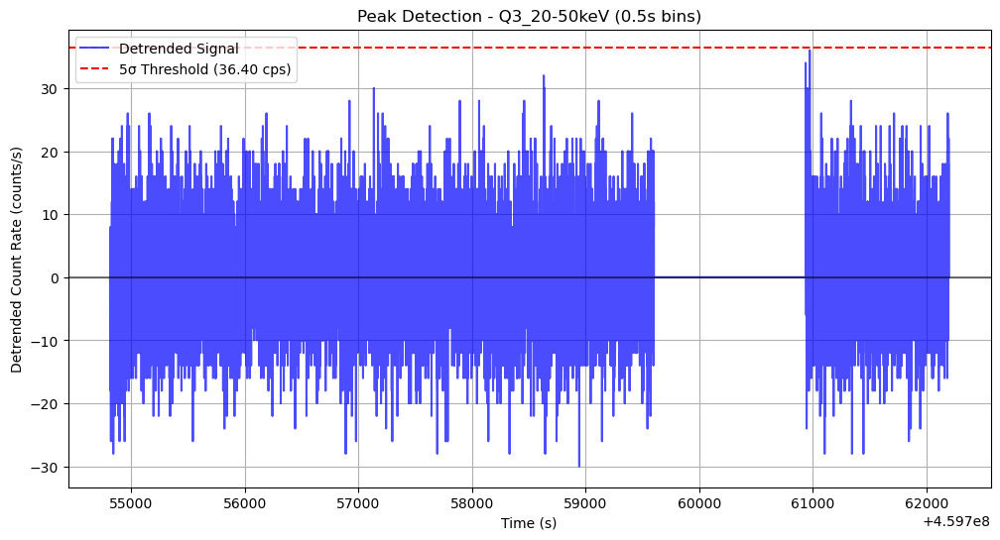

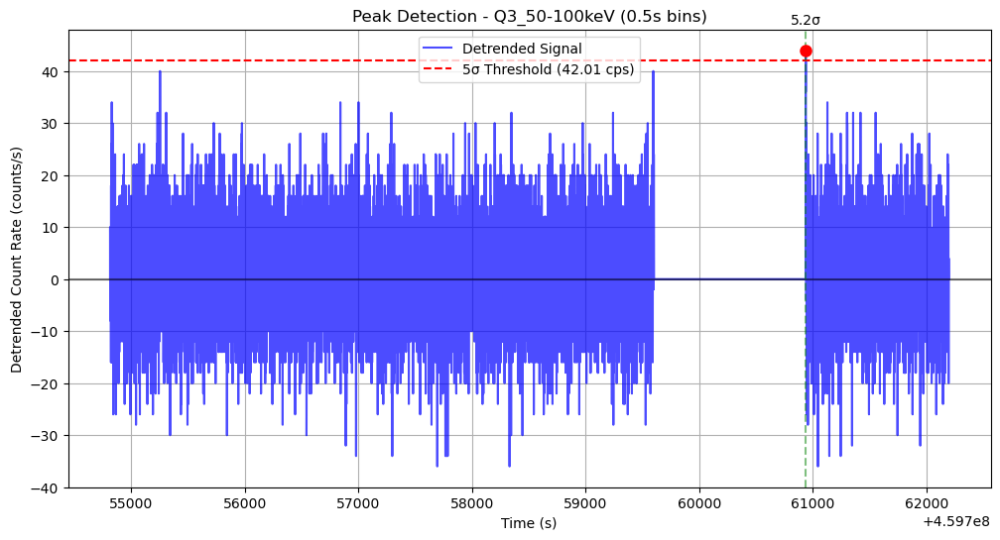

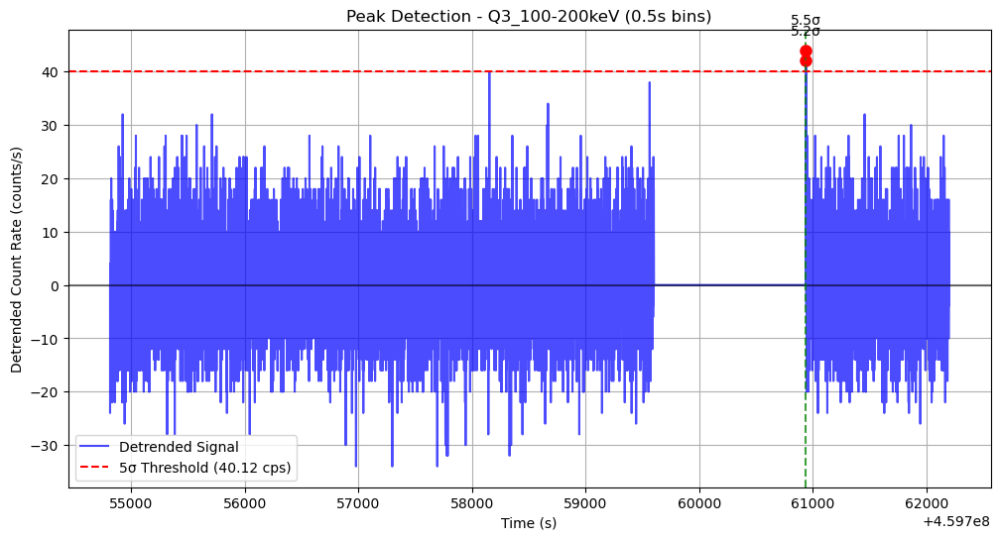

In [9]:
r3 = lc_czt(file3,saa_ranges=saa_range3,energy_ranges=energy_ranges,bin_width=0.5)
#r30= lc_czt(file3,saa_ranges=saa_range3,energy_ranges=energy_ranges,bin_width=3)
f3 = median_filter(r3,window_size=101)
#f30 = median_filter(r30,window_size=101)
peak3 = detect_peaks(f3,sigma=5,min_distance=1)
#peak30= detect_peaks(f30,sigma=5,min_distance=1)

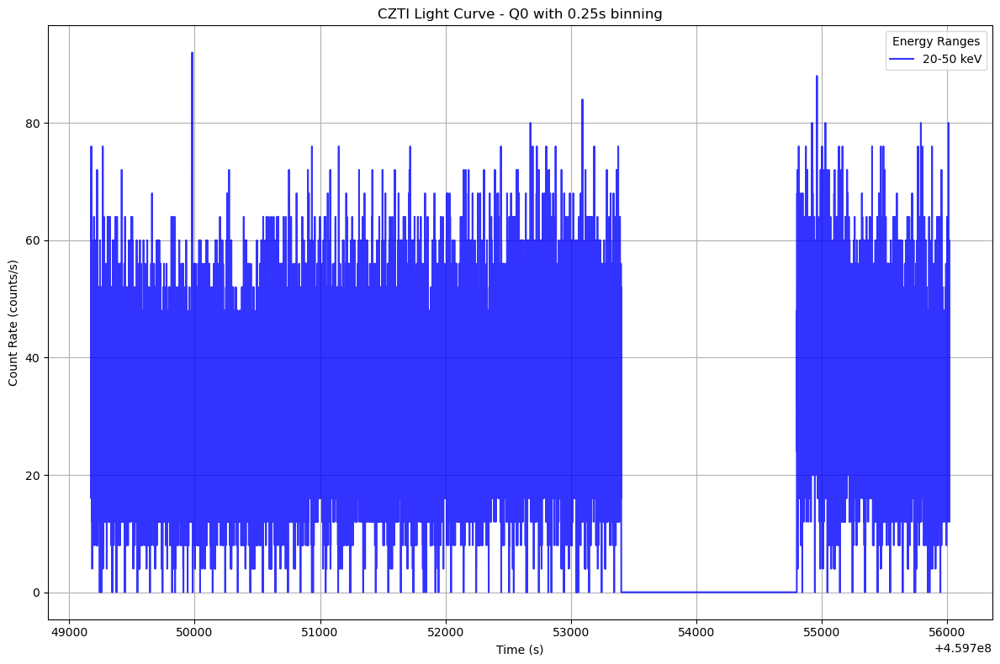

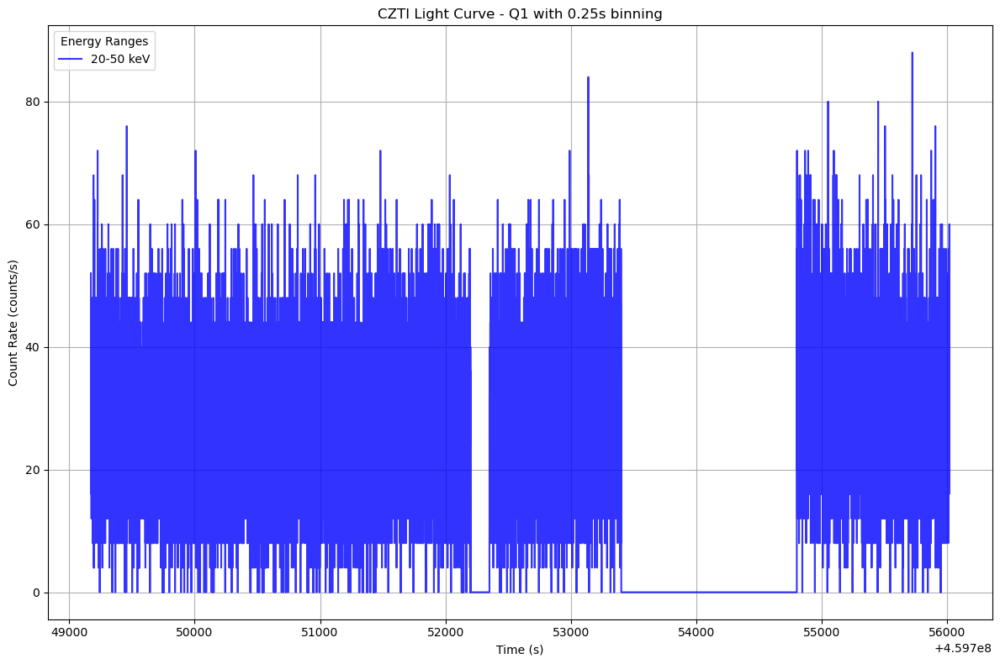

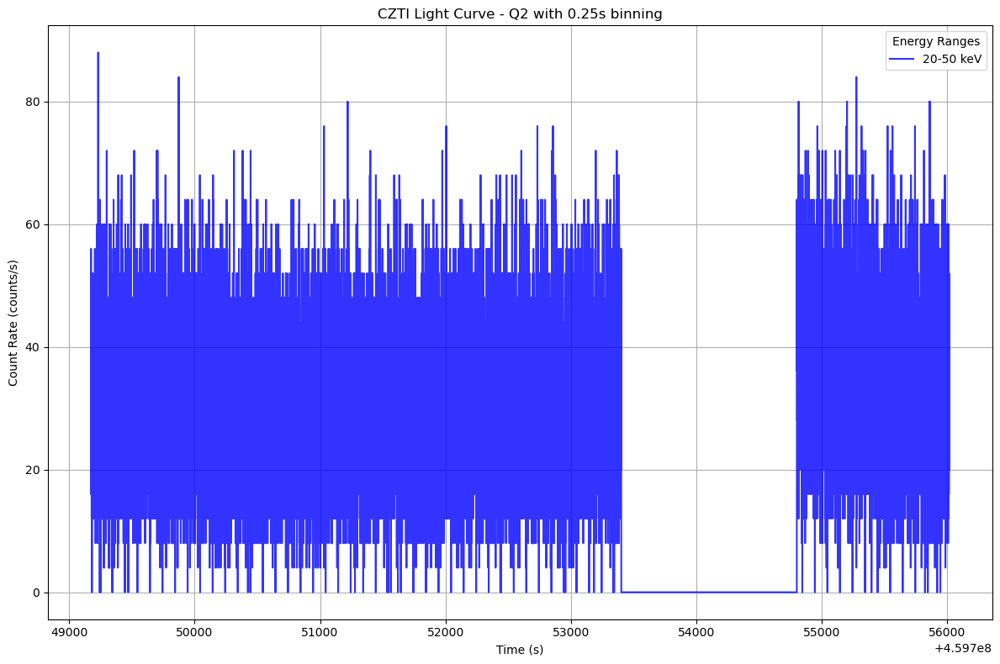

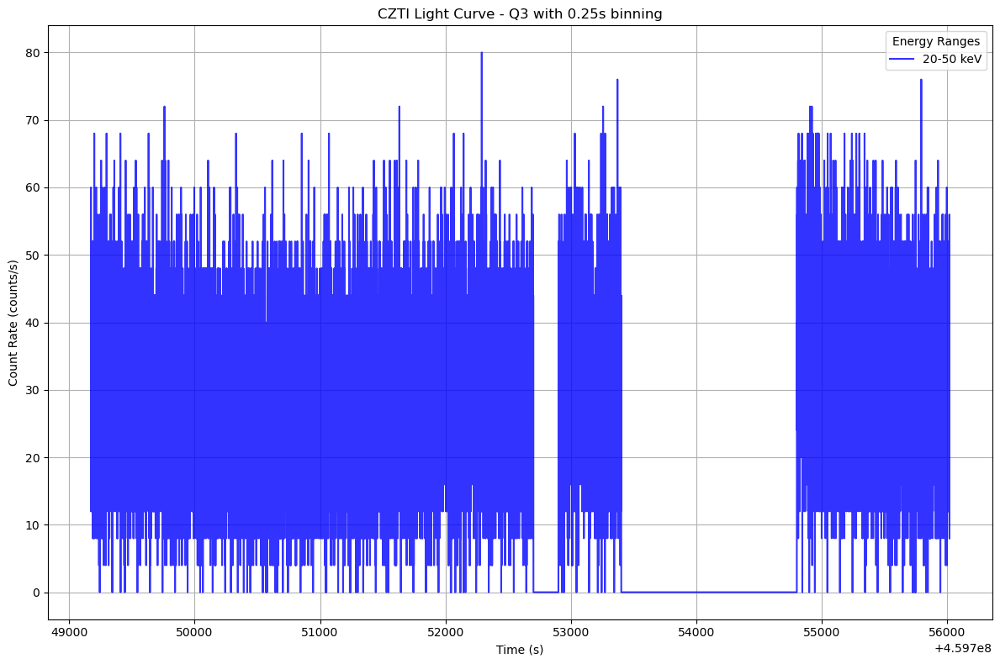

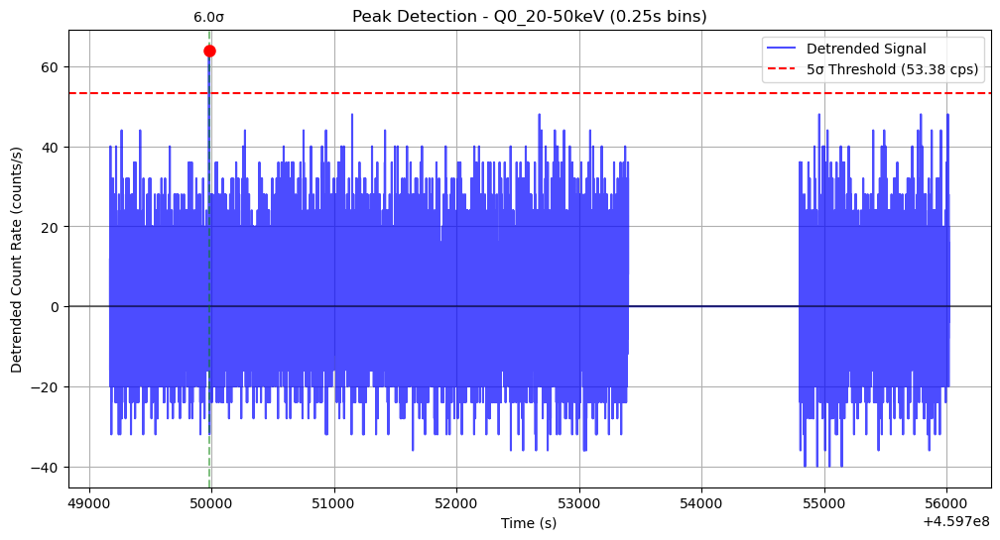

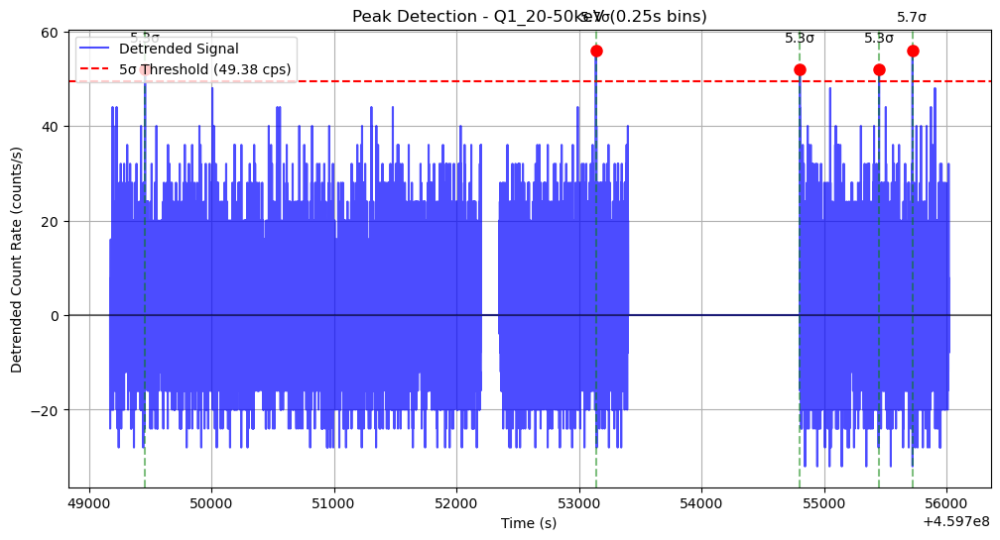

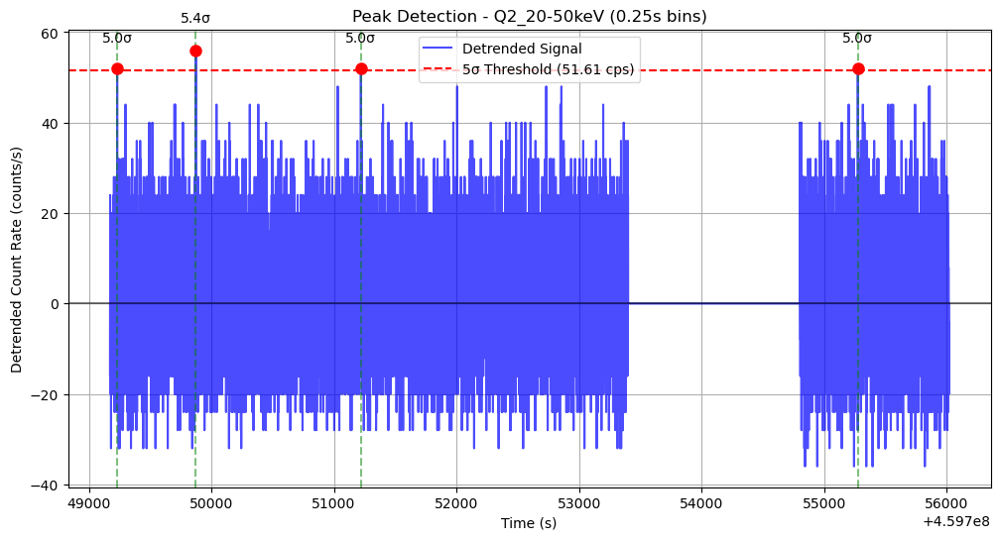

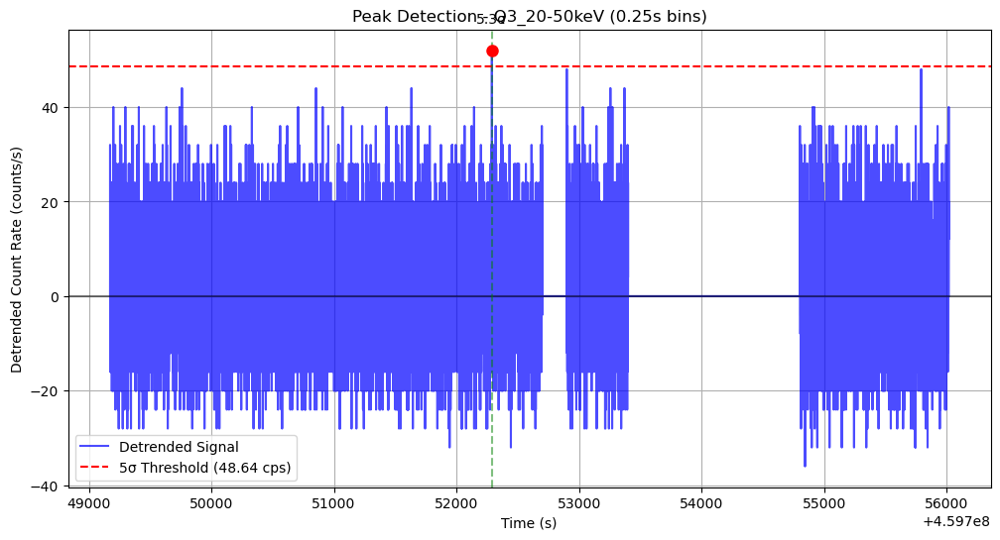

In [10]:
bad_ranges2 = {'Q1':[(4.597e8+52200,4.597e8+52350)],
               'Q3':[(4.597e8+52700,4.597e8+52900)]}
r2 = lc_czt(file2,saa_ranges=saa_range2,energy_ranges=(20,50),bin_width=0.25,bad_ranges=bad_ranges2)
f2 = median_filter(r2,window_size=101)
peak2 = detect_peaks(f2,sigma=5,min_distance=1)


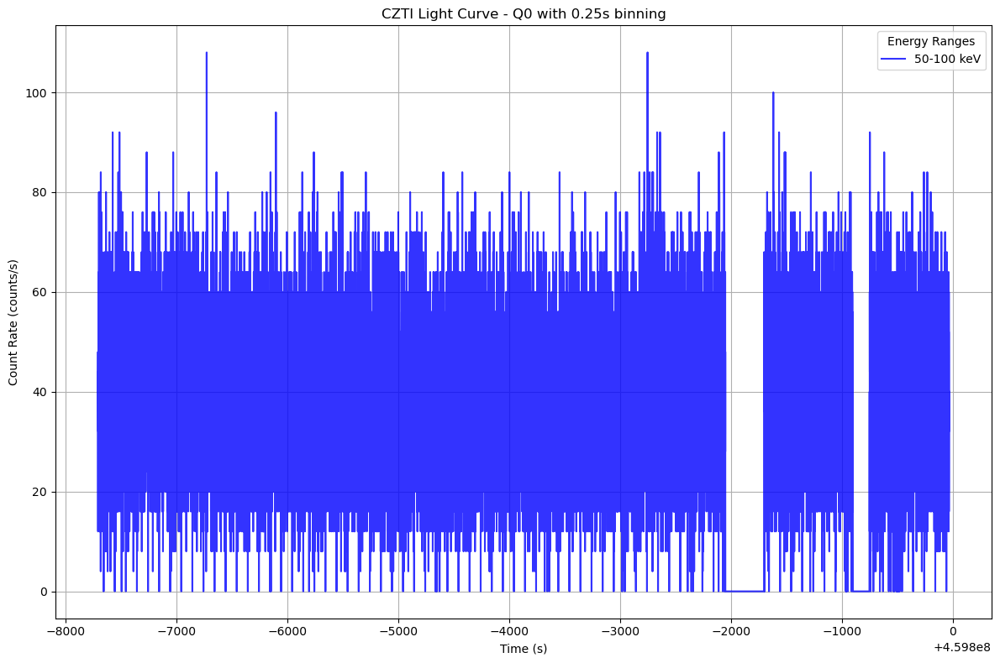

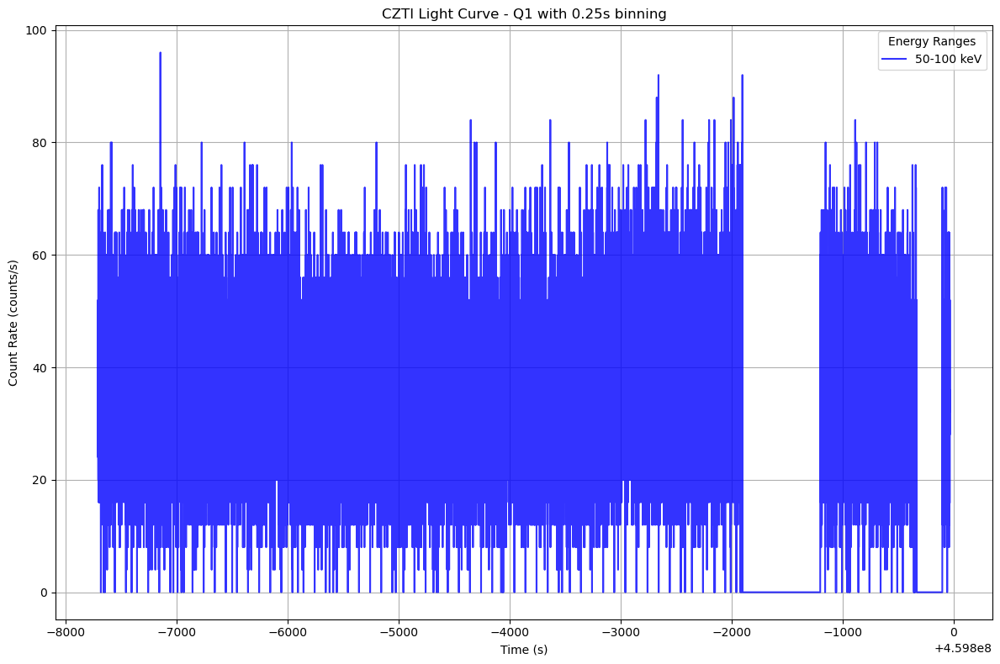

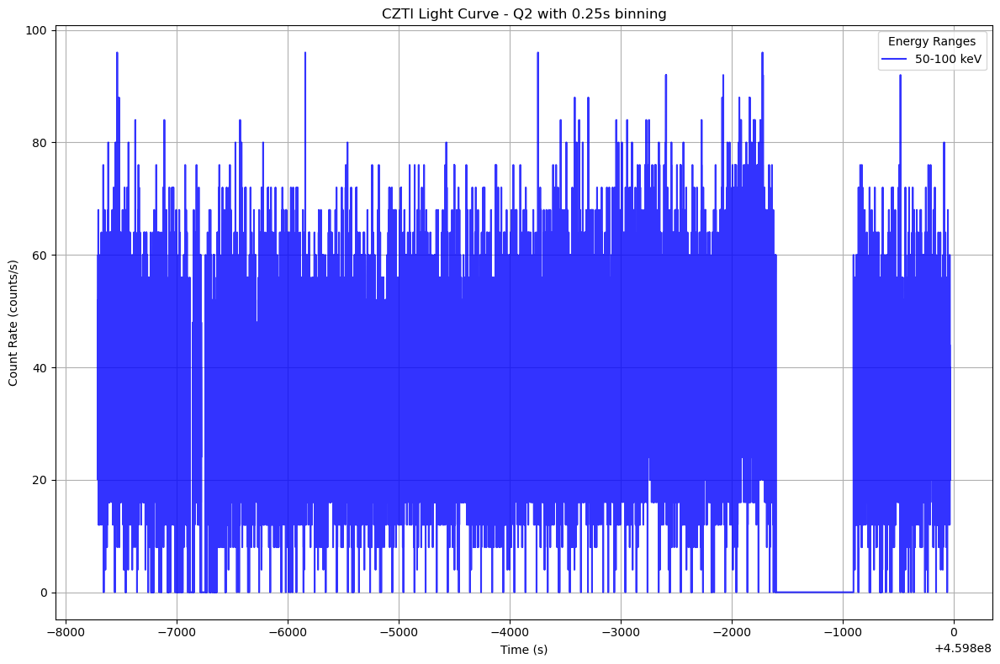

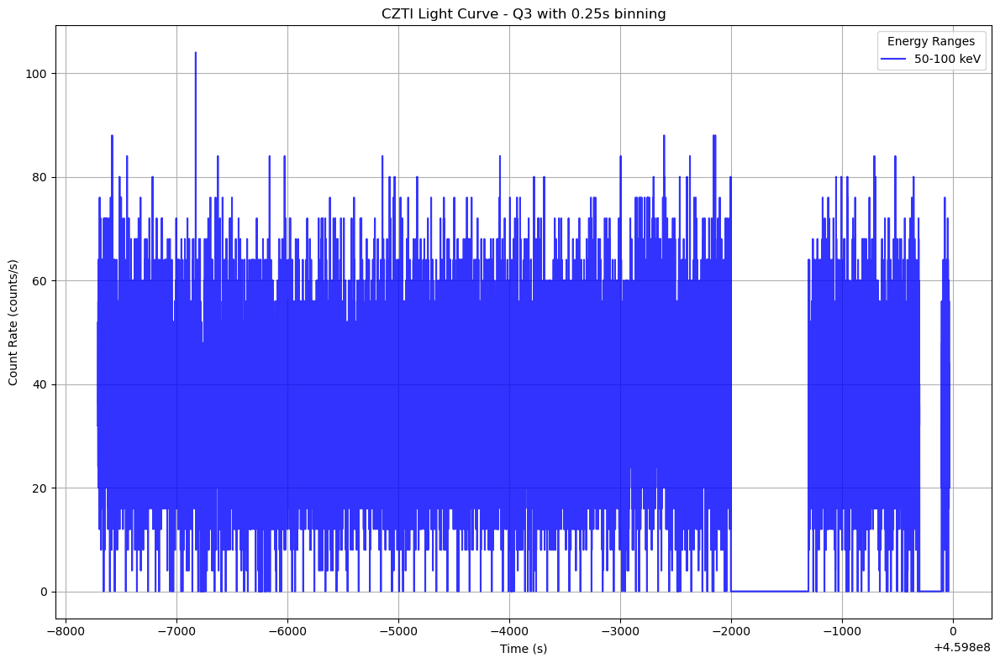

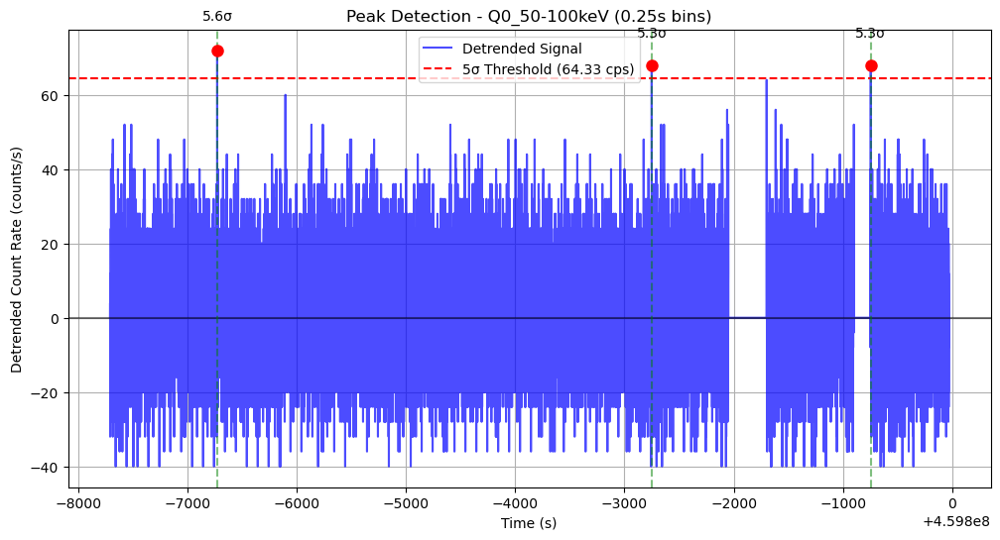

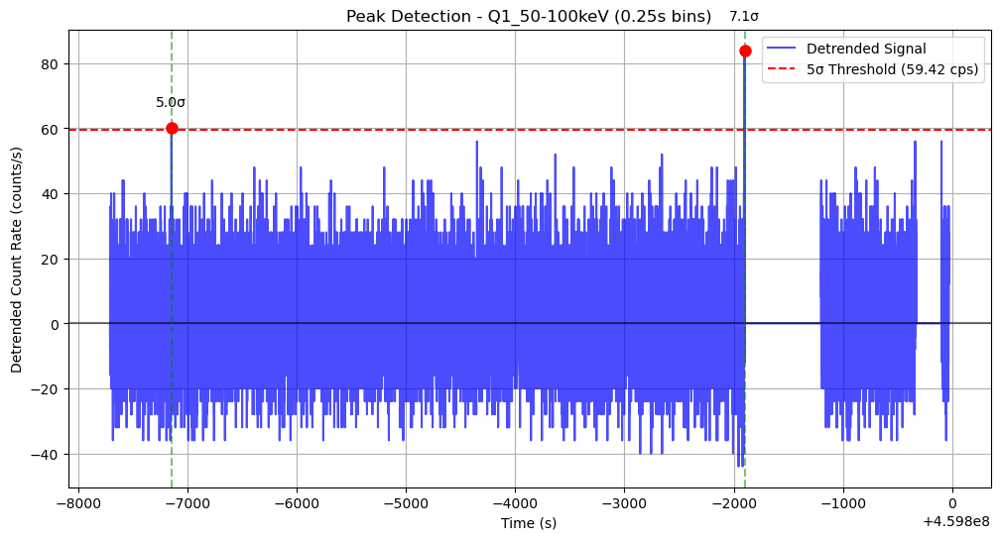

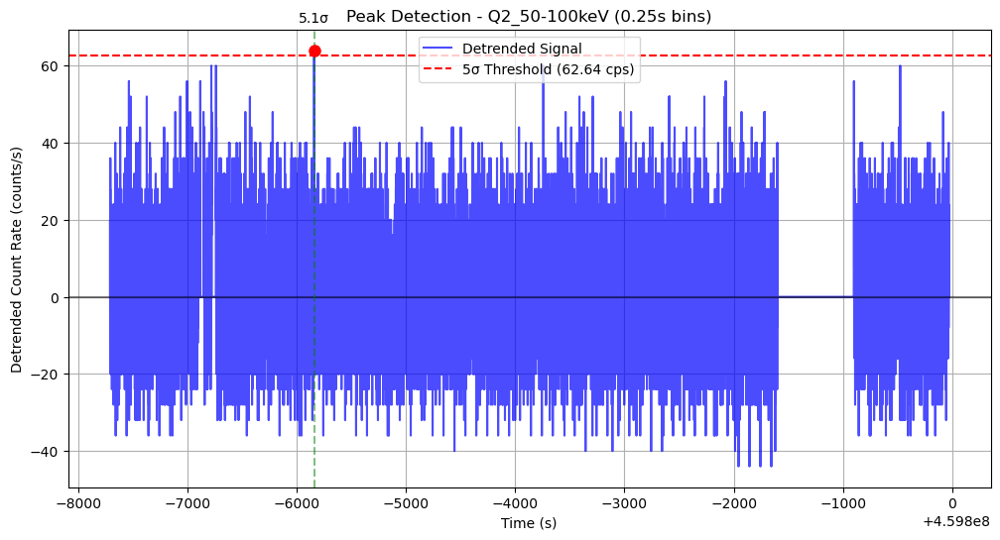

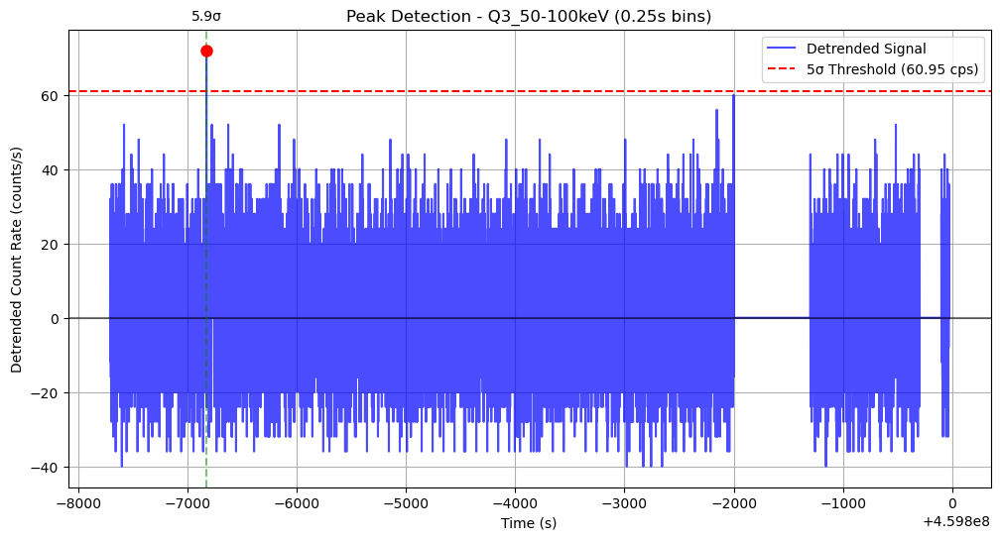

In [11]:
bad_ranges1={'Q0':[(4.598e8-2050,4.598e8-1700),(4.598e8-900,4.598e8-750)],
             'Q1':[(4.598e8-1900,4.598e8-1200),(4.598e8-300,4.598e8-100)],
             'Q2':[(4.598e8-1600,4.598e8-900)],
             'Q3':[(4.598e8-2000,4.598e8-1300),(4.598e8-250,4.598e8-100)]}
r41 = lc_czt(file4,None,energy_ranges=(50,100),bin_width=0.25,bad_ranges=bad_ranges1)
    
f41= median_filter(r41,window_size=101)
peak40 = detect_peaks(f41, sigma=5, min_distance=1)

In [12]:
print(peak40)

{'Q0_50-100keV': {'peaks': [{'time': 459793272.67692804, 'value': 72.0, 'significance': 5.5958968185348175}, {'time': 459797248.92692804, 'value': 68.0, 'significance': 5.28501366194955}, {'time': 459799253.92692804, 'value': 68.0, 'significance': 5.28501366194955}], 'threshold': 64.33285167224713, 'sigma': 5, 'noise_std': 12.866570334449426, 'bin_width': 0.25}, 'Q1_50-100keV': {'peaks': [{'time': 459792854.3913881, 'value': 60.0, 'significance': 5.048980732876898}, {'time': 459798098.8913881, 'value': 84.0, 'significance': 7.068573026027657}], 'threshold': 59.41793321700015, 'sigma': 5, 'noise_std': 11.88358664340003, 'bin_width': 0.25}, 'Q2_50-100keV': {'peaks': [{'time': 459794159.8882681, 'value': 64.0, 'significance': 5.108262488018706}], 'threshold': 62.643609397628154, 'sigma': 5, 'noise_std': 12.52872187952563, 'bin_width': 0.25}, 'Q3_50-100keV': {'peaks': [{'time': 459793174.17000806, 'value': 72.0, 'significance': 5.906227036347111}], 'threshold': 60.95261793773731, 'sigma': 

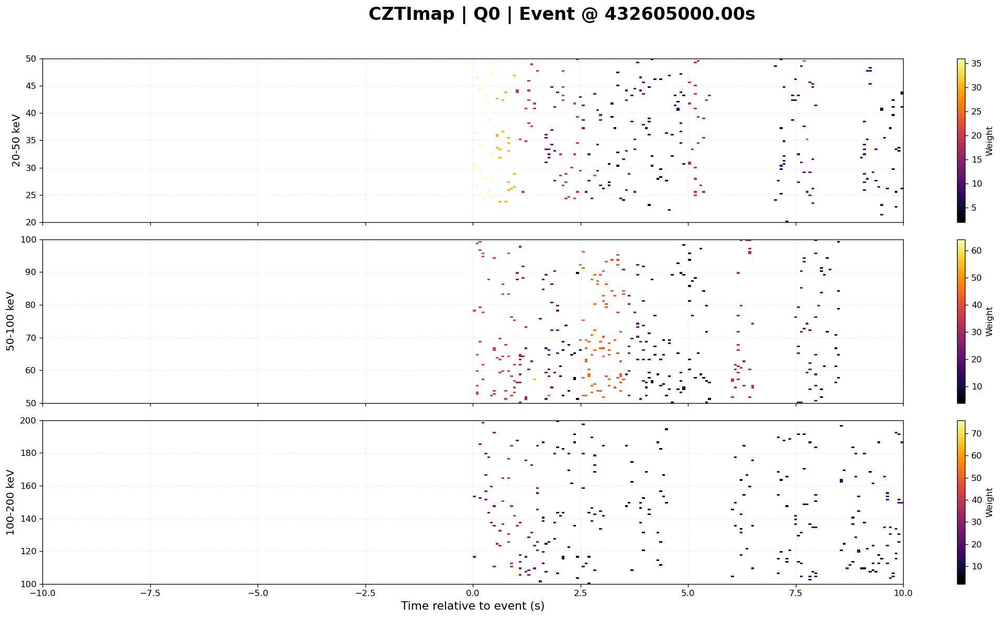

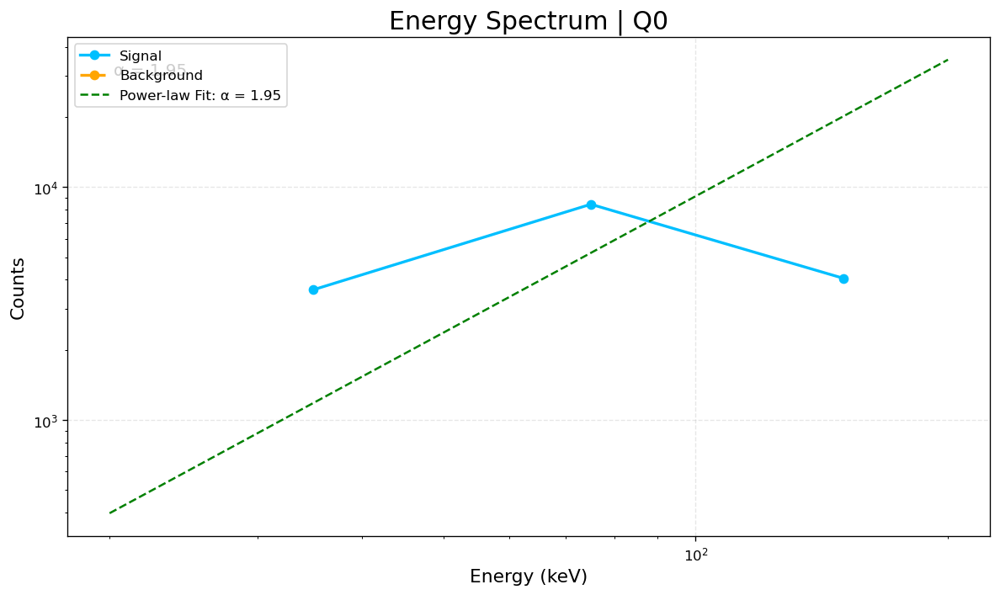

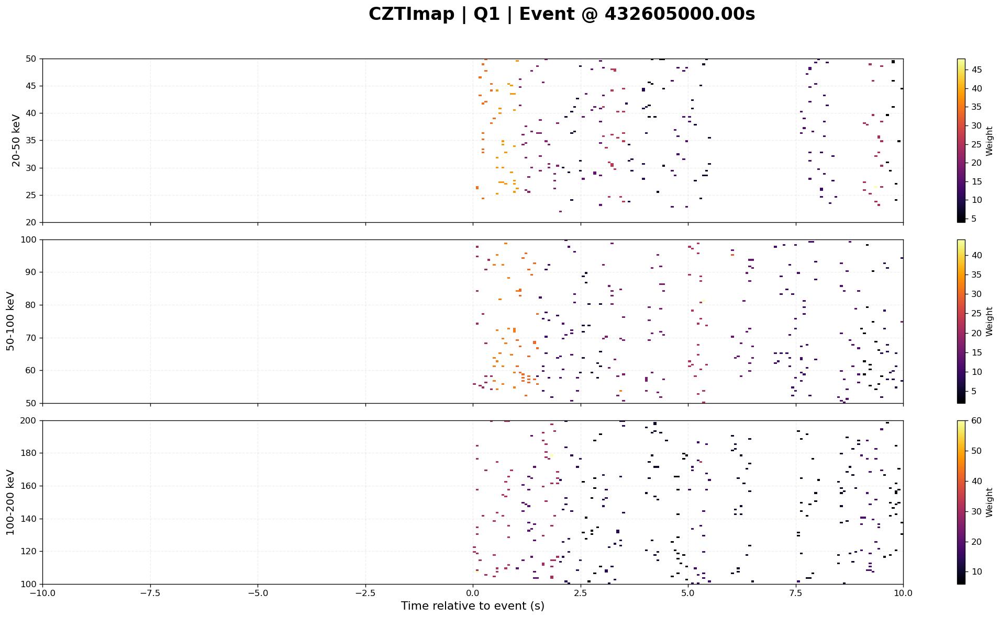

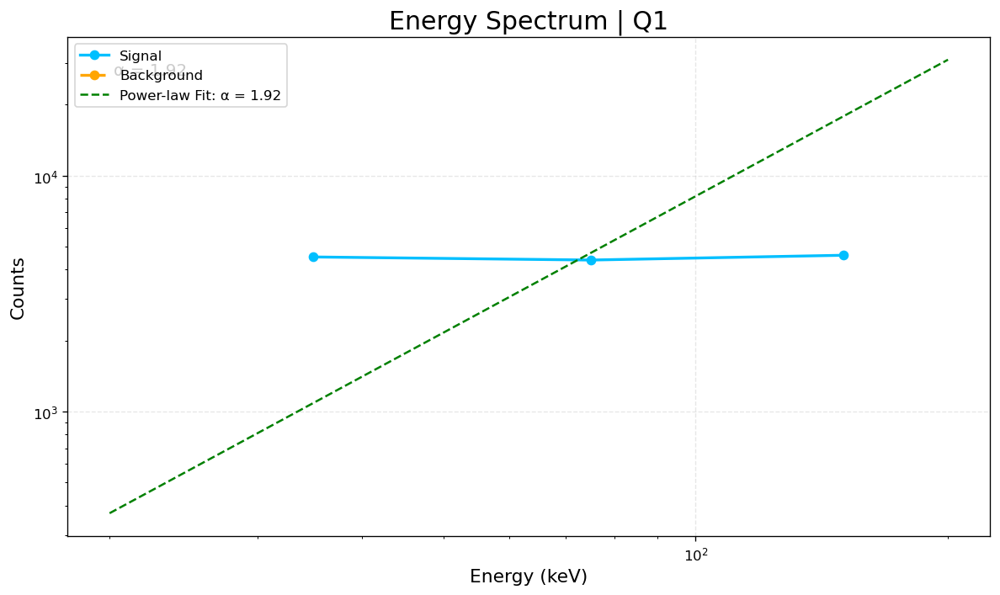

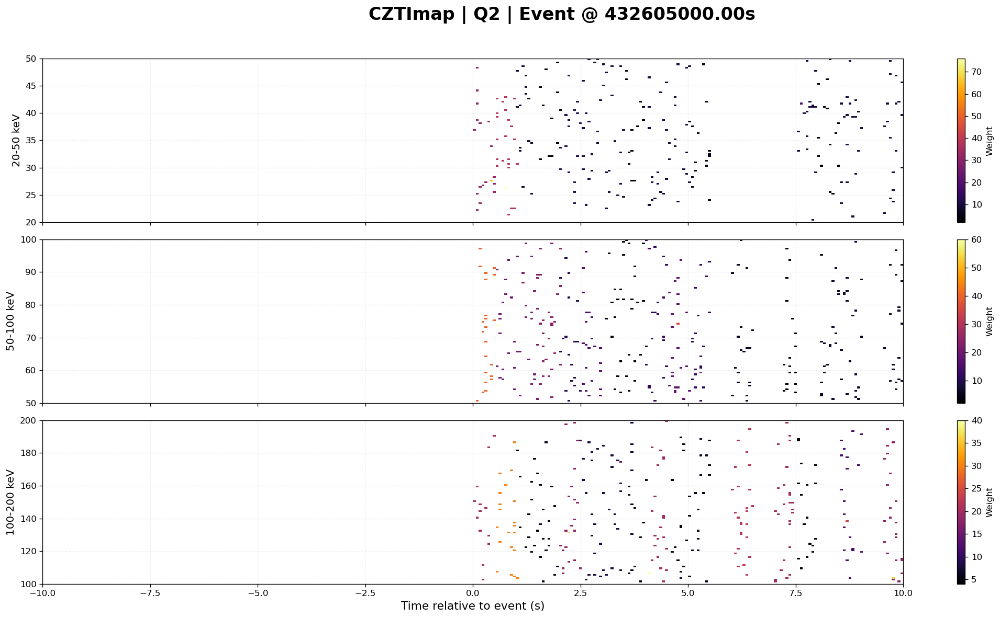

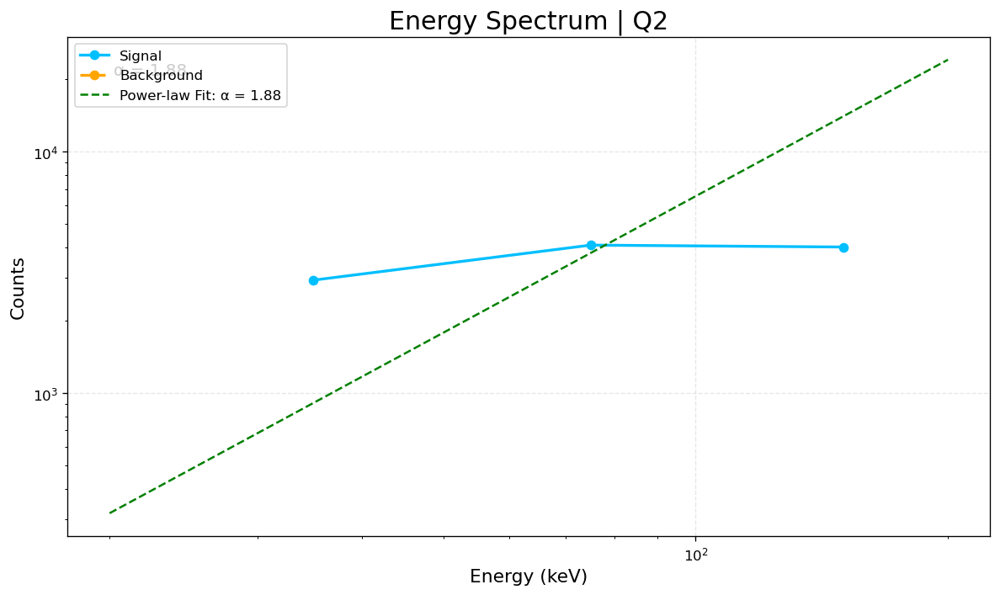

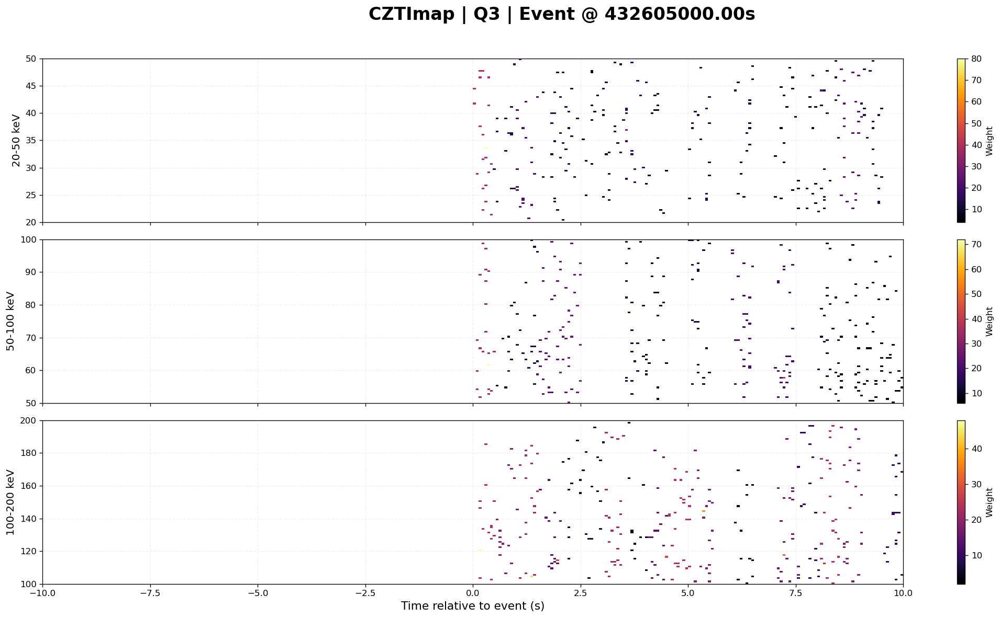

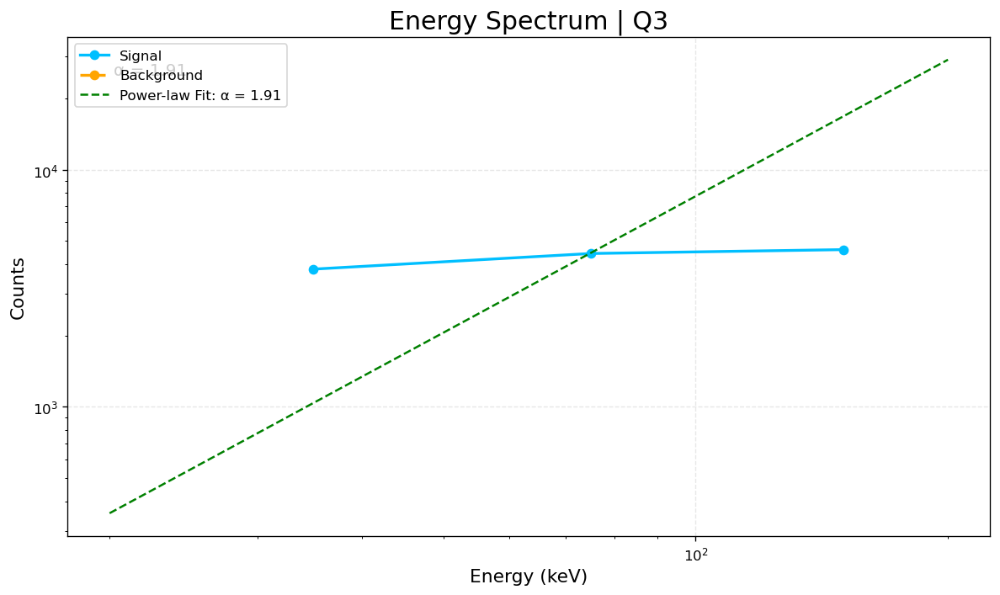

In [14]:
av=czt_detrended_spectrogram(fv, event_time= 432605000.0  ,energy_ranges=energy_ranges)

In [15]:
print(peakv)

{'Q0_20-50keV': {'peaks': [{'time': 432592681.2628394, 'value': 36.0, 'significance': 5.124552326465208}, {'time': 432592881.2628394, 'value': 36.0, 'significance': 5.124552326465208}, {'time': 432594212.7628394, 'value': 40.0, 'significance': 5.693947029405787}, {'time': 432605000.2628394, 'value': 36.0, 'significance': 5.124552326465208}, {'time': 432605145.7628394, 'value': 36.0, 'significance': 5.124552326465208}, {'time': 432608126.7628394, 'value': 36.0, 'significance': 5.124552326465208}], 'threshold': 35.12501942275212, 'sigma': 5, 'noise_std': 7.025003884550424, 'bin_width': 0.5}, 'Q0_50-100keV': {'peaks': [{'time': 432593053.26457936, 'value': 40.0, 'significance': 5.0279695432157645}, {'time': 432598964.26457936, 'value': 40.0, 'significance': 5.0279695432157645}, {'time': 432605002.76457936, 'value': 44.0, 'significance': 5.530766497537341}, {'time': 432607486.76457936, 'value': 40.0, 'significance': 5.0279695432157645}, {'time': 432607858.76457936, 'value': 40.0, 'signific